In [1]:
import numpy as np
import pandas as pd

def benchmark(x1, x2):
    return (    (1.3356 * (1.5 * (1 - x1))) 
                + (np.exp((2 * x1) - 1) * np.sin((3 * np.pi) * ((x1 - 0.6) ** 2)))
                + (np.exp(3 * (x2 - 0.5)) * np.sin((4 * np.pi) * ((x2 - 0.9) ** 2)))
            )

def getData(grid):
    x1 = np.linspace(0, 1, grid)
    x2 = np.linspace(0, 1, grid)
    x1, x2 = np.meshgrid(x1, x2)
    f_x1_x2 = benchmark(x1, x2)
    data = {'x1': x1.flatten(), 'x2': x2.flatten(), 'f(x1,x2)': f_x1_x2.flatten()}
    df = pd.DataFrame(data)
    return df


df_1000 = getData(32)
df_test = pd.read_excel("../Kriging-data.xlsx", sheet_name="Test")
df_training = pd.read_excel("../Kriging-data.xlsx", sheet_name="Training")
df_tudo = pd.read_excel("../Kriging-data.xlsx", sheet_name="Tudo")


exponential = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Exponential")
spherical = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Spherical")
gaussian = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Gaussian")

/tmp/ipykernel_10031/2999369577.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


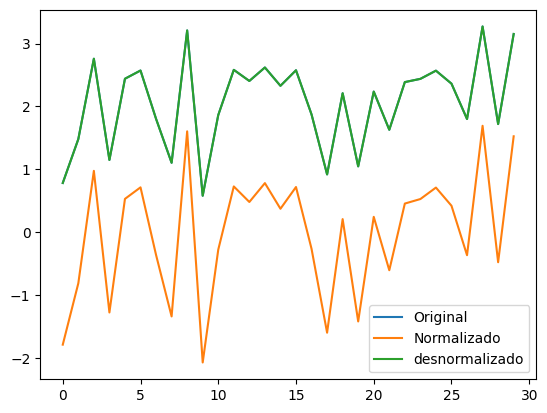

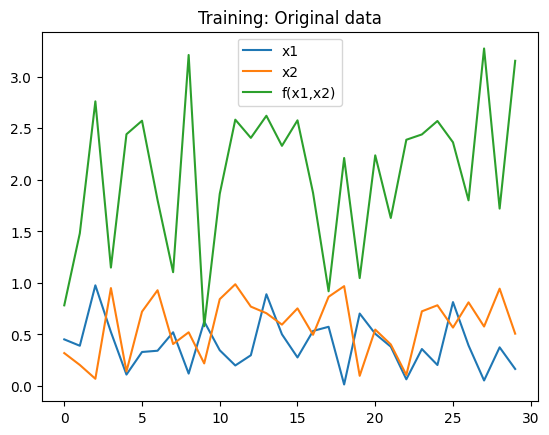

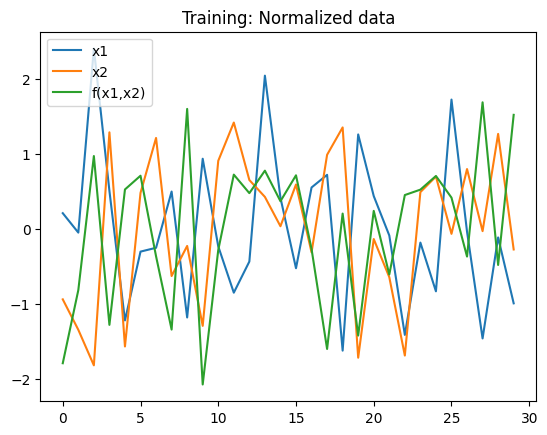

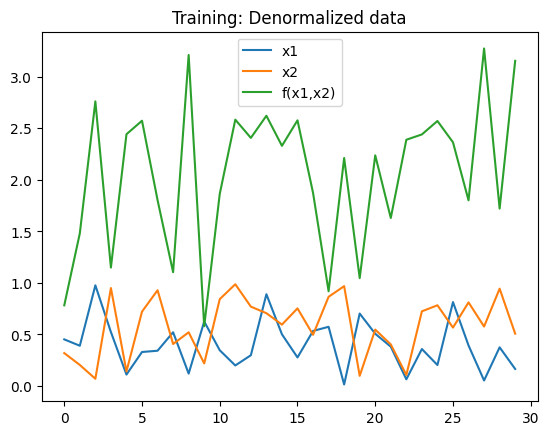

In [2]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def show_norm(df, label="data", plot=False):
    df_norm = pd.DataFrame(scaler.transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["f(x1,x2)"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()

scaler.fit(df_training)
test_out_scaler(df_training)

df_training_norm = show_norm(df_training, "Training", True)
df_1000_norm = show_norm(df_1000)
df_exponential_norm = show_norm(pd.concat([df_training, exponential]))
df_spherical_norm = show_norm(pd.concat([df_training, exponential]))
df_gaussian_norm = show_norm(pd.concat([df_training, exponential]))


In [3]:
import plotly.graph_objs as go
import plotly.offline as py
import plotly.figure_factory as ff
from scipy.spatial import Delaunay

def plot_model_comparison(df_original, df_model, model_name):
    # Dados originais
    x_orig, y_orig, z_orig = df_original['x1'], df_original['x2'], df_original['f(x1,x2)']
    x_sup, y_sup, z_sup = df_1000['x1'], df_1000['x2'], df_1000['f(x1,x2)']

    # Dados do modelo específico
    x_model, y_model, z_model = df_model['x1'], df_model['x2'], df_model['f(x1,x2)']

    # Criação da superfície
    points = np.column_stack((x_sup, y_sup))
    tri = Delaunay(points)
    fig_surface = ff.create_trisurf(x=x_sup, y=y_sup, z=z_sup,
                                    simplices=tri.simplices, 
                                    title=f'Surface Fit - Original vs {model_name} Model')

    # Pontos das amostras originais
    original_data = go.Scatter3d(x=x_orig, y=y_orig, z=z_orig, mode='markers',
                                 marker=dict(size=5, color='red', opacity=0.8),
                                 name='Original Samples')

    # Pontos do modelo específico
    model_data = go.Scatter3d(x=x_model, y=y_model, z=z_model, mode='markers',
                              marker=dict(size=5, color='blue', opacity=0.8),
                              name=f'{model_name} Model')

    # Criando a figura
    fig = go.Figure(data=[fig_surface.data[0], original_data, model_data])
    fig.update_layout(
        scene=dict(
            xaxis_title='x1',
            yaxis_title='x2',
            zaxis_title='f(x1, x2)',
            aspectmode='cube'  
        )
    )

    # Plotando o gráfico
    py.iplot(fig)

plot_model_comparison(df_tudo, spherical, 'Spherical')
plot_model_comparison(df_tudo, gaussian, 'Gaussian')
plot_model_comparison(df_tudo, exponential, 'Exponential')

In [4]:
import os

os.chdir("./content")

lm_dir = "tf-levenberg-marquardt"
if not os.path.exists(lm_dir):
  !git clone https://github.com/fabiodimarco/$lm_dir

os.chdir(lm_dir)

In [5]:
def split_df(df):
    _input = np.vstack([df['x1'], df['x2']]).T
    _output = np.array(df['f(x1,x2)'])
    return (_input, _output)

In [6]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError())

        self.lm_model = lm.ModelWrapper(
            tf.keras.models.clone_model(self.model))

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.MeanSquaredError())
        return(self.lm_model)

2024-07-20 17:38:20.568241: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-20 17:38:20.599602: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-20 17:38:20.599632: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-20 17:38:20.600758: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-20 17:38:20.606392: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-20 17:38:20.606996: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [7]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [8]:
import pickle
from itertools import product

class Tester:
  def __init__(self, _df, _df_1000,  run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input, self.output = split_df(_df)
    self.input_1000, self.output_1000 = split_df(_df_1000)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

  def SaveModelWeights(self, model, fileName):
    path = f"../models/{fileName}.keras"
    open(path,'w').close()
    model.save_weights(path)

  def SaveDataset(self, trainer, fileName):
    path = f"../dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] <= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input, self.output, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'../results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

# Treinando apenas com dados originais


In [9]:
tester = Tester(_df=df_training_norm,
                _df_1000=df_1000_norm,
                run_times=25, dataset_run_times=10)
tester.Loop(sort_by='mse_sup',
            boundarie = 0.5,
            hidden_sizes = [[40, 39], [20, 4], [15, 14], [26,18], [33, 21], [21, 12], [30, 21], [15, 2], [24, 7], [30, 16]],
            regularizers=[0.2, 0.0, 0.2, 0.5],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++


Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_0] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_0_6,0.279677,0.238373,0.082270,0.164567,0.134573,0.368327,0.452135,0.286686,0.493464,0.378587,0.313446,0.606900,1.012075,0.628201,3519.997567,5984.703762
model_1_0_5,0.265263,0.226712,0.063805,0.149071,0.117948,0.375697,0.459057,0.292454,0.502617,0.385860,0.316656,0.612942,1.012316,0.634455,3519.957943,5984.664137
model_1_0_4,0.250552,0.214766,0.044918,0.133276,0.100977,0.383220,0.466149,0.298354,0.511946,0.393284,0.319901,0.619047,1.012563,0.640775,3519.918295,5984.624489
model_1_0_3,0.235538,0.202531,0.025600,0.117175,0.083651,0.390897,0.473412,0.304389,0.521457,0.400863,0.323179,0.625218,1.012815,0.647162,3519.878622,5984.584816
model_1_0_2,0.220213,0.189997,0.005840,0.100761,0.065961,0.398733,0.480853,0.310562,0.531152,0.408602,0.326493,0.631453,1.013072,0.653616,3519.838925,5984.545119
model_1_0_1,0.204568,0.177157,-0.014377,0.084023,0.047896,0.406733,0.488475,0.316877,0.541039,0.416504,0.329842,0.637756,1.013334,0.660140,3519.799197,5984.505392
model_1_0_0,0.188601,0.164002,-0.035044,0.066958,0.029457,0.414898,0.496284,0.323333,0.551119,0.424571,0.333226,0.644126,1.013601,0.666733,3519.759446,5984.465641


DataFrame salvo em ../results/metrics_1_0
+++++++++++ [1_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_24,0.536745,0.497983,0.501661,0.674057,0.608098,0.236879,0.298019,0.245291,0.206212,0.227922,0.252487,0.486702,1.007766,0.503784,3520.880413,5985.586607
model_1_1_23,0.529184,0.490502,0.491216,0.678861,0.605509,0.240745,0.302460,0.250432,0.203173,0.229428,0.254597,0.490658,1.007892,0.507879,3520.848033,5985.554228
model_1_1_22,0.521470,0.482783,0.480532,0.683776,0.602863,0.244690,0.307042,0.255691,0.200063,0.230967,0.256722,0.494661,1.008022,0.512023,3520.815529,5985.521723
model_1_1_21,0.513588,0.474843,0.469650,0.688715,0.600134,0.248720,0.311756,0.261047,0.196938,0.232554,0.258862,0.498718,1.008154,0.516222,3520.782857,5985.489052
model_1_1_20,0.505570,0.466635,0.458536,0.693882,0.597406,0.252820,0.316629,0.266518,0.193669,0.234141,0.261011,0.502812,1.008288,0.520460,3520.750158,5985.456352
model_1_1_19,0.497371,0.458211,0.447246,0.698987,0.594566,0.257012,0.321629,0.272075,0.190439,0.235792,0.263175,0.506964,1.008426,0.524757,3520.717263,5985.423458
model_1_1_18,0.488984,0.449569,0.435785,0.704007,0.591604,0.261301,0.326760,0.277716,0.187264,0.237515,0.265356,0.511176,1.008566,0.529118,3520.684164,5985.390359
model_1_1_17,0.480387,0.440700,0.424136,0.708841,0.588464,0.265697,0.332024,0.283450,0.184205,0.239341,0.267556,0.515458,1.008710,0.533549,3520.650800,5985.356994
model_1_1_16,0.471597,0.431568,0.412292,0.713611,0.585201,0.270191,0.337446,0.289280,0.181188,0.241239,0.269771,0.519799,1.008858,0.538043,3520.617250,5985.323445
model_1_1_15,0.462604,0.422151,0.400230,0.718275,0.581785,0.274790,0.343036,0.295217,0.178237,0.243226,0.272003,0.524204,1.009008,0.542603,3520.583498,5985.289692


DataFrame salvo em ../results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.688903,0.631473,0.592837,-2.893133,0.685183,0.159075,0.218773,0.201060,0.258717,0.226685,0.205346,0.398842,1.005215,0.412841,3521.676759,5986.382954
model_1_2_23,0.684422,0.627672,0.586463,-2.883621,0.683144,0.161366,0.221030,0.204208,0.258085,0.228153,0.206999,0.401704,1.005290,0.415803,3521.648159,5986.354353
model_1_2_22,0.679839,0.623757,0.579958,-2.874581,0.681037,0.163710,0.223354,0.207420,0.257484,0.229671,0.208670,0.404611,1.005367,0.418812,3521.619317,5986.325512
model_1_2_21,0.675147,0.619728,0.573321,-2.866183,0.678852,0.166109,0.225746,0.210697,0.256926,0.231243,0.210357,0.407565,1.005446,0.421869,3521.590223,5986.296417
model_1_2_20,0.670346,0.615585,0.566550,-2.858439,0.676590,0.168564,0.228206,0.214041,0.256411,0.232872,0.212063,0.410565,1.005526,0.424975,3521.560881,5986.267076
model_1_2_19,0.665431,0.611320,0.559641,-2.851474,0.674244,0.171077,0.230737,0.217453,0.255948,0.234562,0.213786,0.413615,1.005608,0.428132,3521.531282,5986.237476
model_1_2_18,0.660399,0.606936,0.552592,-2.845329,0.671810,0.173650,0.233340,0.220933,0.255540,0.236314,0.215527,0.416713,1.005693,0.431339,3521.501427,5986.207622
model_1_2_17,0.655249,0.602428,0.545401,-2.840031,0.669288,0.176284,0.236016,0.224484,0.255188,0.238130,0.217287,0.419862,1.005779,0.434598,3521.471320,5986.177514
model_1_2_16,0.649972,0.597796,0.538069,-2.835845,0.666666,0.178982,0.238765,0.228105,0.254910,0.240018,0.219065,0.423063,1.005868,0.437911,3521.440941,5986.147136
model_1_2_15,0.644571,0.593032,0.530593,-2.832639,0.663949,0.181744,0.241594,0.231797,0.254697,0.241974,0.220862,0.426314,1.005958,0.441277,3521.410315,5986.116509


DataFrame salvo em ../results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_24,0.806324,0.704483,0.737152,0.464687,0.717348,0.099034,0.175431,0.073263,0.187759,0.124150,0.161792,0.314696,1.003247,0.325741,3522.624593,5987.330787
model_1_3_23,0.802695,0.702502,0.730880,0.458041,0.712778,0.100889,0.176608,0.075011,0.190090,0.126157,0.163320,0.317631,1.003307,0.328779,3522.587462,5987.293657
model_1_3_22,0.798990,0.700457,0.724457,0.451259,0.708106,0.102784,0.177821,0.076801,0.192469,0.128209,0.164863,0.320599,1.003370,0.331852,3522.550254,5987.256448
model_1_3_21,0.795207,0.698345,0.717884,0.444331,0.703331,0.104718,0.179075,0.078633,0.194898,0.130307,0.166422,0.323602,1.003433,0.334959,3522.512969,5987.219163
model_1_3_20,0.791346,0.696167,0.711153,0.437266,0.698450,0.106692,0.180369,0.080509,0.197376,0.132450,0.167998,0.326638,1.003498,0.338102,3522.475611,5987.181806
model_1_3_19,0.787404,0.693919,0.704260,0.430055,0.693461,0.108708,0.181703,0.082430,0.199906,0.134642,0.169591,0.329709,1.003564,0.341281,3522.438182,5987.144376
model_1_3_18,0.783381,0.691600,0.697204,0.422701,0.688363,0.110765,0.183080,0.084397,0.202485,0.136881,0.171200,0.332814,1.003631,0.344495,3522.400684,5987.106879
model_1_3_17,0.779273,0.689208,0.689977,0.415195,0.683152,0.112866,0.184500,0.086411,0.205118,0.139170,0.172827,0.335955,1.003700,0.347746,3522.363115,5987.069309
model_1_3_16,0.775080,0.686741,0.682572,0.407543,0.677825,0.115010,0.185964,0.088475,0.207802,0.141509,0.174471,0.339131,1.003770,0.351034,3522.325477,5987.031671
model_1_3_15,0.770800,0.684197,0.674987,0.399740,0.672382,0.117198,0.187474,0.090590,0.210539,0.143900,0.176132,0.342342,1.003842,0.354358,3522.287775,5986.993969


DataFrame salvo em ../results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_24,0.872005,0.732888,0.864058,0.830981,0.864169,0.065449,0.158569,0.150697,0.055421,0.108352,0.135786,0.255829,1.002146,0.264808,3523.452981,5988.159176
model_1_4_23,0.869988,0.732394,0.862528,0.829135,0.862652,0.066480,0.158863,0.152392,0.056026,0.109563,0.136687,0.257836,1.002179,0.266886,3523.421719,5988.127914
model_1_4_22,0.867930,0.731862,0.860970,0.827235,0.861101,0.067532,0.159178,0.154120,0.056649,0.110800,0.137597,0.259869,1.002214,0.268990,3523.390307,5988.096501
model_1_4_21,0.865829,0.731290,0.859380,0.825281,0.859516,0.068606,0.159518,0.155883,0.057290,0.112064,0.138517,0.261928,1.002249,0.271121,3523.358740,5988.064935
model_1_4_20,0.863689,0.730691,0.857765,0.823290,0.857906,0.069701,0.159873,0.157673,0.057943,0.113349,0.139443,0.264009,1.002285,0.273275,3523.327087,5988.033281
model_1_4_19,0.861504,0.730053,0.856118,0.821244,0.856261,0.070818,0.160252,0.159498,0.058614,0.114661,0.140379,0.266116,1.002322,0.275456,3523.295290,5988.001484
model_1_4_18,0.859272,0.729362,0.854433,0.819136,0.854575,0.071959,0.160662,0.161367,0.059305,0.116006,0.141326,0.268253,1.002359,0.277668,3523.263305,5987.969500
model_1_4_17,0.856991,0.728621,0.852711,0.816961,0.852848,0.073126,0.161102,0.163276,0.060018,0.117383,0.142284,0.270417,1.002397,0.279909,3523.231154,5987.937348
model_1_4_16,0.854666,0.727842,0.850958,0.814734,0.851088,0.074315,0.161565,0.165218,0.060748,0.118787,0.143251,0.272607,1.002436,0.282175,3523.198895,5987.905089
model_1_4_15,0.852290,0.727011,0.849167,0.812445,0.849287,0.075529,0.162058,0.167204,0.061499,0.120224,0.144229,0.274826,1.002476,0.284472,3523.166470,5987.872665


DataFrame salvo em ../results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_24,0.914891,0.753433,0.933790,0.602103,0.909401,0.043519,0.146373,0.050330,0.037381,0.044575,0.109771,0.208613,1.001427,0.215935,3524.269106,5988.975301
model_1_5_23,0.913702,0.753132,0.932641,0.614041,0.909428,0.044127,0.146551,0.051203,0.036260,0.044562,0.110661,0.210065,1.001447,0.217438,3524.241356,5988.947550
model_1_5_22,0.912476,0.752795,0.931469,0.625710,0.909413,0.044754,0.146752,0.052094,0.035163,0.044569,0.111562,0.211551,1.001467,0.218977,3524.213149,5988.919343
model_1_5_21,0.911213,0.752420,0.930273,0.637097,0.909353,0.045400,0.146974,0.053003,0.034094,0.044599,0.112473,0.213073,1.001488,0.220551,3524.184486,5988.890680
model_1_5_20,0.909911,0.752006,0.929054,0.648194,0.909248,0.046066,0.147220,0.053930,0.033051,0.044650,0.113395,0.214629,1.001510,0.222162,3524.155377,5988.861571
model_1_5_19,0.908570,0.751553,0.927810,0.658981,0.909095,0.046751,0.147489,0.054876,0.032038,0.044726,0.114329,0.216221,1.001533,0.223810,3524.125821,5988.832016
model_1_5_18,0.907189,0.751060,0.926541,0.669455,0.908895,0.047458,0.147781,0.055840,0.031054,0.044824,0.115274,0.217848,1.001556,0.225494,3524.095828,5988.802023
model_1_5_17,0.905766,0.750526,0.925246,0.679608,0.908645,0.048185,0.148099,0.056825,0.030100,0.044947,0.116231,0.219511,1.001580,0.227216,3524.065406,5988.771600
model_1_5_16,0.904301,0.749950,0.923925,0.689427,0.908344,0.048934,0.148440,0.057829,0.029177,0.045095,0.117200,0.221211,1.001604,0.228975,3524.034556,5988.740750
model_1_5_15,0.902793,0.749332,0.922576,0.698901,0.907991,0.049705,0.148807,0.058854,0.028287,0.045269,0.118182,0.222947,1.001629,0.230772,3524.003289,5988.709483


DataFrame salvo em ../results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_24,0.948167,0.776321,0.955087,0.934518,0.952950,0.026504,0.132786,0.021885,0.008826,0.016081,0.085599,0.162801,1.000869,0.168515,3525.260896,5989.967091
model_1_6_23,0.947135,0.775692,0.954164,0.933844,0.952101,0.027032,0.133159,0.022335,0.008917,0.016371,0.086454,0.164413,1.000886,0.170183,3525.221500,5989.927695
model_1_6_22,0.946083,0.775044,0.953221,0.933152,0.951233,0.027570,0.133543,0.022794,0.009011,0.016668,0.087317,0.166041,1.000904,0.171869,3525.182076,5989.888271
model_1_6_21,0.945009,0.774377,0.952258,0.932441,0.950345,0.028119,0.133940,0.023263,0.009106,0.016971,0.088189,0.167687,1.000922,0.173573,3525.142623,5989.848818
model_1_6_20,0.943912,0.773688,0.951274,0.931712,0.949438,0.028680,0.134348,0.023743,0.009205,0.017281,0.089070,0.169350,1.000940,0.175294,3525.103141,5989.809335
model_1_6_19,0.942794,0.772979,0.950269,0.930963,0.948511,0.029252,0.134769,0.024233,0.009306,0.017598,0.089959,0.171031,1.000959,0.177034,3525.063634,5989.769829
model_1_6_18,0.941652,0.772249,0.949242,0.930194,0.947563,0.029836,0.135203,0.024733,0.009409,0.017922,0.090858,0.172730,1.000978,0.178793,3525.024100,5989.730295
model_1_6_17,0.940486,0.771496,0.948193,0.929405,0.946593,0.030432,0.135650,0.025244,0.009516,0.018254,0.091766,0.174447,1.000998,0.180570,3524.984542,5989.690736
model_1_6_16,0.939296,0.770721,0.947121,0.928596,0.945603,0.031040,0.136110,0.025767,0.009625,0.018592,0.092683,0.176182,1.001018,0.182365,3524.944959,5989.651154
model_1_6_15,0.938082,0.769922,0.946027,0.927765,0.944590,0.031661,0.136584,0.026300,0.009737,0.018938,0.093609,0.177935,1.001038,0.184180,3524.905352,5989.611546


DataFrame salvo em ../results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_9,0.952738,0.778417,0.940266,0.846747,0.929207,0.024167,0.131542,0.043941,0.038723,0.041622,0.080740,0.155457,1.000792,0.160913,3525.445540,5990.151735
model_1_7_10,0.953068,0.778412,0.940444,0.844196,0.928843,0.023998,0.131544,0.043810,0.039368,0.041836,0.080361,0.154913,1.000787,0.160351,3525.459554,5990.165749
model_1_7_11,0.953389,0.778392,0.940622,0.841647,0.928480,0.023834,0.131556,0.043679,0.040012,0.042049,0.079980,0.154382,1.000781,0.159801,3525.473294,5990.179488
model_1_7_8,0.952384,0.778375,0.940058,0.849197,0.929530,0.024348,0.131566,0.044094,0.038104,0.041432,0.081127,0.156037,1.000798,0.161514,3525.430640,5990.136835
model_1_7_12,0.953685,0.778323,0.940762,0.838986,0.928069,0.023683,0.131597,0.043576,0.040684,0.042291,0.079610,0.153892,1.000776,0.159293,3525.486027,5990.192221
model_1_7_7,0.952009,0.778302,0.939817,0.851575,0.929816,0.024540,0.131610,0.044272,0.037503,0.041263,0.081520,0.156651,1.000804,0.162149,3525.414939,5990.121133
model_1_7_13,0.953973,0.778256,0.940897,0.836362,0.927661,0.023535,0.131637,0.043477,0.041347,0.042531,0.079236,0.153412,1.000772,0.158797,3525.498503,5990.204697
model_1_7_6,0.951601,0.778162,0.939523,0.853798,0.930037,0.024748,0.131692,0.044487,0.036942,0.041134,0.081931,0.157316,1.000811,0.162837,3525.398003,5990.104198
model_1_7_14,0.954235,0.778142,0.940991,0.833621,0.927203,0.023401,0.131705,0.043408,0.042040,0.042800,0.078874,0.152975,1.000767,0.158345,3525.509914,5990.216109
model_1_7_5,0.951173,0.777991,0.939207,0.855956,0.930229,0.024967,0.131794,0.044721,0.036396,0.041021,0.082398,0.158009,1.000818,0.163555,3525.380404,5990.086598


DataFrame salvo em ../results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_24,0.967568,0.795113,0.961831,0.627651,0.957233,0.016584,0.121630,0.022844,0.008293,0.016377,0.065376,0.128778,1.000544,0.133298,3526.198662,5990.904856
model_1_8_23,0.967304,0.794611,0.962163,0.650746,0.958119,0.016719,0.121928,0.022645,0.007779,0.016038,0.065731,0.129301,1.000548,0.133839,3526.182460,5990.888655
model_1_8_22,0.967026,0.794088,0.962489,0.673263,0.958983,0.016861,0.122238,0.022451,0.007277,0.015707,0.066090,0.129849,1.000553,0.134406,3526.165535,5990.871729
model_1_8_21,0.966734,0.793546,0.962806,0.695179,0.959825,0.017010,0.122560,0.022261,0.006789,0.015385,0.066452,0.130423,1.000558,0.135001,3526.147874,5990.854068
model_1_8_20,0.966426,0.792983,0.963117,0.716465,0.960645,0.017167,0.122894,0.022075,0.006315,0.015071,0.066818,0.131024,1.000563,0.135623,3526.129485,5990.835680
model_1_8_19,0.966104,0.792398,0.963419,0.737097,0.961441,0.017332,0.123242,0.021894,0.005856,0.014766,0.067187,0.131652,1.000568,0.136273,3526.110361,5990.816555
model_1_8_18,0.965766,0.791791,0.963713,0.757072,0.962212,0.017505,0.123602,0.021718,0.005411,0.014470,0.067560,0.132308,1.000574,0.136951,3526.090504,5990.796698
model_1_8_17,0.965412,0.791161,0.963999,0.776346,0.962959,0.017686,0.123976,0.021547,0.004981,0.014184,0.067937,0.132990,1.000580,0.137658,3526.069931,5990.776125
model_1_8_16,0.965041,0.790508,0.964277,0.794901,0.963681,0.017876,0.124364,0.021380,0.004568,0.013908,0.068317,0.133700,1.000586,0.138393,3526.048630,5990.754824
model_1_8_15,0.964654,0.789830,0.964547,0.812721,0.964375,0.018074,0.124766,0.021219,0.004171,0.013642,0.068702,0.134438,1.000593,0.139157,3526.026606,5990.732800


DataFrame salvo em ../results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_0,0.968035,0.794835,0.929653,0.987371,0.967097,0.016345,0.121795,0.032184,0.010035,0.022340,0.064800,0.127846,1.000536,0.132333,3526.227712,5990.933906
model_1_9_1,0.968485,0.794438,0.929883,0.987607,0.967306,0.016115,0.122031,0.032078,0.009848,0.022198,0.064225,0.126943,1.000528,0.131399,3526.256066,5990.962260
model_1_9_2,0.968919,0.793927,0.930031,0.987855,0.967490,0.015893,0.122334,0.032011,0.009651,0.022073,0.063651,0.126067,1.000521,0.130492,3526.283764,5990.989958
model_1_9_3,0.969337,0.793316,0.930100,0.988117,0.967652,0.015679,0.122697,0.031979,0.009443,0.021963,0.063077,0.125216,1.000514,0.129611,3526.310861,5991.017055
model_1_9_4,0.969740,0.792613,0.930102,0.988387,0.967793,0.015473,0.123114,0.031978,0.009228,0.021867,0.062504,0.124390,1.000507,0.128756,3526.337339,5991.043533
model_1_9_5,0.970129,0.791823,0.930040,0.988665,0.967914,0.015274,0.123583,0.032007,0.009008,0.021785,0.061933,0.123589,1.000501,0.127927,3526.363166,5991.069360
model_1_9_6,0.970505,0.790971,0.929928,0.988948,0.968020,0.015082,0.124089,0.032058,0.008782,0.021713,0.061361,0.122809,1.000494,0.127119,3526.388504,5991.094699
model_1_9_7,0.970869,0.790067,0.929773,0.989236,0.968112,0.014896,0.124625,0.032129,0.008554,0.021651,0.060792,0.122048,1.000488,0.126332,3526.413349,5991.119544
model_1_9_8,0.971223,0.789131,0.929593,0.989524,0.968194,0.014715,0.125181,0.032211,0.008325,0.021595,0.060226,0.121304,1.000482,0.125561,3526.437835,5991.144029
model_1_9_9,0.971568,0.788164,0.929389,0.989813,0.968268,0.014538,0.125755,0.032305,0.008095,0.021545,0.059662,0.120574,1.000477,0.124806,3526.461958,5991.168152


DataFrame salvo em ../results/metrics_1_9
Testando combinacao2: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_11,0.890920,0.481765,0.928735,-0.092171,0.556088,0.055777,0.307647,0.017979,0.216621,0.106265,0.106338,0.236171,1.001829,0.244460,3523.772803,5988.478998
model_2_0_10,0.882405,0.481216,0.915547,-0.023319,0.573720,0.060130,0.307973,0.021306,0.202965,0.102044,0.114673,0.245215,1.001971,0.253822,3523.622478,5988.328673
model_2_0_12,0.897341,0.480954,0.939159,-0.156610,0.538462,0.052493,0.308128,0.015349,0.229402,0.110484,0.098839,0.229114,1.001721,0.237156,3523.894139,5988.600333
model_2_0_13,0.902115,0.479171,0.947369,-0.216588,0.521182,0.050052,0.309187,0.013278,0.241298,0.114620,0.092091,0.223723,1.001641,0.231575,3523.989388,5988.695582
model_2_0_9,0.871237,0.478809,0.898910,0.049783,0.590899,0.065841,0.309402,0.025504,0.188466,0.097931,0.123937,0.256595,1.002158,0.265601,3523.441028,5988.147222
model_2_0_14,0.905600,0.476714,0.953809,-0.272169,0.504485,0.048270,0.310645,0.011653,0.252322,0.118617,0.086019,0.219704,1.001582,0.227416,3524.061888,5988.768082
model_2_0_8,0.856717,0.473907,0.877978,0.126778,0.606996,0.073266,0.312311,0.030784,0.173195,0.094078,0.134583,0.270677,1.002402,0.280177,3523.227320,5987.933515
model_2_0_15,0.908079,0.473816,0.958836,-0.323483,0.488533,0.047002,0.312365,0.010385,0.262500,0.122436,0.080555,0.216800,1.001541,0.224410,3524.115115,5988.821309
model_2_0_16,0.909779,0.470652,0.962738,-0.370705,0.473428,0.046133,0.314244,0.009401,0.271866,0.126052,0.075639,0.214786,1.001512,0.222325,3524.152446,5988.858640
model_2_0_17,0.910879,0.467356,0.965745,-0.414044,0.459229,0.045571,0.316201,0.008642,0.280462,0.129451,0.071214,0.213473,1.001494,0.220966,3524.176975,5988.883169


DataFrame salvo em ../results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_5,0.968121,0.542354,0.989432,0.801323,0.962453,0.016301,0.271679,0.005201,0.025443,0.014198,0.045505,0.127675,1.000534,0.132156,3526.233078,5990.939272
model_2_1_6,0.971420,0.542124,0.988034,0.771817,0.957000,0.014614,0.271815,0.005889,0.029222,0.016259,0.042346,0.120887,1.000479,0.125130,3526.451582,5991.157776
model_2_1_4,0.963678,0.540787,0.990523,0.830813,0.967680,0.018573,0.272609,0.004664,0.021666,0.012221,0.048943,0.136281,1.000609,0.141065,3525.972131,5990.678325
model_2_1_7,0.973820,0.540641,0.986397,0.742701,0.951434,0.013387,0.272695,0.006695,0.032950,0.018364,0.039457,0.115702,1.000439,0.119763,3526.626957,5991.333152
model_2_1_8,0.975513,0.538318,0.984593,0.714211,0.945841,0.012521,0.274074,0.007583,0.036599,0.020479,0.036825,0.111897,1.000410,0.115825,3526.760698,5991.466892
model_2_1_3,0.957787,0.536756,0.991259,0.859515,0.972533,0.021585,0.275001,0.004302,0.017991,0.010386,0.052660,0.146918,1.000708,0.152075,3525.671519,5990.377713
model_2_1_9,0.976655,0.535468,0.982692,0.686527,0.940299,0.011937,0.275766,0.008519,0.040144,0.022574,0.034435,0.109256,1.000391,0.113091,3526.856236,5991.562431
model_2_1_10,0.977372,0.532321,0.980754,0.659816,0.934878,0.011571,0.277634,0.009472,0.043564,0.024624,0.032268,0.107567,1.000379,0.111343,3526.918553,5991.624747
model_2_1_2,0.950068,0.529324,0.991618,0.885951,0.976772,0.025532,0.279414,0.004125,0.014605,0.008783,0.056643,0.159788,1.000837,0.165396,3525.335628,5990.041823
model_2_1_11,0.977761,0.529039,0.978828,0.634210,0.929631,0.011372,0.279583,0.010420,0.046844,0.026608,0.030833,0.106638,1.000373,0.110380,3526.953273,5991.659468


DataFrame salvo em ../results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_14,0.981324,0.666985,0.908941,0.920423,0.922057,0.009550,0.197692,0.037638,0.022261,0.030804,0.017589,0.097722,1.000313,0.101152,3527.302528,5992.008723
model_2_2_13,0.982154,0.666936,0.913450,0.925406,0.926245,0.009125,0.197721,0.035774,0.020867,0.029149,0.017552,0.095527,1.000299,0.098880,3527.393375,5992.099569
model_2_2_15,0.980543,0.666896,0.904752,0.915873,0.918192,0.009949,0.197745,0.039369,0.023534,0.032331,0.017620,0.099745,1.000326,0.103246,3527.220540,5991.926735
model_2_2_16,0.979812,0.666708,0.900877,0.911732,0.914638,0.010323,0.197856,0.040971,0.024692,0.033736,0.017648,0.101602,1.000338,0.105168,3527.146756,5991.852951
model_2_2_12,0.983027,0.666695,0.918285,0.930847,0.930766,0.008679,0.197864,0.033776,0.019345,0.027362,0.017510,0.093161,1.000285,0.096430,3527.493723,5992.199918
model_2_2_17,0.979131,0.666454,0.897303,0.907972,0.911378,0.010671,0.198008,0.042448,0.025744,0.035024,0.017672,0.103301,1.000350,0.106926,3527.080441,5991.786635
model_2_2_11,0.983937,0.666196,0.923442,0.936760,0.935622,0.008214,0.198161,0.031644,0.017691,0.025442,0.017461,0.090628,1.000269,0.093809,3527.603947,5992.310141
model_2_2_18,0.978500,0.666156,0.894015,0.904562,0.908395,0.010994,0.198184,0.043807,0.026697,0.036203,0.017693,0.104850,1.000360,0.108530,3527.020895,5991.727089
model_2_2_19,0.977918,0.665833,0.891000,0.901476,0.905672,0.011291,0.198376,0.045053,0.027561,0.037279,0.017711,0.106260,1.000370,0.109989,3526.967471,5991.673666
model_2_2_20,0.977383,0.665497,0.888239,0.898684,0.903190,0.011565,0.198575,0.046194,0.028342,0.038260,0.017727,0.107541,1.000379,0.111315,3526.919538,5991.625732


DataFrame salvo em ../results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_8,0.993589,0.687160,0.999486,0.915031,0.988151,0.003278,0.185715,0.000328,0.010811,0.004987,0.010939,0.057255,1.000107,0.059264,3529.440967,5994.147161
model_2_3_7,0.993086,0.687116,0.999409,0.924961,0.989421,0.003535,0.185742,0.000377,0.009548,0.004453,0.011436,0.059459,1.000116,0.061546,3529.289891,5993.996085
model_2_3_9,0.993942,0.686991,0.999524,0.905488,0.986902,0.003098,0.185816,0.000304,0.012025,0.005513,0.010490,0.055656,1.000102,0.057610,3529.554231,5994.260425
model_2_3_6,0.992391,0.686780,0.999282,0.935183,0.990687,0.003891,0.185941,0.000458,0.008247,0.003920,0.011984,0.062376,1.000128,0.064565,3529.098289,5993.804484
model_2_3_10,0.994179,0.686667,0.999534,0.896400,0.985689,0.002977,0.186008,0.000298,0.013182,0.006024,0.010084,0.054559,1.000098,0.056474,3529.633900,5994.340094
model_2_3_11,0.994326,0.686237,0.999523,0.887811,0.984526,0.002901,0.186263,0.000305,0.014275,0.006513,0.009718,0.053865,1.000095,0.055756,3529.685080,5994.391274
model_2_3_5,0.991451,0.686057,0.999089,0.945553,0.991918,0.004371,0.186370,0.000581,0.006928,0.003402,0.012590,0.066117,1.000143,0.068438,3528.865322,5993.571516
model_2_3_12,0.994405,0.685736,0.999497,0.879745,0.983421,0.002861,0.186561,0.000321,0.015301,0.006979,0.009479,0.053489,1.000094,0.055367,3529.713086,5994.419280
model_2_3_13,0.994432,0.685192,0.999462,0.872211,0.982378,0.002847,0.186883,0.000344,0.016260,0.007417,0.009293,0.053357,1.000093,0.055230,3529.722987,5994.429181
model_2_3_4,0.990200,0.684826,0.998810,0.955881,0.993070,0.005011,0.187101,0.000760,0.005614,0.002917,0.013257,0.070787,1.000164,0.073272,3528.592294,5993.298488


DataFrame salvo em ../results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [2_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_9,0.999047,0.698081,0.999029,0.998508,0.999140,0.000487,0.179232,0.000367,0.000874,0.000592,0.006379,0.022076,1.000016,0.022851,3533.253088,5997.959283
model_2_4_8,0.998944,0.698080,0.999151,0.998671,0.999238,0.000540,0.179233,0.000321,0.000779,0.000524,0.006392,0.023241,1.000018,0.024057,3533.047316,5997.753511
model_2_4_10,0.999124,0.697992,0.998907,0.998355,0.999045,0.000448,0.179285,0.000413,0.000964,0.000658,0.006395,0.021161,1.000015,0.021903,3533.422430,5998.128624
model_2_4_7,0.998807,0.697956,0.999271,0.998842,0.999340,0.000610,0.179306,0.000275,0.000679,0.000455,0.006445,0.024694,1.000020,0.025560,3532.804841,5997.511035
model_2_4_11,0.999181,0.697839,0.998787,0.998213,0.998954,0.000419,0.179376,0.000458,0.001047,0.000720,0.006414,0.020459,1.000014,0.021177,3533.557267,5998.263461
model_2_4_6,0.998630,0.697669,0.999388,0.999020,0.999442,0.000701,0.179477,0.000231,0.000574,0.000384,0.006509,0.026469,1.000023,0.027398,3532.527172,5997.233367
model_2_4_12,0.999223,0.697642,0.998670,0.998082,0.998869,0.000398,0.179493,0.000502,0.001124,0.000779,0.006434,0.019938,1.000013,0.020638,3533.660499,5998.366694
model_2_4_13,0.999251,0.697416,0.998557,0.997961,0.998789,0.000383,0.179627,0.000545,0.001195,0.000834,0.006456,0.019565,1.000013,0.020252,3533.735977,5998.442171
model_2_4_14,0.999271,0.697174,0.998448,0.997850,0.998714,0.000373,0.179770,0.000586,0.001260,0.000886,0.006477,0.019313,1.000012,0.019990,3533.788009,5998.494203
model_2_4_5,0.998400,0.697168,0.999497,0.999201,0.999544,0.000818,0.179774,0.000190,0.000468,0.000314,0.006583,0.028603,1.000027,0.029607,3532.216920,5996.923114


DataFrame salvo em ../results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_24,0.999609,0.708980,0.997923,0.999284,0.998667,0.000200,0.172762,0.000907,0.000362,0.000665,0.003295,0.014131,1.000007,0.014627,3535.037599,5999.743793
model_2_5_23,0.999612,0.708934,0.997933,0.999295,0.998677,0.000198,0.172789,0.000903,0.000357,0.000660,0.003300,0.014080,1.000006,0.014574,3535.051977,5999.758171
model_2_5_22,0.999615,0.708883,0.997945,0.999306,0.998688,0.000197,0.172820,0.000897,0.000351,0.000654,0.003306,0.014024,1.000006,0.014517,3535.067856,5999.774051
model_2_5_21,0.999619,0.708826,0.997958,0.999319,0.998700,0.000195,0.172854,0.000892,0.000344,0.000648,0.003312,0.013963,1.000006,0.014453,3535.085375,5999.791570
model_2_5_20,0.999622,0.708762,0.997972,0.999333,0.998714,0.000193,0.172891,0.000886,0.000337,0.000642,0.003318,0.013896,1.000006,0.014383,3535.104718,5999.810912
model_2_5_19,0.999626,0.708692,0.997988,0.999348,0.998728,0.000191,0.172933,0.000879,0.000329,0.000635,0.003326,0.013822,1.000006,0.014307,3535.126060,5999.832255
model_2_5_18,0.999631,0.708613,0.998005,0.999365,0.998744,0.000189,0.172980,0.000871,0.000321,0.000627,0.003334,0.013741,1.000006,0.014223,3535.149540,5999.855734
model_2_5_17,0.999635,0.708525,0.998024,0.999384,0.998762,0.000186,0.173032,0.000863,0.000311,0.000618,0.003343,0.013652,1.000006,0.014132,3535.175337,5999.881532
model_2_5_16,0.999641,0.708427,0.998044,0.999404,0.998781,0.000184,0.173090,0.000854,0.000301,0.000608,0.003354,0.013556,1.000006,0.014032,3535.203641,5999.909835
model_2_5_15,0.999646,0.708318,0.998067,0.999426,0.998802,0.000181,0.173155,0.000844,0.000290,0.000598,0.003365,0.013452,1.000006,0.013924,3535.234606,5999.940800


DataFrame salvo em ../results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_0,0.999628,0.708577,0.999756,0.997214,0.998726,0.000190,0.173002,0.000097,0.000977,0.000488,0.003181,0.013797,1.000006,0.014281,3535.133307,5999.839502
model_2_6_1,0.999642,0.708205,0.999742,0.997209,0.998716,0.000183,0.173222,0.000102,0.000979,0.000492,0.003103,0.013533,1.000006,0.014008,3535.210369,5999.916563
model_2_6_2,0.999653,0.707864,0.999727,0.997204,0.998705,0.000178,0.173425,0.000109,0.000980,0.000496,0.003032,0.013328,1.000006,0.013796,3535.271408,5999.977603
model_2_6_3,0.999661,0.707552,0.999710,0.997199,0.998694,0.000173,0.173610,0.000115,0.000982,0.000500,0.002967,0.013171,1.000006,0.013634,3535.318852,6000.025046
model_2_6_4,0.999667,0.707267,0.999694,0.997194,0.998682,0.000170,0.173779,0.000122,0.000984,0.000505,0.002909,0.013053,1.000006,0.013511,3535.355034,6000.061229
model_2_6_5,0.999671,0.707007,0.999677,0.997189,0.998671,0.000168,0.173933,0.000128,0.000986,0.000509,0.002858,0.012965,1.000006,0.013420,3535.382054,6000.088249
model_2_6_6,0.999674,0.706771,0.999661,0.997185,0.998659,0.000166,0.174073,0.000135,0.000987,0.000513,0.002813,0.012902,1.000005,0.013354,3535.401619,6000.107813
model_2_6_7,0.999677,0.706557,0.999646,0.997181,0.998649,0.000165,0.174200,0.000141,0.000989,0.000518,0.002773,0.012857,1.000005,0.013309,3535.415325,6000.121520
model_2_6_8,0.999678,0.706363,0.999631,0.997177,0.998639,0.000165,0.174316,0.000147,0.000990,0.000521,0.002736,0.012828,1.000005,0.013279,3535.424351,6000.130545
model_2_6_9,0.999679,0.706186,0.999617,0.997173,0.998629,0.000164,0.174421,0.000152,0.000991,0.000525,0.002703,0.012811,1.000005,0.013261,3535.429832,6000.136027


DataFrame salvo em ../results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_24,0.999810,0.713422,0.999287,0.998397,0.999209,0.000097,0.170125,0.000444,0.000168,0.000321,0.003533,0.009861,1.000003,0.010207,3536.476825,6001.183019
model_2_7_23,0.999813,0.713358,0.999298,0.998423,0.999222,0.000096,0.170163,0.000437,0.000165,0.000316,0.003524,0.009790,1.000003,0.010133,3536.505760,6001.211954
model_2_7_22,0.999816,0.713286,0.999311,0.998452,0.999236,0.000094,0.170206,0.000428,0.000162,0.000310,0.003513,0.009712,1.000003,0.010053,3536.537572,6001.243766
model_2_7_21,0.999819,0.713206,0.999326,0.998485,0.999252,0.000093,0.170253,0.000420,0.000159,0.000304,0.003502,0.009628,1.000003,0.009966,3536.572433,6001.278628
model_2_7_20,0.999822,0.713117,0.999341,0.998520,0.999270,0.000091,0.170306,0.000410,0.000155,0.000297,0.003490,0.009537,1.000003,0.009871,3536.610473,6001.316667
model_2_7_19,0.999826,0.713017,0.999359,0.998559,0.999289,0.000089,0.170365,0.000399,0.000151,0.000289,0.003476,0.009438,1.000003,0.009769,3536.651960,6001.358155
model_2_7_18,0.999830,0.712906,0.999378,0.998602,0.999310,0.000087,0.170431,0.000387,0.000147,0.000280,0.003460,0.009333,1.000003,0.009660,3536.696869,6001.403063
model_2_7_17,0.999834,0.712782,0.999398,0.998648,0.999333,0.000085,0.170505,0.000374,0.000142,0.000271,0.003443,0.009221,1.000003,0.009544,3536.745227,6001.451421
model_2_7_16,0.999838,0.712644,0.999421,0.998699,0.999358,0.000083,0.170587,0.000360,0.000136,0.000261,0.003424,0.009102,1.000003,0.009422,3536.796925,6001.503120
model_2_7_15,0.999842,0.712489,0.999445,0.998755,0.999385,0.000081,0.170679,0.000345,0.000130,0.000250,0.003402,0.008979,1.000003,0.009294,3536.851513,6001.557707


DataFrame salvo em ../results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_24,0.999904,0.716232,0.999481,0.999704,0.999618,0.000049,0.168457,0.000260,0.000041,0.000162,0.002186,0.006997,1.000002,0.007242,3537.849203,6002.555397
model_2_8_23,0.999904,0.716209,0.999482,0.999709,0.999619,0.000049,0.168470,0.000259,0.000040,0.000162,0.002197,0.006990,1.000002,0.007235,3537.853242,6002.559436
model_2_8_22,0.999905,0.716184,0.999483,0.999714,0.999621,0.000049,0.168485,0.000259,0.000039,0.000161,0.002209,0.006983,1.000002,0.007228,3537.857346,6002.563540
model_2_8_21,0.999905,0.716157,0.999484,0.999720,0.999622,0.000049,0.168502,0.000258,0.000038,0.000161,0.002223,0.006976,1.000002,0.007220,3537.861359,6002.567553
model_2_8_20,0.999905,0.716126,0.999485,0.999726,0.999624,0.000049,0.168520,0.000258,0.000038,0.000160,0.002238,0.006969,1.000002,0.007214,3537.865177,6002.571372
model_2_8_19,0.999905,0.716091,0.999486,0.999732,0.999625,0.000048,0.168540,0.000257,0.000037,0.000159,0.002255,0.006963,1.000002,0.007207,3537.868660,6002.574854
model_2_8_18,0.999905,0.716053,0.999487,0.999740,0.999627,0.000048,0.168563,0.000257,0.000036,0.000158,0.002274,0.006958,1.000002,0.007202,3537.871428,6002.577622
model_2_8_17,0.999905,0.716010,0.999489,0.999748,0.999629,0.000048,0.168588,0.000256,0.000035,0.000157,0.002295,0.006955,1.000002,0.007199,3537.873328,6002.579522
model_2_8_16,0.999905,0.715963,0.999490,0.999756,0.999632,0.000048,0.168617,0.000255,0.000033,0.000157,0.002318,0.006954,1.000002,0.007198,3537.873940,6002.580134
model_2_8_15,0.999905,0.715910,0.999492,0.999766,0.999634,0.000048,0.168648,0.000254,0.000032,0.000156,0.002344,0.006956,1.000002,0.007200,3537.872701,6002.578895


DataFrame salvo em ../results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_24,0.999649,0.723780,0.997949,0.998538,0.998429,0.000179,0.163976,0.000269,0.001010,0.000598,0.002237,0.013397,1.000006,0.013867,3535.250892,5999.957086
model_2_9_23,0.999650,0.723769,0.997957,0.998543,0.998434,0.000179,0.163983,0.000268,0.001007,0.000596,0.002236,0.013375,1.000006,0.013845,3535.257429,5999.963623
model_2_9_22,0.999651,0.723756,0.997965,0.998548,0.998440,0.000178,0.163991,0.000267,0.001003,0.000594,0.002234,0.013351,1.000006,0.013819,3535.264726,5999.970921
model_2_9_21,0.999653,0.723741,0.997974,0.998553,0.998446,0.000178,0.163999,0.000266,0.000999,0.000592,0.002233,0.013324,1.000006,0.013791,3535.272806,5999.979001
model_2_9_20,0.999654,0.723725,0.997984,0.998560,0.998454,0.000177,0.164009,0.000264,0.000995,0.000589,0.002231,0.013294,1.000006,0.013760,3535.281821,5999.988016
model_2_9_19,0.999656,0.723708,0.997995,0.998567,0.998461,0.000176,0.164019,0.000263,0.000990,0.000586,0.002230,0.013260,1.000006,0.013726,3535.291875,5999.998069
model_2_9_18,0.999658,0.723688,0.998007,0.998574,0.998470,0.000175,0.164031,0.000261,0.000985,0.000583,0.002228,0.013223,1.000006,0.013688,3535.303058,6000.009252
model_2_9_17,0.999660,0.723666,0.998021,0.998583,0.998479,0.000174,0.164044,0.000259,0.000979,0.000579,0.002226,0.013182,1.000006,0.013645,3535.315530,6000.021724
model_2_9_16,0.999663,0.723641,0.998036,0.998593,0.998490,0.000173,0.164058,0.000257,0.000972,0.000575,0.002223,0.013137,1.000006,0.013598,3535.329437,6000.035631
model_2_9_15,0.999665,0.723614,0.998053,0.998603,0.998502,0.000171,0.164074,0.000255,0.000965,0.000571,0.002221,0.013086,1.000006,0.013545,3535.344866,6000.051060


DataFrame salvo em ../results/metrics_2_9
Testando combinacao3: Hidden Size=[40, 39], regularizer=0.0, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++
Stopped at epoch:  147
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_0_24,0.777784,0.230152,0.543092,0.377850,0.495742,0.113627,0.457015,0.293099,0.200521,0.251953,0.188377,0.337086,1.003725,0.348917,3522.349665,5987.055860
model_3_0_23,0.776338,0.229145,0.543177,0.378415,0.495965,0.114366,0.457613,0.293044,0.200339,0.251842,0.189520,0.338181,1.003749,0.350050,3522.336697,5987.042892
model_3_0_22,0.774858,0.228112,0.543250,0.378964,0.496174,0.115123,0.458226,0.292998,0.200162,0.251737,0.190676,0.339298,1.003774,0.351207,3522.323502,5987.029697
model_3_0_21,0.773342,0.227054,0.543309,0.379495,0.496368,0.115899,0.458854,0.292960,0.199991,0.251640,0.191843,0.340439,1.003799,0.352388,3522.310081,5987.016275
model_3_0_20,0.771789,0.225969,0.543353,0.380009,0.496547,0.116692,0.459498,0.292932,0.199825,0.251551,0.193021,0.341603,1.003825,0.353592,3522.296428,5987.002623
model_3_0_19,0.770200,0.224857,0.543383,0.380505,0.496711,0.117505,0.460158,0.292913,0.199665,0.251469,0.194212,0.342790,1.003852,0.354822,3522.282545,5986.988740
model_3_0_18,0.768572,0.223718,0.543397,0.380982,0.496858,0.118338,0.460835,0.292903,0.199512,0.251396,0.195414,0.344002,1.003879,0.356076,3522.268429,5986.974623
model_3_0_17,0.766905,0.222550,0.543397,0.381439,0.496988,0.119190,0.461528,0.292904,0.199364,0.251331,0.196629,0.345239,1.003907,0.357356,3522.254078,5986.960273
model_3_0_16,0.765199,0.221353,0.543379,0.381877,0.497102,0.120062,0.462238,0.292915,0.199223,0.251274,0.197856,0.346500,1.003936,0.358661,3522.239493,5986.945687
model_3_0_15,0.763453,0.220127,0.543346,0.382293,0.497197,0.120955,0.462966,0.292936,0.199089,0.251226,0.199095,0.347786,1.003965,0.359993,3522.224669,5986.930864


DataFrame salvo em ../results/metrics_3_0
+++++++++++ [3_1] | 1 ++++++++++++++++++
Stopped at epoch:  66
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_1_24,0.912303,0.610433,0.543723,0.969657,0.706095,0.044843,0.231264,0.194766,0.009492,0.112422,0.093474,0.211761,1.001470,0.219193,3524.209190,5988.915385
model_3_1_23,0.911973,0.608882,0.544127,0.970339,0.706594,0.045011,0.232185,0.194593,0.009279,0.112231,0.094138,0.212158,1.001476,0.219605,3524.201687,5988.907882
model_3_1_22,0.911632,0.607298,0.544523,0.971002,0.707080,0.045186,0.233125,0.194425,0.009071,0.112045,0.094809,0.212569,1.001481,0.220030,3524.193949,5988.900143
model_3_1_21,0.911279,0.605680,0.544910,0.971646,0.707554,0.045366,0.234086,0.194259,0.008870,0.111864,0.095487,0.212994,1.001487,0.220469,3524.185974,5988.892168
model_3_1_20,0.910913,0.604027,0.545287,0.972269,0.708014,0.045553,0.235067,0.194098,0.008675,0.111688,0.096173,0.213432,1.001493,0.220923,3524.177750,5988.883944
model_3_1_19,0.910535,0.602338,0.545653,0.972873,0.708460,0.045747,0.236069,0.193942,0.008486,0.111517,0.096865,0.213885,1.001500,0.221392,3524.169275,5988.875469
model_3_1_18,0.910144,0.600612,0.546008,0.973454,0.708892,0.045947,0.237094,0.193791,0.008304,0.111352,0.097565,0.214352,1.001506,0.221875,3524.160548,5988.866742
model_3_1_17,0.909739,0.598848,0.546351,0.974014,0.709308,0.046154,0.238141,0.193644,0.008129,0.111193,0.098272,0.214834,1.001513,0.222374,3524.151563,5988.857758
model_3_1_16,0.909321,0.597046,0.546681,0.974551,0.709707,0.046368,0.239211,0.193503,0.007961,0.111040,0.098986,0.215331,1.001520,0.222889,3524.142312,5988.848507
model_3_1_15,0.908888,0.595205,0.546996,0.975064,0.710089,0.046589,0.240304,0.193369,0.007801,0.110894,0.099708,0.215844,1.001527,0.223420,3524.132791,5988.838986


DataFrame salvo em ../results/metrics_3_1
+++++++++++ [3_2] | 1 ++++++++++++++++++
Stopped at epoch:  969
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_2] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 9 ++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_2_1,0.983518,0.694996,0.979531,0.921209,0.955380,0.008428,0.181064,0.009415,0.051438,0.028092,0.022155,0.091802,1.000276,0.095024,3527.552486,5992.258680
model_3_2_0,0.983518,0.694996,0.979531,0.921209,0.955380,0.008428,0.181064,0.009415,0.051438,0.028092,0.022155,0.091802,1.000276,0.095024,3527.552487,5992.258681
model_3_2_22,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_21,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_20,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_19,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_18,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_17,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_16,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_2_15,0.983519,0.694995,0.979530,0.921213,0.955381,0.008427,0.181064,0.009416,0.051435,0.028091,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737


DataFrame salvo em ../results/metrics_3_2
+++++++++++ [3_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_3_0,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_22,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_21,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_20,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_19,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_18,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_17,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_16,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_15,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_3_14,0.983519,0.694995,0.992438,0.999484,0.994173,0.008427,0.181064,0.007534,0.000204,0.004276,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737


DataFrame salvo em ../results/metrics_3_3
+++++++++++ [3_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_4_0,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_22,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_21,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_20,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_19,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_18,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_17,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_16,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_15,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737
model_3_4_14,0.983519,0.694995,1.0,1.0,1.0,0.008427,0.181064,3.334640e-11,2.611979e-11,3.056690e-11,0.022153,0.091801,1.000276,0.095023,3527.552542,5992.258737


DataFrame salvo em ../results/metrics_3_4
+++++++++++ [3_5] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_5_0,0.983756,0.694559,0.997994,0.966311,0.987177,0.008306,0.181323,0.000260,0.010759,0.004926,0.022225,0.091139,1.000272,0.094338,3527.581486,5992.287680
model_3_5_1,0.984000,0.694524,0.998019,0.966043,0.987082,0.008181,0.181344,0.000256,0.010844,0.004962,0.022124,0.090451,1.000268,0.093625,3527.611802,5992.317996
model_3_5_2,0.984239,0.694481,0.998039,0.965770,0.986985,0.008059,0.181369,0.000254,0.010931,0.004999,0.022041,0.089774,1.000264,0.092925,3527.641841,5992.348036
model_3_5_3,0.984471,0.694430,0.998054,0.965493,0.986886,0.007940,0.181400,0.000252,0.011020,0.005038,0.021958,0.089109,1.000260,0.092236,3527.671593,5992.377788
model_3_5_4,0.984698,0.694372,0.998065,0.965212,0.986784,0.007824,0.181434,0.000251,0.011110,0.005077,0.021882,0.088455,1.000257,0.091559,3527.701059,5992.407253
model_3_5_5,0.984920,0.694307,0.998071,0.964926,0.986679,0.007711,0.181473,0.000250,0.011201,0.005117,0.021809,0.087812,1.000253,0.090894,3527.730234,5992.436428
model_3_5_6,0.985136,0.694234,0.998073,0.964636,0.986572,0.007600,0.181516,0.000249,0.011294,0.005158,0.021736,0.087180,1.000249,0.090240,3527.759112,5992.465307
model_3_5_7,0.985347,0.694155,0.998071,0.964341,0.986463,0.007493,0.181563,0.000250,0.011388,0.005200,0.021664,0.086560,1.000246,0.089598,3527.787692,5992.493886
model_3_5_8,0.985553,0.694069,0.998065,0.964043,0.986352,0.007387,0.181614,0.000250,0.011483,0.005243,0.021593,0.085950,1.000242,0.088967,3527.815967,5992.522162
model_3_5_9,0.985753,0.693977,0.998056,0.963741,0.986239,0.007285,0.181668,0.000252,0.011580,0.005286,0.021522,0.085351,1.000239,0.088347,3527.843938,5992.550132


DataFrame salvo em ../results/metrics_3_5
+++++++++++ [3_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_0,0.988449,0.691228,0.998552,0.999379,0.998960,0.005906,0.183300,0.000538,0.000105,0.000346,0.020492,0.076852,1.000194,0.079549,3528.263496,5992.969690
model_3_6_1,0.988668,0.690522,0.998523,0.999272,0.998918,0.005795,0.183719,0.000549,0.000123,0.000360,0.020483,0.076123,1.000190,0.078795,3528.301622,5993.007817
model_3_6_2,0.988880,0.689820,0.998486,0.999157,0.998869,0.005686,0.184136,0.000562,0.000142,0.000376,0.020476,0.075406,1.000186,0.078053,3528.339451,5993.045645
model_3_6_3,0.989086,0.689119,0.998443,0.999032,0.998814,0.005580,0.184552,0.000578,0.000163,0.000394,0.020468,0.074703,1.000183,0.077325,3528.376962,5993.083156
model_3_6_4,0.989288,0.688422,0.998393,0.998900,0.998754,0.005478,0.184966,0.000597,0.000186,0.000414,0.020461,0.074011,1.000180,0.076609,3528.414167,5993.120361
model_3_6_5,0.989483,0.687728,0.998337,0.998759,0.998687,0.005378,0.185378,0.000618,0.000210,0.000436,0.020454,0.073332,1.000176,0.075906,3528.451048,5993.157242
model_3_6_6,0.989674,0.687037,0.998274,0.998610,0.998614,0.005280,0.185788,0.000641,0.000235,0.000461,0.020448,0.072665,1.000173,0.075215,3528.487590,5993.193784
model_3_6_7,0.989859,0.686349,0.998205,0.998454,0.998536,0.005185,0.186197,0.000667,0.000261,0.000487,0.020442,0.072010,1.000170,0.074537,3528.523805,5993.229999
model_3_6_8,0.990039,0.685664,0.998130,0.998291,0.998452,0.005093,0.186603,0.000695,0.000289,0.000514,0.020440,0.071367,1.000167,0.073872,3528.559671,5993.265866
model_3_6_9,0.990215,0.684983,0.998049,0.998120,0.998364,0.005004,0.187008,0.000725,0.000317,0.000544,0.020450,0.070736,1.000164,0.073219,3528.595185,5993.301379


DataFrame salvo em ../results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  34
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_0,0.994189,0.672476,0.973653,0.998854,0.985453,0.002971,0.194432,0.013140,0.000174,0.007377,0.017437,0.054509,1.000097,0.056422,3529.637545,5994.343740
model_3_7_24,0.994978,0.672445,0.975036,0.998762,0.986196,0.002568,0.194451,0.012451,0.000188,0.007001,0.015754,0.050674,1.000084,0.052452,3529.929390,5994.635584
model_3_7_1,0.994234,0.672443,0.973745,0.998854,0.985503,0.002948,0.194452,0.013094,0.000174,0.007352,0.017347,0.054300,1.000097,0.056206,3529.652926,5994.359120
model_3_7_23,0.994955,0.672420,0.975008,0.998768,0.986182,0.002579,0.194466,0.012464,0.000187,0.007008,0.015781,0.050788,1.000085,0.052571,3529.920343,5994.626537
model_3_7_2,0.994277,0.672412,0.973834,0.998853,0.985551,0.002926,0.194470,0.013050,0.000174,0.007327,0.017259,0.054095,1.000096,0.055994,3529.668022,5994.374217
model_3_7_22,0.994932,0.672397,0.974979,0.998775,0.986166,0.002591,0.194480,0.012479,0.000186,0.007015,0.015809,0.050907,1.000085,0.052693,3529.911041,5994.617236
model_3_7_3,0.994319,0.672385,0.973920,0.998852,0.985598,0.002905,0.194486,0.013007,0.000175,0.007304,0.017171,0.053895,1.000095,0.055787,3529.682836,5994.389030
model_3_7_21,0.994908,0.672375,0.974947,0.998781,0.986150,0.002604,0.194492,0.012495,0.000185,0.007024,0.015837,0.051029,1.000085,0.052820,3529.901478,5994.607672
model_3_7_4,0.994360,0.672362,0.974002,0.998850,0.985643,0.002884,0.194500,0.012966,0.000175,0.007281,0.017084,0.053700,1.000095,0.055585,3529.697359,5994.403553
model_3_7_20,0.994883,0.672355,0.974913,0.998786,0.986132,0.002617,0.194504,0.012512,0.000184,0.007033,0.015865,0.051154,1.000086,0.052949,3529.891660,5994.597855


DataFrame salvo em ../results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_0,0.995035,0.672197,0.989505,0.999313,0.994441,0.002539,0.194598,0.006934,0.000145,0.003916,0.015714,0.050385,1.000083,0.052154,3529.952209,5994.658403
model_3_8_1,0.995091,0.671950,0.989523,0.999292,0.994447,0.002510,0.194745,0.006922,0.000149,0.003912,0.015675,0.050102,1.000082,0.051860,3529.974810,5994.681004
model_3_8_2,0.995146,0.671704,0.989541,0.999270,0.994454,0.002482,0.194890,0.006910,0.000154,0.003907,0.015636,0.049822,1.000081,0.051570,3529.997212,5994.703406
model_3_8_3,0.995199,0.671460,0.989558,0.999249,0.994460,0.002455,0.195035,0.006898,0.000158,0.003903,0.015598,0.049546,1.000080,0.051285,3530.019402,5994.725597
model_3_8_4,0.995252,0.671218,0.989575,0.999227,0.994466,0.002428,0.195179,0.006887,0.000163,0.003898,0.015560,0.049275,1.000080,0.051004,3530.041386,5994.747580
model_3_8_5,0.995303,0.670976,0.989592,0.999205,0.994472,0.002402,0.195323,0.006876,0.000167,0.003894,0.015523,0.049007,1.000079,0.050727,3530.063165,5994.769360
model_3_8_6,0.995353,0.670736,0.989609,0.999183,0.994478,0.002376,0.195465,0.006865,0.000172,0.003890,0.015486,0.048744,1.000078,0.050454,3530.084727,5994.790921
model_3_8_7,0.995403,0.670498,0.989626,0.999160,0.994483,0.002351,0.195607,0.006854,0.000177,0.003886,0.015449,0.048484,1.000077,0.050186,3530.106097,5994.812291
model_3_8_8,0.995451,0.670261,0.989642,0.999138,0.994489,0.002326,0.195747,0.006843,0.000182,0.003882,0.015412,0.048228,1.000076,0.049921,3530.127230,5994.833425
model_3_8_9,0.995499,0.670025,0.989658,0.999115,0.994494,0.002302,0.195887,0.006833,0.000186,0.003879,0.015376,0.047977,1.000075,0.049661,3530.148165,5994.854360


DataFrame salvo em ../results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [3_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 9 ++++++++++++++++

2024-07-20 17:47:48.860011: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_0,0.996156,0.666635,0.999657,0.993412,0.997839,0.001965,0.197900,0.000190,0.002905,0.001397,0.014772,0.044333,1.000064,0.045889,3530.464073,5995.170268
model_3_9_1,0.996208,0.666604,0.999654,0.993340,0.997816,0.001939,0.197918,0.000192,0.002937,0.001412,0.014677,0.044036,1.000064,0.045582,3530.490949,5995.197144
model_3_9_2,0.996257,0.666571,0.999650,0.993266,0.997792,0.001914,0.197938,0.000194,0.002969,0.001428,0.014583,0.043746,1.000063,0.045282,3530.517376,5995.223570
model_3_9_3,0.996306,0.666535,0.999645,0.993191,0.997767,0.001889,0.197959,0.000197,0.003003,0.001444,0.014489,0.043463,1.000062,0.044989,3530.543345,5995.249540
model_3_9_4,0.996352,0.666496,0.999640,0.993114,0.997741,0.001865,0.197982,0.000200,0.003037,0.001461,0.014439,0.043187,1.000061,0.044703,3530.568878,5995.275073
model_3_9_5,0.996398,0.666456,0.999634,0.993035,0.997714,0.001842,0.198006,0.000203,0.003071,0.001478,0.014390,0.042917,1.000060,0.044423,3530.593941,5995.300136
model_3_9_6,0.996442,0.666413,0.999628,0.992955,0.997687,0.001819,0.198032,0.000206,0.003107,0.001495,0.014342,0.042654,1.000060,0.044151,3530.618548,5995.324742
model_3_9_7,0.996485,0.666367,0.999621,0.992873,0.997659,0.001798,0.198059,0.000210,0.003143,0.001514,0.014294,0.042397,1.000059,0.043885,3530.642689,5995.348883
model_3_9_8,0.996526,0.666320,0.999613,0.992790,0.997630,0.001776,0.198087,0.000214,0.003179,0.001532,0.014247,0.042147,1.000058,0.043626,3530.666362,5995.372557
model_3_9_9,0.996566,0.666270,0.999606,0.992705,0.997600,0.001756,0.198116,0.000219,0.003217,0.001551,0.014200,0.041903,1.000058,0.043374,3530.689571,5995.395765


DataFrame salvo em ../results/metrics_3_9
Testando combinacao4: Hidden Size=[40, 39], regularizer=0.0, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++
Stopped at epoch:  22
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_0,0.901537,0.380053,-0.056614,0.621640,0.652584,0.050348,0.368028,0.080617,0.210022,0.138130,0.105315,0.224383,1.001651,0.232258,3523.977611,5988.683806
model_4_0_1,0.904231,0.373369,-0.081611,0.621612,0.649902,0.048970,0.371995,0.082524,0.210038,0.139197,0.101436,0.221293,1.001605,0.229060,3524.033079,5988.739274
model_4_0_2,0.906214,0.366928,-0.105378,0.620846,0.646892,0.047956,0.375819,0.084337,0.210463,0.140393,0.098066,0.218989,1.001572,0.226675,3524.074943,5988.781137
model_4_0_3,0.907644,0.360787,-0.127793,0.619555,0.643702,0.047225,0.379464,0.086047,0.211179,0.141662,0.095040,0.217313,1.001548,0.224940,3524.105664,5988.811858
model_4_0_4,0.908634,0.354974,-0.149061,0.617894,0.640404,0.046719,0.382915,0.087670,0.212101,0.142973,0.092325,0.216145,1.001532,0.223731,3524.127223,5988.833418
model_4_0_5,0.909304,0.349527,-0.168561,0.616031,0.637169,0.046376,0.386149,0.089158,0.213135,0.144259,0.089881,0.215351,1.001520,0.222910,3524.141935,5988.848129
model_4_0_6,0.909713,0.344433,-0.186781,0.614020,0.633979,0.046167,0.389173,0.090548,0.214252,0.145528,0.087686,0.214866,1.001513,0.222407,3524.150970,5988.857164
model_4_0_7,0.909932,0.339702,-0.203491,0.611956,0.630917,0.046055,0.391982,0.091823,0.215397,0.146745,0.085712,0.214605,1.001510,0.222137,3524.155831,5988.862026
model_4_0_8,0.910002,0.335319,-0.218983,0.609880,0.627977,0.046019,0.394583,0.093005,0.216550,0.147914,0.083939,0.214521,1.001509,0.222051,3524.157387,5988.863581
model_4_0_9,0.909962,0.331277,-0.233315,0.607840,0.625183,0.046040,0.396983,0.094099,0.217682,0.149025,0.082346,0.214569,1.001509,0.222100,3524.156503,5988.862697


DataFrame salvo em ../results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [4_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_24,0.977836,0.558977,0.907259,0.922794,0.933429,0.011333,0.261810,0.031273,0.044547,0.037173,0.043355,0.106457,1.000372,0.110193,3526.960058,5991.666252
model_4_1_23,0.977806,0.558942,0.907311,0.923110,0.933591,0.011348,0.261831,0.031256,0.044365,0.037082,0.043627,0.106529,1.000372,0.110268,3526.957349,5991.663543
model_4_1_22,0.977759,0.558854,0.907348,0.923450,0.933760,0.011373,0.261883,0.031243,0.044169,0.036988,0.043931,0.106643,1.000373,0.110386,3526.953061,5991.659255
model_4_1_21,0.977688,0.558698,0.907365,0.923813,0.933932,0.011409,0.261976,0.031238,0.043959,0.036892,0.044269,0.106812,1.000374,0.110561,3526.946730,5991.652924
model_4_1_20,0.977588,0.558452,0.907354,0.924198,0.934105,0.011460,0.262122,0.031241,0.043737,0.036795,0.044646,0.107052,1.000376,0.110809,3526.937768,5991.643963
model_4_1_19,0.977450,0.558086,0.907305,0.924602,0.934275,0.011531,0.262339,0.031258,0.043504,0.036700,0.045067,0.107382,1.000378,0.111151,3526.925462,5991.631656
model_4_1_18,0.977262,0.557566,0.907204,0.925024,0.934434,0.011627,0.262648,0.031292,0.043261,0.036611,0.045536,0.107827,1.000381,0.111611,3526.908926,5991.615121
model_4_1_17,0.977013,0.556847,0.907036,0.925458,0.934577,0.011754,0.263075,0.031349,0.043010,0.036531,0.046060,0.108415,1.000385,0.112220,3526.887149,5991.593344
model_4_1_16,0.976686,0.555870,0.906778,0.925900,0.934694,0.011921,0.263655,0.031435,0.042755,0.036466,0.046645,0.109184,1.000391,0.113017,3526.858865,5991.565060
model_4_1_15,0.976260,0.554564,0.906406,0.926345,0.934773,0.012139,0.264430,0.031561,0.042498,0.036422,0.047299,0.110177,1.000398,0.114044,3526.822660,5991.528855


DataFrame salvo em ../results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_14,0.991578,0.619446,0.973023,0.977459,0.975363,0.004306,0.225913,0.014542,0.010748,0.012855,0.027413,0.065622,1.000141,0.067925,3528.895377,5993.601571
model_4_2_13,0.991893,0.619400,0.974764,0.979185,0.977063,0.004146,0.225941,0.013603,0.009925,0.011968,0.027638,0.064387,1.000136,0.066646,3528.971402,5993.677596
model_4_2_15,0.991250,0.619392,0.971366,0.975818,0.973745,0.004474,0.225945,0.015435,0.011530,0.013699,0.027215,0.066888,1.000147,0.069235,3528.818972,5993.525166
model_4_2_16,0.990919,0.619271,0.969800,0.974272,0.972219,0.004644,0.226017,0.016279,0.012267,0.014496,0.027039,0.068144,1.000152,0.070536,3528.744505,5993.450700
model_4_2_12,0.992180,0.619221,0.976582,0.980981,0.978836,0.003998,0.226047,0.012623,0.009069,0.011043,0.027893,0.063233,1.000131,0.065453,3529.043688,5993.749883
model_4_2_17,0.990589,0.619105,0.968329,0.972822,0.970785,0.004812,0.226116,0.017072,0.012959,0.015244,0.026884,0.069368,1.000158,0.071803,3528.673294,5993.379489
model_4_2_18,0.990269,0.618909,0.966953,0.971471,0.969447,0.004976,0.226232,0.017814,0.013603,0.015942,0.026747,0.070541,1.000163,0.073017,3528.606242,5993.312436
model_4_2_11,0.992428,0.618860,0.978467,0.982840,0.980672,0.003872,0.226261,0.011607,0.008182,0.010085,0.028182,0.062224,1.000127,0.064408,3529.108070,5993.814265
model_4_2_19,0.989959,0.618694,0.965670,0.970218,0.968202,0.005134,0.226360,0.018505,0.014200,0.016592,0.026626,0.071653,1.000168,0.074168,3528.543678,5993.249872
model_4_2_20,0.989664,0.618470,0.964480,0.969058,0.967048,0.005285,0.226493,0.019146,0.014754,0.017194,0.026518,0.072698,1.000173,0.075250,3528.485746,5993.191941


DataFrame salvo em ../results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_24,0.992654,0.665568,0.993555,0.977853,0.986896,0.003756,0.198533,0.005203,0.021474,0.012434,0.016135,0.061289,1.000123,0.063440,3529.168599,5993.874793
model_4_3_23,0.992753,0.665432,0.993679,0.978165,0.987096,0.003706,0.198614,0.005103,0.021171,0.012245,0.016253,0.060873,1.000121,0.063010,3529.195861,5993.902056
model_4_3_22,0.992861,0.665280,0.993814,0.978510,0.987317,0.003650,0.198705,0.004994,0.020837,0.012035,0.016384,0.060418,1.000120,0.062538,3529.225888,5993.932082
model_4_3_21,0.992978,0.665109,0.993962,0.978890,0.987559,0.003591,0.198806,0.004875,0.020468,0.011805,0.016529,0.059922,1.000118,0.062025,3529.258873,5993.965068
model_4_3_20,0.993104,0.664919,0.994123,0.979309,0.987826,0.003526,0.198918,0.004744,0.020062,0.011552,0.016687,0.059382,1.000116,0.061467,3529.295027,5994.001221
model_4_3_19,0.993239,0.664706,0.994300,0.979770,0.988118,0.003457,0.199045,0.004602,0.019615,0.011275,0.016862,0.058798,1.000113,0.060862,3529.334589,5994.040784
model_4_3_18,0.993383,0.664470,0.994491,0.980277,0.988439,0.003384,0.199185,0.004448,0.019124,0.010970,0.017054,0.058168,1.000111,0.060210,3529.377674,5994.083868
model_4_3_17,0.993536,0.664205,0.994699,0.980833,0.988790,0.003305,0.199343,0.004280,0.018585,0.010637,0.017264,0.057492,1.000108,0.059510,3529.424422,5994.130616
model_4_3_16,0.993697,0.663909,0.994925,0.981442,0.989173,0.003223,0.199518,0.004098,0.017994,0.010274,0.017493,0.056773,1.000106,0.058765,3529.474789,5994.180983
model_4_3_15,0.993864,0.663577,0.995169,0.982108,0.989591,0.003137,0.199715,0.003901,0.017348,0.009877,0.017743,0.056012,1.000103,0.057978,3529.528772,5994.234967


DataFrame salvo em ../results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.993903,0.664887,0.997609,0.999606,0.998694,0.003118,0.198938,0.000991,0.000212,0.000644,0.016124,0.055836,1.000102,0.057795,3529.541379,5994.247573
model_4_4_1,0.994849,0.664074,0.997074,0.999149,0.998224,0.002634,0.199420,0.001212,0.000457,0.000877,0.016142,0.051320,1.000086,0.053122,3529.878680,5994.584874
model_4_4_2,0.995553,0.663188,0.996379,0.998573,0.997621,0.002274,0.199946,0.001500,0.000766,0.001174,0.016171,0.047687,1.000075,0.049361,3530.172374,5994.878569
model_4_4_3,0.996063,0.662269,0.995566,0.997917,0.996924,0.002013,0.200492,0.001837,0.001119,0.001518,0.016206,0.044868,1.000066,0.046443,3530.416113,5995.122307
model_4_4_4,0.996421,0.661347,0.994671,0.997211,0.996165,0.001830,0.201039,0.002208,0.001498,0.001892,0.016248,0.042782,1.000060,0.044283,3530.606589,5995.312784
model_4_4_5,0.996659,0.660443,0.993725,0.996481,0.995370,0.001709,0.201576,0.002600,0.001890,0.002284,0.016291,0.041335,1.000056,0.042786,3530.744196,5995.450391
model_4_4_6,0.996804,0.659571,0.992754,0.995745,0.994562,0.001634,0.202093,0.003002,0.002285,0.002683,0.016333,0.040426,1.000054,0.041845,3530.833086,5995.539280
model_4_4_7,0.996878,0.658741,0.991779,0.995018,0.993755,0.001596,0.202586,0.003406,0.002676,0.003081,0.016374,0.039955,1.000052,0.041358,3530.879963,5995.586157
model_4_4_8,0.996898,0.657958,0.990816,0.994311,0.992964,0.001586,0.203051,0.003805,0.003055,0.003472,0.016413,0.039826,1.000052,0.041224,3530.892939,5995.599133
model_4_4_9,0.996878,0.657225,0.989878,0.993631,0.992197,0.001596,0.203486,0.004194,0.003421,0.003850,0.016449,0.039953,1.000052,0.041356,3530.880174,5995.586369


DataFrame salvo em ../results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_1,0.997326,0.651579,0.995280,0.996928,0.995942,0.001368,0.206838,0.003238,0.001050,0.002265,0.014343,0.036980,1.000045,0.038278,3531.189508,5995.895702
model_4_5_0,0.996648,0.651524,0.993030,0.998549,0.994846,0.001714,0.206870,0.004781,0.000496,0.002877,0.015447,0.041403,1.000056,0.042857,3530.737561,5995.443756
model_4_5_2,0.997770,0.651482,0.996897,0.994959,0.996510,0.001141,0.206896,0.002128,0.001722,0.001948,0.013354,0.033772,1.000037,0.034957,3531.552534,5996.258728
model_4_5_3,0.998038,0.651278,0.998034,0.992782,0.996694,0.001003,0.207016,0.001349,0.002466,0.001845,0.012468,0.031674,1.000033,0.032786,3531.809035,5996.515229
model_4_5_4,0.998176,0.651004,0.998807,0.990504,0.996602,0.000933,0.207179,0.000819,0.003245,0.001897,0.011673,0.030541,1.000031,0.031612,3531.954801,5996.660995
model_4_5_5,0.998218,0.650684,0.999305,0.988197,0.996314,0.000911,0.207369,0.000477,0.004033,0.002057,0.010959,0.030188,1.000030,0.031247,3532.001268,5996.707463
model_4_5_6,0.998190,0.650339,0.999598,0.985917,0.995894,0.000925,0.207574,0.000276,0.004812,0.002292,0.010319,0.030422,1.000030,0.031490,3531.970358,5996.676553
model_4_5_7,0.998113,0.649982,0.999738,0.983702,0.995387,0.000965,0.207786,0.000179,0.005569,0.002575,0.009744,0.031064,1.000032,0.032154,3531.886886,5996.593080
model_4_5_8,0.998002,0.649623,0.999767,0.981578,0.994829,0.001022,0.207999,0.000160,0.006294,0.002886,0.009228,0.031963,1.000033,0.033085,3531.772663,5996.478857
model_4_5_9,0.997869,0.649271,0.999716,0.979560,0.994245,0.001090,0.208208,0.000195,0.006984,0.003212,0.009153,0.033011,1.000036,0.034170,3531.643625,5996.349820


DataFrame salvo em ../results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_24,0.995109,0.680567,0.989782,0.987098,0.988432,0.002501,0.189629,0.006333,0.010767,0.008304,0.007869,0.050012,1.000082,0.051767,3529.982002,5994.688196
model_4_6_23,0.995187,0.680303,0.989952,0.987323,0.988629,0.002461,0.189786,0.006227,0.010580,0.008162,0.007871,0.049608,1.000081,0.051349,3530.014440,5994.720634
model_4_6_22,0.995273,0.680009,0.990140,0.987570,0.988847,0.002417,0.189960,0.006111,0.010374,0.008006,0.007873,0.049163,1.000079,0.050888,3530.050476,5994.756670
model_4_6_21,0.995367,0.679681,0.990346,0.987841,0.989086,0.002369,0.190155,0.005983,0.010147,0.007834,0.007875,0.048673,1.000078,0.050382,3530.090510,5994.796705
model_4_6_20,0.995469,0.679315,0.990573,0.988138,0.989348,0.002317,0.190373,0.005843,0.009900,0.007646,0.007877,0.048136,1.000076,0.049825,3530.134932,5994.841127
model_4_6_19,0.995579,0.678906,0.990822,0.988463,0.989635,0.002261,0.190615,0.005689,0.009628,0.007440,0.007878,0.047546,1.000074,0.049215,3530.184219,5994.890413
model_4_6_18,0.995698,0.678450,0.991094,0.988818,0.989950,0.002200,0.190886,0.005520,0.009332,0.007214,0.007880,0.046901,1.000072,0.048547,3530.238849,5994.945043
model_4_6_17,0.995826,0.677941,0.991392,0.989205,0.990293,0.002134,0.191188,0.005335,0.009009,0.006968,0.007882,0.046197,1.000070,0.047819,3530.299331,5995.005525
model_4_6_16,0.995963,0.677372,0.991717,0.989626,0.990666,0.002064,0.191526,0.005133,0.008658,0.006700,0.007883,0.045432,1.000068,0.047027,3530.366132,5995.072327
model_4_6_15,0.996109,0.676736,0.992071,0.990082,0.991071,0.001989,0.191904,0.004914,0.008277,0.006409,0.007883,0.044604,1.000065,0.046169,3530.439750,5995.145945


DataFrame salvo em ../results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_2,0.997359,0.681043,0.996267,0.998003,0.996589,0.001350,0.189346,0.001743,0.000255,0.001082,0.006736,0.036746,1.000044,0.038035,3531.214937,5995.921131
model_4_7_1,0.996772,0.681024,0.995378,0.998562,0.995963,0.001650,0.189358,0.002158,0.000184,0.001281,0.007074,0.040625,1.000054,0.042051,3530.813470,5995.519665
model_4_7_3,0.997825,0.680971,0.996953,0.997411,0.997045,0.001112,0.189389,0.001422,0.000331,0.000937,0.006430,0.033348,1.000036,0.034518,3531.603079,5996.309273
model_4_7_0,0.996034,0.680882,0.994234,0.999067,0.995117,0.002028,0.189443,0.002692,0.000119,0.001549,0.007449,0.045030,1.000066,0.046611,3530.401669,5995.107863
model_4_7_4,0.998194,0.680833,0.997480,0.996806,0.997367,0.000924,0.189471,0.001177,0.000408,0.000835,0.006154,0.030391,1.000030,0.031457,3531.974468,5996.680662
model_4_7_5,0.998484,0.680653,0.997879,0.996201,0.997586,0.000775,0.189578,0.000990,0.000486,0.000766,0.005904,0.027838,1.000025,0.028815,3532.325462,5997.031656
model_4_7_6,0.998713,0.680444,0.998180,0.995606,0.997725,0.000658,0.189702,0.000850,0.000562,0.000722,0.005680,0.025654,1.000022,0.026555,3532.652209,5997.358403
model_4_7_7,0.998892,0.680218,0.998402,0.995030,0.997803,0.000567,0.189836,0.000746,0.000635,0.000697,0.005477,0.023807,1.000019,0.024642,3532.951122,5997.657317
model_4_7_8,0.999031,0.679985,0.998563,0.994478,0.997836,0.000496,0.189975,0.000671,0.000706,0.000686,0.005294,0.022264,1.000016,0.023045,3533.219175,5997.925369
model_4_7_9,0.999138,0.679751,0.998677,0.993953,0.997835,0.000441,0.190114,0.000618,0.000773,0.000687,0.005129,0.020993,1.000014,0.021730,3533.454185,5998.160379


DataFrame salvo em ../results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_8,0.999098,0.677875,0.984244,0.998972,0.997481,0.000461,0.191227,0.001838,0.001106,0.001512,0.007727,0.021473,1.000015,0.022226,3533.363912,5998.070107
model_4_8_7,0.999142,0.677874,0.984517,0.999104,0.997616,0.000439,0.191228,0.001806,0.000963,0.001432,0.007479,0.020941,1.000014,0.021676,3533.464153,5998.170348
model_4_8_9,0.999056,0.677871,0.983995,0.998846,0.997354,0.000483,0.191229,0.001867,0.001241,0.001589,0.007948,0.021968,1.000016,0.022739,3533.272741,5997.978935
model_4_8_6,0.999188,0.677868,0.984815,0.999241,0.997757,0.000415,0.191231,0.001771,0.000816,0.001347,0.007199,0.020377,1.000014,0.021092,3533.573424,5998.279619
model_4_8_10,0.999016,0.677865,0.983768,0.998727,0.997234,0.000503,0.191233,0.001893,0.001369,0.001660,0.008145,0.022426,1.000016,0.023213,3533.190126,5997.896320
model_4_8_11,0.998979,0.677856,0.983561,0.998615,0.997123,0.000522,0.191239,0.001917,0.001489,0.001727,0.008321,0.022848,1.000017,0.023650,3533.115558,5997.821752
model_4_8_5,0.999234,0.677855,0.985137,0.999381,0.997903,0.000391,0.191239,0.001734,0.000665,0.001259,0.006884,0.019786,1.000013,0.020481,3533.691059,5998.397253
model_4_8_12,0.998944,0.677846,0.983374,0.998511,0.997020,0.000540,0.191244,0.001939,0.001601,0.001789,0.008477,0.023235,1.000018,0.024050,3533.048426,5997.754620
model_4_8_13,0.998912,0.677835,0.983204,0.998415,0.996925,0.000556,0.191251,0.001959,0.001705,0.001846,0.008618,0.023588,1.000018,0.024416,3532.988048,5997.694242
model_4_8_4,0.999281,0.677829,0.985485,0.999522,0.998052,0.000368,0.191254,0.001693,0.000514,0.001169,0.006526,0.019180,1.000012,0.019853,3533.815536,5998.521731


DataFrame salvo em ../results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  102
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 9 ++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_0,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949415,5997.655609
model_4_9_2,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_3,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_4,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_5,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_6,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_7,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_8,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_1,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599
model_4_9_9,0.998891,0.654766,0.990546,0.999926,0.995903,0.000567,0.204946,0.003369,0.000043,0.001891,0.003514,0.023817,1.000019,0.024653,3532.949405,5997.655599


DataFrame salvo em ../results/metrics_4_9
Testando combinacao5: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_0_15,0.491108,0.310628,-0.284273,0.679442,0.229186,0.260215,0.409241,0.325493,0.043562,0.200190,0.296488,0.510112,1.008531,0.528017,3520.692497,5985.398691
model_5_0_14,0.480869,0.302894,-0.305357,0.664243,0.214220,0.265450,0.413832,0.330837,0.045628,0.204077,0.299573,0.515219,1.008702,0.533302,3520.652655,5985.358849
model_5_0_13,0.470373,0.294962,-0.327279,0.648354,0.198640,0.270817,0.418541,0.336393,0.047787,0.208124,0.302695,0.520401,1.008878,0.538666,3520.612621,5985.318816
model_5_0_12,0.459614,0.286838,-0.350081,0.631762,0.182420,0.276319,0.423364,0.342172,0.050042,0.212336,0.305854,0.525660,1.009058,0.544110,3520.572401,5985.278596
model_5_0_11,0.448579,0.278496,-0.373850,0.614424,0.165501,0.281961,0.428316,0.348196,0.052398,0.216730,0.309051,0.531000,1.009243,0.549637,3520.531972,5985.238166
model_5_0_10,0.437256,0.269929,-0.398685,0.596296,0.147821,0.287751,0.433402,0.354490,0.054861,0.221322,0.312287,0.536424,1.009433,0.555252,3520.491319,5985.197514
model_5_0_9,0.425636,0.261145,-0.424642,0.577380,0.129350,0.293693,0.438616,0.361069,0.057432,0.226119,0.315562,0.541935,1.009628,0.560956,3520.450440,5985.156635
model_5_0_8,0.413700,0.252121,-0.451871,0.557592,0.109986,0.299796,0.443973,0.367970,0.060121,0.231148,0.318877,0.547537,1.009828,0.566754,3520.409304,5985.115498
model_5_0_7,0.401434,0.242829,-0.480469,0.536914,0.089672,0.306068,0.449489,0.375218,0.062931,0.236424,0.322236,0.553234,1.010034,0.572652,3520.367895,5985.074089
model_5_0_6,0.388828,0.233263,-0.510526,0.515296,0.068350,0.312514,0.455168,0.382836,0.065869,0.241962,0.325636,0.559030,1.010245,0.578651,3520.326212,5985.032406


DataFrame salvo em ../results/metrics_5_0
+++++++++++ [5_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_1_24,0.673165,0.455229,0.728090,0.619696,0.727568,0.167123,0.323400,0.227791,0.279474,0.250761,0.231094,0.408806,1.005479,0.423155,3521.578054,5986.284249
model_5_1_23,0.668192,0.451614,0.725023,0.617186,0.725126,0.169665,0.325546,0.230361,0.281319,0.253009,0.233136,0.411904,1.005562,0.426361,3521.547857,5986.254051
model_5_1_22,0.663094,0.447872,0.721824,0.614591,0.722588,0.172272,0.327767,0.233041,0.283225,0.255345,0.235211,0.415057,1.005648,0.429625,3521.517360,5986.223554
model_5_1_21,0.657866,0.444004,0.718483,0.611917,0.719950,0.174945,0.330063,0.235839,0.285190,0.257773,0.237321,0.418265,1.005735,0.432945,3521.486562,5986.192756
model_5_1_20,0.652501,0.440000,0.714991,0.609148,0.717201,0.177689,0.332440,0.238765,0.287225,0.260303,0.239466,0.421532,1.005825,0.436327,3521.455442,5986.161636
model_5_1_19,0.646992,0.435853,0.711335,0.606276,0.714334,0.180505,0.334902,0.241828,0.289336,0.262943,0.241649,0.424859,1.005917,0.439771,3521.423988,5986.130182
model_5_1_18,0.641330,0.431554,0.707489,0.603291,0.711330,0.183401,0.337454,0.245050,0.291530,0.265708,0.243873,0.428253,1.006012,0.443284,3521.392163,5986.098357
model_5_1_17,0.635508,0.427097,0.703445,0.600181,0.708182,0.186378,0.340100,0.248438,0.293815,0.268605,0.246138,0.431715,1.006110,0.446867,3521.359958,5986.066153
model_5_1_16,0.629522,0.422481,0.699195,0.596946,0.704885,0.189439,0.342840,0.251998,0.296192,0.271640,0.248446,0.435246,1.006210,0.450522,3521.327379,5986.033573
model_5_1_15,0.623357,0.417688,0.694709,0.593561,0.701415,0.192591,0.345685,0.255756,0.298680,0.274833,0.250800,0.438852,1.006314,0.454255,3521.294374,5986.000569


DataFrame salvo em ../results/metrics_5_1
+++++++++++ [5_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_24,0.797002,0.508490,0.874440,0.736884,0.805241,0.103800,0.291782,0.069803,0.185995,0.121444,0.179807,0.322180,1.003403,0.333488,3522.530574,5987.236768
model_5_2_23,0.793154,0.507090,0.871728,0.733203,0.802043,0.105768,0.292613,0.071310,0.188597,0.123438,0.181617,0.325220,1.003467,0.336634,3522.493018,5987.199212
model_5_2_22,0.789228,0.505640,0.868946,0.729461,0.798779,0.107775,0.293474,0.072857,0.191242,0.125473,0.183446,0.328292,1.003533,0.339814,3522.455410,5987.161604
model_5_2_21,0.785221,0.504138,0.866091,0.725657,0.795448,0.109824,0.294365,0.074444,0.193932,0.127550,0.185293,0.331397,1.003600,0.343029,3522.417747,5987.123942
model_5_2_20,0.781132,0.502583,0.863163,0.721788,0.792049,0.111915,0.295288,0.076072,0.196667,0.129669,0.187160,0.334537,1.003669,0.346278,3522.380034,5987.086228
model_5_2_19,0.776960,0.500974,0.860159,0.717855,0.788580,0.114048,0.296244,0.077742,0.199447,0.131833,0.189046,0.337710,1.003739,0.349563,3522.342269,5987.048464
model_5_2_18,0.772703,0.499309,0.857078,0.713857,0.785039,0.116225,0.297232,0.079455,0.202273,0.134041,0.190951,0.340918,1.003810,0.352883,3522.304455,5987.010650
model_5_2_17,0.768360,0.497588,0.853919,0.709793,0.781427,0.118446,0.298253,0.081211,0.205146,0.136293,0.192875,0.344160,1.003883,0.356239,3522.266597,5986.972791
model_5_2_16,0.763927,0.495809,0.850679,0.705661,0.777740,0.120712,0.299309,0.083012,0.208067,0.138592,0.194819,0.347437,1.003957,0.359631,3522.228688,5986.934883
model_5_2_15,0.759405,0.493971,0.847356,0.701461,0.773978,0.123025,0.300401,0.084859,0.211036,0.140938,0.196783,0.350749,1.004033,0.363060,3522.190736,5986.896931


DataFrame salvo em ../results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_24,0.877097,0.568067,0.904360,0.151286,0.883402,0.062845,0.256414,0.052063,0.021826,0.038625,0.138569,0.250689,1.002060,0.259487,3523.534175,5988.240369
model_5_3_23,0.874641,0.566294,0.902331,0.142328,0.881242,0.064100,0.257467,0.053168,0.022056,0.039340,0.140026,0.253180,1.002101,0.262067,3523.494612,5988.200806
model_5_3_22,0.872133,0.564479,0.900250,0.133037,0.879021,0.065383,0.258544,0.054300,0.022295,0.040076,0.141498,0.255701,1.002143,0.264675,3523.454989,5988.161183
model_5_3_21,0.869571,0.562620,0.898115,0.123408,0.876740,0.066693,0.259648,0.055463,0.022543,0.040832,0.142985,0.258250,1.002186,0.267314,3523.415308,5988.121502
model_5_3_20,0.866954,0.560718,0.895926,0.113427,0.874396,0.068031,0.260777,0.056655,0.022800,0.041608,0.144487,0.260828,1.002230,0.269983,3523.375572,5988.081766
model_5_3_19,0.864280,0.558770,0.893680,0.103083,0.871989,0.069398,0.261933,0.057877,0.023066,0.042405,0.146004,0.263436,1.002275,0.272682,3523.335781,5988.041975
model_5_3_18,0.861549,0.556776,0.891377,0.092362,0.869517,0.070795,0.263117,0.059131,0.023341,0.043224,0.147537,0.266073,1.002321,0.275412,3523.295937,5988.002131
model_5_3_17,0.858760,0.554735,0.889016,0.081249,0.866978,0.072221,0.264329,0.060416,0.023627,0.044065,0.149085,0.268740,1.002368,0.278173,3523.256041,5987.962235
model_5_3_16,0.855910,0.552645,0.886595,0.069731,0.864370,0.073678,0.265569,0.061734,0.023923,0.044929,0.150649,0.271437,1.002415,0.280964,3523.216095,5987.922289
model_5_3_15,0.853000,0.550507,0.884113,0.057801,0.861693,0.075166,0.266839,0.063085,0.024230,0.045816,0.152229,0.274165,1.002464,0.283788,3523.176101,5987.882295


DataFrame salvo em ../results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_24,0.922554,0.602523,0.907836,0.774385,0.901152,0.039601,0.235960,0.035085,0.029031,0.032394,0.109897,0.199000,1.001298,0.205984,3524.457810,5989.164004
model_5_4_23,0.921170,0.601513,0.906103,0.774856,0.900115,0.040309,0.236559,0.035745,0.028970,0.032734,0.110900,0.200771,1.001321,0.207817,3524.422370,5989.128565
model_5_4_22,0.919754,0.600477,0.904320,0.775306,0.899043,0.041033,0.237174,0.036424,0.028912,0.033085,0.111915,0.202565,1.001345,0.209675,3524.386781,5989.092976
model_5_4_21,0.918308,0.599414,0.902489,0.775741,0.897938,0.041772,0.237805,0.037120,0.028856,0.033447,0.112940,0.204382,1.001369,0.211556,3524.351057,5989.057251
model_5_4_20,0.916830,0.598323,0.900609,0.776157,0.896797,0.042528,0.238453,0.037836,0.028803,0.033821,0.113977,0.206223,1.001394,0.213461,3524.315195,5989.021389
model_5_4_19,0.915320,0.597205,0.898678,0.776552,0.895620,0.043300,0.239117,0.038571,0.028752,0.034207,0.115024,0.208087,1.001419,0.215390,3524.279198,5988.985392
model_5_4_18,0.913776,0.596057,0.896696,0.776930,0.894406,0.044089,0.239798,0.039326,0.028703,0.034605,0.116084,0.209975,1.001445,0.217344,3524.243075,5988.949269
model_5_4_17,0.912199,0.594881,0.894659,0.777282,0.893153,0.044896,0.240496,0.040101,0.028658,0.035015,0.117155,0.211887,1.001472,0.219324,3524.206811,5988.913005
model_5_4_16,0.910587,0.593675,0.892567,0.777614,0.891862,0.045720,0.241212,0.040897,0.028615,0.035439,0.118237,0.213823,1.001499,0.221328,3524.170428,5988.876622
model_5_4_15,0.908939,0.592439,0.890419,0.777921,0.890529,0.046563,0.241946,0.041715,0.028576,0.035875,0.119332,0.215784,1.001526,0.223358,3524.133909,5988.840104


DataFrame salvo em ../results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_24,0.950277,0.606483,0.958439,0.902932,0.945626,0.025425,0.233609,0.012898,0.043663,0.026572,0.084805,0.159453,1.000834,0.165049,3525.344028,5990.050222
model_5_5_23,0.949434,0.606441,0.957495,0.902471,0.945105,0.025856,0.233633,0.013191,0.043870,0.026826,0.085695,0.160798,1.000848,0.166442,3525.310425,5990.016619
model_5_5_22,0.948573,0.606392,0.956528,0.901990,0.944567,0.026296,0.233663,0.013492,0.044086,0.027089,0.086593,0.162162,1.000862,0.167853,3525.276646,5989.982841
model_5_5_21,0.947693,0.606335,0.955537,0.901489,0.944012,0.026747,0.233697,0.013799,0.044312,0.027360,0.087500,0.163544,1.000877,0.169284,3525.242699,5989.948893
model_5_5_20,0.946793,0.606269,0.954523,0.900967,0.943440,0.027207,0.233736,0.014114,0.044547,0.027640,0.088417,0.164945,1.000892,0.170734,3525.208583,5989.914778
model_5_5_19,0.945873,0.606195,0.953484,0.900422,0.942851,0.027677,0.233779,0.014436,0.044792,0.027928,0.089342,0.166364,1.000907,0.172203,3525.174302,5989.880497
model_5_5_18,0.944933,0.606113,0.952420,0.899855,0.942243,0.028158,0.233828,0.014767,0.045047,0.028225,0.090276,0.167803,1.000923,0.173693,3525.139851,5989.846046
model_5_5_17,0.943971,0.606022,0.951329,0.899266,0.941618,0.028649,0.233882,0.015105,0.045312,0.028530,0.091220,0.169261,1.000939,0.175202,3525.105246,5989.811440
model_5_5_16,0.942989,0.605921,0.950213,0.898652,0.940973,0.029152,0.233942,0.015451,0.045588,0.028845,0.092173,0.170739,1.000956,0.176732,3525.070479,5989.776674
model_5_5_15,0.941985,0.605811,0.949070,0.898016,0.940310,0.029665,0.234008,0.015806,0.045874,0.029170,0.093135,0.172236,1.000973,0.178281,3525.035562,5989.741757


DataFrame salvo em ../results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_24,0.960018,0.636588,0.940769,0.868297,0.927461,0.020444,0.215737,0.028244,0.038720,0.032900,0.073465,0.142984,1.000670,0.148002,3525.780104,5990.486298
model_5_6_23,0.959781,0.635652,0.941793,0.868598,0.928145,0.020566,0.216292,0.027756,0.038632,0.032590,0.073805,0.143407,1.000674,0.148441,3525.768270,5990.474464
model_5_6_22,0.959533,0.634698,0.942805,0.868893,0.928822,0.020692,0.216859,0.027273,0.038545,0.032283,0.074148,0.143849,1.000678,0.148898,3525.755974,5990.462168
model_5_6_21,0.959274,0.633723,0.943809,0.869185,0.929492,0.020824,0.217438,0.026795,0.038459,0.031979,0.074494,0.144307,1.000683,0.149372,3525.743253,5990.449447
model_5_6_20,0.959004,0.632730,0.944800,0.869466,0.930152,0.020963,0.218027,0.026322,0.038376,0.031680,0.074843,0.144785,1.000687,0.149866,3525.730035,5990.436229
model_5_6_19,0.958723,0.631715,0.945781,0.869741,0.930804,0.021106,0.218630,0.025854,0.038296,0.031384,0.075195,0.145280,1.000692,0.150379,3525.716376,5990.422570
model_5_6_18,0.958431,0.630680,0.946750,0.870009,0.931448,0.021256,0.219244,0.025392,0.038217,0.031092,0.075550,0.145794,1.000697,0.150911,3525.702246,5990.408440
model_5_6_17,0.958127,0.629622,0.947711,0.870275,0.932085,0.021411,0.219872,0.024934,0.038139,0.030803,0.075907,0.146325,1.000702,0.151461,3525.687697,5990.393892
model_5_6_16,0.957810,0.628545,0.948654,0.870528,0.932709,0.021573,0.220512,0.024484,0.038064,0.030520,0.076268,0.146878,1.000707,0.152033,3525.672624,5990.378819
model_5_6_15,0.957482,0.627445,0.949587,0.870775,0.933325,0.021741,0.221165,0.024040,0.037992,0.030241,0.076632,0.147449,1.000713,0.152624,3525.657101,5990.363295


DataFrame salvo em ../results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_24,0.972177,0.652433,0.755055,0.917956,0.875416,0.014227,0.206331,0.026891,0.013543,0.020959,0.058581,0.119277,1.000466,0.123464,3526.505213,5991.211408
model_5_7_23,0.971798,0.651922,0.754459,0.916988,0.874778,0.014420,0.206634,0.026957,0.013703,0.021066,0.059107,0.120085,1.000473,0.124300,3526.478213,5991.184407
model_5_7_22,0.971413,0.651402,0.753847,0.916004,0.874127,0.014618,0.206943,0.027024,0.013865,0.021176,0.059637,0.120904,1.000479,0.125147,3526.451041,5991.157236
model_5_7_21,0.971019,0.650873,0.753218,0.915005,0.873463,0.014819,0.207257,0.027093,0.014030,0.021287,0.060173,0.121733,1.000486,0.126006,3526.423696,5991.129890
model_5_7_20,0.970618,0.650335,0.752571,0.913991,0.872787,0.015024,0.207576,0.027164,0.014198,0.021401,0.060715,0.122573,1.000493,0.126875,3526.396182,5991.102376
model_5_7_19,0.970208,0.649787,0.751907,0.912961,0.872097,0.015234,0.207902,0.027237,0.014368,0.021517,0.061262,0.123425,1.000499,0.127757,3526.368495,5991.074690
model_5_7_18,0.969790,0.649230,0.751224,0.911916,0.871393,0.015447,0.208232,0.027312,0.014540,0.021636,0.061814,0.124287,1.000506,0.128649,3526.340640,5991.046835
model_5_7_17,0.969364,0.648663,0.750521,0.910855,0.870676,0.015665,0.208569,0.027389,0.014715,0.021756,0.062373,0.125161,1.000514,0.129554,3526.312616,5991.018811
model_5_7_16,0.968929,0.648087,0.749797,0.909778,0.869944,0.015888,0.208911,0.027469,0.014893,0.021879,0.062937,0.126046,1.000521,0.130470,3526.284425,5990.990620
model_5_7_15,0.968485,0.647500,0.749053,0.908685,0.869197,0.016115,0.209259,0.027550,0.015073,0.022005,0.063506,0.126943,1.000528,0.131399,3526.256067,5990.962261


DataFrame salvo em ../results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_24,0.981132,0.657609,0.985287,0.933055,0.957857,0.009648,0.203258,0.001302,0.026912,0.012684,0.048431,0.098223,1.000316,0.101670,3527.282064,5991.988258
model_5_8_23,0.980859,0.657467,0.985822,0.932512,0.957622,0.009787,0.203342,0.001254,0.027130,0.012755,0.048771,0.098932,1.000321,0.102404,3527.253300,5991.959494
model_5_8_22,0.980580,0.657321,0.986345,0.931959,0.957379,0.009930,0.203429,0.001208,0.027353,0.012828,0.049114,0.099651,1.000326,0.103149,3527.224326,5991.930520
model_5_8_21,0.980294,0.657171,0.986857,0.931397,0.957129,0.010076,0.203518,0.001163,0.027578,0.012903,0.049460,0.100381,1.000330,0.103904,3527.195147,5991.901341
model_5_8_20,0.980003,0.657016,0.987356,0.930826,0.956872,0.010225,0.203610,0.001119,0.027808,0.012981,0.049809,0.101121,1.000335,0.104670,3527.165759,5991.871953
model_5_8_19,0.979705,0.656856,0.987842,0.930245,0.956606,0.010378,0.203705,0.001076,0.028041,0.013060,0.050161,0.101871,1.000340,0.105447,3527.136175,5991.842370
model_5_8_18,0.979400,0.656692,0.988315,0.929654,0.956333,0.010534,0.203803,0.001034,0.028279,0.013143,0.050517,0.102633,1.000345,0.106235,3527.106384,5991.812578
model_5_8_17,0.979089,0.656522,0.988774,0.929054,0.956051,0.010693,0.203903,0.000993,0.028520,0.013228,0.050876,0.103405,1.000351,0.107035,3527.076396,5991.782590
model_5_8_16,0.978771,0.656348,0.989219,0.928443,0.955761,0.010855,0.204007,0.000954,0.028766,0.013315,0.051238,0.104189,1.000356,0.107845,3527.046213,5991.752407
model_5_8_15,0.978446,0.656169,0.989648,0.927821,0.955462,0.011021,0.204113,0.000916,0.029016,0.013405,0.051603,0.104983,1.000361,0.108668,3527.015834,5991.722029


DataFrame salvo em ../results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_0,0.981499,0.657610,0.978575,0.992404,0.989016,0.009460,0.203257,0.004227,0.004803,0.004483,0.047973,0.097263,1.000310,0.100677,3527.321348,5992.027543
model_5_9_1,0.981859,0.657607,0.979024,0.992494,0.989199,0.009276,0.203259,0.004139,0.004746,0.004409,0.047520,0.096314,1.000304,0.099694,3527.360583,5992.066778
model_5_9_2,0.982211,0.657599,0.979463,0.992581,0.989377,0.009096,0.203264,0.004052,0.004691,0.004336,0.047071,0.095375,1.000298,0.098722,3527.399764,5992.105959
model_5_9_3,0.982555,0.657588,0.979892,0.992665,0.989550,0.008920,0.203271,0.003967,0.004638,0.004265,0.046627,0.094446,1.000292,0.097761,3527.438894,5992.145089
model_5_9_4,0.982893,0.657572,0.980313,0.992746,0.989718,0.008748,0.203280,0.003884,0.004587,0.004197,0.046187,0.093528,1.000287,0.096811,3527.477966,5992.184160
model_5_9_5,0.983223,0.657552,0.980724,0.992823,0.989882,0.008579,0.203292,0.003803,0.004538,0.004130,0.045751,0.092620,1.000281,0.095871,3527.516979,5992.223173
model_5_9_6,0.983547,0.657528,0.981127,0.992897,0.990041,0.008413,0.203306,0.003724,0.004491,0.004065,0.045320,0.091723,1.000276,0.094942,3527.555936,5992.262130
model_5_9_7,0.983864,0.657501,0.981520,0.992968,0.990196,0.008251,0.203322,0.003646,0.004446,0.004002,0.044893,0.090835,1.000270,0.094024,3527.594827,5992.301021
model_5_9_8,0.984174,0.657470,0.981906,0.993037,0.990346,0.008092,0.203340,0.003570,0.004403,0.003940,0.044471,0.089958,1.000265,0.093115,3527.633656,5992.339850
model_5_9_9,0.984478,0.657436,0.982283,0.993102,0.990492,0.007937,0.203361,0.003496,0.004362,0.003881,0.044053,0.089090,1.000260,0.092217,3527.672422,5992.378616


DataFrame salvo em ../results/metrics_5_9
Testando combinacao6: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_20,0.986027,0.725097,0.910889,0.938267,0.938818,0.007145,0.163195,0.010328,0.016696,0.013158,0.041102,0.084528,1.000234,0.087495,3527.882679,5992.588873
model_6_0_19,0.983713,0.723692,0.902439,0.930828,0.932130,0.008328,0.164028,0.011307,0.018708,0.014596,0.045071,0.091258,1.000273,0.094461,3527.576268,5992.282462
model_6_0_18,0.980904,0.721927,0.892558,0.922029,0.924254,0.009764,0.165076,0.012452,0.021088,0.016290,0.049482,0.098815,1.000320,0.102284,3527.258009,5991.964204
model_6_0_17,0.977487,0.719713,0.880972,0.911590,0.914951,0.011512,0.166390,0.013795,0.023911,0.018291,0.054385,0.107292,1.000377,0.111058,3526.928798,5991.634993
model_6_0_16,0.973326,0.716940,0.867349,0.899174,0.903933,0.013639,0.168036,0.015374,0.027269,0.020661,0.059835,0.116788,1.000447,0.120887,3526.589572,5991.295766
model_6_0_15,0.968251,0.713472,0.851288,0.884366,0.890848,0.016235,0.170095,0.017235,0.031274,0.023475,0.065894,0.127415,1.000532,0.131887,3526.241216,5990.947410
model_6_0_14,0.962053,0.709138,0.832299,0.866659,0.875266,0.019404,0.172668,0.019436,0.036063,0.026826,0.072630,0.139297,1.000636,0.144186,3525.884580,5990.590775
model_6_0_13,0.954475,0.703727,0.809788,0.845431,0.856661,0.023278,0.175880,0.022045,0.041805,0.030827,0.080119,0.152573,1.000763,0.157928,3525.520459,5990.226653
model_6_0_12,0.945200,0.696978,0.783036,0.819918,0.834392,0.028021,0.179887,0.025145,0.048705,0.035616,0.088447,0.167395,1.000919,0.173270,3525.149595,5989.855790
model_6_0_11,0.933835,0.688563,0.751161,0.789185,0.807672,0.033832,0.184882,0.028839,0.057017,0.041363,0.097707,0.183936,1.001109,0.190392,3524.772670,5989.478864


DataFrame salvo em ../results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_24,0.988388,0.778895,0.976118,0.967892,0.974606,0.005938,0.131257,0.026218,0.011617,0.019729,0.023478,0.077058,1.000195,0.079762,3528.252813,5992.959007
model_6_1_23,0.988582,0.778783,0.976475,0.968690,0.975052,0.005839,0.131324,0.025826,0.011329,0.019383,0.023360,0.076410,1.000191,0.079092,3528.286547,5992.992741
model_6_1_22,0.988793,0.778651,0.976867,0.969563,0.975540,0.005730,0.131403,0.025396,0.011013,0.019003,0.023229,0.075699,1.000188,0.078356,3528.323977,5993.030171
model_6_1_21,0.989024,0.778494,0.977296,0.970516,0.976074,0.005613,0.131496,0.024925,0.010668,0.018588,0.023083,0.074918,1.000184,0.077547,3528.365462,5993.071656
model_6_1_20,0.989273,0.778308,0.977765,0.971556,0.976658,0.005485,0.131606,0.024410,0.010291,0.018135,0.022920,0.074061,1.000180,0.076661,3528.411447,5993.117642
model_6_1_19,0.989543,0.778087,0.978277,0.972688,0.977294,0.005347,0.131737,0.023848,0.009882,0.017641,0.022764,0.073125,1.000175,0.075692,3528.462343,5993.168537
model_6_1_18,0.989832,0.777824,0.978833,0.973914,0.977985,0.005199,0.131894,0.023237,0.009438,0.017104,0.022617,0.072105,1.000170,0.074636,3528.518525,5993.224719
model_6_1_17,0.990142,0.777509,0.979437,0.975239,0.978733,0.005041,0.132080,0.022574,0.008959,0.016523,0.022454,0.070998,1.000165,0.073490,3528.580412,5993.286607
model_6_1_16,0.990471,0.777132,0.980089,0.976664,0.979540,0.004872,0.132304,0.021858,0.008443,0.015896,0.022272,0.069802,1.000160,0.072252,3528.648386,5993.354580
model_6_1_15,0.990819,0.776679,0.980791,0.978190,0.980407,0.004695,0.132573,0.021088,0.007891,0.015223,0.022069,0.068516,1.000154,0.070921,3528.722726,5993.428920


DataFrame salvo em ../results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_0,0.990455,0.775701,0.990470,0.999690,0.995479,0.004881,0.133154,0.003165,0.000088,0.001797,0.021852,0.069863,1.000160,0.072315,3528.644872,5993.351066
model_6_2_1,0.992100,0.772285,0.991165,0.998996,0.995582,0.004040,0.135182,0.002934,0.000284,0.001756,0.020621,0.063559,1.000132,0.065789,3529.023170,5993.729365
model_6_2_2,0.993404,0.768743,0.991760,0.998016,0.995548,0.003373,0.137284,0.002736,0.000561,0.001769,0.019499,0.058074,1.000111,0.060113,3529.384116,5994.090311
model_6_2_3,0.994435,0.765160,0.992263,0.996851,0.995413,0.002846,0.139411,0.002569,0.000890,0.001823,0.018480,0.053346,1.000093,0.055219,3529.723814,5994.430008
model_6_2_4,0.995245,0.761602,0.992690,0.995573,0.995207,0.002431,0.141523,0.002427,0.001252,0.001905,0.017553,0.049308,1.000080,0.051039,3530.038651,5994.744845
model_6_2_5,0.995880,0.758120,0.993052,0.994232,0.994951,0.002107,0.143591,0.002307,0.001631,0.002007,0.016710,0.045900,1.000069,0.047511,3530.325204,5995.031398
model_6_2_6,0.996374,0.754757,0.993358,0.992868,0.994662,0.001854,0.145587,0.002206,0.002017,0.002122,0.015944,0.043059,1.000061,0.044570,3530.580755,5995.286949
model_6_2_7,0.996756,0.751542,0.993618,0.991510,0.994353,0.001659,0.147496,0.002119,0.002401,0.002244,0.015248,0.040726,1.000054,0.042156,3530.803527,5995.509721
model_6_2_8,0.997049,0.748494,0.993838,0.990177,0.994034,0.001509,0.149305,0.002046,0.002778,0.002371,0.014616,0.038843,1.000049,0.040206,3530.992936,5995.699131
model_6_2_9,0.997272,0.745629,0.994026,0.988888,0.993714,0.001395,0.151005,0.001984,0.003142,0.002499,0.014043,0.037349,1.000046,0.038660,3531.149783,5995.855977


DataFrame salvo em ../results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_0,0.998152,0.718348,0.993877,0.997625,0.995276,0.000945,0.167201,0.003304,0.000769,0.002178,0.009899,0.030739,1.000031,0.031817,3531.928953,5996.635147
model_6_3_1,0.998128,0.717147,0.993642,0.996578,0.994797,0.000957,0.167914,0.003431,0.001108,0.002399,0.009868,0.030935,1.000031,0.032021,3531.903459,5996.609653
model_6_3_2,0.998050,0.715977,0.993329,0.995274,0.994186,0.000997,0.168608,0.003600,0.001531,0.002680,0.009835,0.031580,1.000033,0.032688,3531.820964,5996.527158
model_6_3_3,0.997929,0.714843,0.992953,0.993791,0.993479,0.001059,0.169282,0.003803,0.002011,0.003006,0.009803,0.032544,1.000035,0.033686,3531.700705,5996.406899
model_6_3_4,0.997778,0.713763,0.992533,0.992206,0.992710,0.001136,0.169922,0.004030,0.002524,0.003361,0.009954,0.033705,1.000037,0.034888,3531.560467,5996.266661
model_6_3_5,0.997608,0.712743,0.992081,0.990570,0.991906,0.001223,0.170528,0.004273,0.003054,0.003731,0.010093,0.034976,1.000040,0.036204,3531.412371,5996.118566
model_6_3_6,0.997423,0.711780,0.991609,0.988919,0.991083,0.001318,0.171100,0.004528,0.003588,0.004111,0.010215,0.036299,1.000043,0.037573,3531.263835,5995.970029
model_6_3_7,0.997232,0.710884,0.991129,0.987292,0.990263,0.001415,0.171632,0.004787,0.004115,0.004489,0.010319,0.037619,1.000046,0.038940,3531.120951,5995.827146
model_6_3_8,0.997039,0.710047,0.990646,0.985706,0.989454,0.001514,0.172129,0.005048,0.004629,0.004862,0.010410,0.038914,1.000050,0.040279,3530.985654,5995.691848
model_6_3_9,0.996849,0.709284,0.990177,0.984191,0.988676,0.001611,0.172582,0.005301,0.005119,0.005220,0.010487,0.040142,1.000053,0.041551,3530.861326,5995.567521


DataFrame salvo em ../results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  79
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_4] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_4] | 6 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_4] | 9 +++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_0,0.994586,0.686581,0.992573,0.952532,0.986932,0.002768,0.186059,0.001285,0.019156,0.009227,0.008992,0.052614,1.000091,0.054461,3529.779097,5994.485291
model_6_4_1,0.994584,0.686575,0.992573,0.952511,0.986926,0.002769,0.186062,0.001285,0.019164,0.009231,0.008992,0.052625,1.000091,0.054472,3529.778275,5994.484469
model_6_4_2,0.994584,0.686575,0.992573,0.952508,0.986925,0.002770,0.186063,0.001285,0.019166,0.009232,0.008992,0.052627,1.000091,0.054474,3529.778136,5994.484331
model_6_4_3,0.994583,0.686573,0.992573,0.952502,0.986924,0.002770,0.186064,0.001285,0.019168,0.009233,0.008992,0.052629,1.000091,0.054477,3529.777921,5994.484115
model_6_4_4,0.994583,0.686573,0.992573,0.952501,0.986924,0.002770,0.186064,0.001285,0.019169,0.009233,0.008992,0.052630,1.000091,0.054478,3529.777850,5994.484044
model_6_4_6,0.994582,0.686572,0.992573,0.952495,0.986922,0.002770,0.186064,0.001285,0.019171,0.009234,0.008992,0.052633,1.000091,0.054480,3529.777640,5994.483834
model_6_4_7,0.994582,0.686572,0.992573,0.952495,0.986922,0.002770,0.186064,0.001285,0.019171,0.009234,0.008992,0.052633,1.000091,0.054481,3529.777627,5994.483821
model_6_4_5,0.994582,0.686572,0.992573,0.952496,0.986922,0.002770,0.186065,0.001285,0.019171,0.009234,0.008992,0.052633,1.000091,0.054480,3529.777657,5994.483852
model_6_4_8,0.994582,0.686572,0.992573,0.952495,0.986922,0.002770,0.186065,0.001285,0.019171,0.009234,0.008992,0.052633,1.000091,0.054481,3529.777622,5994.483816
model_6_4_9,0.994582,0.686572,0.992573,0.952495,0.986922,0.002770,0.186065,0.001285,0.019171,0.009234,0.008992,0.052633,1.000091,0.054481,3529.777613,5994.483808


DataFrame salvo em ../results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_24,0.998818,0.709397,0.996433,0.961567,0.992937,0.000604,0.172514,0.001083,3.113362e-03,0.001985,0.006065,0.024583,1.000020,0.025445,3532.822876,5997.529071
model_6_5_23,0.998830,0.709326,0.996445,0.962235,0.993030,0.000598,0.172557,0.001079,3.059224e-03,0.001959,0.006087,0.024464,1.000020,0.025322,3532.842267,5997.548462
model_6_5_22,0.998842,0.709246,0.996459,0.962969,0.993132,0.000592,0.172604,0.001075,2.999724e-03,0.001931,0.006110,0.024338,1.000019,0.025192,3532.862861,5997.569055
model_6_5_21,0.998854,0.709155,0.996474,0.963776,0.993244,0.000586,0.172658,0.001071,2.934373e-03,0.001899,0.006137,0.024207,1.000019,0.025056,3532.884528,5997.590722
model_6_5_20,0.998867,0.709053,0.996490,0.964661,0.993367,0.000579,0.172719,0.001066,2.862723e-03,0.001864,0.006166,0.024071,1.000019,0.024915,3532.907064,5997.613258
model_6_5_19,0.998880,0.708937,0.996507,0.965629,0.993502,0.000573,0.172788,0.001060,2.784274e-03,0.001827,0.006198,0.023932,1.000019,0.024772,3532.930133,5997.636327
model_6_5_18,0.998893,0.708805,0.996526,0.966687,0.993648,0.000566,0.172866,0.001055,2.698591e-03,0.001785,0.006234,0.023794,1.000019,0.024629,3532.953227,5997.659422
model_6_5_17,0.998905,0.708656,0.996546,0.967841,0.993808,0.000560,0.172955,0.001049,2.605113e-03,0.001740,0.006273,0.023661,1.000018,0.024491,3532.975732,5997.681926
model_6_5_16,0.998917,0.708485,0.996567,0.969096,0.993981,0.000554,0.173056,0.001042,2.503432e-03,0.001692,0.006317,0.023537,1.000018,0.024364,3532.996649,5997.702844
model_6_5_15,0.998926,0.708291,0.996589,0.970457,0.994169,0.000549,0.173171,0.001036,2.393155e-03,0.001639,0.006365,0.023431,1.000018,0.024254,3533.014730,5997.720924


DataFrame salvo em ../results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_24,0.994145,0.718140,0.945803,0.988825,0.980105,0.002994,0.167324,0.011733,0.007770,0.009972,0.016955,0.054718,1.000098,0.056638,3529.622263,5994.328457
model_6_6_23,0.994230,0.718136,0.946547,0.989012,0.980399,0.002950,0.167327,0.011572,0.007640,0.009824,0.016859,0.054318,1.000097,0.056224,3529.651613,5994.357807
model_6_6_22,0.994324,0.718130,0.947368,0.989218,0.980723,0.002902,0.167330,0.011394,0.007497,0.009662,0.016752,0.053874,1.000095,0.055765,3529.684439,5994.390634
model_6_6_21,0.994427,0.718122,0.948273,0.989446,0.981080,0.002850,0.167335,0.011198,0.007339,0.009483,0.016633,0.053381,1.000093,0.055255,3529.721172,5994.427367
model_6_6_20,0.994541,0.718110,0.949270,0.989695,0.981473,0.002792,0.167342,0.010982,0.007165,0.009286,0.016503,0.052835,1.000092,0.054690,3529.762309,5994.468504
model_6_6_19,0.994665,0.718095,0.950368,0.989969,0.981905,0.002728,0.167351,0.010745,0.006975,0.009069,0.016368,0.052229,1.000089,0.054063,3529.808434,5994.514629
model_6_6_18,0.994801,0.718075,0.951574,0.990270,0.982380,0.002658,0.167363,0.010484,0.006766,0.008831,0.016217,0.051558,1.000087,0.053367,3529.860205,5994.566400
model_6_6_17,0.994951,0.718049,0.952898,0.990599,0.982901,0.002582,0.167378,0.010197,0.006537,0.008570,0.016049,0.050813,1.000085,0.052597,3529.918390,5994.624584
model_6_6_16,0.995113,0.718015,0.954350,0.990958,0.983471,0.002499,0.167399,0.009883,0.006287,0.008285,0.015862,0.049989,1.000082,0.051743,3529.983837,5994.690032
model_6_6_15,0.995290,0.717971,0.955937,0.991350,0.984093,0.002408,0.167425,0.009539,0.006015,0.007973,0.015653,0.049076,1.000079,0.050798,3530.057545,5994.763739


DataFrame salvo em ../results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.999075,0.712645,0.997462,0.996318,0.996895,0.000473,0.170586,0.000795,0.001415,0.001071,0.007666,0.021743,1.000015,0.022506,3533.313836,5998.020030
model_6_7_1,0.999110,0.712240,0.997272,0.996296,0.996789,0.000455,0.170827,0.000855,0.001423,0.001107,0.007350,0.021331,1.000015,0.022080,3533.390356,5998.096550
model_6_7_2,0.999131,0.711864,0.997091,0.996238,0.996669,0.000444,0.171050,0.000911,0.001445,0.001149,0.007066,0.021074,1.000015,0.021814,3533.438873,5998.145067
model_6_7_3,0.999143,0.711516,0.996921,0.996154,0.996541,0.000438,0.171257,0.000965,0.001478,0.001193,0.006810,0.020938,1.000014,0.021673,3533.464823,5998.171017
model_6_7_4,0.999146,0.711195,0.996762,0.996054,0.996411,0.000437,0.171447,0.001014,0.001516,0.001237,0.006580,0.020893,1.000014,0.021627,3533.473273,5998.179468
model_6_7_5,0.999144,0.710901,0.996614,0.995944,0.996282,0.000438,0.171622,0.001061,0.001559,0.001282,0.006373,0.020917,1.000014,0.021651,3533.468724,5998.174918
model_6_7_6,0.999138,0.710631,0.996476,0.995828,0.996155,0.000441,0.171782,0.001104,0.001603,0.001326,0.006187,0.020990,1.000014,0.021727,3533.454826,5998.161021
model_6_7_7,0.999130,0.710384,0.996349,0.995711,0.996033,0.000445,0.171928,0.001144,0.001648,0.001368,0.006020,0.021097,1.000015,0.021837,3533.434575,5998.140769
model_6_7_8,0.999119,0.710159,0.996233,0.995595,0.995917,0.000451,0.172062,0.001180,0.001692,0.001408,0.005869,0.021225,1.000015,0.021970,3533.410233,5998.116427
model_6_7_9,0.999107,0.709954,0.996125,0.995482,0.995807,0.000457,0.172184,0.001214,0.001736,0.001446,0.005893,0.021367,1.000015,0.022117,3533.383630,5998.089824


DataFrame salvo em ../results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_0,0.999067,0.708129,0.995543,0.998136,0.998796,0.000477,0.173267,0.000302,0.001186,0.000695,0.006218,0.021842,1.000016,0.022608,3533.295726,5998.001920
model_6_8_1,0.999142,0.707694,0.995456,0.997974,0.998711,0.000439,0.173525,0.000308,0.001289,0.000744,0.006294,0.020951,1.000014,0.021686,3533.462353,5998.168547
model_6_8_2,0.999193,0.707189,0.995327,0.997801,0.998618,0.000413,0.173825,0.000317,0.001399,0.000798,0.006345,0.020319,1.000014,0.021032,3533.584791,5998.290985
model_6_8_3,0.999225,0.706659,0.995158,0.997623,0.998520,0.000396,0.174140,0.000328,0.001512,0.000854,0.006381,0.019903,1.000013,0.020601,3533.667627,5998.373822
model_6_8_4,0.999244,0.706131,0.994958,0.997445,0.998420,0.000386,0.174453,0.000342,0.001625,0.000912,0.006405,0.019658,1.000013,0.020348,3533.717151,5998.423345
model_6_8_5,0.999252,0.705614,0.994724,0.997268,0.998318,0.000382,0.174760,0.000358,0.001738,0.000971,0.006422,0.019553,1.000013,0.020240,3533.738420,5998.444614
model_6_8_6,0.999252,0.705118,0.994461,0.997094,0.998216,0.000383,0.175055,0.000376,0.001848,0.001030,0.006435,0.019558,1.000013,0.020244,3533.737520,5998.443715
model_6_8_7,0.999245,0.704645,0.994176,0.996926,0.998115,0.000386,0.175336,0.000395,0.001955,0.001088,0.006444,0.019645,1.000013,0.020334,3533.719796,5998.425991
model_6_8_8,0.999234,0.704198,0.993872,0.996765,0.998016,0.000392,0.175601,0.000416,0.002058,0.001146,0.006452,0.019791,1.000013,0.020485,3533.690169,5998.396364
model_6_8_9,0.999219,0.703776,0.993554,0.996610,0.997920,0.000399,0.175851,0.000437,0.002156,0.001201,0.006458,0.019981,1.000013,0.020682,3533.651928,5998.358122


DataFrame salvo em ../results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_0,0.999500,0.700135,0.997829,0.999521,0.998947,0.000256,0.178013,0.000645,0.000342,0.000510,0.004740,0.015986,1.000008,0.016547,3534.544094,5999.250288
model_6_9_1,0.999538,0.700124,0.997860,0.999504,0.998946,0.000236,0.178019,0.000635,0.000355,0.000511,0.004541,0.015369,1.000008,0.015909,3534.701484,5999.407678
model_6_9_2,0.999568,0.700114,0.997887,0.999486,0.998944,0.000221,0.178025,0.000627,0.000368,0.000512,0.004362,0.014859,1.000007,0.015381,3534.836499,5999.542693
model_6_9_3,0.999592,0.700104,0.997910,0.999469,0.998940,0.000209,0.178031,0.000620,0.000380,0.000514,0.004200,0.014441,1.000007,0.014948,3534.950800,5999.656994
model_6_9_4,0.999611,0.700094,0.997930,0.999452,0.998936,0.000199,0.178037,0.000615,0.000392,0.000516,0.004055,0.014099,1.000007,0.014594,3535.046471,5999.752666
model_6_9_5,0.999626,0.700086,0.997947,0.999436,0.998931,0.000191,0.178042,0.000609,0.000403,0.000518,0.003928,0.013823,1.000006,0.014309,3535.125570,5999.831765
model_6_9_6,0.999638,0.700077,0.997962,0.999421,0.998927,0.000185,0.178047,0.000605,0.000414,0.000520,0.003817,0.013602,1.000006,0.014079,3535.190260,5999.896454
model_6_9_7,0.999648,0.700070,0.997975,0.999407,0.998922,0.000180,0.178052,0.000601,0.000424,0.000523,0.003717,0.013425,1.000006,0.013896,3535.242667,5999.948861
model_6_9_8,0.999655,0.700063,0.997986,0.999393,0.998917,0.000176,0.178056,0.000598,0.000434,0.000525,0.003628,0.013284,1.000006,0.013751,3535.284650,5999.990844
model_6_9_9,0.999661,0.700056,0.997996,0.999381,0.998912,0.000174,0.178060,0.000595,0.000443,0.000527,0.003547,0.013174,1.000006,0.013637,3535.318002,6000.024196


DataFrame salvo em ../results/metrics_6_9
Testando combinacao7: Hidden Size=[40, 39], regularizer=0.5, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_22,0.582389,0.318980,0.148303,0.677044,0.633733,0.213539,0.404283,0.108719,0.073720,0.093164,0.253071,0.462103,1.007000,0.478322,3521.087868,5985.794062
model_7_2_21,0.575367,0.314002,0.166834,0.669998,0.636090,0.217130,0.407238,0.106354,0.075329,0.092565,0.255226,0.465972,1.007118,0.482327,3521.054515,5985.760710
model_7_2_20,0.568191,0.308867,0.185541,0.662783,0.638427,0.220799,0.410286,0.103966,0.076976,0.091970,0.257400,0.469893,1.007238,0.486385,3521.021002,5985.727196
model_7_2_19,0.560859,0.303569,0.204399,0.655394,0.640738,0.224549,0.413431,0.101559,0.078662,0.091382,0.259593,0.473866,1.007361,0.490498,3520.987325,5985.693519
model_7_2_18,0.553365,0.298102,0.223401,0.647830,0.643019,0.228380,0.416677,0.099133,0.080389,0.090802,0.261805,0.477892,1.007487,0.494665,3520.953486,5985.659680
model_7_2_17,0.545706,0.292456,0.242495,0.640088,0.645254,0.232297,0.420029,0.096696,0.082156,0.090234,0.264037,0.481972,1.007615,0.498888,3520.919480,5985.625675
model_7_2_16,0.537878,0.286625,0.261684,0.632164,0.647444,0.236300,0.423490,0.094246,0.083965,0.089677,0.266288,0.486107,1.007747,0.503168,3520.885310,5985.591504
model_7_2_15,0.529875,0.280602,0.280913,0.624058,0.649572,0.240392,0.427066,0.091792,0.085815,0.089135,0.268560,0.490298,1.007881,0.507506,3520.850969,5985.557163
model_7_2_14,0.521693,0.274380,0.300182,0.615762,0.651635,0.244576,0.430760,0.089332,0.087709,0.088611,0.270852,0.494546,1.008018,0.511904,3520.816460,5985.522654
model_7_2_13,0.513326,0.267949,0.319458,0.607274,0.653624,0.248854,0.434577,0.086871,0.089646,0.088105,0.273165,0.498852,1.008158,0.516361,3520.781780,5985.487974


DataFrame salvo em ../results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_24,0.738997,0.450989,0.655322,0.737514,0.730458,0.133460,0.325917,0.203403,0.129696,0.170644,0.199338,0.365322,1.004375,0.378144,3522.027904,5986.734098
model_7_3_23,0.734106,0.446902,0.650545,0.732027,0.726082,0.135961,0.328343,0.206222,0.132407,0.173415,0.201248,0.368729,1.004457,0.381671,3521.990771,5986.696965
model_7_3_22,0.729117,0.442729,0.645685,0.726422,0.721620,0.138512,0.330820,0.209090,0.135176,0.176240,0.203178,0.372172,1.004541,0.385235,3521.953593,5986.659788
model_7_3_21,0.724029,0.438468,0.640738,0.720696,0.717072,0.141114,0.333350,0.212009,0.138006,0.179119,0.205126,0.375652,1.004626,0.388836,3521.916373,5986.622567
model_7_3_20,0.718838,0.434118,0.635702,0.714848,0.712436,0.143768,0.335932,0.214981,0.140895,0.182054,0.207094,0.379168,1.004713,0.392476,3521.879108,5986.585303
model_7_3_19,0.713545,0.429678,0.630577,0.708873,0.707709,0.146475,0.338568,0.218005,0.143847,0.185046,0.209082,0.382720,1.004802,0.396153,3521.841802,5986.547996
model_7_3_18,0.708146,0.425146,0.625363,0.702771,0.702892,0.149236,0.341258,0.221082,0.146862,0.188096,0.211089,0.386310,1.004892,0.399869,3521.804457,5986.510651
model_7_3_17,0.702639,0.420518,0.620056,0.696542,0.697984,0.152051,0.344005,0.224214,0.149940,0.191203,0.213115,0.389938,1.004985,0.403624,3521.767075,5986.473269
model_7_3_16,0.697024,0.415797,0.614657,0.690181,0.692981,0.154923,0.346808,0.227400,0.153084,0.194371,0.215161,0.393602,1.005079,0.407417,3521.729658,5986.435852
model_7_3_15,0.691296,0.410978,0.609162,0.683685,0.687882,0.157851,0.349669,0.230643,0.156293,0.197599,0.217226,0.397305,1.005175,0.411250,3521.692204,5986.398398


DataFrame salvo em ../results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [7_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_24,0.829572,0.517370,0.712239,0.602235,0.767315,0.087146,0.286510,0.039948,0.236058,0.127108,0.161609,0.295205,1.002857,0.305566,3522.880344,5987.586538
model_7_4_23,0.826695,0.515230,0.708007,0.597447,0.764406,0.088617,0.287781,0.040535,0.238899,0.128697,0.162972,0.297686,1.002905,0.308134,3522.846865,5987.553060
model_7_4_22,0.823761,0.513048,0.703620,0.592588,0.761441,0.090117,0.289076,0.041144,0.241783,0.130317,0.164348,0.300195,1.002954,0.310732,3522.813288,5987.519483
model_7_4_21,0.820770,0.510823,0.699081,0.587665,0.758423,0.091647,0.290397,0.041774,0.244704,0.131965,0.165736,0.302732,1.003004,0.313357,3522.779629,5987.485823
model_7_4_20,0.817720,0.508556,0.694390,0.582669,0.755348,0.093206,0.291742,0.042426,0.247669,0.133645,0.167138,0.305297,1.003056,0.316013,3522.745877,5987.452072
model_7_4_19,0.814609,0.506247,0.689549,0.577595,0.752215,0.094797,0.293113,0.043098,0.250680,0.135357,0.168553,0.307891,1.003108,0.318698,3522.712033,5987.418228
model_7_4_18,0.811438,0.503895,0.684547,0.572456,0.749027,0.096418,0.294509,0.043792,0.253730,0.137098,0.169981,0.310513,1.003161,0.321412,3522.678115,5987.384309
model_7_4_17,0.808207,0.501501,0.679384,0.567253,0.745786,0.098071,0.295930,0.044509,0.256818,0.138868,0.171422,0.313163,1.003215,0.324154,3522.644129,5987.350323
model_7_4_16,0.804914,0.499064,0.674055,0.561988,0.742492,0.099755,0.297377,0.045249,0.259943,0.140668,0.172875,0.315840,1.003270,0.326925,3522.610081,5987.316276
model_7_4_15,0.801559,0.496583,0.668561,0.556666,0.739146,0.101470,0.298850,0.046011,0.263101,0.142496,0.174341,0.318544,1.003326,0.329724,3522.575983,5987.282177


DataFrame salvo em ../results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [7_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.884772,0.585283,0.034403,0.668640,0.784062,0.058920,0.246194,0.007050,0.090179,0.043996,0.128950,0.242735,1.001932,0.251255,3523.663141,5988.369335
model_7_5_23,0.883130,0.583755,0.029783,0.671171,0.785473,0.059760,0.247101,0.007083,0.089490,0.043708,0.130080,0.244459,1.001959,0.253039,3523.634838,5988.341032
model_7_5_22,0.881449,0.582158,0.025039,0.673683,0.786869,0.060619,0.248049,0.007118,0.088806,0.043424,0.131220,0.246210,1.001987,0.254851,3523.606286,5988.312480
model_7_5_21,0.879730,0.580489,0.020146,0.676172,0.788250,0.061499,0.249040,0.007154,0.088129,0.043143,0.132368,0.247989,1.002016,0.256693,3523.577484,5988.283679
model_7_5_20,0.877971,0.578745,0.015108,0.678646,0.789618,0.062398,0.250075,0.007191,0.087456,0.042864,0.133525,0.249796,1.002046,0.258563,3523.548447,5988.254641
model_7_5_19,0.876171,0.576921,0.009888,0.681098,0.790970,0.063318,0.251158,0.007229,0.086788,0.042588,0.134691,0.251631,1.002076,0.260463,3523.519167,5988.225362
model_7_5_18,0.874330,0.575017,0.004440,0.683526,0.792303,0.064260,0.252288,0.007269,0.086127,0.042317,0.135866,0.253495,1.002107,0.262392,3523.489648,5988.195842
model_7_5_17,0.872446,0.573027,-0.001260,0.685932,0.793618,0.065223,0.253469,0.007310,0.085473,0.042049,0.137049,0.255388,1.002138,0.264351,3523.459891,5988.166086
model_7_5_16,0.870519,0.570950,-0.007239,0.688313,0.794912,0.066208,0.254703,0.007354,0.084825,0.041785,0.138242,0.257310,1.002170,0.266341,3523.429901,5988.136096
model_7_5_15,0.868547,0.568780,-0.013568,0.690664,0.796182,0.067217,0.255991,0.007400,0.084185,0.041527,0.139442,0.259262,1.002204,0.268361,3523.399671,5988.105865


DataFrame salvo em ../results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_24,0.918490,0.602336,0.897458,0.884277,0.895345,0.041679,0.236071,0.077451,0.062313,0.070723,0.108023,0.204155,1.001366,0.211320,3524.355509,5989.061703
model_7_6_23,0.917432,0.601868,0.896897,0.883515,0.894727,0.042220,0.236348,0.077874,0.062723,0.071140,0.108761,0.205475,1.001384,0.212686,3524.329733,5989.035927
model_7_6_22,0.916354,0.601386,0.896331,0.882733,0.894099,0.042771,0.236635,0.078302,0.063144,0.071565,0.109507,0.206812,1.001402,0.214070,3524.303787,5989.009982
model_7_6_21,0.915255,0.600888,0.895756,0.881933,0.893459,0.043333,0.236930,0.078736,0.063575,0.071998,0.110261,0.208166,1.001421,0.215473,3524.277673,5988.983867
model_7_6_20,0.914134,0.600375,0.895175,0.881113,0.892808,0.043906,0.237235,0.079175,0.064016,0.072438,0.111022,0.209538,1.001439,0.216893,3524.251394,5988.957588
model_7_6_19,0.912991,0.599846,0.894587,0.880274,0.892145,0.044491,0.237549,0.079620,0.064468,0.072886,0.111791,0.210928,1.001459,0.218332,3524.224946,5988.931140
model_7_6_18,0.911826,0.599302,0.893991,0.879414,0.891471,0.045087,0.237872,0.080069,0.064931,0.073341,0.112568,0.212336,1.001478,0.219789,3524.198335,5988.904529
model_7_6_17,0.910637,0.598741,0.893388,0.878534,0.890784,0.045694,0.238205,0.080525,0.065405,0.073805,0.113353,0.213762,1.001498,0.221265,3524.171560,5988.877754
model_7_6_16,0.909426,0.598162,0.892778,0.877632,0.890086,0.046314,0.238548,0.080986,0.065891,0.074277,0.114146,0.215207,1.001518,0.222760,3524.144622,5988.850816
model_7_6_15,0.908190,0.597566,0.892160,0.876708,0.889376,0.046946,0.238902,0.081452,0.066388,0.074757,0.114947,0.216670,1.001539,0.224275,3524.117523,5988.823718


DataFrame salvo em ../results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_24,0.944558,0.649147,0.935785,0.977663,0.953869,0.028349,0.208281,0.036342,0.011996,0.025522,0.089752,0.168373,1.000929,0.174282,3525.126302,5989.832497
model_7_7_23,0.943784,0.647685,0.936308,0.977304,0.954011,0.028745,0.209149,0.036046,0.012189,0.025443,0.090403,0.169544,1.000942,0.175495,3525.098565,5989.804759
model_7_7_22,0.942991,0.646195,0.936825,0.976940,0.954148,0.029151,0.210034,0.035753,0.012385,0.025367,0.091059,0.170736,1.000956,0.176728,3525.070552,5989.776746
model_7_7_21,0.942179,0.644676,0.937335,0.976570,0.954278,0.029566,0.210936,0.035464,0.012584,0.025295,0.091722,0.171947,1.000969,0.177982,3525.042271,5989.748465
model_7_7_20,0.941348,0.643126,0.937838,0.976194,0.954402,0.029991,0.211856,0.035180,0.012786,0.025227,0.092391,0.173179,1.000983,0.179257,3525.013721,5989.719915
model_7_7_19,0.940497,0.641547,0.938333,0.975813,0.954519,0.030426,0.212793,0.034900,0.012990,0.025162,0.093067,0.174431,1.000997,0.180553,3524.984908,5989.691102
model_7_7_18,0.939625,0.639936,0.938819,0.975426,0.954628,0.030872,0.213749,0.034624,0.013198,0.025101,0.093749,0.175704,1.001012,0.181870,3524.955829,5989.662023
model_7_7_17,0.938733,0.638294,0.939297,0.975034,0.954730,0.031328,0.214725,0.034354,0.013409,0.025045,0.094437,0.176997,1.001027,0.183210,3524.926484,5989.632678
model_7_7_16,0.937819,0.636619,0.939764,0.974636,0.954824,0.031795,0.215719,0.034089,0.013622,0.024993,0.095133,0.178312,1.001042,0.184571,3524.896878,5989.603072
model_7_7_15,0.936884,0.634910,0.940221,0.974232,0.954910,0.032274,0.216733,0.033831,0.013839,0.024946,0.095834,0.179649,1.001058,0.185954,3524.867008,5989.573203


DataFrame salvo em ../results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_24,0.962635,0.668529,0.967703,0.865119,0.941826,0.019106,0.196775,0.027837,0.049452,0.037444,0.072692,0.138225,1.000626,0.143077,3525.915485,5990.621679
model_7_8_23,0.962072,0.668021,0.967244,0.863848,0.941162,0.019394,0.197077,0.028233,0.049918,0.037871,0.073290,0.139262,1.000636,0.144150,3525.885596,5990.591791
model_7_8_22,0.961498,0.667495,0.966776,0.862549,0.940485,0.019687,0.197389,0.028636,0.050394,0.038307,0.073894,0.140312,1.000645,0.145236,3525.855560,5990.561755
model_7_8_21,0.960913,0.666951,0.966299,0.861224,0.939795,0.019987,0.197712,0.029048,0.050880,0.038751,0.074504,0.141374,1.000655,0.146336,3525.825376,5990.531570
model_7_8_20,0.960315,0.666388,0.965813,0.859870,0.939090,0.020292,0.198047,0.029467,0.051377,0.039204,0.075122,0.142450,1.000665,0.147450,3525.795045,5990.501240
model_7_8_19,0.959706,0.665805,0.965317,0.858488,0.938372,0.020604,0.198393,0.029894,0.051883,0.039667,0.075745,0.143540,1.000675,0.148578,3525.764567,5990.470761
model_7_8_18,0.959085,0.665202,0.964811,0.857079,0.937639,0.020922,0.198751,0.030330,0.052400,0.040139,0.076376,0.144643,1.000686,0.149720,3525.733951,5990.440146
model_7_8_17,0.958450,0.664577,0.964296,0.855639,0.936890,0.021246,0.199121,0.030774,0.052928,0.040620,0.077013,0.145760,1.000696,0.150876,3525.703184,5990.409378
model_7_8_16,0.957803,0.663932,0.963770,0.854168,0.936127,0.021577,0.199504,0.031227,0.053467,0.041112,0.077658,0.146890,1.000707,0.152046,3525.672277,5990.378471
model_7_8_15,0.957143,0.663265,0.963234,0.852666,0.935348,0.021914,0.199901,0.031689,0.054018,0.041613,0.078309,0.148035,1.000718,0.153231,3525.641223,5990.347417


DataFrame salvo em ../results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_0,0.963098,0.668012,0.984364,0.941811,0.947986,0.018869,0.197083,0.002071,0.066117,0.030536,0.072135,0.137366,1.000619,0.142187,3525.940423,5990.646617
model_7_9_1,0.963552,0.667491,0.984470,0.942054,0.948208,0.018637,0.197392,0.002057,0.065842,0.030406,0.071584,0.136518,1.000611,0.141310,3525.965184,5990.671378
model_7_9_2,0.963997,0.666967,0.984571,0.942293,0.948426,0.018410,0.197703,0.002044,0.065570,0.030278,0.071038,0.135682,1.000604,0.140444,3525.989770,5990.695964
model_7_9_3,0.964434,0.666441,0.984668,0.942528,0.948641,0.018186,0.198015,0.002031,0.065303,0.030152,0.070497,0.134856,1.000596,0.139590,3526.014181,5990.720376
model_7_9_4,0.964862,0.665912,0.984760,0.942760,0.948852,0.017967,0.198329,0.002019,0.065039,0.030028,0.069961,0.134042,1.000589,0.138746,3526.038419,5990.744613
model_7_9_5,0.965282,0.665382,0.984849,0.942989,0.949060,0.017752,0.198644,0.002007,0.064779,0.029906,0.069430,0.133238,1.000582,0.137914,3526.062476,5990.768670
model_7_9_6,0.965695,0.664849,0.984933,0.943215,0.949264,0.017542,0.198960,0.001996,0.064522,0.029785,0.068904,0.132445,1.000575,0.137093,3526.086359,5990.792553
model_7_9_7,0.966099,0.664316,0.985013,0.943438,0.949466,0.017335,0.199277,0.001985,0.064269,0.029667,0.068383,0.131662,1.000568,0.136283,3526.110067,5990.816262
model_7_9_8,0.966495,0.663780,0.985089,0.943657,0.949664,0.017132,0.199595,0.001975,0.064020,0.029551,0.067867,0.130890,1.000562,0.135484,3526.133589,5990.839783
model_7_9_9,0.966884,0.663244,0.985162,0.943873,0.949860,0.016933,0.199913,0.001965,0.063774,0.029436,0.067355,0.130128,1.000555,0.134696,3526.156938,5990.863132


DataFrame salvo em ../results/metrics_7_9
Testando combinacao8: Hidden Size=[40, 39], regularizer=0.5, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_16,0.850318,0.528052,0.511611,0.508791,0.550965,0.076538,0.280169,0.229804,0.235026,0.232125,0.126874,0.276654,1.002509,0.286364,3523.139947,5987.846141
model_8_0_17,0.856865,0.528020,0.524067,0.525393,0.564093,0.073190,0.280188,0.223943,0.227083,0.225338,0.122164,0.270536,1.002399,0.280032,3523.229397,5987.935591
model_8_0_18,0.862392,0.527695,0.534879,0.539743,0.575464,0.070364,0.280381,0.218855,0.220216,0.219460,0.117927,0.265262,1.002307,0.274573,3523.308144,5988.014338
model_8_0_15,0.842540,0.527680,0.497222,0.489522,0.535763,0.080515,0.280390,0.236574,0.244245,0.239984,0.132112,0.283752,1.002640,0.293711,3523.038619,5987.744813
model_8_0_19,0.867073,0.527161,0.544291,0.552206,0.585350,0.067971,0.280698,0.214426,0.214253,0.214350,0.114115,0.260712,1.002228,0.269862,3523.377361,5988.083556
model_8_0_14,0.833279,0.526764,0.480566,0.467129,0.518128,0.085250,0.280933,0.244411,0.254960,0.249100,0.137933,0.291977,1.002795,0.302225,3522.924324,5987.630519
model_8_0_20,0.871046,0.526485,0.552501,0.563037,0.593958,0.065939,0.281099,0.210563,0.209071,0.209900,0.110685,0.256786,1.002162,0.265798,3523.438053,5988.144248
model_8_0_21,0.874429,0.525719,0.559678,0.572483,0.601473,0.064209,0.281554,0.207186,0.204552,0.206015,0.107599,0.253395,1.002105,0.262289,3523.491218,5988.197413
model_8_0_13,0.822217,0.525124,0.461221,0.440971,0.497586,0.090907,0.281907,0.253514,0.267475,0.259719,0.144407,0.301507,1.002980,0.312090,3522.795844,5987.502038
model_8_0_22,0.877317,0.524901,0.565966,0.580738,0.608048,0.062732,0.282039,0.204228,0.200602,0.202616,0.104823,0.250464,1.002057,0.259255,3523.537754,5988.243948


DataFrame salvo em ../results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_9,0.977419,0.614490,0.947223,0.856525,0.941161,0.011546,0.228855,0.022124,0.011440,0.017376,0.049764,0.107454,1.000379,0.111225,3526.922783,5991.628978
model_8_1_8,0.975006,0.614125,0.945439,0.890572,0.943840,0.012780,0.229072,0.022872,0.008725,0.016585,0.052528,0.113049,1.000419,0.117017,3526.719718,5991.425912
model_8_1_10,0.979122,0.613975,0.947977,0.820788,0.937467,0.010676,0.229161,0.021808,0.014290,0.018467,0.047267,0.103323,1.000350,0.106950,3527.079570,5991.785764
model_8_1_11,0.980294,0.612798,0.948087,0.784902,0.933247,0.010076,0.229860,0.021762,0.017151,0.019713,0.045007,0.100382,1.000330,0.103905,3527.195109,5991.901303
model_8_1_7,0.971644,0.612643,0.941994,0.920808,0.944751,0.014499,0.229952,0.024317,0.006315,0.016316,0.055717,0.120414,1.000475,0.124640,3526.467292,5991.173486
model_8_1_12,0.981070,0.611157,0.947793,0.749911,0.928817,0.009679,0.230834,0.021886,0.019941,0.021022,0.042972,0.098384,1.000317,0.101837,3527.275519,5991.981714
model_8_1_6,0.967053,0.609751,0.936079,0.945185,0.943012,0.016847,0.231669,0.026796,0.004371,0.016829,0.059372,0.129796,1.000552,0.134352,3526.167168,5990.873362
model_8_1_13,0.981551,0.609216,0.947239,0.716457,0.924365,0.009433,0.231986,0.022118,0.022609,0.022336,0.041126,0.097126,1.000309,0.100535,3527.326989,5992.033183
model_8_1_14,0.981812,0.607100,0.946523,0.684885,0.920011,0.009300,0.233242,0.022418,0.025126,0.023622,0.039453,0.096438,1.000305,0.099823,3527.355426,5992.061621
model_8_1_5,0.960994,0.605048,0.927313,0.963158,0.938256,0.019945,0.234461,0.030471,0.002938,0.018234,0.063514,0.141227,1.000654,0.146184,3525.829543,5990.535737


DataFrame salvo em ../results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_24,0.971247,0.664094,0.866062,0.897297,0.878093,0.014703,0.199408,0.060399,0.034727,0.048990,0.032977,0.121255,1.000482,0.125510,3526.439450,5991.145644
model_8_2_23,0.971431,0.664030,0.867083,0.897718,0.878887,0.014608,0.199446,0.059939,0.034585,0.048670,0.032984,0.120865,1.000479,0.125107,3526.452326,5991.158520
model_8_2_22,0.971636,0.663947,0.868221,0.898182,0.879770,0.014504,0.199496,0.059426,0.034428,0.048316,0.032991,0.120431,1.000475,0.124658,3526.466715,5991.172909
model_8_2_21,0.971859,0.663850,0.869466,0.898681,0.880733,0.014390,0.199553,0.058864,0.034260,0.047929,0.032999,0.119957,1.000472,0.124167,3526.482497,5991.188691
model_8_2_20,0.972104,0.663728,0.870844,0.899225,0.881795,0.014264,0.199625,0.058243,0.034076,0.047502,0.033007,0.119432,1.000468,0.123624,3526.500019,5991.206213
model_8_2_19,0.972371,0.663583,0.872352,0.899808,0.882953,0.014128,0.199711,0.057562,0.033879,0.047036,0.033014,0.118860,1.000463,0.123031,3526.519252,5991.225446
model_8_2_18,0.972664,0.663402,0.874016,0.900439,0.884227,0.013978,0.199819,0.056812,0.033665,0.046525,0.033021,0.118229,1.000458,0.122378,3526.540542,5991.246737
model_8_2_17,0.972982,0.663178,0.875843,0.901114,0.885618,0.013815,0.199952,0.055988,0.033437,0.045965,0.033027,0.117537,1.000453,0.121663,3526.563992,5991.270187
model_8_2_16,0.973328,0.662901,0.877843,0.901833,0.887134,0.013638,0.200116,0.055086,0.033194,0.045356,0.033032,0.116783,1.000447,0.120882,3526.589756,5991.295951
model_8_2_15,0.973702,0.662559,0.880031,0.902590,0.888781,0.013447,0.200319,0.054100,0.032938,0.044694,0.033034,0.115961,1.000441,0.120031,3526.618000,5991.324194


DataFrame salvo em ../results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_0,0.987948,0.627107,0.969573,0.995096,0.979765,0.006163,0.221366,0.016630,0.001127,0.009739,0.027988,0.078504,1.000202,0.081259,3528.178447,5992.884641
model_8_3_1,0.988543,0.622419,0.966637,0.993861,0.977651,0.005858,0.224149,0.018234,0.001410,0.010757,0.027579,0.076540,1.000192,0.079226,3528.279785,5992.985979
model_8_3_2,0.988936,0.617943,0.963827,0.992601,0.975611,0.005657,0.226806,0.019771,0.001700,0.011739,0.027212,0.075216,1.000185,0.077856,3528.349584,5993.055778
model_8_3_3,0.989175,0.613706,0.961170,0.991351,0.973669,0.005535,0.229321,0.021223,0.001987,0.012673,0.026875,0.074399,1.000181,0.077010,3528.393262,5993.099456
model_8_3_4,0.989299,0.609721,0.958682,0.990137,0.971843,0.005472,0.231687,0.022582,0.002266,0.013553,0.026563,0.073973,1.000179,0.076570,3528.416200,5993.122395
model_8_3_5,0.989337,0.605996,0.956373,0.988978,0.970140,0.005452,0.233898,0.023844,0.002532,0.014372,0.026274,0.073841,1.000179,0.076433,3528.423371,5993.129566
model_8_3_6,0.989313,0.602528,0.954244,0.987885,0.968565,0.005464,0.235957,0.025008,0.002783,0.015130,0.026006,0.073922,1.000179,0.076516,3528.418991,5993.125186
model_8_3_7,0.989246,0.599314,0.952292,0.986864,0.967117,0.005499,0.237865,0.026075,0.003018,0.015827,0.025756,0.074153,1.000180,0.076756,3528.406487,5993.112682
model_8_3_8,0.989150,0.596344,0.950509,0.985917,0.965791,0.005548,0.239627,0.027049,0.003235,0.016465,0.025524,0.074486,1.000182,0.077100,3528.388569,5993.094764
model_8_3_9,0.989033,0.593609,0.948887,0.985044,0.964583,0.005608,0.241251,0.027936,0.003436,0.017047,0.025310,0.074884,1.000184,0.077512,3528.367271,5993.073465


DataFrame salvo em ../results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_24,0.996729,0.656496,0.994754,0.980970,0.983334,0.001672,0.203919,0.000527,0.011647,0.005470,0.013342,0.040895,1.000055,0.042331,3530.786975,5995.493169
model_8_4_23,0.996749,0.656088,0.994703,0.981193,0.983510,0.001662,0.204161,0.000533,0.011511,0.005412,0.013472,0.040773,1.000055,0.042204,3530.798900,5995.505094
model_8_4_22,0.996769,0.655626,0.994643,0.981441,0.983705,0.001652,0.204436,0.000539,0.011359,0.005348,0.013617,0.040649,1.000054,0.042076,3530.811116,5995.517311
model_8_4_21,0.996788,0.655101,0.994573,0.981716,0.983922,0.001642,0.204747,0.000546,0.011190,0.005277,0.013776,0.040525,1.000054,0.041947,3530.823384,5995.529578
model_8_4_20,0.996808,0.654504,0.994492,0.982024,0.984163,0.001632,0.205101,0.000554,0.011002,0.005198,0.013952,0.040403,1.000054,0.041821,3530.835414,5995.541608
model_8_4_19,0.996826,0.653824,0.994397,0.982366,0.984430,0.001623,0.205505,0.000563,0.010793,0.005110,0.014145,0.040288,1.000053,0.041702,3530.846781,5995.552976
model_8_4_18,0.996842,0.653050,0.994286,0.982747,0.984728,0.001615,0.205965,0.000575,0.010559,0.005012,0.014358,0.040187,1.000053,0.041597,3530.856863,5995.563057
model_8_4_17,0.996854,0.652164,0.994157,0.983172,0.985058,0.001609,0.206490,0.000588,0.010299,0.004904,0.014591,0.040106,1.000053,0.041514,3530.864905,5995.571099
model_8_4_16,0.996862,0.651152,0.994007,0.983645,0.985424,0.001605,0.207091,0.000603,0.010010,0.004784,0.014848,0.040056,1.000053,0.041462,3530.869872,5995.576067
model_8_4_15,0.996863,0.649990,0.993833,0.984173,0.985832,0.001604,0.207781,0.000620,0.009687,0.004650,0.015129,0.040049,1.000053,0.041455,3530.870591,5995.576786


DataFrame salvo em ../results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  105
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_5] | 9 ++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_0,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211817,5993.918011
model_8_5_22,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_21,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_20,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_19,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_18,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_17,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_16,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_15,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987
model_8_5_14,0.992811,0.642785,0.98152,0.917448,0.972457,0.003676,0.212058,0.01107,0.013733,0.012254,0.015664,0.060631,1.000121,0.062759,3529.211793,5993.917987


DataFrame salvo em ../results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  33
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_24,0.998696,0.673450,0.994900,0.991603,0.994850,0.000667,0.193854,0.003307,0.000862,0.002220,0.006341,0.025820,1.000022,0.026726,3532.626484,5997.332679
model_8_6_23,0.998700,0.673432,0.994916,0.991625,0.994865,0.000665,0.193865,0.003296,0.000860,0.002213,0.006356,0.025783,1.000022,0.026688,3532.632180,5997.338374
model_8_6_22,0.998704,0.673412,0.994934,0.991648,0.994883,0.000663,0.193877,0.003284,0.000858,0.002206,0.006373,0.025742,1.000022,0.026646,3532.638457,5997.344651
model_8_6_21,0.998709,0.673390,0.994954,0.991674,0.994902,0.000660,0.193890,0.003272,0.000855,0.002198,0.006392,0.025698,1.000022,0.026600,3532.645385,5997.351579
model_8_6_20,0.998713,0.673365,0.994976,0.991703,0.994924,0.000658,0.193905,0.003257,0.000852,0.002188,0.006413,0.025649,1.000022,0.026549,3532.653005,5997.359199
model_8_6_19,0.998719,0.673337,0.995000,0.991735,0.994948,0.000655,0.193921,0.003241,0.000849,0.002178,0.006437,0.025595,1.000021,0.026494,3532.661387,5997.367581
model_8_6_18,0.998725,0.673305,0.995027,0.991770,0.994974,0.000652,0.193940,0.003224,0.000845,0.002167,0.006463,0.025536,1.000021,0.026433,3532.670587,5997.376781
model_8_6_17,0.998731,0.673270,0.995057,0.991809,0.995003,0.000649,0.193961,0.003204,0.000841,0.002154,0.006492,0.025472,1.000021,0.026366,3532.680687,5997.386881
model_8_6_16,0.998738,0.673231,0.995090,0.991853,0.995036,0.000645,0.193984,0.003183,0.000837,0.002140,0.006524,0.025402,1.000021,0.026294,3532.691719,5997.397914
model_8_6_15,0.998746,0.673187,0.995127,0.991901,0.995071,0.000641,0.194011,0.003159,0.000832,0.002125,0.006560,0.025325,1.000021,0.026214,3532.703775,5997.409969


DataFrame salvo em ../results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.998945,0.673493,0.997742,0.999950,0.999431,0.000539,0.193829,0.000314,0.000028,0.000187,0.005956,0.023225,1.000018,0.024040,3533.050144,5997.756339
model_8_7_1,0.999139,0.673452,0.998088,0.999928,0.999496,0.000440,0.193853,0.000266,0.000040,0.000166,0.005626,0.020981,1.000014,0.021717,3533.456588,5998.162782
model_8_7_2,0.999289,0.673351,0.998261,0.999901,0.999516,0.000363,0.193913,0.000242,0.000056,0.000159,0.005334,0.019062,1.000012,0.019731,3533.840203,5998.546397
model_8_7_3,0.999405,0.673205,0.998301,0.999870,0.999502,0.000304,0.194000,0.000237,0.000073,0.000164,0.005073,0.017446,1.000010,0.018058,3534.194666,5998.900860
model_8_7_4,0.999493,0.673028,0.998238,0.999836,0.999461,0.000259,0.194104,0.000245,0.000092,0.000177,0.004840,0.016109,1.000009,0.016674,3534.513515,5999.219709
model_8_7_5,0.999558,0.672831,0.998100,0.999801,0.999402,0.000226,0.194222,0.000264,0.000112,0.000197,0.004631,0.015029,1.000007,0.015557,3534.791065,5999.497259
model_8_7_6,0.999607,0.672621,0.997907,0.999765,0.999330,0.000201,0.194347,0.000291,0.000132,0.000220,0.004444,0.014182,1.000007,0.014680,3535.023132,5999.729326
model_8_7_7,0.999641,0.672405,0.997676,0.999730,0.999249,0.000183,0.194475,0.000324,0.000152,0.000247,0.004276,0.013541,1.000006,0.014016,3535.208137,5999.914332
model_8_7_8,0.999666,0.672188,0.997420,0.999695,0.999162,0.000171,0.194603,0.000359,0.000171,0.000276,0.004126,0.013078,1.000006,0.013537,3535.347210,6000.053404
model_8_7_9,0.999681,0.671975,0.997149,0.999662,0.999073,0.000163,0.194730,0.000397,0.000190,0.000305,0.003991,0.012766,1.000005,0.013214,3535.444035,6000.150230


DataFrame salvo em ../results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_0,0.999652,0.669471,0.997531,0.999698,0.998586,0.000178,0.196216,0.000915,0.000133,0.000567,0.003440,0.013337,1.000006,0.013805,3535.268766,5999.974960
model_8_8_1,0.999670,0.669050,0.997626,0.999732,0.998652,0.000169,0.196466,0.000879,0.000118,0.000541,0.003518,0.012981,1.000006,0.013437,3535.376962,6000.083156
model_8_8_2,0.999685,0.668656,0.997705,0.999752,0.998702,0.000161,0.196700,0.000850,0.000109,0.000521,0.003590,0.012700,1.000005,0.013146,3535.464471,6000.170665
model_8_8_3,0.999695,0.668289,0.997770,0.999760,0.998739,0.000156,0.196918,0.000826,0.000106,0.000506,0.003659,0.012483,1.000005,0.012921,3535.533575,6000.239769
model_8_8_4,0.999703,0.667949,0.997824,0.999759,0.998767,0.000152,0.197120,0.000806,0.000106,0.000495,0.003721,0.012318,1.000005,0.012750,3535.586862,6000.293056
model_8_8_5,0.999709,0.667635,0.997869,0.999752,0.998786,0.000149,0.197306,0.000789,0.000109,0.000487,0.003780,0.012195,1.000005,0.012623,3535.626770,6000.332964
model_8_8_6,0.999713,0.667346,0.997906,0.999741,0.998800,0.000147,0.197478,0.000776,0.000114,0.000481,0.003833,0.012108,1.000005,0.012533,3535.655485,6000.361679
model_8_8_7,0.999716,0.667082,0.997937,0.999726,0.998808,0.000145,0.197635,0.000764,0.000120,0.000478,0.003883,0.012048,1.000005,0.012471,3535.675289,6000.381483
model_8_8_8,0.999718,0.666838,0.997962,0.999709,0.998813,0.000144,0.197779,0.000755,0.000128,0.000476,0.003928,0.012011,1.000005,0.012432,3535.687761,6000.393955
model_8_8_9,0.999719,0.666616,0.997983,0.999691,0.998815,0.000144,0.197911,0.000747,0.000136,0.000475,0.003969,0.011990,1.000005,0.012411,3535.694676,6000.400870


DataFrame salvo em ../results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.999752,0.664586,0.999994,0.999829,0.999904,0.000127,0.199116,0.000003,0.000140,0.000064,0.004188,0.011270,1.000004,0.011666,3535.942277,6000.648472
model_8_9_1,0.999783,0.664254,0.999981,0.999800,0.999882,0.000111,0.199313,0.000010,0.000165,0.000079,0.004104,0.010534,1.000004,0.010903,3536.212697,6000.918892
model_8_9_2,0.999805,0.663940,0.999963,0.999765,0.999856,0.000100,0.199500,0.000020,0.000193,0.000097,0.004029,0.009988,1.000003,0.010339,3536.425482,6001.131676
model_8_9_3,0.999819,0.663643,0.999941,0.999728,0.999826,0.000092,0.199676,0.000031,0.000223,0.000117,0.003961,0.009609,1.000003,0.009946,3536.580381,6001.286576
model_8_9_4,0.999828,0.663365,0.999917,0.999689,0.999794,0.000088,0.199841,0.000044,0.000255,0.000138,0.003901,0.009369,1.000003,0.009698,3536.681438,6001.387632
model_8_9_5,0.999833,0.663107,0.999891,0.999651,0.999762,0.000085,0.199994,0.000057,0.000287,0.000159,0.003846,0.009242,1.000003,0.009567,3536.735865,6001.442059
model_8_9_6,0.999834,0.662868,0.999865,0.999613,0.999730,0.000085,0.200136,0.000071,0.000318,0.000181,0.003796,0.009204,1.000003,0.009527,3536.752544,6001.458738
model_8_9_7,0.999833,0.662647,0.999840,0.999576,0.999699,0.000085,0.200267,0.000084,0.000348,0.000202,0.003753,0.009231,1.000003,0.009555,3536.740712,6001.446906
model_8_9_8,0.999831,0.662444,0.999814,0.999540,0.999668,0.000087,0.200388,0.000097,0.000377,0.000222,0.003714,0.009305,1.000003,0.009632,3536.708615,6001.414809
model_8_9_9,0.999827,0.662257,0.999790,0.999507,0.999639,0.000089,0.200499,0.000110,0.000405,0.000241,0.003679,0.009412,1.000003,0.009742,3536.663112,6001.369306


DataFrame salvo em ../results/metrics_8_9
Testando combinacao9: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_0_20,0.367905,0.338246,0.229243,-8.784321,0.125493,0.323213,0.392846,0.430784,0.690565,0.546242,0.304709,0.568518,1.152756,0.588472,300.258888,509.037298
model_9_0_19,0.358582,0.331412,0.222303,-8.876059,0.117436,0.327980,0.396903,0.434663,0.697039,0.551275,0.307232,0.572696,1.155009,0.592796,300.229604,509.008014
model_9_0_18,0.349082,0.324449,0.215315,-8.969678,0.109261,0.332838,0.401036,0.438569,0.703647,0.556381,0.309773,0.576921,1.157305,0.597170,300.200201,508.978611
model_9_0_17,0.339402,0.317355,0.208282,-9.065287,0.100964,0.337787,0.405248,0.442500,0.710395,0.561564,0.312334,0.581195,1.159644,0.601594,300.170678,508.949088
model_9_0_16,0.329541,0.310126,0.201227,-9.163013,0.092549,0.342830,0.409539,0.446443,0.717292,0.566820,0.314912,0.585517,1.162028,0.606067,300.141043,508.919452
model_9_0_15,0.319492,0.302758,0.194152,-9.263037,0.084009,0.347968,0.413913,0.450397,0.724352,0.572155,0.317509,0.589888,1.164456,0.610592,300.111289,508.889698
model_9_0_14,0.309254,0.295245,0.187072,-9.365460,0.075346,0.353203,0.418373,0.454354,0.731581,0.577566,0.320123,0.594309,1.166930,0.615168,300.081423,508.859832
model_9_0_13,0.298824,0.287585,0.180004,-9.470375,0.066563,0.358536,0.422921,0.458304,0.738985,0.583052,0.322753,0.598779,1.169451,0.619795,300.051451,508.829860
model_9_0_12,0.288205,0.279766,0.172963,-9.577731,0.057672,0.363966,0.427562,0.462240,0.746562,0.588605,0.325401,0.603296,1.172017,0.624471,300.021387,508.799797
model_9_0_11,0.277399,0.271784,0.165969,-9.687365,0.048689,0.369492,0.432301,0.466149,0.754300,0.594216,0.328063,0.607859,1.174629,0.629193,299.991252,508.769662


DataFrame salvo em ../results/metrics_9_0
+++++++++++ [9_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_1_24,0.569532,0.491490,-0.061534,-0.322293,-0.108524,0.220114,0.301874,0.381356,0.181310,0.292447,0.242761,0.469163,1.104030,0.485630,301.027220,509.805630
model_9_1_23,0.563385,0.487034,-0.064962,-0.335436,-0.114154,0.223257,0.304519,0.382587,0.183112,0.293932,0.244956,0.472501,1.105515,0.489085,300.998862,509.777272
model_9_1_22,0.557105,0.482460,-0.068510,-0.348882,-0.119944,0.226468,0.307234,0.383862,0.184956,0.295459,0.247174,0.475887,1.107033,0.492590,300.970300,509.748710
model_9_1_21,0.550688,0.477765,-0.072183,-0.362647,-0.125902,0.229749,0.310021,0.385181,0.186843,0.297031,0.249414,0.479322,1.108584,0.496145,300.941534,509.719944
model_9_1_20,0.544135,0.472951,-0.075980,-0.376677,-0.132016,0.233100,0.312879,0.386546,0.188767,0.298644,0.251676,0.482804,1.110167,0.499750,300.912575,509.690985
model_9_1_19,0.537440,0.468013,-0.079910,-0.391013,-0.138301,0.236523,0.315810,0.387957,0.190733,0.300302,0.253961,0.486337,1.111785,0.503406,300.883417,509.661826
model_9_1_18,0.530598,0.462944,-0.083983,-0.405731,-0.144782,0.240022,0.318819,0.389420,0.192751,0.302012,0.256268,0.489921,1.113439,0.507116,300.854048,509.632458
model_9_1_17,0.523607,0.457745,-0.088193,-0.420786,-0.151444,0.243597,0.321906,0.390933,0.194815,0.303770,0.258599,0.493555,1.115128,0.510878,300.824482,509.602892
model_9_1_16,0.516462,0.452410,-0.092555,-0.436242,-0.158315,0.247251,0.325073,0.392500,0.196935,0.305582,0.260953,0.497243,1.116855,0.514695,300.794706,509.573116
model_9_1_15,0.509160,0.446941,-0.097071,-0.452038,-0.165380,0.250984,0.328320,0.394122,0.199101,0.307446,0.263331,0.500983,1.118620,0.518567,300.764733,509.543142


DataFrame salvo em ../results/metrics_9_1
+++++++++++ [9_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_24,0.745510,0.625066,0.549822,0.862461,0.665664,0.130130,0.222577,0.234119,0.028480,0.142724,0.186025,0.360736,1.061502,0.373397,302.078441,510.856851
model_9_2_23,0.740570,0.621245,0.542314,0.858983,0.659833,0.132656,0.224845,0.238024,0.029200,0.145213,0.187848,0.364220,1.062696,0.377003,302.039990,510.818400
model_9_2_22,0.735520,0.617329,0.534613,0.855425,0.653853,0.135238,0.227170,0.242029,0.029936,0.147765,0.189690,0.367748,1.063916,0.380655,302.001434,510.779844
model_9_2_21,0.730358,0.613318,0.526713,0.851787,0.647722,0.137878,0.229551,0.246137,0.030690,0.150383,0.191548,0.371319,1.065164,0.384352,301.962775,510.741185
model_9_2_20,0.725081,0.609213,0.518611,0.848071,0.641437,0.140576,0.231988,0.250351,0.031459,0.153066,0.193425,0.374934,1.066439,0.388094,301.924017,510.702427
model_9_2_19,0.719688,0.605013,0.510300,0.844275,0.634994,0.143334,0.234481,0.254673,0.032245,0.155816,0.195319,0.378595,1.067742,0.391883,301.885158,510.663567
model_9_2_18,0.714173,0.600718,0.501771,0.840396,0.628386,0.146154,0.237031,0.259109,0.033048,0.158637,0.197232,0.382301,1.069075,0.395719,301.846193,510.624603
model_9_2_17,0.708536,0.596331,0.493027,0.836440,0.621614,0.149036,0.239635,0.263656,0.033868,0.161528,0.199162,0.386052,1.070437,0.399601,301.807136,510.585546
model_9_2_16,0.702773,0.591851,0.484052,0.832400,0.614669,0.151983,0.242295,0.268324,0.034704,0.164493,0.201111,0.389850,1.071830,0.403533,301.767975,510.546385
model_9_2_15,0.696882,0.587281,0.474851,0.828278,0.607553,0.154995,0.245008,0.273109,0.035558,0.167530,0.203079,0.393694,1.073253,0.407512,301.728726,510.507136


DataFrame salvo em ../results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_24,0.844220,0.685875,0.806671,0.869600,0.842423,0.079656,0.186478,0.094576,0.019583,0.061246,0.143421,0.282233,1.037647,0.292139,303.060084,511.838493
model_9_3_23,0.841163,0.683998,0.803733,0.865724,0.839703,0.081219,0.187593,0.096013,0.020165,0.062303,0.144942,0.284990,1.038386,0.294992,303.021208,511.799618
model_9_3_22,0.838040,0.682070,0.800724,0.861746,0.836916,0.082816,0.188737,0.097485,0.020763,0.063386,0.146479,0.287778,1.039140,0.297878,302.982270,511.760680
model_9_3_21,0.834852,0.680102,0.797651,0.857647,0.834064,0.084446,0.189905,0.098988,0.021378,0.064495,0.148030,0.290596,1.039911,0.300795,302.943285,511.721695
model_9_3_20,0.831596,0.678080,0.794503,0.853438,0.831139,0.086111,0.191105,0.100528,0.022010,0.065632,0.149597,0.293447,1.040698,0.303746,302.904236,511.682645
model_9_3_19,0.828273,0.676016,0.791289,0.849121,0.828151,0.087810,0.192331,0.102100,0.022659,0.066793,0.151178,0.296328,1.041501,0.306729,302.865150,511.643560
model_9_3_18,0.824879,0.673900,0.787999,0.844681,0.825088,0.089546,0.193587,0.103710,0.023326,0.067984,0.152775,0.299242,1.042321,0.309745,302.826010,511.604420
model_9_3_17,0.821416,0.671744,0.784646,0.840124,0.821960,0.091317,0.194867,0.105350,0.024010,0.069199,0.154386,0.302186,1.043158,0.312793,302.786844,511.565254
model_9_3_16,0.817881,0.669543,0.781224,0.835459,0.818767,0.093124,0.196174,0.107024,0.024710,0.070440,0.156012,0.305162,1.044012,0.315873,302.747652,511.526062
model_9_3_15,0.814273,0.667291,0.777726,0.830642,0.815493,0.094969,0.197510,0.108736,0.025434,0.071713,0.157654,0.308171,1.044884,0.318987,302.708408,511.486817


DataFrame salvo em ../results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.895017,0.728205,0.917359,0.696390,0.833349,0.053682,0.161349,0.033371,0.099870,0.062926,0.116194,0.231693,1.025371,0.239825,303.849365,512.627775
model_9_4_23,0.893477,0.727032,0.916911,0.695271,0.832649,0.054469,0.162045,0.033552,0.100238,0.063190,0.117148,0.233386,1.025743,0.241577,303.820248,512.598657
model_9_4_22,0.891903,0.725827,0.916433,0.694129,0.831924,0.055274,0.162761,0.033744,0.100613,0.063464,0.118111,0.235104,1.026123,0.243355,303.790917,512.569327
model_9_4_21,0.890295,0.724585,0.915926,0.692962,0.831171,0.056096,0.163498,0.033949,0.100998,0.063748,0.119085,0.236846,1.026512,0.245159,303.761374,512.539784
model_9_4_20,0.888649,0.723302,0.915379,0.691766,0.830382,0.056938,0.164260,0.034170,0.101391,0.064046,0.120070,0.238616,1.026910,0.246991,303.731595,512.510005
model_9_4_19,0.886968,0.721985,0.914806,0.690545,0.829569,0.057797,0.165042,0.034401,0.101793,0.064353,0.121065,0.240411,1.027316,0.248849,303.701626,512.480036
model_9_4_18,0.885250,0.720630,0.914200,0.689298,0.828726,0.058676,0.165846,0.034646,0.102203,0.064671,0.122070,0.242231,1.027731,0.250733,303.671447,512.449857
model_9_4_17,0.883493,0.719235,0.913554,0.688024,0.827850,0.059574,0.166674,0.034907,0.102622,0.065002,0.123086,0.244079,1.028156,0.252646,303.641057,512.419467
model_9_4_16,0.881697,0.717800,0.912879,0.686720,0.826943,0.060493,0.167526,0.035180,0.103051,0.065345,0.124113,0.245952,1.028590,0.254585,303.610471,512.388881
model_9_4_15,0.879861,0.716320,0.912158,0.685384,0.825998,0.061432,0.168405,0.035471,0.103490,0.065702,0.125152,0.247854,1.029034,0.256553,303.579662,512.358071


DataFrame salvo em ../results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.920198,0.756032,0.896546,0.811161,0.880812,0.040806,0.144830,0.053920,0.067191,0.059818,0.094066,0.202004,1.019285,0.209094,304.397874,513.176284
model_9_5_23,0.919546,0.755483,0.897172,0.812770,0.881680,0.041139,0.145156,0.053593,0.066619,0.059382,0.094824,0.202828,1.019443,0.209947,304.381585,513.159995
model_9_5_22,0.918870,0.754896,0.897784,0.814359,0.882534,0.041485,0.145504,0.053274,0.066053,0.058954,0.095590,0.203678,1.019606,0.210826,304.364868,513.143278
model_9_5_21,0.918174,0.754270,0.898383,0.815945,0.883379,0.041841,0.145876,0.052962,0.065489,0.058529,0.096365,0.204550,1.019775,0.211729,304.347772,513.126182
model_9_5_20,0.917453,0.753605,0.898966,0.817510,0.884209,0.042209,0.146271,0.052658,0.064932,0.058113,0.097149,0.205448,1.019949,0.212659,304.330241,513.108651
model_9_5_19,0.916707,0.752898,0.899529,0.819047,0.885018,0.042590,0.146691,0.052365,0.064385,0.057707,0.097942,0.206375,1.020129,0.213618,304.312249,513.090659
model_9_5_18,0.915936,0.752148,0.900073,0.820559,0.885808,0.042985,0.147136,0.052081,0.063847,0.057310,0.098745,0.207328,1.020315,0.214605,304.293815,513.072225
model_9_5_17,0.915140,0.751353,0.900597,0.822054,0.886582,0.043392,0.147607,0.051808,0.063315,0.056922,0.099558,0.208308,1.020508,0.215619,304.274953,513.053362
model_9_5_16,0.914315,0.750513,0.901098,0.823511,0.887330,0.043814,0.148106,0.051547,0.062797,0.056547,0.100381,0.209318,1.020707,0.216664,304.255607,513.034017
model_9_5_15,0.913463,0.749625,0.901575,0.824946,0.888057,0.044250,0.148633,0.051299,0.062286,0.056182,0.101214,0.210356,1.020913,0.217739,304.235818,513.014227


DataFrame salvo em ../results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.944733,0.770128,0.950288,0.899769,0.919012,0.028260,0.136462,0.010572,0.068811,0.036456,0.077881,0.168108,1.013356,0.174008,305.132606,513.911016
model_9_6_23,0.943973,0.769813,0.950038,0.899465,0.918741,0.028649,0.136649,0.010625,0.069020,0.036578,0.078460,0.169259,1.013540,0.175199,305.105306,513.883715
model_9_6_22,0.943198,0.769481,0.949776,0.899156,0.918462,0.029045,0.136846,0.010680,0.069232,0.036703,0.079044,0.170426,1.013727,0.176408,305.077817,513.856227
model_9_6_21,0.942407,0.769130,0.949502,0.898842,0.918177,0.029450,0.137054,0.010739,0.069448,0.036832,0.079633,0.171609,1.013918,0.177632,305.050150,513.828559
model_9_6_20,0.941599,0.768761,0.949216,0.898522,0.917886,0.029863,0.137273,0.010799,0.069667,0.036963,0.080229,0.172808,1.014114,0.178873,305.022298,513.800708
model_9_6_19,0.940775,0.768374,0.948919,0.898197,0.917588,0.030284,0.137503,0.010863,0.069890,0.037097,0.080829,0.174023,1.014313,0.180131,304.994270,513.772680
model_9_6_18,0.939933,0.767967,0.948607,0.897867,0.917282,0.030714,0.137745,0.010929,0.070117,0.037235,0.081435,0.175255,1.014516,0.181406,304.966059,513.744469
model_9_6_17,0.939075,0.767540,0.948285,0.897532,0.916970,0.031153,0.137998,0.010998,0.070347,0.037375,0.082046,0.176503,1.014724,0.182698,304.937679,513.716089
model_9_6_16,0.938199,0.767093,0.947950,0.897192,0.916652,0.031601,0.138264,0.011069,0.070581,0.037518,0.082662,0.177767,1.014935,0.184006,304.909127,513.687537
model_9_6_15,0.937305,0.766626,0.947601,0.896845,0.916325,0.032058,0.138541,0.011143,0.070819,0.037665,0.083284,0.179048,1.015151,0.185333,304.880397,513.658807


DataFrame salvo em ../results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.959803,0.776756,0.356958,0.974775,0.928526,0.020554,0.132527,0.058502,0.024690,0.043474,0.062660,0.143367,1.009714,0.148399,305.769392,514.547802
model_9_7_23,0.959347,0.776612,0.353871,0.974516,0.928084,0.020787,0.132613,0.058783,0.024943,0.043743,0.063117,0.144178,1.009824,0.149239,305.746821,514.525231
model_9_7_22,0.958881,0.776459,0.350698,0.974251,0.927631,0.021026,0.132704,0.059072,0.025202,0.044019,0.063662,0.145003,1.009937,0.150092,305.724010,514.502419
model_9_7_21,0.958404,0.776299,0.347445,0.973978,0.927166,0.021270,0.132799,0.059368,0.025469,0.044302,0.064212,0.145841,1.010052,0.150960,305.700945,514.479355
model_9_7_20,0.957916,0.776130,0.344108,0.973698,0.926688,0.021519,0.132899,0.059671,0.025744,0.044592,0.064768,0.146694,1.010170,0.151842,305.677635,514.456045
model_9_7_19,0.957418,0.775951,0.340697,0.973409,0.926198,0.021774,0.133005,0.059981,0.026027,0.044890,0.065330,0.147560,1.010291,0.152739,305.654081,514.432491
model_9_7_18,0.956908,0.775764,0.337201,0.973111,0.925695,0.022035,0.133116,0.060299,0.026318,0.045196,0.065897,0.148441,1.010414,0.153651,305.630284,514.408694
model_9_7_17,0.956387,0.775567,0.333620,0.972805,0.925179,0.022301,0.133233,0.060625,0.026617,0.045511,0.066471,0.149335,1.010540,0.154577,305.606240,514.384650
model_9_7_16,0.955854,0.775361,0.329943,0.972491,0.924648,0.022574,0.133355,0.060960,0.026925,0.045833,0.067050,0.150245,1.010669,0.155519,305.581944,514.360354
model_9_7_15,0.955309,0.775146,0.326180,0.972168,0.924104,0.022852,0.133483,0.061302,0.027241,0.046164,0.067636,0.151170,1.010800,0.156475,305.557410,514.335819


DataFrame salvo em ../results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_16,0.970398,0.778878,0.961817,0.976683,0.968663,0.015136,0.131267,0.014431,0.007402,0.011307,0.055353,0.123030,1.007154,0.127349,306.381296,515.159706
model_9_8_17,0.970888,0.778873,0.961438,0.977652,0.968821,0.014886,0.131271,0.014575,0.007095,0.011250,0.055037,0.122008,1.007035,0.126290,306.414689,515.193099
model_9_8_15,0.969895,0.778871,0.962185,0.975679,0.968485,0.015394,0.131272,0.014292,0.007721,0.011372,0.055672,0.124073,1.007275,0.128427,306.347557,515.125966
model_9_8_18,0.971365,0.778854,0.961047,0.978587,0.968960,0.014642,0.131282,0.014722,0.006798,0.011200,0.054724,0.121004,1.006920,0.125251,306.447723,515.226133
model_9_8_14,0.969377,0.778850,0.962542,0.974640,0.968287,0.015659,0.131284,0.014157,0.008051,0.011443,0.056047,0.125134,1.007401,0.129526,306.313478,515.091888
model_9_8_19,0.971829,0.778823,0.960646,0.979488,0.969079,0.014405,0.131300,0.014874,0.006512,0.011157,0.054414,0.120020,1.006808,0.124233,306.480387,515.258797
model_9_8_13,0.968846,0.778815,0.962888,0.973566,0.968068,0.015930,0.131305,0.014026,0.008392,0.011522,0.056465,0.126215,1.007529,0.130645,306.279079,515.057489
model_9_8_20,0.972280,0.778779,0.960235,0.980355,0.969178,0.014174,0.131326,0.015029,0.006237,0.011121,0.054106,0.119055,1.006699,0.123234,306.512671,515.291081
model_9_8_12,0.968300,0.778766,0.963222,0.972456,0.967828,0.016209,0.131334,0.013900,0.008744,0.011609,0.056886,0.127315,1.007661,0.131784,306.244364,515.022774
model_9_8_21,0.972719,0.778723,0.959813,0.981189,0.969259,0.013950,0.131359,0.015189,0.005972,0.011092,0.053802,0.118110,1.006593,0.122255,306.544564,515.322974


DataFrame salvo em ../results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_10,0.979373,0.780082,0.979858,0.096247,0.923987,0.010547,0.130553,0.009128,0.036098,0.021115,0.044427,0.102701,1.004985,0.106306,307.103736,515.882146
model_9_9_9,0.979193,0.780082,0.979669,0.097688,0.923907,0.010639,0.130553,0.009214,0.036040,0.021137,0.044778,0.103146,1.005028,0.106767,307.086423,515.864833
model_9_9_11,0.979547,0.780077,0.980046,0.094702,0.924058,0.010458,0.130556,0.009043,0.036159,0.021095,0.044080,0.102265,1.004943,0.105855,307.120740,515.899149
model_9_9_8,0.979008,0.780077,0.979475,0.098966,0.923813,0.010734,0.130556,0.009302,0.035989,0.021163,0.045133,0.103604,1.005073,0.107240,307.068729,515.847139
model_9_9_12,0.979718,0.780068,0.980231,0.093075,0.924122,0.010371,0.130561,0.008959,0.036224,0.021077,0.043735,0.101839,1.004902,0.105413,307.137455,515.915865
model_9_9_7,0.978818,0.780066,0.979279,0.100090,0.923707,0.010831,0.130562,0.009391,0.035944,0.021192,0.045490,0.104072,1.005119,0.107725,307.050671,515.829081
model_9_9_13,0.979882,0.780054,0.980413,0.091282,0.924172,0.010287,0.130569,0.008877,0.036296,0.021063,0.043393,0.101424,1.004862,0.104984,307.153779,515.932188
model_9_9_6,0.978622,0.780050,0.979080,0.101059,0.923589,0.010931,0.130572,0.009481,0.035905,0.021225,0.045850,0.104552,1.005166,0.108222,307.032267,515.810677
model_9_9_14,0.980043,0.780035,0.980593,0.089390,0.924214,0.010205,0.130580,0.008796,0.036372,0.021052,0.043054,0.101019,1.004823,0.104565,307.169782,515.948192
model_9_9_5,0.978421,0.780029,0.978879,0.101860,0.923458,0.011034,0.130584,0.009572,0.035873,0.021262,0.046214,0.105044,1.005215,0.108731,307.013492,515.791902


DataFrame salvo em ../results/metrics_9_9
Testando combinacao10: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_10,0.926077,0.626711,0.775927,0.907387,0.841949,0.037799,0.221601,0.046575,0.012118,0.031261,0.093471,0.194421,1.017865,0.201245,304.550924,513.329334
model_10_0_11,0.937417,0.626615,0.814621,0.850810,0.847905,0.032001,0.221657,0.038532,0.019521,0.030083,0.085560,0.178888,1.015124,0.185166,304.883989,513.662399
model_10_0_12,0.946030,0.624850,0.845997,0.788992,0.848048,0.027597,0.222705,0.032010,0.027609,0.030054,0.078435,0.166123,1.013043,0.171953,305.180117,513.958527
model_10_0_9,0.911242,0.624543,0.728050,0.954649,0.827893,0.045385,0.222888,0.056526,0.005934,0.034041,0.102251,0.213038,1.021450,0.220515,304.185146,512.963556
model_10_0_13,0.952519,0.621891,0.871523,0.724938,0.844118,0.024279,0.224462,0.026705,0.035990,0.030832,0.072238,0.155817,1.011475,0.161286,305.436289,514.214699
model_10_0_8,0.891921,0.619318,0.668529,0.987072,0.802676,0.055264,0.225990,0.068898,0.001692,0.039028,0.112203,0.235084,1.026119,0.243335,303.791251,512.569661
model_10_0_14,0.957352,0.618081,0.892334,0.660763,0.837399,0.021808,0.226723,0.022379,0.044387,0.032160,0.066690,0.147674,1.010307,0.152857,305.651001,514.429411
model_10_0_15,0.960904,0.613763,0.909352,0.598053,0.828897,0.019991,0.229287,0.018842,0.052593,0.033842,0.061749,0.141391,1.009448,0.146353,305.824915,514.603325
model_10_0_7,0.866831,0.609977,0.594080,0.997306,0.762219,0.068094,0.231535,0.084372,0.000353,0.047030,0.123817,0.260948,1.032182,0.270107,303.373735,512.152145
model_10_0_16,0.963464,0.609160,0.923295,0.537824,0.819329,0.018682,0.232020,0.015944,0.060473,0.035735,0.057300,0.136683,1.008830,0.141480,305.960365,514.738775


DataFrame salvo em ../results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [10_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_24,0.993139,0.757595,0.954624,0.973082,0.972782,0.003508,0.143902,0.013151,0.009298,0.011439,0.017875,0.059230,1.001658,0.061309,309.305326,518.083736
model_10_1_23,0.993267,0.757060,0.955693,0.973774,0.973444,0.003443,0.144220,0.012842,0.009060,0.011161,0.017947,0.058674,1.001627,0.060733,309.343033,518.121443
model_10_1_22,0.993403,0.756436,0.956861,0.974535,0.974169,0.003373,0.144590,0.012503,0.008797,0.010856,0.018026,0.058080,1.001594,0.060119,309.383719,518.162129
model_10_1_21,0.993545,0.755707,0.958136,0.975371,0.974963,0.003301,0.145023,0.012134,0.008508,0.010522,0.018115,0.057451,1.001560,0.059467,309.427300,518.205710
model_10_1_20,0.993692,0.754852,0.959522,0.976287,0.975829,0.003225,0.145530,0.011732,0.008191,0.010158,0.018214,0.056791,1.001524,0.058785,309.473477,518.251887
model_10_1_19,0.993843,0.753848,0.961023,0.977289,0.976770,0.003148,0.146126,0.011297,0.007845,0.009763,0.018325,0.056110,1.001488,0.058079,309.521775,518.300185
model_10_1_18,0.993994,0.752667,0.962645,0.978383,0.977791,0.003071,0.146827,0.010827,0.007467,0.009334,0.018505,0.055418,1.001451,0.057363,309.571382,518.349792
model_10_1_17,0.994141,0.751273,0.964388,0.979571,0.978893,0.002996,0.147655,0.010322,0.007057,0.008871,0.018702,0.054736,1.001416,0.056657,309.620924,518.399334
model_10_1_16,0.994278,0.749626,0.966249,0.980857,0.980076,0.002926,0.148633,0.009782,0.006613,0.008373,0.018929,0.054090,1.001383,0.055988,309.668460,518.446870
model_10_1_15,0.994399,0.747680,0.968224,0.982241,0.981338,0.002864,0.149788,0.009210,0.006135,0.007843,0.019226,0.053516,1.001354,0.055394,309.711131,518.489541


DataFrame salvo em ../results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_0,0.996564,0.743895,0.992007,0.999513,0.995879,0.001757,0.152035,0.004123,0.000316,0.002431,0.015000,0.041913,1.000830,0.043385,310.688594,519.467004
model_10_2_1,0.996615,0.741539,0.990047,0.999509,0.994925,0.001731,0.153434,0.005134,0.000319,0.002994,0.014685,0.041604,1.000818,0.043064,310.718222,519.496632
model_10_2_2,0.996569,0.739327,0.987958,0.999490,0.993901,0.001754,0.154747,0.006212,0.000331,0.003598,0.014398,0.041885,1.000829,0.043355,310.691303,519.469713
model_10_2_3,0.996455,0.737267,0.985822,0.999459,0.992849,0.001813,0.155970,0.007313,0.000351,0.004219,0.014136,0.042575,1.000857,0.044069,310.625939,519.404349
model_10_2_4,0.996294,0.735351,0.983694,0.999421,0.991796,0.001895,0.157107,0.008411,0.000375,0.004840,0.014105,0.043534,1.000896,0.045062,310.536888,519.315298
model_10_2_5,0.996101,0.733575,0.981612,0.999379,0.990764,0.001994,0.158162,0.009485,0.000403,0.005449,0.014191,0.044652,1.000942,0.046219,310.435455,519.213865
model_10_2_6,0.995889,0.731932,0.979605,0.999335,0.989768,0.002102,0.159136,0.010521,0.000431,0.006036,0.014265,0.045848,1.000993,0.047457,310.329716,519.108125
model_10_2_7,0.995668,0.730418,0.977691,0.999290,0.988816,0.002215,0.160035,0.011508,0.000461,0.006598,0.014329,0.047066,1.001047,0.048718,310.224780,519.003190
model_10_2_8,0.995443,0.729025,0.975881,0.999245,0.987915,0.002330,0.160862,0.012441,0.000490,0.007130,0.014386,0.048270,1.001101,0.049964,310.123791,518.902201
model_10_2_9,0.995221,0.727748,0.974183,0.999201,0.987069,0.002444,0.161620,0.013318,0.000518,0.007629,0.014469,0.049432,1.001155,0.051167,310.028623,518.807033


DataFrame salvo em ../results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_0,0.992919,0.711712,0.959374,0.999900,0.981103,0.003621,0.171140,0.020352,0.000064,0.011335,0.015171,0.060171,1.001711,0.062283,309.242233,518.020642
model_10_3_1,0.992763,0.706072,0.958006,0.999803,0.980422,0.003701,0.174488,0.021038,0.000126,0.011744,0.015235,0.060832,1.001749,0.062968,309.198531,517.976941
model_10_3_2,0.992612,0.701018,0.956813,0.999665,0.979804,0.003778,0.177489,0.021635,0.000215,0.012115,0.015306,0.061464,1.001785,0.063621,309.157241,517.935651
model_10_3_3,0.992468,0.696494,0.955770,0.999502,0.979242,0.003851,0.180174,0.022158,0.000319,0.012452,0.015374,0.062059,1.001820,0.064237,309.118670,517.897080
model_10_3_4,0.992334,0.692476,0.954859,0.999329,0.978737,0.003920,0.182559,0.022614,0.000431,0.012755,0.015435,0.062610,1.001853,0.064808,309.083291,517.861701
model_10_3_5,0.992209,0.688886,0.954062,0.999150,0.978282,0.003984,0.184691,0.023013,0.000545,0.013028,0.015492,0.063119,1.001883,0.065334,309.050935,517.829345
model_10_3_6,0.992093,0.685663,0.953362,0.998971,0.977872,0.004043,0.186604,0.023364,0.000661,0.013273,0.015548,0.063587,1.001911,0.065819,309.021367,517.799777
model_10_3_7,0.991986,0.682815,0.952747,0.998799,0.977505,0.004098,0.188295,0.023672,0.000771,0.013494,0.015595,0.064014,1.001937,0.066260,308.994633,517.773043
model_10_3_8,0.991889,0.680293,0.952204,0.998637,0.977176,0.004147,0.189792,0.023944,0.000875,0.013691,0.015635,0.064400,1.001960,0.066661,308.970544,517.748954
model_10_3_9,0.991801,0.678051,0.951727,0.998486,0.976883,0.004193,0.191123,0.024183,0.000971,0.013867,0.015670,0.064750,1.001981,0.067022,308.948896,517.727305


DataFrame salvo em ../results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_24,0.998563,0.736058,0.993891,0.996684,0.994215,0.000735,0.156687,0.004032,0.000338,0.002390,0.008042,0.027111,1.000347,0.028062,312.431279,521.209689
model_10_4_23,0.998552,0.735555,0.993880,0.996703,0.994207,0.000740,0.156986,0.004039,0.000336,0.002393,0.008108,0.027207,1.000350,0.028162,312.417113,521.195523
model_10_4_22,0.998540,0.734993,0.993867,0.996724,0.994198,0.000747,0.157319,0.004048,0.000334,0.002397,0.008182,0.027324,1.000353,0.028283,312.400022,521.178432
model_10_4_21,0.998525,0.734366,0.993852,0.996748,0.994188,0.000754,0.157692,0.004057,0.000331,0.002401,0.008264,0.027465,1.000357,0.028429,312.379391,521.157801
model_10_4_20,0.998506,0.733665,0.993835,0.996773,0.994176,0.000764,0.158108,0.004068,0.000329,0.002406,0.008355,0.027636,1.000361,0.028606,312.354499,521.132909
model_10_4_19,0.998484,0.732881,0.993817,0.996801,0.994162,0.000775,0.158574,0.004081,0.000326,0.002412,0.008456,0.027844,1.000366,0.028821,312.324531,521.102941
model_10_4_18,0.998456,0.732003,0.993795,0.996832,0.994146,0.000789,0.159094,0.004095,0.000323,0.002418,0.008568,0.028096,1.000373,0.029082,312.288480,521.066890
model_10_4_17,0.998422,0.731021,0.993770,0.996866,0.994128,0.000807,0.159678,0.004111,0.000319,0.002426,0.008693,0.028402,1.000381,0.029398,312.245241,521.023651
model_10_4_16,0.998381,0.729920,0.993742,0.996902,0.994107,0.000828,0.160331,0.004130,0.000316,0.002435,0.008832,0.028771,1.000391,0.029781,312.193516,520.971925
model_10_4_15,0.998330,0.728686,0.993710,0.996942,0.994083,0.000854,0.161064,0.004151,0.000312,0.002445,0.008986,0.029218,1.000403,0.030243,312.131893,520.910303


DataFrame salvo em ../results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_0,0.998527,0.735336,0.999995,0.995090,0.997233,0.000753,0.157116,0.000003,0.004900,0.002180,0.008332,0.027448,1.000356,0.028411,312.381860,521.160270
model_10_5_1,0.998482,0.734624,0.999979,0.994787,0.997056,0.000776,0.157539,0.000013,0.005203,0.002320,0.008754,0.027863,1.000367,0.028841,312.321794,521.100204
model_10_5_2,0.998431,0.733934,0.999957,0.994496,0.996882,0.000802,0.157948,0.000027,0.005494,0.002457,0.009130,0.028322,1.000379,0.029316,312.256448,521.034858
model_10_5_3,0.998378,0.733273,0.999929,0.994219,0.996714,0.000829,0.158341,0.000044,0.005770,0.002589,0.009468,0.028800,1.000392,0.029811,312.189537,520.967947
model_10_5_4,0.998323,0.732645,0.999899,0.993957,0.996554,0.000857,0.158713,0.000063,0.006031,0.002715,0.009771,0.029280,1.000405,0.030307,312.123461,520.901871
model_10_5_5,0.998269,0.732055,0.999867,0.993713,0.996402,0.000885,0.159064,0.000082,0.006276,0.002835,0.010042,0.029749,1.000418,0.030793,312.059880,520.838289
model_10_5_6,0.998216,0.731504,0.999836,0.993485,0.996260,0.000912,0.159391,0.000101,0.006503,0.002947,0.010284,0.030199,1.000431,0.031259,311.999755,520.778165
model_10_5_7,0.998166,0.730991,0.999805,0.993273,0.996127,0.000938,0.159695,0.000121,0.006714,0.003051,0.010503,0.030627,1.000443,0.031702,311.943501,520.721911
model_10_5_8,0.998117,0.730516,0.999775,0.993078,0.996004,0.000963,0.159977,0.000139,0.006909,0.003148,0.010698,0.031029,1.000455,0.032118,311.891368,520.669778
model_10_5_9,0.998071,0.730078,0.999746,0.992898,0.995891,0.000986,0.160237,0.000157,0.007089,0.003238,0.010874,0.031403,1.000466,0.032505,311.843376,520.621786


DataFrame salvo em ../results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  101
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_2,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719074,519.497484
model_10_6_0,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719074,519.497484
model_10_6_22,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_21,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_20,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_19,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_18,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_17,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_16,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470
model_10_6_15,0.996616,0.729495,0.979824,0.999101,0.987976,0.00173,0.160584,0.010088,0.000367,0.005767,0.011718,0.041595,1.000818,0.043055,310.719060,519.497470


DataFrame salvo em ../results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [10_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_0,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_22,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_21,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_20,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_19,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_18,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_17,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_16,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_15,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_7_14,0.996616,0.729495,1.0,0.99991,0.999972,0.00173,0.160584,9.075248e-13,0.000053,0.000024,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747


DataFrame salvo em ../results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_0,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_22,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_21,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_20,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_19,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_18,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_17,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_16,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_15,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_8_14,0.996616,0.729495,0.999881,1.0,0.999909,0.00173,0.160584,0.000041,1.564837e-13,0.000023,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747


DataFrame salvo em ../results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_0,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_22,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_21,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_20,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_19,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_18,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_17,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_16,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_15,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747
model_10_9_14,0.996616,0.729495,0.999998,0.999969,0.999988,0.00173,0.160584,0.000001,0.000013,0.000006,0.011718,0.041595,1.000818,0.043055,310.71906,519.49747


DataFrame salvo em ../results/metrics_10_9
Testando combinacao11: Hidden Size=[20, 4], regularizer=0.0, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  47
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  29
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 5 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 6 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 7 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 8 ++++++++++++++++++
Stopped at epoch: 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_0_0,0.929713,0.494612,0.609097,0.856131,0.728835,0.035940,0.300020,0.160481,0.068951,0.119801,0.039561,0.189579,1.016986,0.196233,304.651790,513.430199
model_11_0_1,0.929714,0.494608,0.609098,0.856138,0.728838,0.035940,0.300023,0.160480,0.068948,0.119800,0.039556,0.189578,1.016986,0.196232,304.651817,513.430227
model_11_0_2,0.929714,0.494605,0.609097,0.856138,0.728838,0.035940,0.300024,0.160481,0.068948,0.119800,0.039554,0.189578,1.016986,0.196232,304.651816,513.430226
model_11_0_3,0.929714,0.494605,0.609097,0.856138,0.728838,0.035940,0.300024,0.160481,0.068948,0.119800,0.039554,0.189578,1.016986,0.196232,304.651815,513.430225
model_11_0_4,0.929714,0.494604,0.609097,0.856138,0.728838,0.035940,0.300025,0.160481,0.068948,0.119800,0.039554,0.189578,1.016986,0.196232,304.651812,513.430222
model_11_0_5,0.929714,0.494603,0.609096,0.856138,0.728838,0.035940,0.300026,0.160481,0.068948,0.119800,0.039553,0.189578,1.016986,0.196232,304.651812,513.430221
model_11_0_8,0.929715,0.494602,0.609099,0.856143,0.728841,0.035939,0.300026,0.160480,0.068946,0.119798,0.039550,0.189577,1.016986,0.196231,304.651839,513.430249
model_11_0_7,0.929715,0.494602,0.609099,0.856143,0.728841,0.035939,0.300026,0.160480,0.068946,0.119798,0.039550,0.189577,1.016986,0.196231,304.651840,513.430249
model_11_0_6,0.929714,0.494602,0.609096,0.856138,0.728838,0.035940,0.300026,0.160481,0.068948,0.119800,0.039553,0.189578,1.016986,0.196232,304.651812,513.430222
model_11_0_9,0.929715,0.494602,0.609100,0.856143,0.728842,0.035939,0.300026,0.160480,0.068946,0.119798,0.039550,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_0
+++++++++++ [11_1] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_1] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_1_0,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_22,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_21,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_20,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_19,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_18,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_17,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_16,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_15,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_1_14,0.929715,0.494601,0.99451,1.0,0.996899,0.035939,0.300026,0.003515,3.836298e-11,0.001953,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_1
+++++++++++ [11_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_2] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_0,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_22,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_21,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_20,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_19,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_18,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_17,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_16,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_15,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_2_14,0.929715,0.494601,1.0,0.990945,0.996196,0.035939,0.300026,4.881002e-11,0.007366,0.003274,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_0,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_22,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_21,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_20,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_19,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_18,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_17,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_16,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_15,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_3_14,0.929715,0.494601,0.915645,0.981215,0.936706,0.035939,0.300026,0.047369,0.005924,0.028949,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_0,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_22,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_21,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_20,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_19,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_18,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_17,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_16,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_15,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_4_14,0.929715,0.494601,0.856396,0.99506,0.951424,0.035939,0.300026,0.051747,0.004845,0.030902,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_0,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_22,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_21,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_20,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_19,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_18,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_17,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_16,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_15,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_5_14,0.929715,0.494601,0.85727,0.971794,0.931115,0.035939,0.300026,0.046541,0.006101,0.028568,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_0,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_22,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_21,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_20,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_19,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_18,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_17,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_16,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_15,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_6_14,0.929715,0.494601,0.976932,0.552511,0.819965,0.035939,0.300026,0.011269,0.186337,0.089077,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_0,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_22,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_21,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_20,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_19,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_18,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_17,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_16,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_15,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_7_14,0.929715,0.494601,0.853071,1.0,0.943238,0.035939,0.300026,0.046903,2.976525e-11,0.026057,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_0,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_22,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_21,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_20,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_19,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_18,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_17,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_16,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_15,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_8_14,0.929715,0.494601,0.782371,0.999244,0.832344,0.035939,0.300026,0.148603,0.000177,0.082636,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_0,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_22,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_21,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_20,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_19,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_18,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_17,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_16,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_15,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253
model_11_9_14,0.929715,0.494601,0.99515,0.486997,0.829713,0.035939,0.300026,0.003876,0.250714,0.113582,0.03955,0.189577,1.016986,0.196231,304.651843,513.430253


DataFrame salvo em ../results/metrics_11_9
Testando combinacao12: Hidden Size=[20, 4], regularizer=0.0, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_3,0.956087,0.464873,0.858968,0.948788,0.919956,0.022454,0.317674,0.070451,0.034562,0.054500,0.072622,0.149848,1.010612,0.155108,305.592529,514.370939
model_12_0_4,0.958380,0.464782,0.862345,0.945781,0.920008,0.021282,0.317728,0.068764,0.036592,0.054465,0.067805,0.145882,1.010058,0.151003,305.699816,514.478226
model_12_0_2,0.953048,0.464692,0.854767,0.951367,0.919380,0.024008,0.317782,0.072550,0.032821,0.054893,0.077976,0.154946,1.011347,0.160384,305.458712,514.237122
model_12_0_5,0.960088,0.464497,0.865053,0.942527,0.919678,0.020408,0.317898,0.067411,0.038787,0.054690,0.063470,0.142858,1.009645,0.147872,305.783629,514.562039
model_12_0_1,0.949062,0.464141,0.849547,0.953271,0.918091,0.026046,0.318109,0.075157,0.031536,0.055770,0.083929,0.161389,1.012310,0.167054,305.295748,514.074158
model_12_0_6,0.961339,0.464074,0.867222,0.939164,0.919081,0.019769,0.318149,0.066328,0.041057,0.055096,0.059570,0.140602,1.009343,0.145537,305.847296,514.625706
model_12_0_7,0.962232,0.463560,0.868949,0.935788,0.918298,0.019312,0.318454,0.065465,0.043335,0.055630,0.056061,0.138969,1.009127,0.143846,305.894025,514.672435
model_12_0_0,0.943880,0.463080,0.843093,0.954178,0.915860,0.028696,0.318739,0.078381,0.030925,0.057289,0.090546,0.169399,1.013562,0.175345,305.101995,513.880405
model_12_0_8,0.962848,0.462989,0.870323,0.932472,0.917396,0.018997,0.318793,0.064779,0.045573,0.056243,0.052903,0.137831,1.008978,0.142668,305.926920,514.705330
model_12_0_9,0.963250,0.462387,0.871408,0.929263,0.916425,0.018792,0.319150,0.064237,0.047739,0.056904,0.050062,0.137082,1.008881,0.141894,305.948695,514.727105


DataFrame salvo em ../results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_0,0.955374,0.411645,0.791063,0.936057,0.879826,0.022819,0.349273,0.068470,0.036344,0.054192,0.038725,0.151060,1.010785,0.156362,305.560319,514.338729
model_12_1_1,0.946743,0.390876,0.769138,0.874076,0.836254,0.027232,0.361602,0.075655,0.071573,0.073841,0.040379,0.165022,1.012870,0.170814,305.206713,513.985122
model_12_1_2,0.937862,0.374448,0.744198,0.817977,0.794758,0.031774,0.371355,0.083828,0.103459,0.092553,0.041633,0.178251,1.015017,0.184508,304.898243,513.676653
model_12_1_3,0.928092,0.357685,0.717951,0.760165,0.751776,0.036769,0.381306,0.092429,0.136318,0.111935,0.042785,0.191753,1.017378,0.198484,304.606180,513.384590
model_12_1_4,0.917794,0.340355,0.692400,0.700654,0.708124,0.042035,0.391593,0.100802,0.170143,0.131620,0.043822,0.205024,1.019866,0.212220,304.338514,513.116924
model_12_1_5,0.907378,0.322955,0.668393,0.640998,0.665013,0.047361,0.401923,0.108669,0.204050,0.151061,0.044727,0.217626,1.022384,0.225264,304.099911,512.878321
model_12_1_6,0.897109,0.305879,0.646177,0.582413,0.623225,0.052612,0.412060,0.115949,0.237349,0.169905,0.045507,0.229373,1.024865,0.237423,303.889631,512.668041
model_12_1_7,0.887280,0.289582,0.625928,0.526446,0.583698,0.057638,0.421735,0.122585,0.269159,0.187729,0.046158,0.240079,1.027241,0.248505,303.707154,512.485564
model_12_1_8,0.877978,0.274218,0.607470,0.473591,0.546636,0.062394,0.430856,0.128634,0.299201,0.204442,0.046707,0.249788,1.029489,0.258556,303.548565,512.326975
model_12_1_9,0.869330,0.259968,0.590789,0.424537,0.512423,0.066816,0.439315,0.134100,0.327082,0.219870,0.047159,0.258489,1.031579,0.267561,303.411614,512.190024


DataFrame salvo em ../results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_24,0.992397,0.487134,0.847859,0.982182,0.970477,0.003888,0.304460,0.014201,0.011117,0.012830,0.014261,0.062350,1.001837,0.064538,309.099977,517.878387
model_12_2_23,0.992508,0.487059,0.850582,0.982462,0.970980,0.003831,0.304504,0.013947,0.010942,0.012611,0.014311,0.061894,1.001811,0.064066,309.129352,517.907762
model_12_2_22,0.992627,0.486970,0.853567,0.982768,0.971532,0.003770,0.304557,0.013668,0.010751,0.012372,0.014367,0.061401,1.001782,0.063556,309.161344,517.939754
model_12_2_21,0.992754,0.486862,0.856831,0.983102,0.972134,0.003705,0.304621,0.013363,0.010543,0.012110,0.014429,0.060871,1.001751,0.063007,309.196001,517.974411
model_12_2_20,0.992888,0.486733,0.860396,0.983464,0.972791,0.003637,0.304698,0.013031,0.010317,0.011825,0.014497,0.060305,1.001719,0.062421,309.233371,518.011781
model_12_2_19,0.993029,0.486575,0.864284,0.983856,0.973505,0.003565,0.304791,0.012668,0.010072,0.011514,0.014573,0.059704,1.001685,0.061799,309.273456,518.051866
model_12_2_18,0.993176,0.486385,0.868510,0.984280,0.974280,0.003489,0.304904,0.012273,0.009808,0.011178,0.014657,0.059071,1.001649,0.061145,309.316032,518.094441
model_12_2_17,0.993327,0.486157,0.873087,0.984735,0.975116,0.003412,0.305040,0.011846,0.009524,0.010814,0.014750,0.058415,1.001613,0.060466,309.360708,518.139117
model_12_2_16,0.993479,0.485877,0.878033,0.985222,0.976017,0.003334,0.305206,0.011384,0.009220,0.010423,0.014854,0.057745,1.001576,0.059771,309.406900,518.185310
model_12_2_15,0.993630,0.485535,0.883354,0.985741,0.976983,0.003257,0.305408,0.010888,0.008897,0.010003,0.014968,0.057074,1.001540,0.059077,309.453642,518.232051


DataFrame salvo em ../results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_24,0.981000,0.529818,0.840700,0.853220,0.872880,0.009715,0.279120,0.024011,0.042813,0.032368,0.019040,0.098566,1.004592,0.102025,307.268136,516.046546
model_12_3_23,0.981071,0.529680,0.841351,0.853754,0.873367,0.009679,0.279202,0.023913,0.042658,0.032244,0.019038,0.098383,1.004575,0.101836,307.275560,516.053970
model_12_3_22,0.981150,0.529526,0.842080,0.854359,0.873914,0.009639,0.279294,0.023803,0.042481,0.032105,0.019035,0.098177,1.004555,0.101623,307.283931,516.062341
model_12_3_21,0.981239,0.529352,0.842895,0.855046,0.874532,0.009593,0.279397,0.023680,0.042281,0.031947,0.019031,0.097945,1.004534,0.101383,307.293384,516.071794
model_12_3_20,0.981339,0.529153,0.843808,0.855825,0.875229,0.009542,0.279515,0.023543,0.042053,0.031770,0.019025,0.097684,1.004510,0.101113,307.304071,516.082481
model_12_3_19,0.981452,0.528932,0.844833,0.856716,0.876019,0.009484,0.279646,0.023388,0.041794,0.031569,0.019018,0.097388,1.004483,0.100806,307.316204,516.094614
model_12_3_18,0.981579,0.528678,0.845981,0.857727,0.876912,0.009420,0.279797,0.023215,0.041499,0.031341,0.019008,0.097054,1.004452,0.100461,307.329941,516.108351
model_12_3_17,0.981722,0.528391,0.847269,0.858885,0.877925,0.009346,0.279967,0.023021,0.041161,0.031083,0.018995,0.096676,1.004417,0.100069,307.345569,516.123979
model_12_3_16,0.981885,0.528063,0.848724,0.860218,0.879083,0.009263,0.280162,0.022802,0.040772,0.030789,0.018979,0.096243,1.004378,0.099621,307.363500,516.141910
model_12_3_15,0.982070,0.527692,0.850364,0.861753,0.880403,0.009168,0.280382,0.022555,0.040324,0.030452,0.018957,0.095750,1.004333,0.099111,307.384045,516.162455


DataFrame salvo em ../results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_15,0.990352,0.558291,0.961047,0.946557,0.956620,0.004933,0.262218,0.011259,0.020690,0.015450,0.017432,0.070238,1.002332,0.072703,308.623488,517.401898
model_12_4_16,0.990261,0.558281,0.959814,0.945707,0.955654,0.004980,0.262223,0.011615,0.021019,0.015795,0.017340,0.070569,1.002354,0.073046,308.604675,517.383085
model_12_4_14,0.990439,0.558275,0.962407,0.947505,0.957691,0.004889,0.262227,0.010866,0.020323,0.015069,0.017532,0.069920,1.002311,0.072374,308.641591,517.420001
model_12_4_17,0.990169,0.558253,0.958699,0.944943,0.954782,0.005027,0.262240,0.011937,0.021315,0.016105,0.017254,0.070902,1.002376,0.073391,308.585803,517.364213
model_12_4_13,0.990517,0.558225,0.963901,0.948560,0.958875,0.004849,0.262257,0.010434,0.019915,0.014647,0.017640,0.069634,1.002292,0.072078,308.658033,517.436443
model_12_4_18,0.990076,0.558211,0.957686,0.944256,0.953993,0.005074,0.262265,0.012230,0.021581,0.016386,0.017176,0.071234,1.002398,0.073734,308.567154,517.345564
model_12_4_19,0.989987,0.558161,0.956771,0.943638,0.953282,0.005120,0.262295,0.012494,0.021820,0.016639,0.017104,0.071555,1.002420,0.074066,308.549163,517.327573
model_12_4_12,0.990582,0.558131,0.965543,0.949735,0.960182,0.004816,0.262313,0.009959,0.019460,0.014182,0.017756,0.069396,1.002276,0.071832,308.671705,517.450115
model_12_4_20,0.989901,0.558105,0.955946,0.943083,0.952642,0.005164,0.262328,0.012733,0.022035,0.016867,0.017038,0.071862,1.002441,0.074384,308.532038,517.310448
model_12_4_21,0.989819,0.558047,0.955199,0.942584,0.952064,0.005206,0.262362,0.012949,0.022228,0.017073,0.016979,0.072153,1.002460,0.074686,308.515847,517.294257


DataFrame salvo em ../results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_24,0.990935,0.599036,0.966620,0.932819,0.968985,0.004635,0.238029,0.010106,0.022008,0.015396,0.019415,0.068084,1.002191,0.070474,308.748047,517.526457
model_12_5_23,0.990990,0.598809,0.967080,0.933024,0.969200,0.004607,0.238164,0.009967,0.021941,0.015288,0.019404,0.067877,1.002177,0.070259,308.760242,517.538652
model_12_5_22,0.991050,0.598558,0.967587,0.933251,0.969439,0.004577,0.238313,0.009813,0.021866,0.015170,0.019391,0.067651,1.002163,0.070025,308.773585,517.551995
model_12_5_21,0.991115,0.598273,0.968149,0.933501,0.969703,0.004543,0.238482,0.009643,0.021784,0.015039,0.019376,0.067404,1.002147,0.069770,308.788184,517.566594
model_12_5_20,0.991185,0.597954,0.968770,0.933779,0.969994,0.004507,0.238672,0.009455,0.021693,0.014894,0.019359,0.067136,1.002130,0.069493,308.804112,517.582522
model_12_5_19,0.991261,0.597598,0.969454,0.934086,0.970316,0.004469,0.238883,0.009248,0.021593,0.014734,0.019340,0.066847,1.002112,0.069193,308.821399,517.599809
model_12_5_18,0.991343,0.597194,0.970211,0.934426,0.970673,0.004427,0.239123,0.009019,0.021481,0.014558,0.019318,0.066534,1.002092,0.068870,308.840150,517.618560
model_12_5_17,0.991430,0.596743,0.971044,0.934804,0.971065,0.004382,0.239391,0.008767,0.021358,0.014363,0.019292,0.066199,1.002071,0.068522,308.860361,517.638771
model_12_5_16,0.991522,0.596230,0.971962,0.935219,0.971498,0.004335,0.239695,0.008489,0.021222,0.014148,0.019262,0.065842,1.002049,0.068153,308.882013,517.660423
model_12_5_15,0.991619,0.595649,0.972971,0.935677,0.971975,0.004286,0.240040,0.008183,0.021072,0.013911,0.019227,0.065464,1.002025,0.067762,308.905005,517.683415


DataFrame salvo em ../results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  109
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419095,522.197505
model_12_6_1,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419094,522.197504
model_12_6_2,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419094,522.197504
model_12_6_22,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_21,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_20,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_19,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_18,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_17,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_6_16,0.999123,0.621228,0.997232,0.996157,0.996651,0.000449,0.224856,0.000814,0.002347,0.001495,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517


DataFrame salvo em ../results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [12_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_1,0.999209,0.622128,0.999986,0.999998,0.999993,0.000405,0.224321,0.000006,2.028973e-06,0.000004,0.005205,0.020115,1.000191,0.020821,313.625112,522.403522
model_12_7_0,0.999123,0.621228,0.999994,1.000000,0.999998,0.000449,0.224856,0.000003,8.832122e-14,0.000002,0.005117,0.021178,1.000212,0.021922,313.419107,522.197517
model_12_7_2,0.999265,0.611931,0.999763,0.999714,0.999740,0.000376,0.230375,0.000103,2.433525e-04,0.000166,0.006310,0.019380,1.000178,0.020061,313.773991,522.552401
model_12_7_3,0.999127,0.602700,0.999061,0.998989,0.999043,0.000446,0.235854,0.000409,8.598616e-04,0.000609,0.007615,0.021122,1.000211,0.021864,313.429690,522.208100
model_12_7_4,0.998854,0.594435,0.998107,0.997924,0.998048,0.000586,0.240761,0.000825,1.766103e-03,0.001243,0.008761,0.024203,1.000277,0.025053,312.885039,521.663448
model_12_7_5,0.998490,0.587062,0.997041,0.996606,0.996860,0.000772,0.245138,0.001289,2.887451e-03,0.001999,0.009766,0.027783,1.000365,0.028758,312.333319,521.111729
model_12_7_6,0.998074,0.580475,0.995950,0.995135,0.995571,0.000985,0.249048,0.001764,4.139400e-03,0.002820,0.010644,0.031386,1.000466,0.032487,311.845619,520.624029
model_12_7_7,0.997625,0.574563,0.994879,0.993566,0.994232,0.001214,0.252558,0.002231,5.474568e-03,0.003672,0.011416,0.034846,1.000574,0.036069,311.427311,520.205721
model_12_7_8,0.997170,0.569304,0.993867,0.991970,0.992899,0.001447,0.255680,0.002671,6.832417e-03,0.004521,0.012089,0.038043,1.000684,0.039378,311.076196,519.854606
model_12_7_9,0.996719,0.564574,0.992918,0.990393,0.991602,0.001678,0.258488,0.003085,8.174169e-03,0.005347,0.012679,0.040959,1.000793,0.042396,310.780782,519.559192


DataFrame salvo em ../results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  107
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [12_8] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_12,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_22,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_21,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_20,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_19,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_18,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_17,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_16,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_15,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_8_14,0.999096,0.610016,0.998292,0.990719,0.997565,0.000462,0.231511,0.001077,0.00212,0.00154,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048


DataFrame salvo em ../results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_22,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_21,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_20,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_19,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_18,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_17,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_16,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_15,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048
model_12_9_14,0.999096,0.610016,0.997795,0.998969,0.997952,0.000462,0.231511,0.000979,0.000088,0.000583,0.00471,0.021496,1.000218,0.02225,313.359639,522.138048


DataFrame salvo em ../results/metrics_12_9
Testando combinacao13: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_0_14,0.393016,0.267061,-0.029418,-0.973903,0.131998,0.310373,0.435104,0.374115,0.372091,0.373215,0.319042,0.557111,1.146688,0.576665,300.339963,509.118372
model_13_0_13,0.381464,0.260413,-0.040501,-1.020550,0.117705,0.316279,0.439051,0.378143,0.380884,0.379361,0.322168,0.562387,1.149479,0.582126,300.302258,509.080668
model_13_0_12,0.369679,0.253624,-0.051726,-1.068245,0.103140,0.322306,0.443081,0.382222,0.389875,0.385623,0.325323,0.567720,1.152328,0.587646,300.264508,509.042917
model_13_0_11,0.357662,0.246711,-0.063038,-1.116962,0.088336,0.328450,0.447185,0.386333,0.399058,0.391989,0.328506,0.573106,1.155232,0.593221,300.226740,509.005149
model_13_0_10,0.345405,0.239658,-0.074483,-1.166736,0.073263,0.334718,0.451372,0.390493,0.408441,0.398470,0.331718,0.578548,1.158194,0.598854,300.188935,508.967345
model_13_0_9,0.332907,0.232476,-0.086040,-1.217555,0.057934,0.341108,0.455635,0.394693,0.418020,0.405061,0.334958,0.584045,1.161214,0.604544,300.151109,508.929519
model_13_0_8,0.320160,0.225157,-0.097734,-1.269416,0.042338,0.347626,0.459980,0.398943,0.427797,0.411767,0.338227,0.589599,1.164295,0.610292,300.113254,508.891663
model_13_0_7,0.307155,0.217677,-0.109620,-1.322317,0.026449,0.354276,0.464421,0.403262,0.437769,0.418599,0.341525,0.595211,1.167437,0.616102,300.075356,508.853765
model_13_0_6,0.293884,0.210027,-0.121733,-1.376250,0.010252,0.361063,0.468962,0.407665,0.447935,0.425563,0.344853,0.600885,1.170645,0.621975,300.037408,508.815818
model_13_0_5,0.280337,0.202194,-0.134118,-1.431177,-0.006266,0.367990,0.473612,0.412166,0.458289,0.432665,0.348209,0.606622,1.173919,0.627913,299.999401,508.777811


DataFrame salvo em ../results/metrics_13_0
+++++++++++ [13_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_1_24,0.610873,0.379179,0.494662,-0.247341,0.352592,0.198975,0.368546,0.133660,0.533075,0.311178,0.253109,0.446066,1.094039,0.461722,301.229157,510.007567
model_13_1_23,0.604426,0.376689,0.484571,-0.259728,0.344612,0.202271,0.370024,0.136329,0.538369,0.315014,0.255349,0.449746,1.095597,0.465531,301.196291,509.974701
model_13_1_22,0.597848,0.374088,0.474267,-0.272361,0.336470,0.205635,0.371568,0.139054,0.543768,0.318927,0.257612,0.453470,1.097187,0.469386,301.163307,509.941717
model_13_1_21,0.591140,0.371378,0.463747,-0.285224,0.328171,0.209065,0.373177,0.141837,0.549266,0.322916,0.259898,0.457236,1.098808,0.473284,301.130220,509.908630
model_13_1_20,0.584295,0.368554,0.453007,-0.298355,0.319699,0.212565,0.374853,0.144678,0.554877,0.326988,0.262208,0.461048,1.100462,0.477230,301.097016,509.875425
model_13_1_19,0.577312,0.365608,0.442039,-0.311744,0.311054,0.216135,0.376602,0.147579,0.560599,0.331143,0.264541,0.464904,1.102150,0.481221,301.063700,509.842110
model_13_1_18,0.570190,0.362544,0.430840,-0.325393,0.302237,0.219777,0.378422,0.150541,0.566432,0.335381,0.266898,0.468804,1.103871,0.485259,301.030279,509.808689
model_13_1_17,0.562922,0.359349,0.419403,-0.339327,0.293234,0.223494,0.380318,0.153566,0.572387,0.339709,0.269279,0.472751,1.105627,0.489344,300.996745,509.775155
model_13_1_16,0.555507,0.356020,0.407719,-0.353555,0.284039,0.227285,0.382294,0.156656,0.578468,0.344128,0.271684,0.476745,1.107419,0.493478,300.963097,509.741507
model_13_1_15,0.547941,0.352560,0.395790,-0.368082,0.274652,0.231154,0.384348,0.159811,0.584677,0.348640,0.274113,0.480785,1.109248,0.497660,300.929342,509.707752


DataFrame salvo em ../results/metrics_13_1
+++++++++++ [13_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_24,0.756159,0.510452,0.704965,0.734905,0.722000,0.124685,0.290617,0.143909,0.164129,0.152896,0.196479,0.353107,1.058928,0.365501,302.163934,510.942344
model_13_2_23,0.751613,0.506967,0.698426,0.732559,0.717605,0.127009,0.292686,0.147099,0.165582,0.155313,0.198481,0.356383,1.060027,0.368892,302.126992,510.905402
model_13_2_22,0.746979,0.503376,0.691753,0.730189,0.713131,0.129379,0.294818,0.150354,0.167049,0.157774,0.200502,0.359693,1.061147,0.372317,302.090019,510.868429
model_13_2_21,0.742254,0.499674,0.684943,0.727795,0.708578,0.131795,0.297015,0.153675,0.168531,0.160278,0.202544,0.363036,1.062289,0.375777,302.053018,510.831428
model_13_2_20,0.737438,0.495857,0.677995,0.725380,0.703946,0.134257,0.299281,0.157065,0.170027,0.162825,0.204606,0.366411,1.063452,0.379272,302.015993,510.794403
model_13_2_19,0.732529,0.491918,0.670905,0.722948,0.699236,0.136767,0.301619,0.160523,0.171533,0.165416,0.206688,0.369821,1.064639,0.382801,301.978948,510.757358
model_13_2_18,0.727526,0.487853,0.663670,0.720499,0.694446,0.139326,0.304033,0.164052,0.173049,0.168050,0.208790,0.373263,1.065848,0.386364,301.941884,510.720294
model_13_2_17,0.722428,0.483656,0.656288,0.718037,0.689577,0.141933,0.306524,0.167653,0.174573,0.170728,0.210914,0.376740,1.067080,0.389963,301.904804,510.683214
model_13_2_16,0.717232,0.479319,0.648755,0.715565,0.684628,0.144590,0.309099,0.171327,0.176103,0.173450,0.213058,0.380249,1.068336,0.393595,301.867713,510.646123
model_13_2_15,0.711937,0.474836,0.641066,0.713088,0.679600,0.147297,0.311760,0.175078,0.177637,0.176215,0.215224,0.383793,1.069615,0.397263,301.830611,510.609021


DataFrame salvo em ../results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_24,0.844570,0.561171,0.885783,0.689785,0.736571,0.079477,0.260508,0.014673,0.183389,0.089658,0.154604,0.281916,1.037562,0.291811,303.064579,511.842989
model_13_3_23,0.841771,0.559746,0.883626,0.685729,0.732988,0.080908,0.261354,0.014950,0.185787,0.090878,0.156105,0.284444,1.038239,0.294428,303.028875,511.807285
model_13_3_22,0.838916,0.558280,0.881411,0.681608,0.729342,0.082368,0.262224,0.015235,0.188223,0.092119,0.157620,0.286998,1.038929,0.297071,302.993117,511.771527
model_13_3_21,0.836009,0.556771,0.879143,0.677434,0.725644,0.083855,0.263120,0.015526,0.190691,0.093377,0.159148,0.289577,1.039631,0.299740,302.957340,511.735750
model_13_3_20,0.833046,0.555218,0.876818,0.673204,0.721891,0.085369,0.264042,0.015825,0.193192,0.094655,0.160690,0.292180,1.040347,0.302436,302.921535,511.699944
model_13_3_19,0.830027,0.553620,0.874432,0.668911,0.718076,0.086913,0.264991,0.016131,0.195729,0.095953,0.162246,0.294811,1.041077,0.305158,302.885688,511.664098
model_13_3_18,0.826949,0.551978,0.871982,0.664550,0.714196,0.088487,0.265965,0.016446,0.198308,0.097274,0.163817,0.297468,1.041821,0.307909,302.849793,511.628203
model_13_3_17,0.823814,0.550288,0.869477,0.660134,0.710262,0.090090,0.266968,0.016768,0.200918,0.098612,0.165402,0.300151,1.042578,0.310685,302.813882,511.592292
model_13_3_16,0.820619,0.548551,0.866914,0.655659,0.706270,0.091724,0.267999,0.017097,0.203563,0.099971,0.167001,0.302859,1.043350,0.313489,302.777947,511.556357
model_13_3_15,0.817365,0.546765,0.864293,0.651127,0.702221,0.093388,0.269060,0.017434,0.206243,0.101349,0.168615,0.305594,1.044137,0.316320,302.741993,511.520403


DataFrame salvo em ../results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_0,0.847336,0.561136,0.720264,0.700752,0.726069,0.078062,0.260529,0.099993,0.063864,0.083936,0.153166,0.279396,1.036894,0.289203,303.100495,511.878905
model_13_4_1,0.850037,0.561048,0.724346,0.703732,0.729637,0.076681,0.260581,0.098534,0.063228,0.082842,0.151746,0.276914,1.036241,0.286633,303.136193,511.914603
model_13_4_2,0.852680,0.560902,0.728313,0.706640,0.733108,0.075330,0.260668,0.097116,0.062608,0.081779,0.150339,0.274463,1.035602,0.284097,303.171748,511.950158
model_13_4_3,0.855261,0.560709,0.732134,0.709479,0.736463,0.074010,0.260782,0.095750,0.062002,0.080751,0.148950,0.272048,1.034979,0.281597,303.207101,511.985511
model_13_4_4,0.857785,0.560463,0.735838,0.712247,0.739721,0.072720,0.260928,0.094426,0.061411,0.079752,0.147575,0.269666,1.034369,0.279130,303.242290,512.020700
model_13_4_5,0.860248,0.560180,0.739386,0.714931,0.742851,0.071460,0.261096,0.093157,0.060838,0.078793,0.146218,0.267321,1.033773,0.276703,303.277227,512.055637
model_13_4_6,0.862656,0.559852,0.742821,0.717557,0.745890,0.070229,0.261291,0.091930,0.060278,0.077862,0.144906,0.265007,1.033191,0.274309,303.311993,512.090403
model_13_4_7,0.865014,0.559476,0.746163,0.720132,0.748853,0.069023,0.261514,0.090735,0.059728,0.076954,0.143626,0.262723,1.032622,0.271944,303.346626,512.125036
model_13_4_8,0.867313,0.559069,0.749356,0.722618,0.751692,0.067848,0.261756,0.089593,0.059198,0.076084,0.142365,0.260476,1.032066,0.269618,303.380983,512.159393
model_13_4_9,0.869562,0.558624,0.752448,0.725050,0.754449,0.066698,0.262020,0.088488,0.058679,0.075240,0.141118,0.258259,1.031523,0.267323,303.415169,512.193579


DataFrame salvo em ../results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [13_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_14,0.924808,0.551611,0.976059,0.906642,0.925161,0.038448,0.266183,0.003918,0.054463,0.026383,0.106528,0.196082,1.018171,0.202965,304.516879,513.295289
model_13_5_13,0.923256,0.551602,0.975695,0.904523,0.923509,0.039242,0.266188,0.003978,0.055699,0.026965,0.107578,0.198096,1.018546,0.205049,304.476016,513.254426
model_13_5_15,0.926328,0.551596,0.976390,0.908721,0.926775,0.037671,0.266192,0.003864,0.053251,0.025814,0.105487,0.194090,1.017804,0.200902,304.557732,513.336142
model_13_5_12,0.921671,0.551570,0.975297,0.902363,0.921818,0.040052,0.266208,0.004043,0.056960,0.027561,0.108639,0.200131,1.018929,0.207155,304.435139,513.213549
model_13_5_16,0.927817,0.551560,0.976689,0.910759,0.928352,0.036910,0.266213,0.003815,0.052061,0.025258,0.104456,0.192119,1.017444,0.198862,304.598567,513.376977
model_13_5_11,0.920054,0.551513,0.974864,0.900162,0.920087,0.040880,0.266241,0.004114,0.058244,0.028171,0.109709,0.202187,1.019320,0.209283,304.394253,513.172663
model_13_5_17,0.929276,0.551502,0.976958,0.912759,0.929892,0.036164,0.266248,0.003771,0.050895,0.024715,0.103435,0.190168,1.017092,0.196843,304.639388,513.417798
model_13_5_10,0.918402,0.551432,0.974394,0.897919,0.918316,0.041724,0.266289,0.004191,0.059552,0.028796,0.110790,0.204265,1.019720,0.211434,304.353357,513.131767
model_13_5_18,0.930704,0.551423,0.977196,0.914719,0.931395,0.035434,0.266294,0.003732,0.049751,0.024185,0.102424,0.188238,1.016747,0.194845,304.680188,513.458597
model_13_5_9,0.916716,0.551325,0.973887,0.895634,0.916505,0.042586,0.266353,0.004274,0.060885,0.029434,0.111887,0.206364,1.020127,0.213607,304.312455,513.090865


DataFrame salvo em ../results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_0,0.939668,0.549776,0.883030,0.940320,0.901086,0.030850,0.267272,0.068294,0.012519,0.043505,0.095719,0.175642,1.014580,0.181806,304.957235,513.735645
model_13_6_1,0.940644,0.548999,0.884126,0.941700,0.902188,0.030351,0.267734,0.067654,0.012229,0.043021,0.094891,0.174214,1.014344,0.180329,304.989873,513.768283
model_13_6_2,0.941602,0.548219,0.885204,0.943050,0.903269,0.029861,0.268197,0.067025,0.011946,0.042545,0.094071,0.172803,1.014113,0.178869,305.022403,513.800813
model_13_6_3,0.942541,0.547437,0.886264,0.944371,0.904330,0.029381,0.268661,0.066406,0.011669,0.042078,0.093259,0.171408,1.013886,0.177424,305.054827,513.833237
model_13_6_4,0.943462,0.546654,0.887307,0.945663,0.905373,0.028910,0.269126,0.065797,0.011398,0.041620,0.092455,0.170029,1.013663,0.175997,305.087144,513.865553
model_13_6_5,0.944365,0.545868,0.888331,0.946927,0.906397,0.028448,0.269592,0.065199,0.011133,0.041169,0.091658,0.168666,1.013445,0.174586,305.119348,513.897758
model_13_6_6,0.945251,0.545081,0.889339,0.948164,0.907402,0.027995,0.270059,0.064610,0.010873,0.040727,0.090869,0.167318,1.013231,0.173190,305.151442,513.929852
model_13_6_7,0.946119,0.544294,0.890330,0.949373,0.908389,0.027551,0.270527,0.064032,0.010620,0.040293,0.090087,0.165985,1.013021,0.171811,305.183423,513.961832
model_13_6_8,0.946971,0.543505,0.891304,0.950555,0.909358,0.027116,0.270995,0.063463,0.010372,0.039867,0.089313,0.164668,1.012815,0.170448,305.215288,513.993698
model_13_6_9,0.947806,0.542716,0.892262,0.951712,0.910310,0.026689,0.271464,0.062904,0.010129,0.039449,0.088547,0.163366,1.012614,0.169100,305.247037,514.025447


DataFrame salvo em ../results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_0,0.959079,0.530001,0.876081,0.938264,0.935305,0.020925,0.279012,0.048418,0.006896,0.029963,0.077386,0.144653,1.009889,0.149730,305.733669,514.512079
model_13_7_1,0.959593,0.529066,0.876184,0.939522,0.935489,0.020661,0.279567,0.048377,0.006755,0.029878,0.076885,0.143741,1.009765,0.148786,305.758977,514.537387
model_13_7_2,0.960096,0.528131,0.876284,0.940725,0.935664,0.020404,0.280122,0.048338,0.006621,0.029797,0.076390,0.142843,1.009643,0.147856,305.784039,514.562449
model_13_7_3,0.960589,0.527197,0.876381,0.941873,0.935833,0.020152,0.280676,0.048300,0.006493,0.029719,0.075899,0.141959,1.009524,0.146942,305.808861,514.587270
model_13_7_4,0.961070,0.526265,0.876474,0.942970,0.935994,0.019906,0.281230,0.048264,0.006370,0.029644,0.075413,0.141090,1.009408,0.146042,305.833433,514.611843
model_13_7_5,0.961541,0.525333,0.876565,0.944015,0.936149,0.019666,0.281783,0.048228,0.006253,0.029573,0.074932,0.140234,1.009294,0.145156,305.857774,514.636184
model_13_7_6,0.962002,0.524402,0.876657,0.945011,0.936298,0.019430,0.282335,0.048192,0.006142,0.029503,0.074456,0.139391,1.009183,0.144283,305.881886,514.660296
model_13_7_7,0.962452,0.523473,0.876744,0.945958,0.936441,0.019199,0.282887,0.048158,0.006036,0.029437,0.073984,0.138562,1.009074,0.143425,305.905746,514.684156
model_13_7_8,0.962893,0.522545,0.876830,0.946859,0.936578,0.018974,0.283438,0.048125,0.005936,0.029374,0.073517,0.137746,1.008967,0.142581,305.929369,514.707779
model_13_7_9,0.963324,0.521618,0.876913,0.947714,0.936708,0.018754,0.283988,0.048092,0.005840,0.029314,0.073054,0.136944,1.008863,0.141750,305.952742,514.731152


DataFrame salvo em ../results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_0,0.969378,0.507470,0.976045,0.985808,0.982391,0.015658,0.292387,0.007253,0.008324,0.007729,0.065976,0.125133,1.007400,0.129525,306.313521,515.091931
model_13_8_1,0.969977,0.506886,0.976560,0.986002,0.982703,0.015352,0.292734,0.007097,0.008210,0.007592,0.065323,0.123903,1.007256,0.128251,306.353040,515.131450
model_13_8_2,0.970562,0.506299,0.977061,0.986181,0.983002,0.015052,0.293082,0.006946,0.008105,0.007461,0.064677,0.122689,1.007114,0.126995,306.392426,515.170836
model_13_8_3,0.971134,0.505708,0.977550,0.986347,0.983288,0.014760,0.293433,0.006798,0.008007,0.007335,0.064037,0.121491,1.006976,0.125755,306.431672,515.210082
model_13_8_4,0.971693,0.505114,0.978026,0.986501,0.983562,0.014474,0.293786,0.006653,0.007917,0.007215,0.063404,0.120309,1.006841,0.124531,306.470774,515.249184
model_13_8_5,0.972239,0.504516,0.978491,0.986641,0.983823,0.014195,0.294141,0.006513,0.007835,0.007100,0.062777,0.119143,1.006709,0.123324,306.509731,515.288141
model_13_8_6,0.972773,0.503915,0.978943,0.986770,0.984073,0.013922,0.294497,0.006376,0.007760,0.006991,0.062156,0.117992,1.006580,0.122134,306.548542,515.326952
model_13_8_7,0.973294,0.503312,0.979385,0.986886,0.984311,0.013656,0.294856,0.006242,0.007691,0.006886,0.061541,0.116857,1.006454,0.120959,306.587204,515.365614
model_13_8_8,0.973803,0.502705,0.979815,0.986991,0.984538,0.013395,0.295216,0.006112,0.007630,0.006786,0.060932,0.115738,1.006331,0.119800,306.625712,515.404122
model_13_8_9,0.974301,0.502097,0.980234,0.987085,0.984755,0.013141,0.295577,0.005985,0.007575,0.006691,0.060329,0.114633,1.006211,0.118657,306.664061,515.442471


DataFrame salvo em ../results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_9] | 9 ++++++

2024-07-20 18:22:12.555550: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_9] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.984313,0.507934,0.968632,0.996012,0.979728,0.008021,0.292112,0.024288,0.002165,0.014456,0.041727,0.089563,1.003791,0.092706,307.651260,516.429670
model_13_9_23,0.984237,0.507598,0.968923,0.995992,0.979897,0.008060,0.292311,0.024063,0.002176,0.014335,0.042082,0.089779,1.003809,0.092930,307.641638,516.420048
model_13_9_22,0.984156,0.507244,0.969207,0.995967,0.980060,0.008102,0.292521,0.023843,0.002189,0.014219,0.042442,0.090009,1.003829,0.093168,307.631390,516.409800
model_13_9_21,0.984070,0.506871,0.969484,0.995938,0.980217,0.008146,0.292743,0.023629,0.002205,0.014107,0.042806,0.090254,1.003850,0.093422,307.620502,516.398912
model_13_9_20,0.983977,0.506478,0.969753,0.995905,0.980368,0.008193,0.292976,0.023420,0.002223,0.013999,0.043176,0.090515,1.003872,0.093692,307.608975,516.387385
model_13_9_19,0.983880,0.506065,0.970016,0.995867,0.980513,0.008243,0.293221,0.023217,0.002244,0.013896,0.043551,0.090790,1.003896,0.093976,307.596832,516.375242
model_13_9_18,0.983776,0.505632,0.970270,0.995825,0.980652,0.008296,0.293478,0.023020,0.002267,0.013797,0.043929,0.091081,1.003921,0.094278,307.584027,516.362437
model_13_9_17,0.983667,0.505177,0.970516,0.995778,0.980785,0.008352,0.293748,0.022830,0.002292,0.013702,0.044312,0.091388,1.003947,0.094595,307.570576,516.348986
model_13_9_16,0.983551,0.504702,0.970754,0.995726,0.980911,0.008411,0.294031,0.022645,0.002320,0.013612,0.044699,0.091710,1.003975,0.094929,307.556484,516.334894
model_13_9_15,0.983430,0.504204,0.970984,0.995669,0.981030,0.008473,0.294326,0.022468,0.002351,0.013527,0.045089,0.092049,1.004005,0.095280,307.541733,516.320143


DataFrame salvo em ../results/metrics_13_9
Testando combinacao14: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_22,0.959042,0.373188,0.896182,0.868800,0.882755,0.020943,0.372103,0.054269,0.088360,0.069420,0.040054,0.144718,1.009898,0.149797,305.731870,514.510279
model_14_2_21,0.959402,0.372731,0.897064,0.870299,0.883945,0.020759,0.372374,0.053808,0.087351,0.068716,0.040095,0.144081,1.009811,0.149138,305.749516,514.527926
model_14_2_20,0.959799,0.372199,0.898055,0.871976,0.885279,0.020556,0.372690,0.053290,0.086221,0.067926,0.040139,0.143375,1.009715,0.148407,305.769179,514.547589
model_14_2_19,0.960237,0.371576,0.899169,0.873853,0.886775,0.020332,0.373059,0.052707,0.084957,0.067040,0.040184,0.142592,1.009609,0.147596,305.791085,514.569495
model_14_2_18,0.960719,0.370842,0.900424,0.875956,0.888454,0.020086,0.373495,0.052051,0.083541,0.066047,0.040232,0.141724,1.009493,0.146698,305.815495,514.593905
model_14_2_17,0.961251,0.369975,0.901842,0.878314,0.890341,0.019814,0.374010,0.051310,0.081953,0.064929,0.040281,0.140762,1.009364,0.145703,305.842738,514.621148
model_14_2_16,0.961835,0.368939,0.903445,0.880958,0.892464,0.019515,0.374625,0.050472,0.080172,0.063672,0.040330,0.139697,1.009223,0.144600,305.873128,514.651538
model_14_2_15,0.962477,0.367698,0.905261,0.883925,0.894854,0.019187,0.375362,0.049523,0.078174,0.062257,0.040379,0.138517,1.009068,0.143379,305.907047,514.685457
model_14_2_14,0.963180,0.366195,0.907321,0.887253,0.897547,0.018827,0.376254,0.048446,0.075932,0.060662,0.040424,0.137213,1.008898,0.142029,305.944877,514.723287
model_14_2_13,0.963950,0.364367,0.909672,0.890989,0.900589,0.018433,0.377339,0.047217,0.073416,0.058861,0.040464,0.135770,1.008712,0.140535,305.987177,514.765587


DataFrame salvo em ../results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_0,0.983472,0.430532,0.959338,0.963829,0.976303,0.008452,0.338061,0.005356,0.027828,0.015344,0.040693,0.091932,1.003994,0.095159,307.546814,516.325224
model_14_3_1,0.982862,0.427889,0.950997,0.955442,0.970931,0.008763,0.339630,0.006455,0.034280,0.018822,0.041588,0.093613,1.004142,0.096898,307.474359,516.252769
model_14_3_2,0.981919,0.424554,0.942335,0.946819,0.965398,0.009246,0.341610,0.007596,0.040914,0.022404,0.042481,0.096154,1.004370,0.099529,307.367219,516.145629
model_14_3_3,0.980743,0.420785,0.933534,0.938163,0.959832,0.009847,0.343847,0.008755,0.047574,0.026008,0.043344,0.099232,1.004654,0.102715,307.241178,516.019588
model_14_3_4,0.979398,0.416741,0.924731,0.929557,0.954293,0.010534,0.346248,0.009915,0.054195,0.029595,0.044179,0.102638,1.004979,0.106240,307.106204,515.884614
model_14_3_5,0.977963,0.412604,0.916086,0.921184,0.948894,0.011269,0.348704,0.011053,0.060637,0.033091,0.044963,0.106153,1.005326,0.109879,306.971488,515.749897
model_14_3_6,0.976479,0.408469,0.907682,0.913101,0.943676,0.012027,0.351158,0.012160,0.066855,0.036469,0.045698,0.109669,1.005684,0.113518,306.841167,515.619577
model_14_3_7,0.974988,0.404418,0.899599,0.905385,0.938687,0.012790,0.353563,0.013225,0.072791,0.039699,0.046381,0.113092,1.006045,0.117061,306.718227,515.496637
model_14_3_8,0.973520,0.400514,0.891906,0.898085,0.933962,0.013540,0.355881,0.014239,0.078408,0.042758,0.047009,0.116363,1.006399,0.120447,306.604164,515.382574
model_14_3_9,0.972097,0.396794,0.884631,0.891229,0.929520,0.014268,0.358089,0.015197,0.083682,0.045635,0.047585,0.119448,1.006743,0.123641,306.499487,515.277897


DataFrame salvo em ../results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_24,0.999471,0.527016,0.998997,0.990896,0.996923,0.000270,0.280784,0.000265,0.001348,0.000747,0.004978,0.016440,1.000128,0.017017,314.432168,523.210577
model_14_4_23,0.999451,0.526268,0.999005,0.990894,0.996927,0.000281,0.281228,0.000263,0.001349,0.000746,0.005239,0.016758,1.000133,0.017346,314.355573,523.133983
model_14_4_22,0.999425,0.525435,0.999013,0.990892,0.996932,0.000294,0.281722,0.000261,0.001349,0.000745,0.005529,0.017143,1.000139,0.017745,314.264666,523.043076
model_14_4_21,0.999394,0.524507,0.999023,0.990889,0.996937,0.000310,0.282273,0.000259,0.001349,0.000743,0.005852,0.017608,1.000147,0.018226,314.157611,522.936021
model_14_4_20,0.999355,0.523473,0.999033,0.990887,0.996943,0.000330,0.282887,0.000256,0.001350,0.000742,0.006210,0.018167,1.000156,0.018805,314.032604,522.811014
model_14_4_19,0.999306,0.522320,0.999044,0.990885,0.996949,0.000355,0.283572,0.000253,0.001350,0.000741,0.006608,0.018835,1.000168,0.019496,313.888075,522.666485
model_14_4_18,0.999246,0.521035,0.999056,0.990883,0.996956,0.000385,0.284334,0.000250,0.001350,0.000739,0.007050,0.019630,1.000182,0.020319,313.722685,522.501095
model_14_4_17,0.999172,0.519601,0.999069,0.990881,0.996963,0.000423,0.285185,0.000246,0.001350,0.000737,0.007540,0.020571,1.000200,0.021293,313.535464,522.313874
model_14_4_16,0.999081,0.518002,0.999084,0.990879,0.996971,0.000470,0.286135,0.000243,0.001351,0.000735,0.008085,0.021678,1.000222,0.022439,313.325891,522.104301
model_14_4_15,0.998968,0.516217,0.999099,0.990878,0.996980,0.000528,0.287194,0.000238,0.001351,0.000733,0.008690,0.022972,1.000249,0.023778,313.093942,521.872351


DataFrame salvo em ../results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_24,0.999063,0.540924,0.993758,0.997874,0.995642,0.000479,0.272527,0.002234,0.000800,0.001596,0.004536,0.021891,1.000226,0.022660,313.286643,522.065053
model_14_5_23,0.999070,0.540897,0.993814,0.997886,0.995678,0.000475,0.272543,0.002214,0.000795,0.001583,0.004532,0.021802,1.000225,0.022568,313.302926,522.081335
model_14_5_22,0.999079,0.540866,0.993876,0.997900,0.995718,0.000471,0.272562,0.002192,0.000790,0.001569,0.004527,0.021704,1.000223,0.022466,313.321063,522.099473
model_14_5_21,0.999088,0.540831,0.993944,0.997916,0.995762,0.000466,0.272583,0.002167,0.000784,0.001552,0.004521,0.021595,1.000220,0.022352,313.341256,522.119666
model_14_5_20,0.999098,0.540791,0.994020,0.997933,0.995811,0.000461,0.272606,0.002140,0.000777,0.001535,0.004515,0.021474,1.000218,0.022228,313.363683,522.142093
model_14_5_19,0.999109,0.540747,0.994103,0.997952,0.995864,0.000455,0.272632,0.002111,0.000770,0.001515,0.004509,0.021340,1.000215,0.022089,313.388699,522.167109
model_14_5_18,0.999122,0.540697,0.994194,0.997973,0.995923,0.000449,0.272662,0.002078,0.000762,0.001493,0.004501,0.021192,1.000212,0.021936,313.416502,522.194912
model_14_5_17,0.999135,0.540640,0.994294,0.997996,0.995989,0.000442,0.272696,0.002042,0.000754,0.001469,0.004492,0.021029,1.000209,0.021767,313.447439,522.225848
model_14_5_16,0.999150,0.540576,0.994404,0.998022,0.996060,0.000435,0.272734,0.002003,0.000744,0.001443,0.004483,0.020848,1.000205,0.021580,313.481903,522.260313
model_14_5_15,0.999166,0.540504,0.994525,0.998051,0.996139,0.000426,0.272777,0.001959,0.000733,0.001414,0.004472,0.020650,1.000202,0.021374,313.520214,522.298624


DataFrame salvo em ../results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_24,0.998733,0.559905,0.995384,0.996511,0.996891,0.000648,0.261259,0.003218,0.000833,0.002158,0.008048,0.025456,1.000306,0.026349,312.683220,521.461630
model_14_6_23,0.998742,0.559754,0.995432,0.996487,0.996914,0.000643,0.261349,0.003185,0.000838,0.002142,0.008018,0.025364,1.000304,0.026254,312.697683,521.476093
model_14_6_22,0.998752,0.559585,0.995485,0.996460,0.996939,0.000638,0.261450,0.003148,0.000845,0.002124,0.007985,0.025263,1.000302,0.026149,312.713734,521.492143
model_14_6_21,0.998763,0.559397,0.995543,0.996430,0.996967,0.000633,0.261561,0.003107,0.000852,0.002105,0.007948,0.025151,1.000299,0.026034,312.731424,521.509834
model_14_6_20,0.998775,0.559188,0.995608,0.996396,0.996998,0.000626,0.261685,0.003062,0.000860,0.002083,0.007908,0.025028,1.000296,0.025907,312.750961,521.529371
model_14_6_19,0.998788,0.558955,0.995679,0.996358,0.997032,0.000620,0.261823,0.003012,0.000869,0.002060,0.007862,0.024894,1.000293,0.025768,312.772534,521.550944
model_14_6_18,0.998802,0.558696,0.995757,0.996315,0.997069,0.000612,0.261977,0.002958,0.000879,0.002034,0.007812,0.024746,1.000289,0.025615,312.796319,521.574729
model_14_6_17,0.998818,0.558407,0.995843,0.996267,0.997110,0.000604,0.262149,0.002898,0.000891,0.002006,0.007755,0.024585,1.000286,0.025448,312.822455,521.600865
model_14_6_16,0.998835,0.558086,0.995937,0.996214,0.997154,0.000596,0.262339,0.002832,0.000904,0.001975,0.007693,0.024409,1.000282,0.025266,312.851171,521.629581
model_14_6_15,0.998853,0.557727,0.996040,0.996153,0.997202,0.000587,0.262552,0.002761,0.000918,0.001942,0.007623,0.024218,1.000277,0.025068,312.882604,521.661014


DataFrame salvo em ../results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  76
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 7 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_0,0.998706,0.555073,0.994335,0.986988,0.993906,0.000662,0.264128,0.002810,0.001450,0.002206,0.003965,0.025723,1.000313,0.026626,312.641445,521.419855
model_14_7_1,0.998705,0.555070,0.994333,0.986981,0.993903,0.000662,0.264130,0.002811,0.001451,0.002207,0.003963,0.025729,1.000313,0.026632,312.640571,521.418981
model_14_7_2,0.998705,0.555070,0.994332,0.986980,0.993903,0.000662,0.264130,0.002811,0.001451,0.002207,0.003963,0.025730,1.000313,0.026633,312.640458,521.418868
model_14_7_3,0.998705,0.555070,0.994332,0.986980,0.993903,0.000662,0.264130,0.002811,0.001451,0.002207,0.003963,0.025730,1.000313,0.026633,312.640442,521.418851
model_14_7_4,0.998705,0.555070,0.994332,0.986979,0.993902,0.000662,0.264130,0.002811,0.001451,0.002207,0.003963,0.025730,1.000313,0.026633,312.640410,521.418819
model_14_7_5,0.998705,0.555070,0.994332,0.986979,0.993902,0.000662,0.264130,0.002811,0.001451,0.002207,0.003963,0.025730,1.000313,0.026633,312.640376,521.418785
model_14_7_6,0.998705,0.555069,0.994332,0.986978,0.993902,0.000662,0.264130,0.002811,0.001451,0.002207,0.003962,0.025731,1.000313,0.026634,312.640240,521.418650
model_14_7_22,0.998705,0.555069,0.994332,0.986977,0.993902,0.000662,0.264130,0.002811,0.001452,0.002207,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_7_21,0.998705,0.555069,0.994332,0.986977,0.993902,0.000662,0.264130,0.002811,0.001452,0.002207,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_7_20,0.998705,0.555069,0.994332,0.986977,0.993902,0.000662,0.264130,0.002811,0.001452,0.002207,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624


DataFrame salvo em ../results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_22,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_21,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_20,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_19,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_18,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_17,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_16,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_15,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_8_14,0.998705,0.555069,0.999657,0.99971,0.999671,0.000662,0.26413,0.000193,0.000078,0.000142,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624


DataFrame salvo em ../results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_1,0.999318,0.555644,0.996872,0.999666,0.999088,0.000349,0.263789,0.000259,0.000096,0.000187,0.004226,0.018679,1.000165,0.019334,313.921510,522.699920
model_14_9_2,0.999242,0.555136,0.990057,0.999653,0.997546,0.000388,0.264090,0.000824,0.000099,0.000502,0.004511,0.019693,1.000183,0.020384,313.709973,522.488383
model_14_9_0,0.998705,0.555069,0.999855,0.999781,0.999831,0.000662,0.264130,0.000012,0.000063,0.000035,0.003962,0.025731,1.000313,0.026634,312.640214,521.418624
model_14_9_3,0.999075,0.554583,0.980654,0.999640,0.995421,0.000473,0.264419,0.001604,0.000103,0.000937,0.004761,0.021751,1.000224,0.022514,313.312394,522.090804
model_14_9_4,0.998849,0.554017,0.969671,0.999627,0.992940,0.000589,0.264755,0.002514,0.000107,0.001444,0.005008,0.024265,1.000278,0.025116,312.874915,521.653325
model_14_9_5,0.998586,0.553460,0.957857,0.999615,0.990273,0.000723,0.265086,0.003494,0.000110,0.001990,0.005228,0.026886,1.000342,0.027830,312.464535,521.242945
model_14_9_6,0.998305,0.552923,0.945757,0.999603,0.987542,0.000867,0.265404,0.004497,0.000114,0.002549,0.005418,0.029436,1.000410,0.030470,312.102081,520.880491
model_14_9_7,0.998018,0.552417,0.933754,0.999593,0.984834,0.001013,0.265705,0.005492,0.000117,0.003103,0.005582,0.031833,1.000479,0.032950,311.789001,520.567411
model_14_9_8,0.997734,0.551944,0.922117,0.999584,0.982209,0.001159,0.265985,0.006456,0.000119,0.003640,0.005725,0.034041,1.000548,0.035235,311.520812,520.299222
model_14_9_9,0.997458,0.551507,0.911005,0.999575,0.979702,0.001300,0.266245,0.007377,0.000122,0.004153,0.005849,0.036054,1.000614,0.037319,311.290945,520.069355


DataFrame salvo em ../results/metrics_14_9
Testando combinacao15: Hidden Size=[20, 4], regularizer=0.5, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_17,0.452536,0.268404,0.395387,0.027162,0.263033,0.279938,0.434307,0.300620,0.354043,0.324364,0.294334,0.529092,1.132304,0.547662,300.546375,509.324785
model_15_0_16,0.443236,0.262906,0.385672,0.022714,0.255302,0.284694,0.437571,0.305450,0.355662,0.327767,0.297010,0.533567,1.134551,0.552294,300.512684,509.291094
model_15_0_15,0.433750,0.257284,0.375756,0.018236,0.247433,0.289544,0.440908,0.310381,0.357291,0.331230,0.299712,0.538093,1.136844,0.556979,300.478895,509.257305
model_15_0_14,0.424069,0.251548,0.365652,0.013642,0.239403,0.294494,0.444313,0.315405,0.358963,0.334764,0.302441,0.542673,1.139183,0.561720,300.444991,509.223401
model_15_0_13,0.414195,0.245681,0.355404,0.008921,0.231237,0.299543,0.447796,0.320500,0.360681,0.338358,0.305193,0.547305,1.141570,0.566515,300.410994,509.189404
model_15_0_12,0.404132,0.239712,0.344953,0.004256,0.222963,0.304689,0.451340,0.325697,0.362379,0.342000,0.307969,0.551986,1.144001,0.571360,300.376930,509.155339
model_15_0_11,0.393853,0.233646,0.334263,-0.000557,0.214485,0.309945,0.454941,0.331012,0.364131,0.345731,0.310774,0.556727,1.146486,0.576267,300.342722,509.121132
model_15_0_10,0.383413,0.227457,0.323421,-0.005042,0.206033,0.315283,0.458615,0.336402,0.365763,0.349452,0.313595,0.561501,1.149009,0.581209,300.308568,509.086978
model_15_0_9,0.372751,0.221182,0.312320,-0.009630,0.197380,0.320735,0.462340,0.341922,0.367433,0.353260,0.316447,0.566335,1.151585,0.586212,300.274279,509.052689
model_15_0_8,0.361884,0.214796,0.301033,-0.014206,0.188614,0.326292,0.466131,0.347534,0.369098,0.357118,0.319322,0.571219,1.154211,0.591268,300.239927,509.018337


DataFrame salvo em ../results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_24,0.645711,0.388761,0.682434,0.290994,0.457692,0.181161,0.362858,0.097840,0.371200,0.219334,0.229724,0.425630,1.085620,0.440569,301.416741,510.195151
model_15_1_23,0.639533,0.384798,0.674810,0.284933,0.450978,0.184320,0.365210,0.100189,0.374374,0.222049,0.232040,0.429325,1.087113,0.444393,301.382166,510.160576
model_15_1_22,0.633235,0.380766,0.667029,0.278795,0.444154,0.187540,0.367604,0.102587,0.377587,0.224809,0.234377,0.433059,1.088635,0.448258,301.347527,510.125937
model_15_1_21,0.626822,0.376673,0.659100,0.272613,0.437242,0.190819,0.370034,0.105029,0.380823,0.227605,0.236736,0.436829,1.090185,0.452161,301.312855,510.091265
model_15_1_20,0.620286,0.372513,0.651015,0.266365,0.430226,0.194161,0.372504,0.107520,0.384095,0.230442,0.239117,0.440637,1.091764,0.456103,301.278133,510.056543
model_15_1_19,0.613631,0.368262,0.642739,0.260094,0.423115,0.197564,0.375027,0.110070,0.387378,0.233318,0.241522,0.444482,1.093372,0.460082,301.243384,510.021794
model_15_1_18,0.606854,0.363955,0.634315,0.253774,0.415914,0.201030,0.377584,0.112666,0.390686,0.236230,0.243948,0.448363,1.095010,0.464100,301.208605,509.987014
model_15_1_17,0.599948,0.359591,0.625747,0.247382,0.408611,0.204561,0.380174,0.115305,0.394033,0.239184,0.246396,0.452284,1.096679,0.468158,301.173779,509.952189
model_15_1_16,0.592915,0.355156,0.617015,0.240940,0.401209,0.208157,0.382807,0.117996,0.397406,0.242178,0.248867,0.456243,1.098379,0.472256,301.138921,509.917331
model_15_1_15,0.585751,0.350647,0.608112,0.234455,0.393710,0.211820,0.385484,0.120739,0.400801,0.245211,0.251361,0.460240,1.100110,0.476393,301.104033,509.882442


DataFrame salvo em ../results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_24,0.784532,0.485970,0.828886,0.832277,0.832875,0.110177,0.305150,0.041339,0.161115,0.094573,0.178324,0.331929,1.052072,0.343579,302.411339,511.189749
model_15_2_23,0.780251,0.482968,0.825385,0.829275,0.829780,0.112366,0.306932,0.042185,0.163999,0.096324,0.180122,0.335210,1.053106,0.346975,302.371994,511.150404
model_15_2_22,0.775882,0.479907,0.821819,0.826205,0.826618,0.114600,0.308750,0.043046,0.166948,0.098114,0.181939,0.338526,1.054162,0.350408,302.332618,511.111028
model_15_2_21,0.771422,0.476784,0.818188,0.823064,0.823387,0.116880,0.310604,0.043923,0.169965,0.099942,0.183776,0.341878,1.055240,0.353877,302.293210,511.071620
model_15_2_20,0.766870,0.473599,0.814492,0.819851,0.820086,0.119208,0.312494,0.044816,0.173052,0.101810,0.185633,0.345265,1.056340,0.357383,302.253773,511.032183
model_15_2_19,0.762223,0.470351,0.810729,0.816562,0.816712,0.121584,0.314423,0.045725,0.176211,0.103719,0.187509,0.348689,1.057463,0.360927,302.214301,510.992711
model_15_2_18,0.757480,0.467034,0.806900,0.813195,0.813264,0.124009,0.316391,0.046650,0.179445,0.105670,0.189405,0.352150,1.058609,0.364510,302.174795,510.953205
model_15_2_17,0.752637,0.463650,0.803002,0.809748,0.809738,0.126486,0.318401,0.047592,0.182757,0.107665,0.191323,0.355648,1.059779,0.368131,302.135252,510.913662
model_15_2_16,0.747693,0.460195,0.799034,0.806218,0.806135,0.129013,0.320451,0.048550,0.186148,0.109705,0.193261,0.359184,1.060974,0.371791,302.095678,510.874087
model_15_2_15,0.742646,0.456668,0.794997,0.802603,0.802449,0.131594,0.322545,0.049526,0.189621,0.111790,0.195220,0.362759,1.062194,0.375491,302.056065,510.834475


DataFrame salvo em ../results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.868229,0.548414,0.893107,0.868894,0.876520,0.067379,0.268081,0.024320,0.087539,0.052417,0.140551,0.259575,1.031845,0.268686,303.394836,512.173246
model_15_3_23,0.865661,0.546699,0.891941,0.866432,0.874452,0.068693,0.269099,0.024585,0.089183,0.053295,0.141884,0.262093,1.032465,0.271292,303.356230,512.134640
model_15_3_22,0.863038,0.544931,0.890751,0.863905,0.872331,0.070034,0.270148,0.024856,0.090870,0.054195,0.143231,0.264639,1.033099,0.273927,303.317556,512.095966
model_15_3_21,0.860359,0.543110,0.889538,0.861312,0.870157,0.071404,0.271230,0.025132,0.092601,0.055118,0.144592,0.267215,1.033747,0.276593,303.278814,512.057224
model_15_3_20,0.857623,0.541231,0.888299,0.858652,0.867929,0.072803,0.272345,0.025414,0.094378,0.056064,0.145967,0.269820,1.034408,0.279290,303.240005,512.018414
model_15_3_19,0.854828,0.539296,0.887036,0.855921,0.865643,0.074232,0.273494,0.025701,0.096201,0.057034,0.147356,0.272455,1.035083,0.282018,303.201129,511.979539
model_15_3_18,0.851974,0.537303,0.885746,0.853119,0.863300,0.075691,0.274677,0.025994,0.098072,0.058029,0.148759,0.275120,1.035773,0.284776,303.162189,511.940599
model_15_3_17,0.849059,0.535248,0.884431,0.850244,0.860899,0.077182,0.275897,0.026294,0.099992,0.059049,0.150176,0.277816,1.036477,0.287567,303.123186,511.901596
model_15_3_16,0.846081,0.533131,0.883088,0.847293,0.858436,0.078704,0.277153,0.026599,0.101962,0.060094,0.151609,0.280543,1.037197,0.290389,303.084119,511.862529
model_15_3_15,0.843040,0.530951,0.881718,0.844265,0.855911,0.080259,0.278448,0.026911,0.103984,0.061166,0.153055,0.283300,1.037932,0.293244,303.044989,511.823399


DataFrame salvo em ../results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_24,0.911683,0.594317,0.892454,0.517704,0.901949,0.045160,0.240831,0.070327,0.038653,0.056249,0.114356,0.212508,1.021343,0.219966,304.195106,512.973516
model_15_4_23,0.910389,0.592894,0.892594,0.508156,0.901445,0.045821,0.241676,0.070235,0.039418,0.056538,0.115270,0.214059,1.021656,0.221572,304.166016,512.944426
model_15_4_22,0.909065,0.591440,0.892740,0.498205,0.900919,0.046498,0.242539,0.070140,0.040215,0.056840,0.116194,0.215635,1.021976,0.223203,304.136677,512.915087
model_15_4_21,0.907711,0.589953,0.892892,0.487886,0.900375,0.047191,0.243422,0.070040,0.041042,0.057152,0.117128,0.217234,1.022303,0.224859,304.107118,512.885528
model_15_4_20,0.906331,0.588419,0.893073,0.477159,0.899823,0.047896,0.244332,0.069922,0.041902,0.057469,0.118068,0.218852,1.022637,0.226534,304.077432,512.855842
model_15_4_19,0.904914,0.586864,0.893235,0.465994,0.899233,0.048621,0.245255,0.069816,0.042797,0.057807,0.119021,0.220502,1.022979,0.228241,304.047397,512.825807
model_15_4_18,0.903462,0.585277,0.893394,0.454401,0.898613,0.049363,0.246197,0.069712,0.043726,0.058163,0.119986,0.222179,1.023330,0.229977,304.017093,512.795503
model_15_4_17,0.901980,0.583643,0.893576,0.442358,0.897981,0.050121,0.247167,0.069593,0.044691,0.058526,0.120958,0.223877,1.023688,0.231735,303.986631,512.765041
model_15_4_16,0.900466,0.581970,0.893773,0.429830,0.897328,0.050895,0.248161,0.069464,0.045695,0.058900,0.121939,0.225600,1.024054,0.233518,303.955968,512.734378
model_15_4_15,0.898914,0.580266,0.893967,0.416796,0.896642,0.051689,0.249172,0.069337,0.046740,0.059294,0.122933,0.227351,1.024429,0.235331,303.925034,512.703444


DataFrame salvo em ../results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_24,0.945694,0.631189,0.916429,0.918840,0.950684,0.027769,0.218942,0.017024,0.034014,0.024575,0.089247,0.166639,1.013124,0.172488,305.167706,513.946116
model_15_5_23,0.944641,0.630055,0.914649,0.917702,0.949854,0.028307,0.219615,0.017386,0.034491,0.024988,0.090134,0.168247,1.013378,0.174153,305.129281,513.907691
model_15_5_22,0.943566,0.628896,0.912830,0.916540,0.949007,0.028857,0.220303,0.017757,0.034977,0.025410,0.091030,0.169873,1.013638,0.175835,305.090814,513.869224
model_15_5_21,0.942468,0.627711,0.910971,0.915353,0.948141,0.029418,0.221007,0.018136,0.035475,0.025842,0.091935,0.171517,1.013903,0.177537,305.052296,513.830706
model_15_5_20,0.941348,0.626502,0.909072,0.914140,0.947256,0.029991,0.221725,0.018522,0.035983,0.026283,0.092849,0.173178,1.014174,0.179256,305.013738,513.792147
model_15_5_19,0.940205,0.625266,0.907131,0.912901,0.946352,0.030575,0.222458,0.018918,0.036503,0.026733,0.093773,0.174858,1.014450,0.180995,304.975132,513.753542
model_15_5_18,0.939039,0.624003,0.905147,0.911635,0.945429,0.031172,0.223208,0.019322,0.037033,0.027194,0.094706,0.176555,1.014732,0.182752,304.936483,513.714892
model_15_5_17,0.937848,0.622714,0.903121,0.910341,0.944485,0.031781,0.223974,0.019735,0.037575,0.027664,0.095649,0.178271,1.015020,0.184528,304.897794,513.676204
model_15_5_16,0.936632,0.621397,0.901051,0.909020,0.943521,0.032402,0.224755,0.020156,0.038129,0.028144,0.096601,0.180006,1.015314,0.186324,304.859059,513.637469
model_15_5_15,0.935392,0.620051,0.898935,0.907671,0.942536,0.033036,0.225554,0.020587,0.038695,0.028635,0.097563,0.181759,1.015614,0.188139,304.820287,513.598697


DataFrame salvo em ../results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.959941,0.657895,0.939620,0.964662,0.945371,0.020484,0.203088,0.043255,0.009113,0.028081,0.073392,0.143122,1.009681,0.148145,305.776240,514.554650
model_15_6_23,0.959579,0.656911,0.940204,0.964377,0.945759,0.020668,0.203673,0.042837,0.009187,0.027881,0.073893,0.143765,1.009768,0.148811,305.758290,514.536700
model_15_6_22,0.959204,0.655917,0.940774,0.964061,0.946130,0.020861,0.204262,0.042429,0.009268,0.027691,0.074400,0.144432,1.009859,0.149502,305.739779,514.518189
model_15_6_21,0.958813,0.654910,0.941334,0.963712,0.946485,0.021060,0.204861,0.042028,0.009358,0.027508,0.074911,0.145122,1.009953,0.150215,305.720730,514.499140
model_15_6_20,0.958407,0.653896,0.941879,0.963331,0.946822,0.021268,0.205462,0.041637,0.009456,0.027335,0.075428,0.145835,1.010052,0.150954,305.701106,514.479515
model_15_6_19,0.957985,0.652872,0.942410,0.962915,0.947141,0.021484,0.206070,0.041257,0.009564,0.027171,0.075948,0.146573,1.010154,0.151718,305.680921,514.459331
model_15_6_18,0.957548,0.651836,0.942930,0.962465,0.947443,0.021707,0.206685,0.040884,0.009680,0.027016,0.076474,0.147334,1.010259,0.152505,305.660209,514.438619
model_15_6_17,0.957094,0.650793,0.943433,0.961979,0.947725,0.021940,0.207304,0.040523,0.009805,0.026871,0.077005,0.148120,1.010369,0.153319,305.638925,514.417335
model_15_6_16,0.956623,0.649741,0.943923,0.961458,0.947988,0.022180,0.207929,0.040172,0.009940,0.026736,0.077559,0.148930,1.010483,0.154158,305.617105,514.395515
model_15_6_15,0.956135,0.648684,0.944397,0.960900,0.948230,0.022430,0.208556,0.039833,0.010083,0.026611,0.078207,0.149766,1.010601,0.155023,305.594724,514.373134


DataFrame salvo em ../results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_24,0.974504,0.682736,0.984823,0.965415,0.978546,0.013037,0.188341,0.006966,0.013953,0.010071,0.057427,0.114180,1.006162,0.118188,306.679905,515.458315
model_15_7_23,0.974066,0.682073,0.984502,0.965485,0.978398,0.013261,0.188735,0.007113,0.013925,0.010141,0.057988,0.115157,1.006267,0.119199,306.645828,515.424237
model_15_7_22,0.973618,0.681386,0.984173,0.965548,0.978244,0.013490,0.189143,0.007264,0.013899,0.010213,0.058555,0.116148,1.006376,0.120224,306.611572,515.389982
model_15_7_21,0.973159,0.680676,0.983836,0.965605,0.978082,0.013725,0.189565,0.007419,0.013876,0.010289,0.059128,0.117152,1.006486,0.121264,306.577140,515.355550
model_15_7_20,0.972690,0.679942,0.983489,0.965652,0.977912,0.013964,0.190000,0.007578,0.013858,0.010369,0.059707,0.118171,1.006600,0.122319,306.542487,515.320897
model_15_7_19,0.972211,0.679183,0.983134,0.965693,0.977735,0.014209,0.190451,0.007741,0.013841,0.010452,0.060293,0.119204,1.006716,0.123387,306.507692,515.286102
model_15_7_18,0.971720,0.678402,0.982769,0.965720,0.977547,0.014461,0.190915,0.007909,0.013830,0.010540,0.060885,0.120252,1.006834,0.124473,306.472656,515.251066
model_15_7_17,0.971218,0.677593,0.982395,0.965739,0.977351,0.014717,0.191395,0.008080,0.013822,0.010632,0.061482,0.121315,1.006956,0.125573,306.437460,515.215869
model_15_7_16,0.970704,0.676758,0.982012,0.965749,0.977147,0.014980,0.191891,0.008256,0.013818,0.010728,0.062087,0.122393,1.007080,0.126688,306.402087,515.180497
model_15_7_15,0.970179,0.675895,0.981619,0.965750,0.976934,0.015249,0.192403,0.008437,0.013818,0.010828,0.062697,0.123485,1.007207,0.127819,306.366544,515.144954


DataFrame salvo em ../results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_11,0.975101,0.683154,0.948985,0.936816,0.946069,0.012732,0.188093,0.026455,0.018917,0.023104,0.055409,0.112834,1.006017,0.116794,306.727351,515.505761
model_15_8_10,0.975127,0.683149,0.950025,0.937842,0.947087,0.012718,0.188096,0.025915,0.018610,0.022668,0.055555,0.112776,1.006011,0.116734,306.729409,515.507819
model_15_8_12,0.975063,0.683149,0.947914,0.935757,0.945019,0.012751,0.188096,0.027010,0.019234,0.023554,0.055267,0.112920,1.006026,0.116883,306.724297,515.502707
model_15_8_13,0.975013,0.683145,0.946809,0.934668,0.943938,0.012777,0.188099,0.027583,0.019560,0.024017,0.055129,0.113035,1.006039,0.117002,306.720242,515.498652
model_15_8_9,0.975142,0.683145,0.951038,0.938850,0.948081,0.012711,0.188099,0.025390,0.018308,0.022242,0.055703,0.112742,1.006007,0.116699,306.730610,515.509020
model_15_8_8,0.975143,0.683134,0.952012,0.939818,0.949037,0.012711,0.188105,0.024885,0.018018,0.021833,0.055856,0.112741,1.006007,0.116698,306.730653,515.509063
model_15_8_6,0.975110,0.683129,0.953868,0.941717,0.950874,0.012727,0.188108,0.023922,0.017449,0.021046,0.056163,0.112814,1.006015,0.116773,306.728064,515.506474
model_15_8_7,0.975133,0.683129,0.952960,0.940780,0.949973,0.012715,0.188109,0.024393,0.017730,0.021432,0.056008,0.112762,1.006009,0.116719,306.729913,515.508322
model_15_8_14,0.974950,0.683122,0.945676,0.933537,0.942825,0.012809,0.188112,0.028171,0.019898,0.024494,0.054996,0.113177,1.006054,0.117150,306.715198,515.493608
model_15_8_15,0.974879,0.683117,0.944522,0.932412,0.941699,0.012845,0.188116,0.028769,0.020235,0.024976,0.054862,0.113336,1.006071,0.117314,306.709592,515.488002


DataFrame salvo em ../results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_24,0.984607,0.685122,0.990218,0.832689,0.973520,0.007871,0.186925,0.007414,0.019716,0.012882,0.039125,0.088719,1.003720,0.091833,307.689123,516.467533
model_15_9_23,0.984291,0.685096,0.989813,0.830831,0.972969,0.008033,0.186941,0.007721,0.019935,0.013150,0.039641,0.089626,1.003796,0.092772,307.648447,516.426857
model_15_9_22,0.983966,0.685066,0.989392,0.828939,0.972401,0.008199,0.186958,0.008040,0.020158,0.013426,0.040162,0.090546,1.003875,0.093724,307.607571,516.385981
model_15_9_21,0.983634,0.685031,0.988956,0.827015,0.971817,0.008369,0.186979,0.008371,0.020385,0.013710,0.040688,0.091481,1.003955,0.094691,307.566510,516.344920
model_15_9_20,0.983293,0.684993,0.988504,0.825062,0.971215,0.008543,0.187002,0.008713,0.020615,0.014003,0.041220,0.092428,1.004038,0.095672,307.525290,516.303699
model_15_9_19,0.982943,0.684950,0.988035,0.823076,0.970595,0.008722,0.187027,0.009069,0.020849,0.014305,0.041758,0.093390,1.004122,0.096667,307.483900,516.262309
model_15_9_18,0.982585,0.684903,0.987548,0.821056,0.969957,0.008905,0.187055,0.009437,0.021087,0.014615,0.042301,0.094365,1.004209,0.097677,307.442338,516.220748
model_15_9_17,0.982218,0.684850,0.987045,0.819003,0.969300,0.009092,0.187086,0.009819,0.021329,0.014935,0.042849,0.095354,1.004297,0.098701,307.400625,516.179035
model_15_9_16,0.981842,0.684793,0.986523,0.816914,0.968623,0.009285,0.187120,0.010215,0.021575,0.015264,0.043404,0.096358,1.004388,0.099740,307.358738,516.137147
model_15_9_15,0.981456,0.684730,0.985983,0.814791,0.967927,0.009482,0.187158,0.010624,0.021825,0.015602,0.043964,0.097376,1.004481,0.100793,307.316713,516.095123


DataFrame salvo em ../results/metrics_15_9
Testando combinacao16: Hidden Size=[20, 4], regularizer=0.5, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_12,0.977721,0.735488,0.987364,0.934695,0.975133,0.011392,0.157026,0.007297,0.034167,0.019239,0.059047,0.106734,1.005384,0.110480,306.949653,515.728063
model_16_0_11,0.973912,0.735323,0.987820,0.925116,0.972443,0.013340,0.157124,0.007033,0.039179,0.021320,0.065102,0.115498,1.006305,0.119552,306.634015,515.412425
model_16_0_13,0.980778,0.735146,0.986889,0.942409,0.977255,0.009829,0.157229,0.007571,0.030131,0.017598,0.053599,0.099141,1.004645,0.102620,307.244856,516.023266
model_16_0_10,0.969167,0.734462,0.988239,0.913205,0.969037,0.015766,0.157635,0.006791,0.045411,0.023956,0.071829,0.125562,1.007451,0.129969,306.299827,515.078237
model_16_0_14,0.983229,0.734441,0.986404,0.948624,0.978921,0.008575,0.157647,0.007851,0.026880,0.016308,0.048771,0.092603,1.004053,0.095854,307.517719,516.296129
model_16_0_15,0.985196,0.733492,0.985928,0.953641,0.980232,0.007570,0.158210,0.008126,0.024255,0.015294,0.045246,0.087005,1.003578,0.090059,307.767152,516.545562
model_16_0_9,0.963257,0.732633,0.988582,0.898375,0.964722,0.018788,0.158720,0.006593,0.053170,0.027294,0.079297,0.137069,1.008879,0.141880,305.949089,514.727499
model_16_0_16,0.986771,0.732384,0.985461,0.957693,0.981256,0.006764,0.158868,0.008395,0.022135,0.014502,0.042584,0.082246,1.003197,0.085133,307.992142,516.770552
model_16_0_17,0.988033,0.731187,0.985016,0.960968,0.982056,0.006119,0.159579,0.008653,0.020421,0.013883,0.040190,0.078226,1.002892,0.080972,308.192599,516.971009
model_16_0_18,0.989042,0.729945,0.984590,0.963618,0.982676,0.005603,0.160316,0.008898,0.019035,0.013403,0.038037,0.074856,1.002648,0.077483,308.368761,517.147170


DataFrame salvo em ../results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_13,0.993395,0.728781,0.996420,0.979821,0.985552,0.003378,0.161007,0.001245,0.023180,0.010994,0.020241,0.058117,1.001596,0.060157,309.381203,518.159613
model_16_1_14,0.993225,0.728777,0.996254,0.979219,0.985106,0.003464,0.161010,0.001302,0.023872,0.011333,0.020043,0.058858,1.001637,0.060924,309.330492,518.108902
model_16_1_12,0.993570,0.728775,0.996582,0.980467,0.986026,0.003288,0.161011,0.001188,0.022438,0.010633,0.020462,0.057340,1.001554,0.059353,309.435013,518.213423
model_16_1_15,0.993063,0.728767,0.996086,0.978662,0.984690,0.003547,0.161016,0.001361,0.024511,0.011650,0.019865,0.059557,1.001676,0.061648,309.283275,518.061685
model_16_1_11,0.993749,0.728756,0.996732,0.981159,0.986529,0.003196,0.161022,0.001136,0.021644,0.010250,0.020707,0.056536,1.001511,0.058520,309.491534,518.269944
model_16_1_16,0.992911,0.728754,0.995921,0.978154,0.984306,0.003625,0.161023,0.001418,0.025096,0.011942,0.019704,0.060205,1.001713,0.062318,309.239999,518.018409
model_16_1_17,0.992765,0.728733,0.995761,0.977675,0.983944,0.003699,0.161036,0.001474,0.025646,0.012217,0.019560,0.060822,1.001748,0.062956,309.199235,517.977645
model_16_1_10,0.993930,0.728724,0.996863,0.981899,0.987058,0.003104,0.161041,0.001091,0.020794,0.009848,0.020979,0.055712,1.001467,0.057668,309.550205,518.328615
model_16_1_18,0.992630,0.728711,0.995608,0.977239,0.983613,0.003768,0.161049,0.001527,0.026146,0.012469,0.019429,0.061387,1.001781,0.063541,309.162251,517.940661
model_16_1_19,0.992505,0.728690,0.995462,0.976843,0.983310,0.003832,0.161062,0.001578,0.026602,0.012699,0.019312,0.061905,1.001811,0.064078,309.128618,517.907028


DataFrame salvo em ../results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++


2024-07-20 18:29:43.209152: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  19
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_24,0.990520,0.792128,0.977411,0.973358,0.975364,0.004847,0.123402,0.012909,0.020212,0.016155,0.018828,0.069623,1.002291,0.072066,308.658666,517.437076
model_16_2_23,0.990560,0.792105,0.977455,0.973521,0.975468,0.004827,0.123416,0.012884,0.020089,0.016086,0.018822,0.069476,1.002281,0.071915,308.667073,517.445483
model_16_2_22,0.990604,0.792078,0.977503,0.973700,0.975584,0.004804,0.123432,0.012856,0.019952,0.016010,0.018814,0.069314,1.002271,0.071747,308.676419,517.454828
model_16_2_21,0.990653,0.792047,0.977557,0.973898,0.975712,0.004780,0.123450,0.012825,0.019802,0.015926,0.018806,0.069135,1.002259,0.071562,308.686775,517.465185
model_16_2_20,0.990706,0.792013,0.977617,0.974117,0.975853,0.004752,0.123470,0.012791,0.019636,0.015834,0.018798,0.068937,1.002246,0.071357,308.698251,517.476661
model_16_2_19,0.990765,0.791973,0.977683,0.974358,0.976009,0.004722,0.123494,0.012754,0.019454,0.015731,0.018788,0.068718,1.002232,0.071130,308.710983,517.489392
model_16_2_18,0.990830,0.791927,0.977756,0.974623,0.976181,0.004689,0.123521,0.012712,0.019252,0.015619,0.018777,0.068476,1.002216,0.070879,308.725084,517.503494
model_16_2_17,0.990901,0.791874,0.977837,0.974916,0.976371,0.004652,0.123553,0.012666,0.019030,0.015494,0.018765,0.068209,1.002199,0.070603,308.740718,517.519128
model_16_2_16,0.990980,0.791812,0.977926,0.975238,0.976580,0.004612,0.123589,0.012614,0.018786,0.015357,0.018752,0.067914,1.002180,0.070298,308.758040,517.536450
model_16_2_15,0.991066,0.791741,0.978025,0.975592,0.976810,0.004568,0.123632,0.012558,0.018517,0.015207,0.018737,0.067589,1.002159,0.069961,308.777228,517.555638


DataFrame salvo em ../results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_3,0.995491,0.797646,0.999465,0.995184,0.998876,0.002306,0.120126,0.000427,0.000932,0.000651,0.015838,0.048017,1.001090,0.049702,310.144803,518.923213
model_16_3_2,0.994650,0.797459,0.999611,0.996259,0.999147,0.002735,0.120237,0.000310,0.000724,0.000494,0.016475,0.052302,1.001293,0.054138,309.802886,518.581295
model_16_3_4,0.996148,0.797340,0.999299,0.993915,0.998560,0.001970,0.120308,0.000559,0.001177,0.000834,0.015248,0.044382,1.000931,0.045940,310.459676,519.238086
model_16_3_5,0.996658,0.796676,0.999121,0.992568,0.998225,0.001709,0.120702,0.000701,0.001438,0.001028,0.014699,0.041336,1.000808,0.042787,310.744049,519.522459
model_16_3_1,0.993580,0.796619,0.999731,0.996988,0.999347,0.003283,0.120736,0.000215,0.000583,0.000378,0.017166,0.057295,1.001551,0.059305,309.438199,518.216609
model_16_3_6,0.997053,0.795763,0.998936,0.991229,0.997885,0.001507,0.121244,0.000848,0.001697,0.001225,0.014187,0.038818,1.000712,0.040181,310.995466,519.773876
model_16_3_0,0.992225,0.794925,0.999811,0.997195,0.999439,0.003975,0.121742,0.000151,0.000543,0.000325,0.017919,0.063051,1.001879,0.065264,309.055267,517.833677
model_16_3_7,0.997356,0.794683,0.998749,0.989952,0.997552,0.001352,0.121885,0.000997,0.001944,0.001418,0.013711,0.036766,1.000639,0.038057,311.212683,519.991093
model_16_3_8,0.997588,0.793504,0.998563,0.988768,0.997233,0.001234,0.122585,0.001146,0.002173,0.001602,0.013270,0.035122,1.000583,0.036355,311.395655,520.174065
model_16_3_9,0.997762,0.792277,0.998380,0.987696,0.996935,0.001144,0.123313,0.001292,0.002380,0.001776,0.012860,0.033827,1.000541,0.035014,311.546007,520.324417


DataFrame salvo em ../results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.987344,0.771550,0.989913,0.737274,0.944176,0.006471,0.135618,0.002378,0.045485,0.021537,0.014454,0.080445,1.003058,0.083268,308.080738,516.859148
model_16_4_1,0.986883,0.770995,0.989887,0.727008,0.942119,0.006707,0.135947,0.002384,0.047263,0.022330,0.014558,0.081899,1.003170,0.084773,308.009083,516.787493
model_16_4_2,0.986460,0.770482,0.989860,0.717615,0.940237,0.006924,0.136252,0.002390,0.048889,0.023056,0.014651,0.083209,1.003272,0.086129,307.945617,516.724027
model_16_4_3,0.986072,0.770008,0.989836,0.709021,0.938515,0.007122,0.136533,0.002396,0.050377,0.023721,0.014736,0.084390,1.003366,0.087352,307.889207,516.667617
model_16_4_4,0.985722,0.769575,0.989811,0.701257,0.936958,0.007301,0.136790,0.002402,0.051721,0.024321,0.014811,0.085445,1.003451,0.088444,307.839521,516.617931
model_16_4_5,0.985404,0.769179,0.989788,0.694210,0.935545,0.007464,0.137025,0.002407,0.052941,0.024867,0.014879,0.086392,1.003527,0.089424,307.795430,516.573840
model_16_4_6,0.985116,0.768818,0.989765,0.687845,0.934267,0.007611,0.137239,0.002412,0.054043,0.025359,0.014940,0.087240,1.003597,0.090302,307.756387,516.534797
model_16_4_7,0.984855,0.768489,0.989744,0.682070,0.933109,0.007744,0.137435,0.002417,0.055043,0.025806,0.014994,0.088002,1.003660,0.091091,307.721592,516.500002
model_16_4_8,0.984615,0.768185,0.989726,0.676764,0.932044,0.007867,0.137615,0.002422,0.055961,0.026217,0.015044,0.088696,1.003718,0.091810,307.690142,516.468552
model_16_4_9,0.984403,0.767916,0.989707,0.672102,0.931108,0.007975,0.137775,0.002426,0.056768,0.026578,0.015087,0.089303,1.003769,0.092438,307.662873,516.441283


DataFrame salvo em ../results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_1,0.990401,0.788980,0.903942,0.986066,0.980705,0.004908,0.125270,0.011481,0.007977,0.009924,0.019030,0.070058,1.002320,0.072517,308.633722,517.412132
model_16_5_0,0.990437,0.788931,0.919845,0.988178,0.983803,0.004890,0.125300,0.009581,0.006768,0.008331,0.018842,0.069929,1.002311,0.072384,308.641087,517.419497
model_16_5_2,0.990246,0.788609,0.888859,0.984115,0.977792,0.004988,0.125491,0.013284,0.009094,0.011422,0.019183,0.070623,1.002357,0.073102,308.601611,517.380020
model_16_5_3,0.990004,0.787906,0.874611,0.982310,0.975060,0.005111,0.125908,0.014987,0.010127,0.012827,0.019311,0.071492,1.002416,0.074001,308.552669,517.331079
model_16_5_4,0.989712,0.786963,0.861355,0.980658,0.972531,0.005261,0.126468,0.016572,0.011074,0.014128,0.019418,0.072531,1.002486,0.075077,308.494964,517.273374
model_16_5_5,0.989391,0.785855,0.849169,0.979142,0.970207,0.005425,0.127126,0.018028,0.011942,0.015323,0.019505,0.073653,1.002564,0.076238,308.433566,517.211976
model_16_5_6,0.989063,0.784648,0.838133,0.977762,0.968100,0.005593,0.127842,0.019347,0.012731,0.016407,0.019573,0.074783,1.002643,0.077408,308.372637,517.151046
model_16_5_7,0.988734,0.783369,0.828128,0.976506,0.966187,0.005760,0.128602,0.020543,0.013451,0.017391,0.019627,0.075898,1.002722,0.078562,308.313477,517.091887
model_16_5_8,0.988417,0.782070,0.819159,0.975369,0.964467,0.005923,0.129373,0.021615,0.014101,0.018275,0.019668,0.076959,1.002799,0.079661,308.257909,517.036319
model_16_5_9,0.988117,0.780789,0.811191,0.974343,0.962930,0.006076,0.130133,0.022567,0.014688,0.019066,0.019697,0.077950,1.002872,0.080686,308.206729,516.985138


DataFrame salvo em ../results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.988382,0.768232,0.999695,0.964052,0.978873,0.005941,0.137587,0.000034,0.015807,0.007044,0.018278,0.077075,1.002808,0.079780,308.251914,517.030323
model_16_6_1,0.990561,0.768022,0.998816,0.970963,0.982762,0.004827,0.137712,0.000131,0.012768,0.005748,0.017132,0.069474,1.002281,0.071912,308.667225,517.445635
model_16_6_2,0.992303,0.767619,0.997512,0.976550,0.985797,0.003936,0.137951,0.000275,0.010311,0.004736,0.016099,0.062735,1.001860,0.064937,309.075352,517.853762
model_16_6_3,0.993693,0.767079,0.995914,0.981056,0.988143,0.003225,0.138272,0.000452,0.008330,0.003953,0.015164,0.056788,1.001524,0.058781,309.473710,518.252120
model_16_6_4,0.994799,0.766442,0.994123,0.984682,0.989938,0.002659,0.138650,0.000650,0.006736,0.003355,0.014318,0.051570,1.001257,0.053380,309.859259,518.637669
model_16_6_5,0.995676,0.765748,0.992223,0.987591,0.991293,0.002211,0.139062,0.000860,0.005456,0.002903,0.013553,0.047022,1.001045,0.048672,310.228566,519.006976
model_16_6_6,0.996369,0.765022,0.990275,0.989920,0.992299,0.001857,0.139493,0.001076,0.004432,0.002568,0.012860,0.043090,1.000878,0.044603,310.577833,519.356243
model_16_6_7,0.996914,0.764282,0.988327,0.991779,0.993030,0.001578,0.139932,0.001291,0.003615,0.002324,0.012235,0.039724,1.000746,0.041118,310.903205,519.681615
model_16_6_8,0.997341,0.763547,0.986416,0.993259,0.993545,0.001360,0.140369,0.001503,0.002964,0.002152,0.011670,0.036874,1.000643,0.038168,311.200982,519.979392
model_16_6_9,0.997673,0.762829,0.984570,0.994433,0.993893,0.001190,0.140795,0.001707,0.002448,0.002036,0.011159,0.034492,1.000562,0.035702,311.468128,520.246538


DataFrame salvo em ../results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_24,0.997719,0.773430,0.996008,0.991808,0.994985,0.001166,0.134502,0.004029,0.003704,0.003885,0.010992,0.034149,1.000551,0.035347,311.508135,520.286545
model_16_7_23,0.997753,0.773306,0.996058,0.991957,0.995060,0.001149,0.134575,0.003979,0.003637,0.003827,0.010954,0.033894,1.000543,0.035084,311.538053,520.316463
model_16_7_22,0.997790,0.773176,0.996113,0.992116,0.995141,0.001130,0.134652,0.003924,0.003565,0.003764,0.010912,0.033620,1.000534,0.034800,311.570570,520.348980
model_16_7_21,0.997829,0.773026,0.996172,0.992293,0.995230,0.001110,0.134742,0.003864,0.003485,0.003696,0.010867,0.033315,1.000525,0.034484,311.606976,520.385386
model_16_7_20,0.997873,0.772860,0.996236,0.992487,0.995326,0.001088,0.134840,0.003800,0.003397,0.003621,0.010816,0.032980,1.000514,0.034137,311.647428,520.425838
model_16_7_19,0.997919,0.772682,0.996305,0.992695,0.995430,0.001064,0.134946,0.003730,0.003303,0.003540,0.010760,0.032617,1.000503,0.033761,311.691741,520.470150
model_16_7_18,0.997971,0.772479,0.996380,0.992928,0.995545,0.001038,0.135066,0.003654,0.003198,0.003451,0.010697,0.032212,1.000490,0.033342,311.741723,520.520133
model_16_7_17,0.998026,0.772249,0.996460,0.993180,0.995668,0.001010,0.135203,0.003573,0.003084,0.003356,0.010628,0.031773,1.000477,0.032888,311.796590,520.574999
model_16_7_16,0.998085,0.771985,0.996545,0.993456,0.995802,0.000979,0.135360,0.003487,0.002959,0.003253,0.010551,0.031292,1.000463,0.032390,311.857621,520.636030
model_16_7_15,0.998148,0.771693,0.996635,0.993752,0.995944,0.000947,0.135533,0.003397,0.002825,0.003143,0.010467,0.030773,1.000448,0.031853,311.924465,520.702875


DataFrame salvo em ../results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.997880,0.773286,0.990917,0.996792,0.995977,0.001084,0.134587,0.001046,0.002020,0.001479,0.010938,0.032927,1.000512,0.034083,311.653795,520.432205
model_16_8_1,0.997953,0.773095,0.990485,0.995892,0.995216,0.001047,0.134701,0.001096,0.002587,0.001759,0.010896,0.032351,1.000495,0.033486,311.724486,520.502896
model_16_8_2,0.997962,0.772862,0.989581,0.994979,0.994363,0.001042,0.134839,0.001200,0.003162,0.002072,0.010880,0.032282,1.000493,0.033415,311.732969,520.511379
model_16_8_3,0.997922,0.772596,0.988319,0.994075,0.993455,0.001062,0.134997,0.001345,0.003732,0.002406,0.010865,0.032596,1.000502,0.033740,311.694323,520.472733
model_16_8_4,0.997848,0.772306,0.986812,0.993197,0.992525,0.001100,0.135169,0.001519,0.004284,0.002748,0.010844,0.033173,1.000520,0.034337,311.624061,520.402471
model_16_8_5,0.997749,0.772001,0.985129,0.992356,0.991591,0.001151,0.135350,0.001713,0.004814,0.003091,0.010819,0.033927,1.000544,0.035117,311.534224,520.312634
model_16_8_6,0.997634,0.771685,0.983336,0.991557,0.990671,0.001210,0.135538,0.001919,0.005317,0.003429,0.010792,0.034786,1.000572,0.036006,311.434218,520.212628
model_16_8_7,0.997509,0.771369,0.981497,0.990806,0.989779,0.001274,0.135725,0.002131,0.005790,0.003757,0.010763,0.035693,1.000602,0.036946,311.331222,520.109632
model_16_8_8,0.997378,0.771056,0.979645,0.990105,0.988923,0.001341,0.135911,0.002344,0.006232,0.004072,0.010734,0.036614,1.000634,0.037899,311.229335,520.007745
model_16_8_9,0.997247,0.770751,0.977828,0.989453,0.988110,0.001408,0.136092,0.002554,0.006642,0.004371,0.010705,0.037518,1.000665,0.038834,311.131775,519.910185


DataFrame salvo em ../results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.998112,0.752230,0.998761,0.978464,0.991449,0.000966,0.147087,0.000472,0.005901,0.002885,0.008553,0.031073,1.000456,0.032164,311.885649,520.664059
model_16_9_1,0.998074,0.751869,0.998714,0.977494,0.991070,0.000985,0.147302,0.000490,0.006167,0.003013,0.008478,0.031383,1.000465,0.032485,311.845941,520.624350
model_16_9_2,0.998036,0.751550,0.998670,0.976611,0.990723,0.001005,0.147491,0.000507,0.006409,0.003130,0.008408,0.031694,1.000475,0.032806,311.806506,520.584916
model_16_9_3,0.997997,0.751266,0.998630,0.975806,0.990407,0.001024,0.147659,0.000523,0.006630,0.003237,0.008343,0.032000,1.000484,0.033124,311.768034,520.546444
model_16_9_4,0.997960,0.751015,0.998592,0.975075,0.990120,0.001043,0.147808,0.000537,0.006830,0.003334,0.008284,0.032295,1.000493,0.033429,311.731339,520.509749
model_16_9_5,0.997924,0.750790,0.998558,0.974409,0.989858,0.001061,0.147942,0.000550,0.007012,0.003422,0.008230,0.032578,1.000502,0.033722,311.696447,520.474857
model_16_9_6,0.997890,0.750591,0.998527,0.973808,0.989621,0.001079,0.148060,0.000562,0.007177,0.003502,0.008180,0.032843,1.000510,0.033996,311.664021,520.442430
model_16_9_7,0.997858,0.750410,0.998497,0.973261,0.989406,0.001095,0.148167,0.000573,0.007327,0.003575,0.008136,0.033093,1.000518,0.034255,311.633715,520.412125
model_16_9_8,0.997828,0.750248,0.998470,0.972767,0.989210,0.001111,0.148263,0.000583,0.007462,0.003641,0.008095,0.033326,1.000525,0.034496,311.605690,520.384100
model_16_9_9,0.997800,0.750105,0.998446,0.972320,0.989034,0.001125,0.148348,0.000592,0.007585,0.003700,0.008058,0.033540,1.000532,0.034718,311.580021,520.358431


DataFrame salvo em ../results/metrics_16_9
Testando combinacao17: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [17_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_0_22,0.495481,0.383197,0.336784,0.468259,0.386869,0.257979,0.366161,0.328199,0.197363,0.270049,0.262855,0.507916,1.057377,0.525743,570.709755,968.649812
model_17_0_21,0.487524,0.380372,0.333896,0.463983,0.383465,0.262047,0.367838,0.329628,0.198950,0.271549,0.265040,0.511905,1.058282,0.529872,570.678461,968.618518
model_17_0_20,0.479384,0.377412,0.330877,0.459535,0.379915,0.266210,0.369595,0.331122,0.200601,0.273112,0.267251,0.515955,1.059207,0.534064,570.646943,968.586999
model_17_0_19,0.471054,0.374304,0.327706,0.454921,0.376207,0.270469,0.371440,0.332691,0.202313,0.274745,0.269491,0.520066,1.060155,0.538320,570.615194,968.555251
model_17_0_18,0.462540,0.371056,0.324432,0.450152,0.372377,0.274823,0.373368,0.334311,0.204083,0.276432,0.271756,0.524235,1.061123,0.542635,570.583260,968.523316
model_17_0_17,0.453816,0.367637,0.320959,0.445168,0.368343,0.279283,0.375398,0.336030,0.205933,0.278209,0.274053,0.528473,1.062115,0.547021,570.551057,968.491114
model_17_0_16,0.444891,0.364047,0.317321,0.440015,0.364142,0.283847,0.377529,0.337830,0.207846,0.280059,0.276379,0.532773,1.063130,0.551473,570.518637,968.458694
model_17_0_15,0.435739,0.360255,0.313436,0.434629,0.359700,0.288527,0.379780,0.339753,0.209845,0.282016,0.278741,0.537147,1.064171,0.556000,570.485933,968.425989
model_17_0_14,0.426360,0.356254,0.309319,0.429026,0.355031,0.293323,0.382155,0.341790,0.211924,0.284072,0.281138,0.541593,1.065238,0.560602,570.452962,968.393019
model_17_0_13,0.416750,0.352026,0.304969,0.423200,0.350134,0.298237,0.384665,0.343943,0.214087,0.286229,0.283570,0.546111,1.066330,0.565278,570.419735,968.359792


DataFrame salvo em ../results/metrics_17_0
+++++++++++ [17_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_1_24,0.676930,0.497159,0.543353,-1.489444,0.551344,0.165197,0.298508,0.129486,0.281074,0.196858,0.205452,0.406444,1.036741,0.420710,571.601232,969.541288
model_17_1_23,0.670959,0.494288,0.542849,-1.546686,0.544616,0.168250,0.300213,0.129628,0.287537,0.199810,0.207548,0.410183,1.037420,0.424580,571.564603,969.504660
model_17_1_22,0.664880,0.491313,0.542402,-1.604807,0.537809,0.171359,0.301979,0.129755,0.294099,0.202797,0.209663,0.413955,1.038112,0.428484,571.527990,969.468047
model_17_1_21,0.658692,0.488229,0.542017,-1.663804,0.530924,0.174523,0.303810,0.129864,0.300760,0.205818,0.211795,0.417760,1.038815,0.432422,571.491396,969.431453
model_17_1_20,0.652395,0.485030,0.541691,-1.723599,0.523968,0.177743,0.305708,0.129957,0.307511,0.208870,0.213944,0.421596,1.039532,0.436393,571.454834,969.394891
model_17_1_19,0.645991,0.481717,0.541452,-1.784146,0.516958,0.181017,0.307675,0.130024,0.314347,0.211946,0.216111,0.425461,1.040260,0.440394,571.418325,969.358381
model_17_1_18,0.639480,0.478275,0.541316,-1.845493,0.509893,0.184347,0.309719,0.130063,0.321274,0.215046,0.218295,0.429357,1.041000,0.444426,571.381871,969.321927
model_17_1_17,0.632861,0.474701,0.541277,-1.907481,0.502789,0.187731,0.311840,0.130074,0.328273,0.218162,0.220495,0.433280,1.041753,0.448487,571.345488,969.285545
model_17_1_16,0.626138,0.470993,0.541349,-1.970068,0.495658,0.191169,0.314042,0.130054,0.335339,0.221292,0.222712,0.437229,1.042518,0.452575,571.309192,969.249248
model_17_1_15,0.619310,0.467143,0.541543,-2.033154,0.488512,0.194660,0.316327,0.129999,0.342462,0.224427,0.224945,0.441203,1.043294,0.456689,571.272999,969.213055


DataFrame salvo em ../results/metrics_17_1
+++++++++++ [17_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_2_24,0.808813,0.577149,0.704904,0.842880,0.803609,0.097761,0.251022,0.100126,0.154398,0.124247,0.159043,0.312667,1.021743,0.323641,572.650466,970.590523
model_17_2_23,0.805021,0.575037,0.700059,0.839560,0.799874,0.099700,0.252276,0.101770,0.157661,0.126610,0.160592,0.315753,1.022174,0.326835,572.611180,970.551237
model_17_2_22,0.801134,0.572856,0.695113,0.836108,0.796017,0.101687,0.253571,0.103448,0.161053,0.129050,0.162159,0.318884,1.022616,0.330077,572.571706,970.511763
model_17_2_21,0.797151,0.570606,0.690064,0.832519,0.792035,0.103724,0.254907,0.105161,0.164580,0.131570,0.163742,0.322062,1.023069,0.333366,572.532044,970.472100
model_17_2_20,0.793068,0.568284,0.684910,0.828784,0.787921,0.105812,0.256285,0.106910,0.168250,0.134172,0.165344,0.325287,1.023533,0.336704,572.492188,970.432245
model_17_2_19,0.788882,0.565887,0.679646,0.824897,0.783669,0.107952,0.257708,0.108696,0.172070,0.136862,0.166963,0.328561,1.024010,0.340093,572.452132,970.392189
model_17_2_18,0.784590,0.563414,0.674274,0.820849,0.779274,0.110147,0.259176,0.110519,0.176048,0.139643,0.168600,0.331884,1.024498,0.343533,572.411878,970.351935
model_17_2_17,0.780187,0.560861,0.668787,0.816631,0.774727,0.112398,0.260692,0.112381,0.180193,0.142519,0.170256,0.335258,1.024998,0.347025,572.371415,970.311471
model_17_2_16,0.775671,0.558227,0.663186,0.812235,0.770024,0.114707,0.262255,0.114281,0.184512,0.145495,0.171931,0.338685,1.025512,0.350572,572.330742,970.270799
model_17_2_15,0.771038,0.555509,0.657469,0.807651,0.765156,0.117076,0.263869,0.116221,0.189017,0.148574,0.173624,0.342164,1.026039,0.354174,572.289857,970.229913


DataFrame salvo em ../results/metrics_17_2
+++++++++++ [17_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_24,0.876983,0.643136,0.776178,0.824934,0.836633,0.062903,0.211850,0.041550,0.115474,0.074405,0.124432,0.250805,1.013990,0.259608,573.532320,971.472376
model_17_3_23,0.874742,0.641248,0.771129,0.823063,0.834285,0.064049,0.212971,0.042487,0.116709,0.075474,0.125696,0.253079,1.014245,0.261962,573.496214,971.436270
model_17_3_22,0.872472,0.639325,0.765988,0.821249,0.831954,0.065210,0.214112,0.043441,0.117905,0.076536,0.126970,0.255362,1.014503,0.264324,573.460297,971.400353
model_17_3_21,0.870168,0.637369,0.760777,0.819450,0.829616,0.066388,0.215273,0.044409,0.119092,0.077601,0.128253,0.257659,1.014765,0.266702,573.424479,971.364535
model_17_3_20,0.867819,0.635345,0.755490,0.817619,0.827240,0.067589,0.216475,0.045390,0.120300,0.078683,0.129547,0.259979,1.015032,0.269104,573.388616,971.328673
model_17_3_19,0.865430,0.633267,0.750126,0.815786,0.824845,0.068811,0.217709,0.046386,0.121509,0.079774,0.130852,0.262318,1.015304,0.271525,573.352796,971.292852
model_17_3_18,0.863014,0.631160,0.744705,0.814027,0.822486,0.070046,0.218959,0.047392,0.122669,0.080848,0.132166,0.264662,1.015579,0.273951,573.317211,971.257267
model_17_3_17,0.860550,0.628977,0.739210,0.812221,0.820079,0.071306,0.220255,0.048412,0.123860,0.081945,0.133492,0.267032,1.015859,0.276404,573.281554,971.221610
model_17_3_16,0.858050,0.626738,0.733663,0.810440,0.817676,0.072584,0.221584,0.049442,0.125035,0.083039,0.134827,0.269415,1.016143,0.278871,573.246015,971.186071
model_17_3_15,0.855498,0.624431,0.728037,0.808612,0.815226,0.073889,0.222954,0.050486,0.126241,0.084155,0.136175,0.271825,1.016434,0.281366,573.210384,971.150440


DataFrame salvo em ../results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_24,0.921366,0.653613,0.938558,0.954275,0.949057,0.040208,0.205630,0.036911,0.052507,0.043843,0.102527,0.200520,1.008943,0.207558,574.427369,972.367425
model_17_4_23,0.920003,0.653593,0.937576,0.953937,0.948475,0.040905,0.205642,0.037502,0.052895,0.044343,0.103264,0.202251,1.009098,0.209349,574.392987,972.333043
model_17_4_22,0.918609,0.653544,0.936582,0.953578,0.947877,0.041618,0.205671,0.038098,0.053307,0.044858,0.104014,0.204005,1.009256,0.211165,574.358446,972.298502
model_17_4_21,0.917186,0.653468,0.935580,0.953198,0.947263,0.042346,0.205716,0.038701,0.053743,0.045386,0.104776,0.205781,1.009418,0.213004,574.323765,972.263821
model_17_4_20,0.915731,0.653368,0.934570,0.952795,0.946632,0.043090,0.205776,0.039307,0.054206,0.045929,0.105551,0.207581,1.009584,0.214867,574.288937,972.228994
model_17_4_19,0.914245,0.653234,0.933551,0.952368,0.945984,0.043850,0.205856,0.039919,0.054696,0.046487,0.106338,0.209403,1.009753,0.216753,574.253971,972.194028
model_17_4_18,0.912726,0.653074,0.932525,0.951916,0.945318,0.044626,0.205950,0.040536,0.055215,0.047060,0.107139,0.211250,1.009925,0.218664,574.218857,972.158913
model_17_4_17,0.911174,0.652882,0.931492,0.951440,0.944635,0.045420,0.206064,0.041157,0.055761,0.047648,0.107953,0.213119,1.010102,0.220599,574.183616,972.123672
model_17_4_16,0.909589,0.652660,0.930452,0.950939,0.943934,0.046230,0.206196,0.041782,0.056337,0.048251,0.108780,0.215012,1.010282,0.222559,574.148240,972.088296
model_17_4_15,0.907970,0.652402,0.929404,0.950411,0.943216,0.047058,0.206349,0.042411,0.056943,0.048869,0.109619,0.216929,1.010466,0.224543,574.112739,972.052795


DataFrame salvo em ../results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_22,0.945454,0.658130,0.595279,0.904785,0.872686,0.027891,0.202949,0.037798,0.034916,0.036517,0.085657,0.167007,1.006203,0.172868,575.158887,973.098943
model_17_5_23,0.946257,0.658126,0.597451,0.905604,0.873544,0.027481,0.202951,0.037595,0.034616,0.036271,0.085001,0.165773,1.006112,0.171592,575.188537,973.128593
model_17_5_21,0.944635,0.658119,0.593038,0.903950,0.871807,0.028310,0.202955,0.038007,0.035223,0.036770,0.086319,0.168257,1.006296,0.174162,575.129059,973.069116
model_17_5_24,0.947043,0.658109,0.599574,0.906405,0.874384,0.027079,0.202961,0.037397,0.034322,0.036030,0.084351,0.164556,1.006023,0.170332,575.218020,973.158076
model_17_5_20,0.943799,0.658095,0.590754,0.903098,0.870909,0.028738,0.202970,0.038221,0.035535,0.037027,0.086986,0.169522,1.006392,0.175472,575.099081,973.039137
model_17_5_19,0.942946,0.658057,0.588435,0.902230,0.869996,0.029174,0.202992,0.038437,0.035854,0.037289,0.087659,0.170803,1.006489,0.176798,575.068968,973.009024
model_17_5_18,0.942075,0.658004,0.586032,0.901344,0.869058,0.029619,0.203024,0.038662,0.036178,0.037558,0.088338,0.172102,1.006588,0.178143,575.038671,972.978727
model_17_5_17,0.941187,0.657937,0.583582,0.900445,0.868104,0.030073,0.203064,0.038890,0.036508,0.037832,0.089022,0.173416,1.006689,0.179503,575.008238,972.948294
model_17_5_16,0.940280,0.657854,0.581047,0.899529,0.867125,0.030537,0.203113,0.039127,0.036844,0.038112,0.089712,0.174749,1.006792,0.180882,574.977630,972.917686
model_17_5_15,0.939354,0.657753,0.578450,0.898593,0.866123,0.031010,0.203172,0.039370,0.037187,0.038400,0.090408,0.176098,1.006897,0.182279,574.946863,972.886919


DataFrame salvo em ../results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.965404,0.665892,0.973773,0.828123,0.951571,0.017690,0.198341,0.010654,0.032335,0.020290,0.067119,0.133004,1.003934,0.137672,576.069518,974.009574
model_17_6_23,0.964843,0.665741,0.973180,0.827670,0.951161,0.017977,0.198430,0.010895,0.032421,0.020462,0.067738,0.134079,1.003998,0.138785,576.037313,973.977369
model_17_6_22,0.964269,0.665581,0.972575,0.827199,0.950742,0.018270,0.198526,0.011141,0.032509,0.020638,0.068362,0.135168,1.004063,0.139912,576.004955,973.945011
model_17_6_21,0.963683,0.665410,0.971957,0.826703,0.950309,0.018570,0.198627,0.011392,0.032602,0.020819,0.068991,0.136272,1.004130,0.141055,575.972419,973.912476
model_17_6_20,0.963085,0.665228,0.971326,0.826185,0.949866,0.018876,0.198735,0.011649,0.032700,0.021005,0.069626,0.137390,1.004198,0.142212,575.939721,973.879777
model_17_6_19,0.962473,0.665034,0.970680,0.825639,0.949409,0.019189,0.198850,0.011911,0.032803,0.021196,0.070268,0.138524,1.004268,0.143386,575.906851,973.846907
model_17_6_18,0.961848,0.664830,0.970022,0.825070,0.948941,0.019508,0.198971,0.012178,0.032910,0.021392,0.070914,0.139672,1.004339,0.144574,575.873829,973.813885
model_17_6_17,0.961210,0.664613,0.969349,0.824471,0.948459,0.019835,0.199100,0.012452,0.033023,0.021594,0.071567,0.140836,1.004411,0.145779,575.840634,973.780690
model_17_6_16,0.960558,0.664384,0.968662,0.823847,0.947965,0.020168,0.199236,0.012730,0.033140,0.021801,0.072226,0.142015,1.004486,0.146999,575.807293,973.747349
model_17_6_15,0.959892,0.664142,0.967962,0.823193,0.947457,0.020509,0.199380,0.013015,0.033263,0.022014,0.072890,0.143209,1.004561,0.148236,575.773796,973.713852


DataFrame salvo em ../results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.975778,0.666637,0.946009,0.963954,0.957308,0.012385,0.197899,0.020586,0.025116,0.022600,0.054845,0.111290,1.002755,0.115196,576.782470,974.722527
model_17_7_23,0.975470,0.666636,0.945379,0.963913,0.957032,0.012543,0.197899,0.020826,0.025145,0.022746,0.055255,0.111995,1.002790,0.115926,576.757197,974.697253
model_17_7_22,0.975155,0.666633,0.944734,0.963867,0.956747,0.012704,0.197901,0.021072,0.025177,0.022896,0.055668,0.112713,1.002826,0.116669,576.731653,974.671710
model_17_7_21,0.974832,0.666629,0.944072,0.963817,0.956452,0.012869,0.197903,0.021325,0.025212,0.023052,0.056086,0.113443,1.002862,0.117424,576.705832,974.645888
model_17_7_20,0.974502,0.666625,0.943393,0.963762,0.956149,0.013038,0.197906,0.021583,0.025250,0.023213,0.056509,0.114185,1.002900,0.118193,576.679747,974.619803
model_17_7_19,0.974163,0.666617,0.942697,0.963702,0.955835,0.013211,0.197911,0.021849,0.025292,0.023379,0.056935,0.114940,1.002938,0.118975,576.653369,974.593426
model_17_7_18,0.973817,0.666608,0.941982,0.963636,0.955510,0.013388,0.197916,0.022122,0.025338,0.023551,0.057367,0.115709,1.002978,0.119770,576.626722,974.566778
model_17_7_17,0.973462,0.666597,0.941249,0.963565,0.955175,0.013570,0.197922,0.022401,0.025388,0.023728,0.057803,0.116490,1.003018,0.120579,576.599801,974.539857
model_17_7_16,0.973099,0.666585,0.940496,0.963489,0.954830,0.013756,0.197930,0.022688,0.025441,0.023911,0.058243,0.117284,1.003059,0.121401,576.572618,974.512674
model_17_7_15,0.972727,0.666569,0.939724,0.963407,0.954473,0.013946,0.197939,0.022982,0.025498,0.024100,0.058706,0.118092,1.003102,0.122237,576.545160,974.485216


DataFrame salvo em ../results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_0,0.976106,0.665706,0.971449,0.981321,0.972566,0.012218,0.198452,0.031617,0.002150,0.018521,0.054438,0.110535,1.002717,0.114414,576.809698,974.749755
model_17_8_1,0.976423,0.664768,0.971516,0.982418,0.972710,0.012056,0.199008,0.031543,0.002024,0.018424,0.054033,0.109799,1.002681,0.113653,576.836401,974.776458
model_17_8_2,0.976729,0.663825,0.971575,0.983432,0.972841,0.011899,0.199568,0.031477,0.001907,0.018335,0.053631,0.109083,1.002646,0.112912,576.862588,974.802644
model_17_8_3,0.977026,0.662874,0.971628,0.984362,0.972960,0.011747,0.200132,0.031419,0.001800,0.018255,0.053232,0.108386,1.002613,0.112190,576.888243,974.828299
model_17_8_4,0.977312,0.661920,0.971673,0.985209,0.973065,0.011601,0.200699,0.031369,0.001703,0.018184,0.052836,0.107708,1.002580,0.111488,576.913329,974.853385
model_17_8_5,0.977589,0.660961,0.971712,0.985971,0.973158,0.011460,0.201268,0.031326,0.001615,0.018121,0.052442,0.107049,1.002549,0.110806,576.937870,974.877927
model_17_8_6,0.977856,0.659996,0.971744,0.986650,0.973239,0.011323,0.201841,0.031291,0.001537,0.018067,0.052050,0.106410,1.002518,0.110144,576.961841,974.901898
model_17_8_7,0.978113,0.659027,0.971769,0.987245,0.973307,0.011191,0.202417,0.031263,0.001469,0.018021,0.051661,0.105789,1.002489,0.109502,576.985219,974.925275
model_17_8_8,0.978361,0.658054,0.971788,0.987757,0.973363,0.011065,0.202994,0.031242,0.001410,0.017983,0.051285,0.105189,1.002461,0.108881,577.007994,974.948050
model_17_8_9,0.978599,0.657076,0.971799,0.988185,0.973406,0.010943,0.203574,0.031229,0.001360,0.017954,0.051020,0.104608,1.002434,0.108280,577.030134,974.970190


DataFrame salvo em ../results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_12,0.985309,0.642613,0.987988,0.990339,0.989482,0.007512,0.212160,0.005428,0.009362,0.007176,0.043050,0.086673,1.001671,0.089715,577.782453,975.722510
model_17_9_13,0.985583,0.642611,0.988111,0.990529,0.989647,0.007372,0.212161,0.005372,0.009178,0.007064,0.042704,0.085859,1.001640,0.088873,577.820190,975.760247
model_17_9_11,0.985028,0.642610,0.987862,0.990143,0.989313,0.007656,0.212162,0.005485,0.009551,0.007292,0.043399,0.087497,1.001703,0.090568,577.744603,975.684659
model_17_9_14,0.985852,0.642605,0.988230,0.990713,0.989808,0.007234,0.212165,0.005318,0.008999,0.006954,0.042362,0.085055,1.001609,0.088041,577.857811,975.797867
model_17_9_10,0.984741,0.642602,0.987732,0.989943,0.989138,0.007802,0.212167,0.005543,0.009745,0.007411,0.043752,0.088331,1.001735,0.091432,577.706641,975.646697
model_17_9_15,0.986115,0.642593,0.988346,0.990893,0.989964,0.007100,0.212172,0.005266,0.008825,0.006848,0.042024,0.084262,1.001579,0.087219,577.895316,975.835373
model_17_9_9,0.984448,0.642589,0.987599,0.989737,0.988959,0.007952,0.212175,0.005604,0.009944,0.007533,0.044108,0.089176,1.001769,0.092306,577.668577,975.608634
model_17_9_16,0.986372,0.642577,0.988458,0.991068,0.990116,0.006969,0.212182,0.005215,0.008655,0.006744,0.041689,0.083478,1.001550,0.086408,577.932699,975.872755
model_17_9_8,0.984148,0.642570,0.987461,0.989526,0.988775,0.008106,0.212186,0.005666,0.010149,0.007658,0.044540,0.090031,1.001803,0.093191,577.630400,975.570457
model_17_9_17,0.986623,0.642557,0.988568,0.991238,0.990263,0.006840,0.212194,0.005166,0.008490,0.006643,0.041357,0.082704,1.001521,0.085607,577.969959,975.910015


DataFrame salvo em ../results/metrics_17_9
Testando combinacao18: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_13,0.655297,0.517155,0.666139,-1.067434,0.172707,0.176259,0.286638,0.285024,0.895584,0.556384,0.112397,0.419832,1.039201,0.434567,571.471602,969.411659
model_18_0_12,0.648050,0.517073,0.656313,-1.069505,0.165185,0.179965,0.286686,0.293413,0.896481,0.561443,0.117548,0.424222,1.040026,0.439112,571.429991,969.370048
model_18_0_14,0.661284,0.516822,0.674528,-1.065796,0.179092,0.173198,0.286836,0.277862,0.894875,0.552090,0.107760,0.416170,1.038521,0.430777,571.506645,969.446701
model_18_0_11,0.639271,0.516427,0.644789,-1.072110,0.156312,0.184454,0.287070,0.303251,0.897610,0.567410,0.123269,0.429481,1.041024,0.444555,571.380711,969.320767
model_18_0_15,0.666239,0.516189,0.681709,-1.064500,0.184528,0.170664,0.287211,0.271731,0.894313,0.548434,0.103586,0.413115,1.037957,0.427615,571.536117,969.476173
model_18_0_16,0.670345,0.515348,0.687867,-1.063479,0.189162,0.168565,0.287711,0.266474,0.893871,0.545317,0.099829,0.410566,1.037490,0.424976,571.560873,969.500929
model_18_0_10,0.628619,0.515030,0.631250,-1.075391,0.145825,0.189900,0.287899,0.314809,0.899031,0.574463,0.129623,0.435776,1.042235,0.451071,571.322512,969.262568
model_18_0_17,0.673751,0.514371,0.693148,-1.062672,0.193118,0.166823,0.288290,0.261966,0.893521,0.542657,0.096447,0.408440,1.037103,0.422775,571.581643,969.521700
model_18_0_18,0.676583,0.513311,0.697699,-1.062042,0.196508,0.165375,0.288920,0.258080,0.893248,0.540377,0.093403,0.406663,1.036781,0.420936,571.599083,969.539139
model_18_0_9,0.615692,0.512645,0.615330,-1.079485,0.133426,0.196511,0.289315,0.328400,0.900804,0.582802,0.136679,0.443295,1.043706,0.458854,571.254078,969.194134


DataFrame salvo em ../results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_5,0.866166,0.636867,0.923452,0.868757,0.898774,0.068434,0.215572,0.049982,0.132712,0.086751,0.092009,0.261599,1.015220,0.270781,573.363771,971.303828
model_18_1_4,0.854133,0.635893,0.940341,0.885208,0.914550,0.074587,0.216150,0.038954,0.116078,0.073231,0.090569,0.273106,1.016589,0.282692,573.191578,971.131634
model_18_1_6,0.873949,0.633208,0.904958,0.852338,0.882336,0.064455,0.217743,0.062058,0.149316,0.100839,0.093500,0.253879,1.014335,0.262790,573.483591,971.423648
model_18_1_3,0.836662,0.628642,0.954819,0.901284,0.929109,0.083520,0.220454,0.029501,0.099821,0.060754,0.089218,0.288999,1.018576,0.299142,572.965329,970.905386
model_18_1_7,0.878487,0.626282,0.885561,0.836274,0.865702,0.062134,0.221855,0.074723,0.165559,0.115094,0.094946,0.249267,1.013819,0.258016,573.556920,971.496977
model_18_1_8,0.880581,0.617146,0.865811,0.820780,0.849217,0.061063,0.227279,0.087619,0.181226,0.129222,0.096316,0.247110,1.013581,0.255783,573.591695,971.531751
model_18_1_2,0.812485,0.613431,0.966061,0.916621,0.941910,0.095883,0.229484,0.022161,0.084312,0.049784,0.087996,0.309650,1.021325,0.320519,572.689247,970.629303
model_18_1_9,0.880862,0.606603,0.846134,0.805998,0.833137,0.060920,0.233538,0.100467,0.196174,0.143003,0.097734,0.246819,1.013549,0.255482,573.596399,971.536455
model_18_1_10,0.879818,0.595248,0.826852,0.792009,0.817639,0.061453,0.240278,0.113057,0.210319,0.156284,0.099074,0.247898,1.013668,0.256599,573.578950,971.519007
model_18_1_1,0.780374,0.588998,0.973456,0.931402,0.952792,0.112303,0.243988,0.017332,0.069366,0.040458,0.086795,0.335116,1.024977,0.346878,572.373115,970.313172


DataFrame salvo em ../results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_12,0.950570,0.745248,0.389108,0.975028,0.496755,0.025275,0.151232,0.137506,0.001255,0.076950,0.030701,0.158982,1.005621,0.164562,575.355846,973.295902
model_18_2_11,0.951320,0.745112,0.412498,0.977978,0.516316,0.024892,0.151312,0.132241,0.001107,0.073959,0.032623,0.157772,1.005536,0.163310,575.386411,973.326467
model_18_2_13,0.949749,0.745104,0.367350,0.972112,0.478536,0.025695,0.151317,0.142404,0.001402,0.079736,0.029381,0.160297,1.005715,0.165923,575.322911,973.262967
model_18_2_14,0.948893,0.744782,0.347204,0.969267,0.461645,0.026133,0.151508,0.146938,0.001545,0.082319,0.028366,0.161657,1.005812,0.167331,575.289120,973.229176
model_18_2_10,0.951953,0.744554,0.437529,0.980910,0.537215,0.024568,0.151644,0.126607,0.000959,0.070764,0.034749,0.156743,1.005464,0.162244,575.412591,973.352648
model_18_2_15,0.948028,0.744353,0.328636,0.966521,0.446058,0.026575,0.151763,0.151118,0.001683,0.084702,0.027450,0.163018,1.005910,0.168740,575.255574,973.195630
model_18_2_16,0.947176,0.743864,0.311588,0.963890,0.431732,0.027011,0.152053,0.154955,0.001815,0.086893,0.026619,0.164350,1.006007,0.170119,575.223023,973.163079
model_18_2_9,0.952413,0.743386,0.464219,0.983764,0.559459,0.024333,0.152337,0.120599,0.000816,0.067362,0.037090,0.155990,1.005412,0.161465,575.431850,973.371907
model_18_2_17,0.946348,0.743349,0.295986,0.961386,0.418607,0.027434,0.152359,0.158467,0.001941,0.088900,0.025866,0.165632,1.006102,0.171445,575.191947,973.132004
model_18_2_18,0.945556,0.742829,0.281744,0.959018,0.406614,0.027839,0.152668,0.161673,0.002060,0.090734,0.025184,0.166850,1.006192,0.172706,575.162634,973.102691


DataFrame salvo em ../results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_1,0.974313,0.755672,0.945471,0.997393,0.993130,0.013135,0.145043,0.000949,0.000328,0.000673,0.015905,0.114606,1.002921,0.118629,576.665015,974.605071
model_18_3_0,0.968547,0.755458,0.955352,0.998502,0.994738,0.016083,0.145170,0.000777,0.000188,0.000516,0.017108,0.126818,1.003577,0.131269,576.259997,974.200054
model_18_3_2,0.978941,0.754330,0.927352,0.996061,0.990581,0.010768,0.145841,0.001265,0.000495,0.000923,0.014860,0.103770,1.002395,0.107412,577.062315,975.002371
model_18_3_3,0.982638,0.751860,0.902777,0.994576,0.987308,0.008878,0.147306,0.001693,0.000682,0.001243,0.013946,0.094223,1.001975,0.097530,577.448351,975.388408
model_18_3_4,0.985577,0.748619,0.873541,0.993011,0.983529,0.007375,0.149230,0.002202,0.000879,0.001614,0.013141,0.085878,1.001640,0.088892,577.819331,975.759387
model_18_3_5,0.987904,0.744893,0.841230,0.991423,0.979433,0.006185,0.151443,0.002764,0.001078,0.002015,0.012428,0.078646,1.001376,0.081406,578.171201,976.111258
model_18_3_6,0.989737,0.740904,0.807138,0.989857,0.975174,0.005248,0.153810,0.003358,0.001275,0.002432,0.011923,0.072442,1.001167,0.074985,578.499870,976.439926
model_18_3_7,0.991175,0.736822,0.772449,0.988355,0.970893,0.004513,0.156234,0.003961,0.001464,0.002852,0.011485,0.067177,1.001004,0.069535,578.801700,976.741757
model_18_3_8,0.992296,0.732770,0.737917,0.986931,0.966672,0.003940,0.158639,0.004563,0.001643,0.003265,0.011089,0.062765,1.000876,0.064968,579.073401,977.013457
model_18_3_9,0.993165,0.728834,0.704224,0.985602,0.962588,0.003495,0.160976,0.005149,0.001810,0.003665,0.010731,0.059119,1.000777,0.061194,579.312824,977.252881


DataFrame salvo em ../results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.997204,0.691632,0.990634,0.999558,0.994302,0.001430,0.183060,0.006964,0.000053,0.003892,0.007186,0.037812,1.000318,0.039139,581.100541,979.040597
model_18_4_1,0.997436,0.690890,0.991271,0.998897,0.994636,0.001311,0.183501,0.006490,0.000132,0.003664,0.007254,0.036211,1.000292,0.037482,581.273563,979.213620
model_18_4_2,0.997620,0.690150,0.991816,0.998038,0.994899,0.001217,0.183941,0.006084,0.000235,0.003485,0.007318,0.034884,1.000271,0.036109,581.422884,979.362940
model_18_4_3,0.997764,0.689436,0.992272,0.997049,0.995097,0.001144,0.184364,0.005746,0.000354,0.003349,0.007377,0.033816,1.000254,0.035003,581.547289,979.487346
model_18_4_4,0.997876,0.688743,0.992660,0.995988,0.995249,0.001086,0.184776,0.005457,0.000481,0.003245,0.007429,0.032952,1.000242,0.034109,581.650775,979.590831
model_18_4_5,0.997965,0.688084,0.992991,0.994901,0.995364,0.001041,0.185167,0.005211,0.000611,0.003167,0.007475,0.032262,1.000231,0.033394,581.735493,979.675549
model_18_4_6,0.998033,0.687457,0.993274,0.993816,0.995451,0.001006,0.185539,0.005001,0.000741,0.003108,0.007515,0.031714,1.000224,0.032827,581.804024,979.744080
model_18_4_7,0.998085,0.686874,0.993513,0.992759,0.995513,0.000979,0.185885,0.004823,0.000868,0.003065,0.007549,0.031289,1.000218,0.032387,581.857919,979.797976
model_18_4_8,0.998125,0.686333,0.993715,0.991742,0.995556,0.000959,0.186206,0.004673,0.000990,0.003036,0.007578,0.030966,1.000213,0.032053,581.899476,979.839533
model_18_4_9,0.998155,0.685828,0.993890,0.990781,0.995586,0.000943,0.186506,0.004543,0.001105,0.003015,0.007602,0.030716,1.000210,0.031794,581.931945,979.872001


DataFrame salvo em ../results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,0.998546,0.681348,0.999756,0.999119,0.999655,0.000744,0.189166,0.000054,0.000050,0.000052,0.007242,0.027271,1.000165,0.028228,582.407764,980.347820
model_18_5_1,0.998787,0.680873,0.999692,0.997411,0.999318,0.000620,0.189448,0.000068,0.000148,0.000104,0.006957,0.024906,1.000138,0.025780,582.770638,980.710694
model_18_5_2,0.998962,0.680427,0.999554,0.995088,0.998818,0.000531,0.189712,0.000099,0.000281,0.000180,0.006699,0.023038,1.000118,0.023847,583.082357,981.022413
model_18_5_3,0.999086,0.680012,0.999363,0.992399,0.998213,0.000467,0.189958,0.000141,0.000435,0.000272,0.006465,0.021622,1.000104,0.022380,583.336261,981.276318
model_18_5_4,0.999170,0.679627,0.999133,0.989523,0.997546,0.000424,0.190187,0.000192,0.000599,0.000373,0.006265,0.020601,1.000094,0.021324,583.529741,981.469797
model_18_5_5,0.999224,0.679271,0.998877,0.986584,0.996848,0.000397,0.190399,0.000249,0.000767,0.000479,0.006085,0.019918,1.000088,0.020617,583.664493,981.604549
model_18_5_6,0.999255,0.678942,0.998605,0.983670,0.996140,0.000381,0.190594,0.000309,0.000934,0.000587,0.005924,0.019515,1.000085,0.020200,583.746228,981.686284
model_18_5_7,0.999269,0.678639,0.998326,0.980838,0.995440,0.000374,0.190774,0.000371,0.001096,0.000693,0.005778,0.019333,1.000083,0.020012,583.783702,981.723758
model_18_5_8,0.999270,0.678362,0.998045,0.978127,0.994760,0.000373,0.190938,0.000433,0.001251,0.000797,0.005646,0.019320,1.000083,0.019998,583.786558,981.726615
model_18_5_9,0.999262,0.678108,0.997768,0.975560,0.994107,0.000377,0.191089,0.000494,0.001398,0.000896,0.005526,0.019429,1.000084,0.020111,583.763979,981.704036


DataFrame salvo em ../results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_24,0.999673,0.680661,0.999354,0.984419,0.997865,0.000167,0.189574,0.000216,0.000983,0.000557,0.002610,0.012928,1.000037,0.013382,585.393511,983.333567
model_18_6_23,0.999679,0.680649,0.999377,0.984626,0.997903,0.000164,0.189581,0.000208,0.000970,0.000547,0.002582,0.012812,1.000037,0.013261,585.429588,983.369645
model_18_6_22,0.999685,0.680635,0.999401,0.984851,0.997944,0.000161,0.189589,0.000200,0.000956,0.000536,0.002552,0.012686,1.000036,0.013131,585.468967,983.409023
model_18_6_21,0.999692,0.680618,0.999426,0.985093,0.997988,0.000158,0.189599,0.000192,0.000941,0.000525,0.002518,0.012552,1.000035,0.012992,585.511627,983.451683
model_18_6_20,0.999699,0.680599,0.999451,0.985354,0.998034,0.000154,0.189610,0.000183,0.000924,0.000513,0.002480,0.012408,1.000034,0.012844,585.557623,983.497679
model_18_6_19,0.999706,0.680576,0.999477,0.985634,0.998083,0.000150,0.189624,0.000175,0.000907,0.000500,0.002445,0.012256,1.000033,0.012686,585.606858,983.546914
model_18_6_18,0.999714,0.680549,0.999502,0.985929,0.998133,0.000146,0.189640,0.000166,0.000888,0.000487,0.002428,0.012098,1.000033,0.012523,585.658754,983.598811
model_18_6_17,0.999721,0.680518,0.999527,0.986241,0.998183,0.000142,0.189659,0.000158,0.000868,0.000474,0.002408,0.011936,1.000032,0.012355,585.712853,983.652910
model_18_6_16,0.999729,0.680480,0.999549,0.986566,0.998234,0.000139,0.189681,0.000151,0.000848,0.000460,0.002386,0.011772,1.000031,0.012185,585.768207,983.708263
model_18_6_15,0.999736,0.680436,0.999567,0.986902,0.998283,0.000135,0.189707,0.000145,0.000826,0.000448,0.002362,0.011611,1.000030,0.012019,585.823111,983.763167


DataFrame salvo em ../results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  90
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_3,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_10,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_2,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_4,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_5,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_11,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_8,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_9,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_7,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853
model_18_7_6,0.999596,0.685327,0.999744,0.997437,0.998356,0.000207,0.186804,0.000072,0.00146,0.000689,0.002555,0.014376,1.000046,0.014881,584.968797,982.908853


DataFrame salvo em ../results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_24,0.999942,0.690053,0.999705,0.999934,0.999805,0.000030,0.183998,0.000147,2.921796e-05,0.000095,0.001534,0.005444,1.000007,0.005635,588.852830,986.792887
model_18_8_23,0.999942,0.690012,0.999709,0.999935,0.999808,0.000029,0.184022,0.000145,2.869121e-05,0.000093,0.001543,0.005431,1.000007,0.005622,588.862487,986.802543
model_18_8_22,0.999943,0.689967,0.999714,0.999937,0.999811,0.000029,0.184049,0.000143,2.811274e-05,0.000092,0.001554,0.005420,1.000007,0.005610,588.870463,986.810519
model_18_8_21,0.999943,0.689916,0.999719,0.999938,0.999814,0.000029,0.184079,0.000140,2.747910e-05,0.000090,0.001566,0.005413,1.000007,0.005603,588.875863,986.815919
model_18_8_20,0.999943,0.689860,0.999725,0.999940,0.999818,0.000029,0.184112,0.000137,2.677930e-05,0.000088,0.001579,0.005410,1.000007,0.005600,588.877778,986.817834
model_18_8_19,0.999943,0.689798,0.999731,0.999941,0.999823,0.000029,0.184149,0.000134,2.601490e-05,0.000086,0.001593,0.005415,1.000007,0.005605,588.874631,986.814687
model_18_8_18,0.999942,0.689728,0.999738,0.999943,0.999827,0.000029,0.184191,0.000131,2.517580e-05,0.000084,0.001610,0.005428,1.000007,0.005619,588.864583,986.804639
model_18_8_17,0.999942,0.689650,0.999746,0.999945,0.999832,0.000030,0.184237,0.000127,2.426134e-05,0.000081,0.001628,0.005454,1.000007,0.005645,588.845656,986.785712
model_18_8_16,0.999941,0.689564,0.999754,0.999948,0.999838,0.000030,0.184288,0.000123,2.326676e-05,0.000079,0.001648,0.005495,1.000007,0.005688,588.815311,986.755367
model_18_8_15,0.999940,0.689467,0.999763,0.999950,0.999844,0.000031,0.184346,0.000118,2.218410e-05,0.000076,0.001670,0.005557,1.000007,0.005752,588.770587,986.710644


DataFrame salvo em ../results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  75
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_9] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.999962,0.687387,0.999907,0.999866,0.999894,0.000019,0.185581,0.000053,0.000079,0.000065,0.001311,0.004403,1.000004,0.004558,589.701522,987.641579
model_18_9_1,0.999962,0.687387,0.999907,0.999866,0.999894,0.000019,0.185581,0.000053,0.000079,0.000065,0.001311,0.004404,1.000004,0.004558,589.701129,987.641185
model_18_9_2,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698353,987.638409
model_18_9_22,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_21,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_20,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_19,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_18,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_17,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292
model_18_9_16,0.999962,0.687385,0.999907,0.999866,0.999894,0.000019,0.185582,0.000053,0.000080,0.000065,0.001312,0.004407,1.000004,0.004562,589.698235,987.638292


DataFrame salvo em ../results/metrics_18_9
Testando combinacao19: Hidden Size=[15, 14], regularizer=0.0, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++
Stopped at epoch:  211
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_0_0,0.878453,0.459809,0.271038,0.029986,0.551070,0.062152,0.320681,0.215536,0.153042,0.187760,0.093849,0.249302,1.013823,0.258052,573.556357,971.496414
model_19_0_1,0.878691,0.459252,0.271162,0.029985,0.551119,0.062030,0.321012,0.215499,0.153042,0.187740,0.093510,0.249057,1.013796,0.257799,573.560287,971.500343
model_19_0_2,0.878924,0.458697,0.271278,0.029975,0.551162,0.061910,0.321341,0.215465,0.153043,0.187722,0.093174,0.248818,1.013769,0.257551,573.564131,971.504188
model_19_0_3,0.879152,0.458144,0.271386,0.029960,0.551202,0.061794,0.321669,0.215433,0.153046,0.187705,0.092841,0.248584,1.013744,0.257309,573.567893,971.507950
model_19_0_4,0.879374,0.457594,0.271487,0.029939,0.551238,0.061681,0.321996,0.215403,0.153049,0.187690,0.092512,0.248356,1.013718,0.257073,573.571574,971.511630
model_19_0_5,0.879591,0.457046,0.271581,0.029909,0.551271,0.061570,0.322321,0.215375,0.153054,0.187677,0.092185,0.248132,1.013694,0.256841,573.575177,971.515233
model_19_0_6,0.879803,0.456501,0.271669,0.029874,0.551299,0.061461,0.322644,0.215349,0.153059,0.187665,0.091863,0.247914,1.013669,0.256615,573.578701,971.518758
model_19_0_7,0.880010,0.455958,0.271749,0.029832,0.551324,0.061355,0.322967,0.215325,0.153066,0.187654,0.091543,0.247700,1.013646,0.256394,573.582148,971.522204
model_19_0_8,0.880212,0.455418,0.271822,0.029785,0.551345,0.061252,0.323287,0.215304,0.153073,0.187646,0.091227,0.247491,1.013623,0.256178,573.585518,971.525574
model_19_0_9,0.880409,0.454881,0.271890,0.029734,0.551363,0.061151,0.323606,0.215284,0.153081,0.187638,0.090913,0.247287,1.013601,0.255967,573.588817,971.528873


DataFrame salvo em ../results/metrics_19_0
+++++++++++ [19_1] | 1 ++++++++++++++++++
Stopped at epoch:  39
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [19_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_24,0.954333,0.557462,0.923575,0.986077,0.949064,0.023351,0.262710,0.029826,0.003527,0.018137,0.054910,0.152810,1.005193,0.158174,575.514228,973.454284
model_19_1_23,0.953784,0.556522,0.924766,0.986225,0.949836,0.023632,0.263268,0.029361,0.003489,0.017862,0.055232,0.153726,1.005256,0.159122,575.490334,973.430391
model_19_1_22,0.953223,0.555558,0.925969,0.986370,0.950614,0.023919,0.263840,0.028891,0.003453,0.017585,0.055558,0.154658,1.005320,0.160086,575.466163,973.406219
model_19_1_21,0.952647,0.554571,0.927184,0.986511,0.951398,0.024213,0.264426,0.028417,0.003417,0.017306,0.055887,0.155606,1.005385,0.161067,575.441713,973.381770
model_19_1_20,0.952058,0.553560,0.928411,0.986648,0.952189,0.024514,0.265026,0.027938,0.003382,0.017024,0.056221,0.156571,1.005452,0.162066,575.416992,973.357049
model_19_1_19,0.951455,0.552525,0.929648,0.986781,0.952984,0.024823,0.265641,0.027456,0.003349,0.016741,0.056559,0.157553,1.005521,0.163083,575.391976,973.332032
model_19_1_18,0.950837,0.551465,0.930896,0.986910,0.953785,0.025139,0.266270,0.026968,0.003316,0.016456,0.056901,0.158552,1.005591,0.164117,575.366683,973.306739
model_19_1_17,0.950204,0.550382,0.932155,0.987034,0.954591,0.025462,0.266913,0.026477,0.003284,0.016169,0.057247,0.159569,1.005663,0.165170,575.341114,973.281171
model_19_1_16,0.949557,0.549273,0.933425,0.987154,0.955402,0.025794,0.267571,0.025981,0.003254,0.015880,0.057598,0.160604,1.005737,0.166241,575.315261,973.255317
model_19_1_15,0.948893,0.548139,0.934706,0.987269,0.956218,0.026133,0.268244,0.025482,0.003225,0.015590,0.057953,0.161656,1.005812,0.167330,575.289131,973.229187


DataFrame salvo em ../results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  424
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 6 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 9 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_0,0.984940,0.553879,0.914065,0.967039,0.939726,0.007701,0.264837,0.035740,0.013054,0.025658,0.027220,0.087755,1.001713,0.090835,577.732832,975.672889
model_19_2_1,0.984939,0.553865,0.914060,0.967039,0.939723,0.007701,0.264845,0.035742,0.013054,0.025659,0.027217,0.087756,1.001713,0.090837,577.732758,975.672815
model_19_2_2,0.984939,0.553851,0.914055,0.967039,0.939720,0.007701,0.264853,0.035745,0.013054,0.025660,0.027213,0.087758,1.001713,0.090838,577.732685,975.672742
model_19_2_3,0.984933,0.553710,0.914003,0.967039,0.939692,0.007704,0.264937,0.035766,0.013054,0.025672,0.027176,0.087775,1.001714,0.090856,577.731920,975.671976
model_19_2_4,0.984931,0.553674,0.913989,0.967039,0.939685,0.007705,0.264959,0.035772,0.013054,0.025675,0.027167,0.087779,1.001714,0.090860,577.731725,975.671781
model_19_2_5,0.984928,0.553594,0.913960,0.967039,0.939669,0.007707,0.265006,0.035784,0.013054,0.025682,0.027146,0.087789,1.001714,0.090870,577.731282,975.671339
model_19_2_6,0.984927,0.553572,0.913952,0.967039,0.939664,0.007707,0.265019,0.035788,0.013054,0.025684,0.027141,0.087792,1.001714,0.090873,577.731158,975.671214
model_19_2_7,0.984927,0.553561,0.913948,0.967039,0.939662,0.007708,0.265025,0.035789,0.013054,0.025685,0.027138,0.087793,1.001714,0.090874,577.731097,975.671154
model_19_2_8,0.984925,0.553519,0.913932,0.967039,0.939653,0.007709,0.265050,0.035796,0.013054,0.025688,0.027127,0.087798,1.001714,0.090880,577.730859,975.670915
model_19_2_9,0.984921,0.553421,0.913896,0.967039,0.939634,0.007711,0.265109,0.035811,0.013054,0.025697,0.027101,0.087810,1.001715,0.090892,577.730303,975.670359


DataFrame salvo em ../results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_0,0.985208,0.552726,0.999973,0.999970,0.999979,0.007564,0.265521,0.000010,0.000006,0.000008,0.027053,0.086969,1.001682,0.090021,577.768836,975.708892
model_19_3_1,0.985495,0.552306,0.999902,0.999897,0.999924,0.007417,0.265770,0.000037,0.000022,0.000030,0.027083,0.086122,1.001650,0.089144,577.807984,975.748041
model_19_3_2,0.985769,0.551848,0.999796,0.999791,0.999842,0.007277,0.266042,0.000078,0.000044,0.000063,0.027094,0.085303,1.001618,0.088297,577.846173,975.786229
model_19_3_3,0.986033,0.551372,0.999664,0.999660,0.999741,0.007142,0.266325,0.000129,0.000071,0.000103,0.027089,0.084510,1.001588,0.087476,577.883557,975.823613
model_19_3_4,0.986287,0.550867,0.999514,0.999512,0.999627,0.007012,0.266624,0.000186,0.000102,0.000149,0.027065,0.083737,1.001560,0.086676,577.920298,975.860354
model_19_3_5,0.986534,0.550376,0.999355,0.999355,0.999505,0.006886,0.266916,0.000247,0.000135,0.000197,0.027021,0.082980,1.001531,0.085893,577.956604,975.896661
model_19_3_6,0.986774,0.549873,0.999193,0.999198,0.999382,0.006763,0.267215,0.000309,0.000168,0.000246,0.026957,0.082236,1.001504,0.085122,577.992648,975.932705
model_19_3_7,0.987009,0.549345,0.999031,0.999041,0.999259,0.006643,0.267528,0.000371,0.000201,0.000295,0.026878,0.081503,1.001477,0.084363,578.028483,975.968539
model_19_3_8,0.987240,0.548836,0.998879,0.998895,0.999144,0.006524,0.267830,0.000429,0.000231,0.000341,0.026778,0.080774,1.001451,0.083609,578.064388,976.004445
model_19_3_9,0.987468,0.548340,0.998738,0.998763,0.999038,0.006408,0.268125,0.000483,0.000259,0.000384,0.026662,0.080050,1.001425,0.082860,578.100413,976.040470


DataFrame salvo em ../results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_0,0.993812,0.530326,0.978937,0.999487,0.990534,0.003164,0.278819,0.015593,0.000036,0.008679,0.020783,0.056251,1.000704,0.058225,579.511754,977.451811
model_19_4_1,0.993881,0.529828,0.979143,0.999361,0.990622,0.003129,0.279114,0.015441,0.000045,0.008598,0.020735,0.055936,1.000696,0.057900,579.534165,977.474222
model_19_4_2,0.993947,0.529334,0.979338,0.999218,0.990705,0.003095,0.279408,0.015296,0.000055,0.008522,0.020690,0.055635,1.000688,0.057588,579.555782,977.495839
model_19_4_3,0.994010,0.528841,0.979525,0.999060,0.990783,0.003063,0.279700,0.015158,0.000066,0.008450,0.020646,0.055344,1.000681,0.057287,579.576726,977.516782
model_19_4_4,0.994070,0.528352,0.979703,0.998887,0.990857,0.003032,0.279990,0.015026,0.000079,0.008383,0.020603,0.055066,1.000674,0.056998,579.596925,977.536982
model_19_4_5,0.994127,0.527867,0.979873,0.998702,0.990927,0.003003,0.280279,0.014900,0.000092,0.008319,0.020563,0.054798,1.000668,0.056721,579.616396,977.556452
model_19_4_6,0.994182,0.527384,0.980034,0.998504,0.990992,0.002975,0.280565,0.014781,0.000106,0.008258,0.020523,0.054541,1.000662,0.056455,579.635210,977.575267
model_19_4_7,0.994235,0.526906,0.980188,0.998296,0.991054,0.002948,0.280849,0.014667,0.000120,0.008202,0.020485,0.054294,1.000656,0.056200,579.653373,977.593430
model_19_4_8,0.994285,0.526430,0.980334,0.998078,0.991113,0.002922,0.281132,0.014558,0.000136,0.008148,0.020449,0.054057,1.000650,0.055955,579.670840,977.610896
model_19_4_9,0.994333,0.525958,0.980473,0.997851,0.991167,0.002898,0.281412,0.014456,0.000152,0.008098,0.020414,0.053831,1.000644,0.055720,579.687646,977.627702


DataFrame salvo em ../results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_0,0.995566,0.516820,0.997611,0.999710,0.999025,0.002267,0.286836,0.000790,0.000225,0.000539,0.018931,0.047618,1.000504,0.049289,580.178166,978.118222
model_19_5_1,0.995638,0.516573,0.997522,0.999710,0.998996,0.002230,0.286983,0.000819,0.000226,0.000555,0.018821,0.047228,1.000496,0.048885,580.211112,978.151169
model_19_5_2,0.995709,0.516330,0.997433,0.999710,0.998966,0.002194,0.287127,0.000848,0.000226,0.000572,0.018712,0.046843,1.000488,0.048487,580.243787,978.183844
model_19_5_3,0.995778,0.516093,0.997344,0.999709,0.998936,0.002159,0.287268,0.000878,0.000226,0.000588,0.018603,0.046465,1.000480,0.048096,580.276205,978.216261
model_19_5_4,0.995845,0.515861,0.997254,0.999708,0.998906,0.002125,0.287406,0.000907,0.000227,0.000605,0.018496,0.046093,1.000473,0.047711,580.308359,978.248416
model_19_5_5,0.995911,0.515634,0.997164,0.999707,0.998875,0.002091,0.287541,0.000937,0.000228,0.000622,0.018389,0.045727,1.000465,0.047332,580.340246,978.280302
model_19_5_6,0.995975,0.515411,0.997075,0.999705,0.998844,0.002058,0.287673,0.000967,0.000230,0.000639,0.018284,0.045367,1.000458,0.046960,580.371857,978.311913
model_19_5_7,0.996037,0.515192,0.996984,0.999703,0.998813,0.002026,0.287803,0.000996,0.000231,0.000656,0.018179,0.045013,1.000451,0.046593,580.403199,978.343255
model_19_5_8,0.996099,0.514977,0.996894,0.999701,0.998782,0.001995,0.287931,0.001026,0.000233,0.000674,0.018075,0.044665,1.000444,0.046233,580.434270,978.374326
model_19_5_9,0.996158,0.514766,0.996804,0.999699,0.998750,0.001964,0.288056,0.001056,0.000235,0.000691,0.017973,0.044322,1.000437,0.045878,580.465060,978.405117


DataFrame salvo em ../results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_24,0.997325,0.525817,0.994896,0.997066,0.995874,0.001368,0.281496,0.002626,0.001090,0.001943,0.017774,0.036985,1.000304,0.038283,581.188963,979.129020
model_19_6_23,0.997327,0.525415,0.995042,0.997159,0.995995,0.001367,0.281734,0.002551,0.001055,0.001886,0.017724,0.036969,1.000304,0.038267,581.190696,979.130752
model_19_6_22,0.997328,0.525002,0.995185,0.997250,0.996114,0.001366,0.281979,0.002477,0.001021,0.001830,0.017674,0.036962,1.000304,0.038259,581.191476,979.131533
model_19_6_21,0.997328,0.524580,0.995325,0.997341,0.996231,0.001366,0.282230,0.002406,0.000988,0.001775,0.017624,0.036964,1.000304,0.038261,581.191290,979.131346
model_19_6_20,0.997326,0.524145,0.995461,0.997429,0.996345,0.001367,0.282488,0.002335,0.000955,0.001722,0.017574,0.036974,1.000304,0.038272,581.190114,979.130171
model_19_6_19,0.997323,0.523699,0.995595,0.997516,0.996456,0.001369,0.282753,0.002266,0.000922,0.001669,0.017524,0.036995,1.000304,0.038293,581.187892,979.127949
model_19_6_18,0.997319,0.523244,0.995725,0.997602,0.996565,0.001371,0.283023,0.002200,0.000891,0.001618,0.017473,0.037026,1.000305,0.038325,581.184582,979.124639
model_19_6_17,0.997313,0.522773,0.995851,0.997685,0.996671,0.001374,0.283302,0.002134,0.000860,0.001568,0.017422,0.037066,1.000306,0.038367,581.180231,979.120287
model_19_6_16,0.997306,0.522293,0.995974,0.997767,0.996774,0.001378,0.283588,0.002071,0.000829,0.001519,0.017370,0.037117,1.000306,0.038420,581.174735,979.114791
model_19_6_15,0.997297,0.521801,0.996093,0.997847,0.996874,0.001382,0.283880,0.002010,0.000800,0.001472,0.017319,0.037179,1.000307,0.038483,581.168095,979.108152


DataFrame salvo em ../results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_0,0.997356,0.525516,0.997682,0.997699,0.998030,0.001352,0.281674,0.000247,0.001049,0.000604,0.017670,0.036770,1.000301,0.038060,581.212318,979.152375
model_19_7_1,0.997385,0.525219,0.997714,0.997554,0.997941,0.001337,0.281851,0.000244,0.001115,0.000631,0.017568,0.036564,1.000297,0.037848,581.234710,979.174766
model_19_7_2,0.997413,0.524927,0.997746,0.997404,0.997848,0.001323,0.282024,0.000241,0.001183,0.000659,0.017467,0.036369,1.000294,0.037646,581.256149,979.196206
model_19_7_3,0.997440,0.524639,0.997776,0.997250,0.997752,0.001309,0.282195,0.000237,0.001253,0.000689,0.017367,0.036183,1.000291,0.037453,581.276641,979.216697
model_19_7_4,0.997465,0.524356,0.997804,0.997090,0.997652,0.001296,0.282363,0.000234,0.001326,0.000719,0.017268,0.036007,1.000288,0.037271,581.296187,979.236243
model_19_7_5,0.997488,0.524078,0.997832,0.996926,0.997549,0.001284,0.282528,0.000231,0.001401,0.000751,0.017170,0.035840,1.000286,0.037098,581.314774,979.254831
model_19_7_6,0.997510,0.523803,0.997858,0.996758,0.997443,0.001273,0.282691,0.000229,0.001477,0.000784,0.017073,0.035682,1.000283,0.036934,581.332434,979.272490
model_19_7_7,0.997531,0.523534,0.997883,0.996586,0.997334,0.001263,0.282851,0.000226,0.001556,0.000817,0.016977,0.035533,1.000281,0.036780,581.349165,979.289221
model_19_7_8,0.997550,0.523268,0.997907,0.996409,0.997222,0.001253,0.283009,0.000223,0.001636,0.000851,0.016882,0.035393,1.000279,0.036635,581.364954,979.305010
model_19_7_9,0.997568,0.523006,0.997930,0.996230,0.997107,0.001243,0.283164,0.000221,0.001718,0.000886,0.016788,0.035262,1.000277,0.036499,581.379841,979.319898


DataFrame salvo em ../results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_24,0.998447,0.525154,0.998152,0.999269,0.998800,0.000794,0.281889,0.000897,0.000600,0.000765,0.013192,0.028176,1.000177,0.029165,582.277190,980.217246
model_19_8_23,0.998429,0.524999,0.998165,0.999277,0.998811,0.000803,0.281981,0.000891,0.000592,0.000758,0.013260,0.028342,1.000179,0.029337,582.253644,980.193700
model_19_8_22,0.998410,0.524840,0.998178,0.999286,0.998821,0.000813,0.282075,0.000884,0.000585,0.000751,0.013329,0.028513,1.000181,0.029514,582.229571,980.169628
model_19_8_21,0.998390,0.524676,0.998190,0.999294,0.998831,0.000823,0.282173,0.000879,0.000578,0.000745,0.013399,0.028689,1.000183,0.029696,582.204961,980.145017
model_19_8_20,0.998370,0.524509,0.998201,0.999302,0.998840,0.000833,0.282272,0.000873,0.000572,0.000739,0.013469,0.028870,1.000185,0.029883,582.179835,980.119891
model_19_8_19,0.998349,0.524336,0.998211,0.999310,0.998849,0.000844,0.282374,0.000868,0.000565,0.000734,0.013541,0.029055,1.000188,0.030075,582.154192,980.094249
model_19_8_18,0.998327,0.524160,0.998220,0.999318,0.998857,0.000855,0.282479,0.000864,0.000559,0.000728,0.013614,0.029246,1.000190,0.030273,582.128034,980.068090
model_19_8_17,0.998305,0.523979,0.998228,0.999325,0.998865,0.000867,0.282586,0.000860,0.000554,0.000724,0.013687,0.029442,1.000193,0.030475,582.101362,980.041419
model_19_8_16,0.998282,0.523794,0.998236,0.999331,0.998872,0.000879,0.282697,0.000856,0.000548,0.000719,0.013761,0.029642,1.000195,0.030683,582.074197,980.014253
model_19_8_15,0.998258,0.523604,0.998242,0.999338,0.998878,0.000891,0.282809,0.000853,0.000543,0.000715,0.013837,0.029848,1.000198,0.030896,582.046517,979.986573


DataFrame salvo em ../results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_0,0.998447,0.524479,0.996489,0.999694,0.997564,0.000794,0.282290,0.001599,0.000068,0.000918,0.013238,0.028180,1.000177,0.029169,582.276564,980.216621
model_19_9_1,0.998440,0.524243,0.996315,0.999676,0.997443,0.000798,0.282430,0.001678,0.000072,0.000964,0.013348,0.028241,1.000177,0.029232,582.267927,980.207983
model_19_9_2,0.998430,0.524002,0.996132,0.999634,0.997309,0.000803,0.282573,0.001761,0.000081,0.001015,0.013456,0.028330,1.000178,0.029324,582.255383,980.195439
model_19_9_3,0.998418,0.523756,0.995940,0.999570,0.997163,0.000809,0.282719,0.001849,0.000095,0.001070,0.013564,0.028445,1.000180,0.029444,582.239069,980.179126
model_19_9_4,0.998402,0.523504,0.995740,0.999484,0.997006,0.000817,0.282869,0.001940,0.000114,0.001129,0.013670,0.028587,1.000182,0.029590,582.219276,980.159333
model_19_9_5,0.998383,0.523248,0.995531,0.999377,0.996838,0.000827,0.283021,0.002035,0.000138,0.001192,0.013775,0.028753,1.000184,0.029762,582.196090,980.136146
model_19_9_6,0.998362,0.522987,0.995313,0.999249,0.996659,0.000838,0.283176,0.002134,0.000167,0.001260,0.013880,0.028942,1.000186,0.029958,582.169806,980.109862
model_19_9_7,0.998338,0.522721,0.995088,0.999101,0.996469,0.000850,0.283334,0.002237,0.000199,0.001331,0.013983,0.029154,1.000189,0.030177,582.140624,980.080680
model_19_9_8,0.998311,0.522450,0.994855,0.998934,0.996269,0.000864,0.283494,0.002343,0.000236,0.001407,0.014086,0.029387,1.000192,0.030419,582.108748,980.048804
model_19_9_9,0.998282,0.522175,0.994616,0.998748,0.996059,0.000879,0.283658,0.002452,0.000278,0.001486,0.014187,0.029640,1.000195,0.030681,582.074483,980.014540


DataFrame salvo em ../results/metrics_19_9
Testando combinacao20: Hidden Size=[15, 14], regularizer=0.0, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_0,0.768740,0.341550,0.652327,0.274204,0.580840,0.118251,0.390884,0.142024,0.358884,0.238406,0.170978,0.343877,1.026300,0.355947,572.269884,970.209940
model_20_0_1,0.792286,0.337127,0.697335,0.274188,0.598793,0.106212,0.393510,0.123638,0.358892,0.228195,0.156682,0.325901,1.023622,0.337340,572.484643,970.424699
model_20_0_2,0.811350,0.330879,0.735660,0.272683,0.613503,0.096464,0.397219,0.107983,0.359636,0.219828,0.143840,0.310586,1.021454,0.321487,572.677180,970.617236
model_20_0_3,0.826166,0.323020,0.767135,0.266374,0.623624,0.088888,0.401885,0.095125,0.362756,0.214072,0.132326,0.298141,1.019769,0.308605,572.840760,970.780817
model_20_0_4,0.837777,0.314358,0.793239,0.257815,0.630733,0.082950,0.407027,0.084462,0.366988,0.210029,0.121991,0.288011,1.018449,0.298119,572.979030,970.919086
model_20_0_5,0.846774,0.305364,0.814758,0.247467,0.635321,0.078350,0.412366,0.075671,0.372105,0.207419,0.112715,0.279910,1.017426,0.289735,573.093144,971.033201
model_20_0_6,0.853911,0.296319,0.832961,0.237246,0.638635,0.074700,0.417736,0.068235,0.377158,0.205534,0.104378,0.273314,1.016614,0.282906,573.188541,971.128598
model_20_0_7,0.859546,0.287413,0.848357,0.227246,0.640914,0.071819,0.423022,0.061946,0.382103,0.204238,0.096885,0.267991,1.015973,0.277397,573.267202,971.207259
model_20_0_8,0.863851,0.278858,0.861099,0.216915,0.642006,0.069618,0.428101,0.056741,0.387211,0.203617,0.090153,0.263852,1.015484,0.273113,573.329461,971.269518
model_20_0_9,0.867276,0.270556,0.872105,0.207417,0.642728,0.067866,0.433029,0.052245,0.391908,0.203206,0.085133,0.260512,1.015094,0.269655,573.380427,971.320483


DataFrame salvo em ../results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_24,0.994065,0.500588,0.975305,0.973414,0.977836,0.003035,0.296472,0.009493,0.008932,0.009244,0.014543,0.055090,1.000675,0.057024,579.595139,977.535196
model_20_1_23,0.993997,0.499570,0.975322,0.973991,0.978051,0.003069,0.297077,0.009487,0.008738,0.009154,0.014835,0.055402,1.000683,0.057346,579.572561,977.512617
model_20_1_22,0.993907,0.498416,0.975339,0.974623,0.978286,0.003116,0.297762,0.009480,0.008526,0.009056,0.015159,0.055818,1.000693,0.057777,579.542609,977.482666
model_20_1_21,0.993787,0.497106,0.975357,0.975313,0.978543,0.003177,0.298540,0.009473,0.008294,0.008949,0.015518,0.056365,1.000707,0.058343,579.503629,977.443685
model_20_1_20,0.993630,0.495615,0.975378,0.976068,0.978824,0.003257,0.299425,0.009465,0.008040,0.008832,0.015917,0.057071,1.000724,0.059074,579.453851,977.393907
model_20_1_19,0.993427,0.493917,0.975402,0.976890,0.979130,0.003361,0.300433,0.009456,0.007764,0.008704,0.016359,0.057974,1.000748,0.060009,579.391027,977.331083
model_20_1_18,0.993165,0.491978,0.975425,0.977781,0.979461,0.003495,0.301584,0.009447,0.007465,0.008566,0.016851,0.059119,1.000777,0.061194,579.312793,977.252849
model_20_1_17,0.992829,0.489761,0.975448,0.978746,0.979818,0.003667,0.302900,0.009438,0.007141,0.008417,0.017396,0.060555,1.000816,0.062681,579.216796,977.156852
model_20_1_16,0.992400,0.487221,0.975471,0.979785,0.980202,0.003886,0.304408,0.009429,0.006792,0.008257,0.018001,0.062337,1.000864,0.064525,579.100778,977.040835
model_20_1_15,0.991857,0.484305,0.975494,0.980901,0.980614,0.004164,0.306139,0.009420,0.006417,0.008085,0.018672,0.064528,1.000926,0.066793,578.962598,976.902655


DataFrame salvo em ../results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_24,0.999608,0.595500,0.987136,0.998672,0.996856,0.000201,0.240129,0.000884,0.000299,0.000624,0.003470,0.014160,1.000045,0.014657,585.029245,982.969301
model_20_2_23,0.999612,0.594915,0.987499,0.998704,0.996942,0.000198,0.240476,0.000859,0.000291,0.000607,0.003526,0.014089,1.000044,0.014583,585.049509,982.989565
model_20_2_22,0.999615,0.594261,0.987895,0.998739,0.997036,0.000197,0.240864,0.000832,0.000284,0.000588,0.003589,0.014027,1.000044,0.014520,585.066980,983.007036
model_20_2_21,0.999618,0.593528,0.988324,0.998776,0.997137,0.000195,0.241299,0.000803,0.000275,0.000568,0.003659,0.013982,1.000043,0.014472,585.080072,983.020129
model_20_2_20,0.999619,0.592708,0.988787,0.998815,0.997246,0.000195,0.241786,0.000771,0.000267,0.000547,0.003738,0.013959,1.000043,0.014448,585.086646,983.026703
model_20_2_19,0.999618,0.591788,0.989288,0.998856,0.997363,0.000195,0.242332,0.000736,0.000257,0.000523,0.003827,0.013967,1.000043,0.014457,585.084220,983.024277
model_20_2_18,0.999616,0.590757,0.989824,0.998899,0.997488,0.000197,0.242945,0.000699,0.000248,0.000499,0.003926,0.014018,1.000044,0.014510,585.069635,983.009691
model_20_2_17,0.999610,0.589598,0.990398,0.998944,0.997621,0.000200,0.243633,0.000660,0.000237,0.000472,0.004038,0.014125,1.000044,0.014621,585.039240,982.979296
model_20_2_16,0.999600,0.588297,0.991008,0.998991,0.997762,0.000205,0.244405,0.000618,0.000227,0.000444,0.004165,0.014304,1.000046,0.014806,584.988892,982.928948
model_20_2_15,0.999585,0.586835,0.991654,0.999039,0.997910,0.000212,0.245273,0.000574,0.000216,0.000415,0.004343,0.014573,1.000047,0.015084,584.914397,982.854454


DataFrame salvo em ../results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.999482,0.594132,0.998869,0.999683,0.999281,0.000265,0.240941,0.000571,0.000182,0.000398,0.003906,0.016272,1.000059,0.016843,584.473181,982.413238
model_20_3_1,0.999009,0.592151,0.996183,0.999097,0.997650,0.000507,0.242117,0.001926,0.000518,0.001300,0.004895,0.022514,1.000113,0.023304,583.174455,981.114511
model_20_3_2,0.998238,0.589727,0.992068,0.998168,0.995138,0.000901,0.243556,0.004002,0.001051,0.002690,0.005983,0.030017,1.000200,0.031071,582.023942,979.963998
model_20_3_3,0.997219,0.586976,0.986761,0.996955,0.991891,0.001422,0.245189,0.006679,0.001746,0.004487,0.007017,0.037707,1.000316,0.039030,581.111671,979.051727
model_20_3_4,0.996011,0.584027,0.980542,0.995522,0.988080,0.002040,0.246940,0.009817,0.002568,0.006595,0.007984,0.045162,1.000454,0.046747,580.389998,978.330055
model_20_3_5,0.994661,0.580966,0.973644,0.993921,0.983849,0.002730,0.248756,0.013297,0.003486,0.008937,0.008885,0.052252,1.000607,0.054086,579.806723,977.746779
model_20_3_6,0.993220,0.577880,0.966332,0.992208,0.979355,0.003467,0.250588,0.016986,0.004468,0.011423,0.009718,0.058878,1.000771,0.060945,579.329150,977.269206
model_20_3_7,0.991729,0.574825,0.958791,0.990425,0.974714,0.004229,0.252402,0.020791,0.005490,0.013991,0.010485,0.065034,1.000941,0.067316,578.931410,976.871466
model_20_3_8,0.990224,0.571849,0.951214,0.988614,0.970042,0.004999,0.254169,0.024614,0.006529,0.016576,0.011189,0.070702,1.001112,0.073184,578.597114,976.537171
model_20_3_9,0.988732,0.568977,0.943727,0.986807,0.965417,0.005762,0.255874,0.028391,0.007565,0.019135,0.011832,0.075905,1.001281,0.078569,578.313098,976.253154


DataFrame salvo em ../results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  102
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.988603,0.588188,0.999388,0.898133,0.962755,0.005828,0.24447,0.000366,0.043250,0.019426,0.007185,0.076339,1.001296,0.079019,578.290264,976.230321
model_20_4_1,0.988603,0.588188,0.999388,0.898134,0.962755,0.005828,0.24447,0.000366,0.043250,0.019426,0.007185,0.076339,1.001296,0.079019,578.290271,976.230327
model_20_4_2,0.988603,0.588188,0.999388,0.898134,0.962755,0.005828,0.24447,0.000366,0.043250,0.019426,0.007185,0.076339,1.001296,0.079019,578.290271,976.230327
model_20_4_22,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_21,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_20,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_19,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_18,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_17,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_4_16,0.988603,0.588188,0.999388,0.898135,0.962756,0.005828,0.24447,0.000366,0.043249,0.019425,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_22,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_21,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_20,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_19,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_18,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_17,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_16,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_15,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_5_14,0.988603,0.588188,0.999217,1.0,0.999612,0.005828,0.24447,0.000352,2.160840e-14,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_22,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_21,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_20,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_19,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_18,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_17,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_16,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_15,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_6_14,0.988603,0.588188,0.999995,0.888777,0.96604,0.005828,0.24447,0.000003,0.043249,0.019224,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_22,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_21,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_20,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_19,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_18,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_17,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_16,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_15,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_7_14,0.988603,0.588188,0.999952,1.0,0.999979,0.005828,0.24447,0.00002,4.411981e-08,0.000011,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_22,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_21,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_20,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_19,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_18,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_17,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_16,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_15,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_8_14,0.988603,0.588188,0.999558,1.0,0.999772,0.005828,0.24447,0.000331,4.480697e-14,0.000184,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_22,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_21,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_20,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_19,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_18,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_17,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_16,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_15,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342
model_20_9_14,0.988603,0.588188,0.998744,0.999955,0.999613,0.005828,0.24447,0.000331,0.000025,0.000195,0.007185,0.076339,1.001296,0.079018,578.290286,976.230342


DataFrame salvo em ../results/metrics_20_9
Testando combinacao21: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_0_10,0.421303,0.259475,0.248372,-1.165299,-0.075580,0.295909,0.439608,0.207095,0.251353,0.226765,0.324588,0.543975,1.065813,0.563067,570.435410,968.375466
model_21_0_9,0.409557,0.250883,0.229317,-1.195408,-0.096783,0.301915,0.444709,0.212345,0.254848,0.231236,0.327935,0.549468,1.067148,0.568753,570.395221,968.335277
model_21_0_8,0.397560,0.242024,0.209874,-1.226343,-0.118469,0.308049,0.449967,0.217702,0.258439,0.235808,0.331316,0.555022,1.068513,0.574502,570.354992,968.295048
model_21_0_7,0.385322,0.232933,0.190104,-1.257862,-0.140536,0.314307,0.455364,0.223150,0.262098,0.240460,0.334731,0.560631,1.069905,0.580308,570.314769,968.254825
model_21_0_6,0.372833,0.223643,0.169995,-1.289977,-0.162995,0.320693,0.460879,0.228690,0.265826,0.245195,0.338180,0.566298,1.071325,0.586174,570.274542,968.214599
model_21_0_5,0.360075,0.214081,0.149498,-1.322994,-0.185956,0.327217,0.466556,0.234338,0.269659,0.250036,0.341667,0.572029,1.072776,0.592106,570.234264,968.174321
model_21_0_4,0.347049,0.204274,0.128660,-1.356811,-0.209360,0.333877,0.472377,0.240079,0.273584,0.254970,0.345191,0.577821,1.074257,0.598102,570.193964,968.134020
model_21_0_3,0.333752,0.194199,0.107468,-1.391390,-0.233209,0.340676,0.478358,0.245918,0.277598,0.259998,0.348752,0.583675,1.075769,0.604161,570.153644,968.093701
model_21_0_2,0.320181,0.183838,0.085934,-1.426701,-0.257484,0.347616,0.484509,0.251851,0.281697,0.265116,0.352350,0.589590,1.077313,0.610283,570.113313,968.053369
model_21_0_1,0.306317,0.173175,0.064017,-1.462815,-0.282234,0.354705,0.490839,0.257890,0.285890,0.270334,0.355989,0.595571,1.078889,0.616475,570.072937,968.012994


DataFrame salvo em ../results/metrics_21_0
+++++++++++ [21_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_24,0.651543,0.411412,0.639243,-6.889957,0.602448,0.178178,0.349411,0.108159,0.081278,0.096212,0.250006,0.422112,1.039628,0.436927,571.449940,969.389996
model_21_1_23,0.644540,0.406693,0.631235,-6.996374,0.594923,0.181760,0.352213,0.110560,0.082375,0.098033,0.252631,0.426333,1.040425,0.441296,571.410139,969.350196
model_21_1_22,0.637379,0.401885,0.622962,-7.106422,0.587148,0.185421,0.355067,0.113040,0.083508,0.099915,0.255284,0.430605,1.041239,0.445719,571.370253,969.310309
model_21_1_21,0.630061,0.396981,0.614429,-7.219997,0.579126,0.189163,0.357978,0.115599,0.084678,0.101856,0.257966,0.434929,1.042071,0.450194,571.330292,969.270348
model_21_1_20,0.622579,0.391983,0.605609,-7.337528,0.570833,0.192989,0.360945,0.118243,0.085889,0.103863,0.260676,0.439305,1.042922,0.454724,571.290244,969.230300
model_21_1_19,0.614928,0.386892,0.596492,-7.459195,0.562256,0.196901,0.363967,0.120976,0.087142,0.105939,0.263416,0.443736,1.043793,0.459310,571.250106,969.190162
model_21_1_18,0.607111,0.381692,0.587105,-7.584337,0.553429,0.200898,0.367054,0.123790,0.088432,0.108075,0.266185,0.448217,1.044681,0.463948,571.209915,969.149971
model_21_1_17,0.599118,0.376392,0.577403,-7.713840,0.544301,0.204985,0.370201,0.126699,0.089766,0.110284,0.268984,0.452753,1.045591,0.468644,571.169633,969.109690
model_21_1_16,0.590946,0.370987,0.567384,-7.847634,0.534874,0.209164,0.373409,0.129703,0.091144,0.112566,0.271813,0.457344,1.046520,0.473397,571.129274,969.069330
model_21_1_15,0.582590,0.365478,0.557032,-7.986068,0.525131,0.213437,0.376680,0.132807,0.092570,0.114924,0.274672,0.461992,1.047470,0.478207,571.088831,969.028887


DataFrame salvo em ../results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_24,0.790077,0.547256,0.749011,0.819393,0.775257,0.107341,0.268768,0.167675,0.063086,0.121191,0.194004,0.327629,1.023874,0.339129,572.463488,970.403544
model_21_2_23,0.785706,0.543505,0.744210,0.813888,0.770368,0.109576,0.270995,0.170882,0.065009,0.123827,0.196032,0.331023,1.024371,0.342642,572.422267,970.362323
model_21_2_22,0.781246,0.539631,0.739324,0.808256,0.765384,0.111857,0.273295,0.174146,0.066976,0.126515,0.198078,0.334450,1.024878,0.346188,572.381075,970.321131
model_21_2_21,0.776698,0.535626,0.734353,0.802502,0.760306,0.114182,0.275672,0.177467,0.068986,0.129253,0.200142,0.337909,1.025395,0.349769,572.339918,970.279974
model_21_2_20,0.772059,0.531488,0.729294,0.796623,0.755132,0.116554,0.278129,0.180847,0.071039,0.132043,0.202225,0.341401,1.025923,0.353383,572.298795,970.238852
model_21_2_19,0.767329,0.527210,0.724147,0.790627,0.749863,0.118973,0.280669,0.184285,0.073134,0.134884,0.204327,0.344925,1.026461,0.357031,572.257714,970.197770
model_21_2_18,0.762506,0.522788,0.718913,0.784512,0.744500,0.121439,0.283294,0.187782,0.075269,0.137776,0.206446,0.348482,1.027009,0.360713,572.216680,970.156736
model_21_2_17,0.757588,0.518214,0.713587,0.778287,0.739042,0.123954,0.286009,0.191340,0.077444,0.140719,0.208583,0.352071,1.027568,0.364428,572.175694,970.115750
model_21_2_16,0.752577,0.513486,0.708174,0.771955,0.733494,0.126516,0.288816,0.194956,0.079655,0.143711,0.210738,0.355691,1.028138,0.368175,572.134772,970.074828
model_21_2_15,0.747470,0.508600,0.702668,0.765521,0.727852,0.129128,0.291716,0.198634,0.081903,0.146753,0.212910,0.359343,1.028719,0.371956,572.093908,970.033965


DataFrame salvo em ../results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.871205,0.594679,0.830269,0.917543,0.863218,0.065858,0.240616,0.081291,0.027347,0.057316,0.150870,0.256627,1.014647,0.265635,573.440520,971.380576
model_21_3_23,0.868815,0.593638,0.829074,0.914381,0.861347,0.067080,0.241234,0.081864,0.028396,0.058100,0.152331,0.258997,1.014919,0.268088,573.403750,971.343806
model_21_3_22,0.866365,0.592559,0.827799,0.911115,0.859389,0.068333,0.241875,0.082474,0.029479,0.058921,0.153807,0.261405,1.015198,0.270580,573.366736,971.306793
model_21_3_21,0.863852,0.591438,0.826440,0.907743,0.857339,0.069617,0.242540,0.083125,0.030597,0.059779,0.155297,0.263851,1.015484,0.273112,573.329479,971.269536
model_21_3_20,0.861275,0.590276,0.824991,0.904262,0.855194,0.070935,0.243230,0.083819,0.031752,0.060678,0.156803,0.266336,1.015777,0.275684,573.291979,971.232036
model_21_3_19,0.858633,0.589067,0.823453,0.900668,0.852954,0.072286,0.243948,0.084556,0.032944,0.061617,0.158323,0.268861,1.016077,0.278297,573.254250,971.194307
model_21_3_18,0.855925,0.587808,0.821826,0.896958,0.850615,0.073671,0.244695,0.085335,0.034174,0.062597,0.159858,0.271423,1.016385,0.280950,573.216300,971.156356
model_21_3_17,0.853148,0.586498,0.820099,0.893129,0.848172,0.075091,0.245472,0.086162,0.035444,0.063621,0.161409,0.274027,1.016701,0.283645,573.178117,971.118173
model_21_3_16,0.850301,0.585133,0.818272,0.889177,0.845622,0.076547,0.246283,0.087037,0.036755,0.064689,0.162974,0.276671,1.017025,0.286381,573.139709,971.079765
model_21_3_15,0.847382,0.583707,0.816347,0.885100,0.842966,0.078039,0.247130,0.087959,0.038107,0.065802,0.164555,0.279355,1.017357,0.289160,573.101093,971.041149


DataFrame salvo em ../results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.912487,0.670593,0.948885,0.645279,0.861592,0.044749,0.195550,0.014370,0.099201,0.052073,0.118393,0.211539,1.009953,0.218964,574.213382,972.153438
model_21_4_23,0.911243,0.668220,0.947259,0.646123,0.861196,0.045385,0.196959,0.014827,0.098965,0.052222,0.119545,0.213037,1.010094,0.220514,574.185160,972.125216
model_21_4_22,0.909971,0.665798,0.945579,0.646969,0.860778,0.046035,0.198397,0.015299,0.098729,0.052379,0.120709,0.214558,1.010239,0.222088,574.156704,972.096760
model_21_4_21,0.908670,0.663327,0.943844,0.647818,0.860338,0.046700,0.199864,0.015787,0.098491,0.052545,0.121884,0.216102,1.010387,0.223687,574.128017,972.068073
model_21_4_20,0.907340,0.660805,0.942051,0.648669,0.859875,0.047380,0.201361,0.016291,0.098253,0.052719,0.123070,0.217670,1.010538,0.225310,574.099097,972.039154
model_21_4_19,0.905980,0.658232,0.940199,0.649524,0.859389,0.048076,0.202888,0.016812,0.098014,0.052902,0.124268,0.219262,1.010692,0.226958,574.069954,972.010010
model_21_4_18,0.904589,0.655607,0.938287,0.650378,0.858877,0.048787,0.204447,0.017349,0.097775,0.053094,0.125478,0.220878,1.010851,0.228630,574.040579,971.980635
model_21_4_17,0.903166,0.652929,0.936313,0.651231,0.858340,0.049515,0.206036,0.017904,0.097537,0.053296,0.126700,0.222519,1.011012,0.230329,574.010976,971.951033
model_21_4_16,0.901711,0.650197,0.934276,0.652086,0.857777,0.050258,0.207658,0.018477,0.097298,0.053508,0.127934,0.224184,1.011178,0.232053,573.981152,971.921208
model_21_4_15,0.900223,0.647410,0.932174,0.652936,0.857185,0.051019,0.209313,0.019068,0.097060,0.053731,0.129180,0.225875,1.011347,0.233802,573.951100,971.891156


DataFrame salvo em ../results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.932141,0.708302,0.680962,0.886240,0.879316,0.034699,0.173165,0.061361,0.059383,0.060482,0.098721,0.186275,1.007717,0.192813,574.722115,972.662171
model_21_5_23,0.931599,0.707236,0.684565,0.885416,0.879702,0.034976,0.173797,0.060668,0.059813,0.060288,0.099410,0.187019,1.007779,0.193583,574.706187,972.646243
model_21_5_22,0.931040,0.706139,0.688157,0.884577,0.880080,0.035262,0.174449,0.059977,0.060251,0.060099,0.100106,0.187781,1.007842,0.194372,574.689918,972.629974
model_21_5_21,0.930465,0.705008,0.691732,0.883723,0.880447,0.035556,0.175120,0.059289,0.060697,0.059915,0.100810,0.188563,1.007908,0.195181,574.673300,972.613357
model_21_5_20,0.929872,0.703844,0.695290,0.882852,0.880802,0.035859,0.175811,0.058605,0.061152,0.059737,0.101521,0.189364,1.007975,0.196011,574.656331,972.596387
model_21_5_19,0.929262,0.702646,0.698829,0.881966,0.881146,0.036171,0.176522,0.057924,0.061615,0.059564,0.102239,0.190186,1.008045,0.196861,574.639010,972.579066
model_21_5_18,0.928634,0.701413,0.702345,0.881062,0.881477,0.036492,0.177254,0.057248,0.062086,0.059398,0.102965,0.191029,1.008116,0.197734,574.621326,972.561382
model_21_5_17,0.927987,0.700144,0.705835,0.880141,0.881795,0.036823,0.178007,0.056577,0.062567,0.059239,0.103699,0.191892,1.008190,0.198628,574.603282,972.543338
model_21_5_16,0.927321,0.698841,0.709297,0.879204,0.882099,0.037163,0.178781,0.055911,0.063056,0.059087,0.104440,0.192778,1.008265,0.199544,574.584873,972.524930
model_21_5_15,0.926636,0.697499,0.712728,0.878248,0.882389,0.037514,0.179577,0.055251,0.063555,0.058942,0.105189,0.193685,1.008343,0.200483,574.566098,972.506155


DataFrame salvo em ../results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.953533,0.712359,0.956964,0.929700,0.956053,0.023760,0.170756,0.029505,0.039299,0.033858,0.080856,0.154143,1.005284,0.159553,575.479504,973.419560
model_21_6_23,0.952909,0.712330,0.956581,0.929709,0.955866,0.024079,0.170773,0.029767,0.039294,0.034002,0.081485,0.155175,1.005355,0.160622,575.452797,973.392853
model_21_6_22,0.952268,0.712292,0.956182,0.929709,0.955669,0.024407,0.170796,0.030041,0.039295,0.034154,0.082120,0.156227,1.005428,0.161711,575.425775,973.365832
model_21_6_21,0.951612,0.712245,0.955767,0.929699,0.955461,0.024743,0.170824,0.030325,0.039300,0.034314,0.082762,0.157298,1.005503,0.162819,575.398444,973.338501
model_21_6_20,0.950939,0.712190,0.955338,0.929680,0.955243,0.025087,0.170857,0.030619,0.039311,0.034482,0.083410,0.158388,1.005579,0.163947,575.370838,973.310894
model_21_6_19,0.950249,0.712124,0.954891,0.929650,0.955012,0.025439,0.170896,0.030926,0.039328,0.034660,0.084065,0.159497,1.005658,0.165096,575.342910,973.282966
model_21_6_18,0.949541,0.712048,0.954426,0.929608,0.954768,0.025801,0.170941,0.031245,0.039351,0.034847,0.084727,0.160628,1.005738,0.166265,575.314664,973.254721
model_21_6_17,0.948816,0.711963,0.953943,0.929555,0.954513,0.026172,0.170991,0.031576,0.039380,0.035044,0.085396,0.161778,1.005821,0.167456,575.286125,973.226181
model_21_6_16,0.948072,0.711867,0.953441,0.929490,0.954243,0.026552,0.171048,0.031920,0.039417,0.035252,0.086072,0.162949,1.005905,0.168668,575.257270,973.197326
model_21_6_15,0.947310,0.711760,0.952921,0.929412,0.953961,0.026942,0.171112,0.032276,0.039461,0.035469,0.086755,0.164141,1.005992,0.169902,575.228124,973.168180


DataFrame salvo em ../results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.970698,0.721554,0.967850,0.928317,0.957861,0.014983,0.165297,0.002227,0.008012,0.004798,0.064769,0.122406,1.003332,0.126702,576.401656,974.341712
model_21_7_23,0.970180,0.721334,0.967781,0.929022,0.958145,0.015248,0.165428,0.002232,0.007933,0.004766,0.065313,0.123484,1.003391,0.127818,576.366582,974.306638
model_21_7_22,0.969649,0.721103,0.967708,0.929697,0.958415,0.015519,0.165565,0.002237,0.007857,0.004735,0.065881,0.124577,1.003452,0.128949,576.331333,974.271389
model_21_7_21,0.969107,0.720860,0.967630,0.930343,0.958670,0.015797,0.165709,0.002243,0.007785,0.004706,0.066459,0.125685,1.003513,0.130096,576.295908,974.235964
model_21_7_20,0.968552,0.720606,0.967547,0.930957,0.958910,0.016080,0.165860,0.002248,0.007717,0.004679,0.067042,0.126808,1.003576,0.131259,576.260317,974.200373
model_21_7_19,0.967985,0.720341,0.967459,0.931539,0.959134,0.016370,0.166018,0.002255,0.007652,0.004653,0.067632,0.127947,1.003641,0.132438,576.224556,974.164612
model_21_7_18,0.967405,0.720064,0.967367,0.932087,0.959342,0.016667,0.166182,0.002261,0.007590,0.004630,0.068227,0.129101,1.003707,0.133632,576.188635,974.128691
model_21_7_17,0.966811,0.719775,0.967269,0.932602,0.959533,0.016971,0.166354,0.002268,0.007533,0.004608,0.068828,0.130271,1.003774,0.134843,576.152553,974.092609
model_21_7_16,0.966205,0.719474,0.967166,0.933081,0.959707,0.017281,0.166533,0.002275,0.007479,0.004588,0.069436,0.131457,1.003843,0.136070,576.116315,974.056371
model_21_7_15,0.965584,0.719160,0.967057,0.933524,0.959864,0.017598,0.166719,0.002282,0.007430,0.004570,0.070049,0.132658,1.003914,0.137314,576.079924,974.019981


DataFrame salvo em ../results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_0,0.971177,0.721456,0.969146,0.967614,0.975476,0.014738,0.165356,0.007884,0.008915,0.008343,0.064243,0.121401,1.003278,0.125662,576.434637,974.374693
model_21_8_1,0.971644,0.721336,0.969573,0.967011,0.975437,0.014499,0.165427,0.007775,0.009082,0.008356,0.063723,0.120413,1.003225,0.124640,576.467295,974.407352
model_21_8_2,0.972099,0.721197,0.969993,0.966377,0.975385,0.014267,0.165510,0.007668,0.009256,0.008374,0.063209,0.119444,1.003173,0.123636,576.499626,974.439683
model_21_8_3,0.972542,0.721038,0.970407,0.965713,0.975319,0.014040,0.165604,0.007562,0.009439,0.008396,0.062700,0.118493,1.003123,0.122651,576.531622,974.471679
model_21_8_4,0.972973,0.720861,0.970813,0.965020,0.975239,0.013820,0.165709,0.007458,0.009630,0.008423,0.062197,0.117559,1.003074,0.121685,576.563266,974.503323
model_21_8_5,0.973392,0.720666,0.971212,0.964297,0.975146,0.013606,0.165825,0.007356,0.009829,0.008455,0.061699,0.116643,1.003026,0.120737,576.594558,974.534614
model_21_8_6,0.973801,0.720453,0.971605,0.963547,0.975040,0.013397,0.165951,0.007256,0.010035,0.008491,0.061206,0.115744,1.002980,0.119807,576.625489,974.565545
model_21_8_7,0.974198,0.720223,0.971990,0.962771,0.974921,0.013194,0.166088,0.007157,0.010249,0.008531,0.060718,0.114863,1.002934,0.118895,576.656055,974.596111
model_21_8_8,0.974584,0.719977,0.972367,0.961967,0.974790,0.012996,0.166234,0.007061,0.010470,0.008576,0.060236,0.114000,1.002890,0.118001,576.686236,974.626292
model_21_8_9,0.974960,0.719715,0.972738,0.961139,0.974646,0.012804,0.166389,0.006966,0.010698,0.008625,0.059759,0.113154,1.002848,0.117125,576.716037,974.656094


DataFrame salvo em ../results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_0,0.979763,0.714133,0.983490,0.891337,0.967558,0.010348,0.169703,0.001273,0.012302,0.006175,0.052735,0.101724,1.002301,0.105294,577.141976,975.082033
model_21_9_1,0.980058,0.714097,0.983598,0.890027,0.967236,0.010197,0.169725,0.001264,0.012450,0.006236,0.052291,0.100982,1.002268,0.104526,577.171264,975.111320
model_21_9_2,0.980345,0.714054,0.983695,0.888708,0.966909,0.010051,0.169750,0.001257,0.012600,0.006298,0.051851,0.100252,1.002235,0.103771,577.200259,975.140316
model_21_9_3,0.980625,0.714005,0.983782,0.887380,0.966578,0.009907,0.169779,0.001250,0.012750,0.006361,0.051416,0.099535,1.002203,0.103029,577.228965,975.169022
model_21_9_4,0.980898,0.713951,0.983859,0.886042,0.966242,0.009768,0.169811,0.001244,0.012902,0.006425,0.050985,0.098831,1.002172,0.102300,577.257377,975.197433
model_21_9_5,0.981165,0.713892,0.983927,0.884697,0.965901,0.009631,0.169846,0.001239,0.013054,0.006490,0.050559,0.098139,1.002142,0.101583,577.285495,975.225551
model_21_9_6,0.981425,0.713828,0.983985,0.883345,0.965557,0.009498,0.169884,0.001235,0.013207,0.006556,0.050136,0.097459,1.002112,0.100879,577.313311,975.253367
model_21_9_7,0.981679,0.713758,0.984034,0.881986,0.965209,0.009368,0.169925,0.001231,0.013361,0.006622,0.049718,0.096790,1.002084,0.100188,577.340827,975.280883
model_21_9_8,0.981926,0.713685,0.984076,0.880621,0.964857,0.009242,0.169969,0.001228,0.013515,0.006689,0.049304,0.096134,1.002055,0.099508,577.368039,975.308096
model_21_9_9,0.982168,0.713607,0.984109,0.879251,0.964502,0.009118,0.170016,0.001225,0.013670,0.006756,0.048894,0.095490,1.002028,0.098841,577.394951,975.335007


DataFrame salvo em ../results/metrics_21_9
Testando combinacao22: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_16,0.949216,0.646565,0.904781,0.681545,0.844389,0.025968,0.209814,0.048852,0.082148,0.063650,0.066740,0.161145,1.005775,0.166801,575.301795,973.241851
model_22_0_15,0.945381,0.646467,0.900700,0.681651,0.841576,0.027929,0.209872,0.050945,0.082120,0.064801,0.070896,0.167119,1.006212,0.172985,575.156194,973.096250
model_22_0_17,0.952279,0.646337,0.908012,0.681025,0.846495,0.024401,0.209950,0.047194,0.082282,0.062789,0.063239,0.156210,1.005427,0.161692,575.426222,973.366278
model_22_0_14,0.940585,0.645925,0.895559,0.681180,0.837861,0.030381,0.210194,0.053583,0.082242,0.066320,0.075515,0.174301,1.006757,0.180419,574.987884,972.927941
model_22_0_18,0.954722,0.645876,0.910565,0.680214,0.848047,0.023152,0.210223,0.045884,0.082491,0.062154,0.060226,0.152159,1.005149,0.157499,575.531320,973.471376
model_22_0_19,0.956667,0.645255,0.912574,0.679209,0.849165,0.022158,0.210592,0.044853,0.082750,0.061696,0.057514,0.148855,1.004928,0.154080,575.619128,973.559185
model_22_0_13,0.934596,0.644783,0.889093,0.679924,0.833003,0.033444,0.210872,0.056900,0.082566,0.068307,0.080649,0.182876,1.007438,0.189295,574.795790,972.735847
model_22_0_20,0.958212,0.644529,0.914150,0.678082,0.849948,0.021368,0.211023,0.044045,0.083041,0.061376,0.055072,0.146177,1.004752,0.151308,575.691740,973.631796
model_22_0_21,0.959436,0.643740,0.915380,0.676890,0.850471,0.020742,0.211492,0.043414,0.083349,0.061163,0.052875,0.144020,1.004613,0.149075,575.751221,973.691277
model_22_0_22,0.960404,0.642920,0.916335,0.675672,0.850795,0.020247,0.211978,0.042924,0.083663,0.061030,0.050896,0.142291,1.004503,0.147286,575.799510,973.739567


DataFrame salvo em ../results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_5,0.965017,0.688554,0.984552,-0.865522,0.895703,0.017888,0.184888,0.013327,0.101912,0.052698,0.042005,0.133747,1.003978,0.138441,576.047229,973.987285
model_22_1_4,0.968644,0.688410,0.987006,-0.591667,0.911190,0.016033,0.184973,0.011210,0.086952,0.044873,0.041919,0.126623,1.003566,0.131067,576.266165,974.206222
model_22_1_6,0.961168,0.687863,0.982106,-1.141878,0.880103,0.019856,0.185298,0.015437,0.117009,0.060581,0.042073,0.140912,1.004416,0.145858,575.838477,973.778533
model_22_1_3,0.971859,0.687336,0.989443,-0.329880,0.926082,0.014389,0.185611,0.009107,0.072650,0.037349,0.041828,0.119955,1.003200,0.124165,576.482547,974.422604
model_22_1_7,0.957257,0.686460,0.979683,-1.412529,0.864799,0.021856,0.186131,0.017528,0.131795,0.068313,0.042116,0.147838,1.004861,0.153027,575.646556,973.586613
model_22_1_2,0.974437,0.685257,0.991830,-0.090923,0.939829,0.013071,0.186845,0.007048,0.059596,0.030403,0.041719,0.114330,1.002907,0.118343,576.674674,974.614730
model_22_1_8,0.953399,0.684478,0.977297,-1.671733,0.850080,0.023829,0.187307,0.019586,0.145955,0.075750,0.042136,0.154365,1.005300,0.159783,575.473732,973.413788
model_22_1_1,0.976121,0.682209,0.994110,0.114269,0.951851,0.012210,0.188655,0.005081,0.048387,0.024328,0.041607,0.110501,1.002716,0.114379,576.810933,974.750989
model_22_1_9,0.949680,0.682078,0.974969,-1.915586,0.836154,0.025731,0.188732,0.021594,0.159276,0.082786,0.042137,0.160408,1.005723,0.166038,575.320151,973.260207
model_22_1_10,0.946144,0.679393,0.972714,-2.142489,0.823112,0.027538,0.190326,0.023539,0.171672,0.089376,0.042124,0.165947,1.006125,0.171771,575.184354,973.124410


DataFrame salvo em ../results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_24,0.994670,0.762364,0.991342,0.970435,0.975669,0.002725,0.141071,0.001358,0.018286,0.008881,0.012617,0.052205,1.000606,0.054038,579.810293,977.750349
model_22_2_23,0.994658,0.762319,0.991119,0.970604,0.975742,0.002732,0.141097,0.001393,0.018182,0.008854,0.012800,0.052265,1.000608,0.054099,579.805734,977.745790
model_22_2_22,0.994640,0.762263,0.990869,0.970789,0.975822,0.002741,0.141131,0.001432,0.018067,0.008826,0.013002,0.052350,1.000610,0.054188,579.799188,977.739245
model_22_2_21,0.994616,0.762194,0.990589,0.970988,0.975905,0.002753,0.141172,0.001476,0.017944,0.008795,0.013227,0.052471,1.000612,0.054313,579.789976,977.730032
model_22_2_20,0.994582,0.762105,0.990276,0.971205,0.975994,0.002770,0.141225,0.001525,0.017810,0.008763,0.013475,0.052635,1.000616,0.054482,579.777527,977.717584
model_22_2_19,0.994537,0.761996,0.989926,0.971441,0.976088,0.002793,0.141290,0.001580,0.017664,0.008728,0.013751,0.052852,1.000621,0.054707,579.761032,977.701089
model_22_2_18,0.994478,0.761857,0.989534,0.971696,0.976186,0.002824,0.141372,0.001641,0.017506,0.008692,0.014056,0.053138,1.000628,0.055003,579.739460,977.679516
model_22_2_17,0.994400,0.761687,0.989095,0.971968,0.976286,0.002863,0.141473,0.001710,0.017338,0.008656,0.014394,0.053510,1.000637,0.055388,579.711539,977.651596
model_22_2_16,0.994300,0.761474,0.988604,0.972259,0.976389,0.002915,0.141599,0.001787,0.017158,0.008619,0.014768,0.053988,1.000648,0.055883,579.675976,977.616033
model_22_2_15,0.994172,0.761209,0.988060,0.972575,0.976496,0.002980,0.141757,0.001873,0.016963,0.008579,0.015181,0.054591,1.000663,0.056507,579.631581,977.571637


DataFrame salvo em ../results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_8,0.993771,0.770344,0.992555,0.956312,0.978246,0.003185,0.136334,0.003685,0.017691,0.009910,0.013346,0.056439,1.000708,0.058420,579.498388,977.438445
model_22_3_9,0.993313,0.770335,0.991802,0.952379,0.976237,0.003419,0.136339,0.004058,0.019284,0.010825,0.013411,0.058476,1.000761,0.060528,579.356580,977.296637
model_22_3_7,0.994236,0.770319,0.993335,0.960455,0.980353,0.002947,0.136349,0.003299,0.016013,0.008950,0.013276,0.054289,1.000655,0.056194,579.653767,977.593824
model_22_3_10,0.992869,0.770301,0.991081,0.948671,0.974337,0.003646,0.136359,0.004415,0.020785,0.011691,0.013472,0.060385,1.000811,0.062504,579.228066,977.168122
model_22_3_11,0.992444,0.770250,0.990397,0.945197,0.972551,0.003864,0.136390,0.004754,0.022192,0.012504,0.013527,0.062160,1.000859,0.064342,579.112154,977.052210
model_22_3_6,0.994701,0.770249,0.994134,0.964785,0.982546,0.002709,0.136390,0.002904,0.014260,0.007951,0.013201,0.052051,1.000603,0.053878,579.822112,977.762168
model_22_3_12,0.992039,0.770186,0.989752,0.941956,0.970882,0.004071,0.136427,0.005073,0.023504,0.013265,0.013578,0.063802,1.000905,0.066041,579.007905,976.947961
model_22_3_5,0.995155,0.770119,0.994941,0.969262,0.984802,0.002477,0.136467,0.002504,0.012447,0.006923,0.013121,0.049772,1.000551,0.051519,580.001231,977.941287
model_22_3_13,0.991658,0.770115,0.989147,0.938946,0.969327,0.004266,0.136469,0.005373,0.024723,0.013973,0.013625,0.065313,1.000949,0.067605,578.914283,976.854339
model_22_3_14,0.991300,0.770040,0.988582,0.936161,0.967886,0.004449,0.136514,0.005652,0.025851,0.014630,0.013676,0.066698,1.000989,0.069039,578.830298,976.770355


DataFrame salvo em ../results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_0,0.996183,0.750528,0.898116,0.995023,0.987905,0.001952,0.148097,0.008495,0.001369,0.005328,0.012329,0.044179,1.000434,0.045730,580.478031,978.418087
model_22_4_1,0.996492,0.746995,0.907671,0.993860,0.988587,0.001794,0.150195,0.007698,0.001690,0.005028,0.012003,0.042351,1.000399,0.043837,580.647100,978.587156
model_22_4_2,0.996678,0.743634,0.913706,0.992664,0.988890,0.001699,0.152190,0.007195,0.002018,0.004894,0.011687,0.041216,1.000378,0.042662,580.755763,978.695819
model_22_4_3,0.996769,0.740456,0.917108,0.991436,0.988907,0.001652,0.154076,0.006912,0.002356,0.004887,0.011387,0.040649,1.000367,0.042076,580.811135,978.751191
model_22_4_4,0.996788,0.737486,0.918555,0.990186,0.988712,0.001642,0.155840,0.006791,0.002700,0.004973,0.011212,0.040527,1.000365,0.041949,580.823184,978.763241
model_22_4_5,0.996754,0.734751,0.918532,0.988933,0.988362,0.001660,0.157463,0.006793,0.003045,0.005127,0.011054,0.040742,1.000369,0.042172,580.801987,978.742043
model_22_4_6,0.996681,0.732251,0.917460,0.987696,0.987906,0.001697,0.158947,0.006882,0.003385,0.005328,0.011000,0.041194,1.000377,0.042640,580.757861,978.697918
model_22_4_7,0.996584,0.729987,0.915685,0.986492,0.987385,0.001747,0.160292,0.007030,0.003717,0.005557,0.011055,0.041797,1.000389,0.043264,580.699754,978.639810
model_22_4_8,0.996468,0.727923,0.913431,0.985319,0.986822,0.001806,0.161517,0.007218,0.004039,0.005805,0.011115,0.042499,1.000402,0.043990,580.633137,978.573193
model_22_4_9,0.996342,0.726066,0.910883,0.984198,0.986243,0.001870,0.162619,0.007431,0.004348,0.006060,0.011173,0.043248,1.000416,0.044766,580.563219,978.503276


DataFrame salvo em ../results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_6,0.995943,0.715796,0.962028,0.987788,0.980479,0.002074,0.168716,0.005703,0.005546,0.005633,0.011490,0.045547,1.000461,0.047145,580.356073,978.296129
model_22_5_7,0.995701,0.715774,0.954906,0.987482,0.978206,0.002198,0.168729,0.006773,0.005685,0.006289,0.011473,0.046884,1.000489,0.048529,580.240358,978.180414
model_22_5_5,0.996147,0.715772,0.969214,0.988032,0.982728,0.001970,0.168730,0.004624,0.005435,0.004984,0.011506,0.044388,1.000438,0.045946,580.459117,978.399173
model_22_5_8,0.995437,0.715718,0.947971,0.987137,0.975960,0.002333,0.168762,0.007814,0.005841,0.006937,0.011455,0.048304,1.000519,0.049999,580.120970,978.061026
model_22_5_4,0.996292,0.715681,0.976282,0.988183,0.984877,0.001896,0.168784,0.003562,0.005366,0.004364,0.011520,0.043543,1.000422,0.045072,580.535983,978.476039
model_22_5_9,0.995161,0.715637,0.941310,0.986771,0.973778,0.002474,0.168810,0.008815,0.006008,0.007567,0.011437,0.049741,1.000550,0.051487,580.003688,977.943744
model_22_5_10,0.994883,0.715541,0.934981,0.986397,0.971686,0.002616,0.168867,0.009765,0.006178,0.008171,0.011419,0.051151,1.000582,0.052946,579.891887,977.831944
model_22_5_3,0.996352,0.715504,0.982993,0.988201,0.986830,0.001865,0.168889,0.002554,0.005358,0.003800,0.011531,0.043187,1.000415,0.044703,580.568853,978.508910
model_22_5_11,0.994609,0.715436,0.929019,0.986023,0.969701,0.002757,0.168929,0.010661,0.006347,0.008744,0.011402,0.052506,1.000613,0.054349,579.787331,977.727387
model_22_5_12,0.994342,0.715326,0.923442,0.985657,0.967832,0.002893,0.168995,0.011498,0.006513,0.009283,0.011386,0.053788,1.000643,0.055676,579.690817,977.630873


DataFrame salvo em ../results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_24,0.999292,0.743129,0.998371,0.997604,0.997996,0.000362,0.152490,0.000460,0.001987,0.001139,0.004374,0.019021,1.000080,0.019689,583.848781,981.788838
model_22_6_23,0.999293,0.742986,0.998395,0.997641,0.998027,0.000361,0.152575,0.000454,0.001956,0.001121,0.004432,0.019008,1.000080,0.019675,583.851594,981.791651
model_22_6_22,0.999293,0.742824,0.998422,0.997682,0.998061,0.000361,0.152671,0.000446,0.001922,0.001102,0.004496,0.019010,1.000080,0.019677,583.851264,981.791321
model_22_6_21,0.999292,0.742641,0.998451,0.997727,0.998098,0.000362,0.152779,0.000438,0.001885,0.001081,0.004568,0.019032,1.000081,0.019700,583.846584,981.786640
model_22_6_20,0.999288,0.742435,0.998483,0.997776,0.998139,0.000364,0.152901,0.000429,0.001844,0.001058,0.004647,0.019082,1.000081,0.019751,583.836126,981.776182
model_22_6_19,0.999281,0.742203,0.998517,0.997831,0.998185,0.000367,0.153040,0.000419,0.001798,0.001032,0.004736,0.019168,1.000082,0.019840,583.818128,981.758184
model_22_6_18,0.999271,0.741939,0.998555,0.997891,0.998234,0.000373,0.153196,0.000408,0.001748,0.001004,0.004834,0.019301,1.000083,0.019978,583.790399,981.730456
model_22_6_17,0.999257,0.741641,0.998597,0.997958,0.998288,0.000380,0.153373,0.000397,0.001693,0.000973,0.004943,0.019494,1.000085,0.020179,583.750492,981.690549
model_22_6_16,0.999236,0.741301,0.998641,0.998030,0.998348,0.000391,0.153575,0.000384,0.001633,0.000939,0.005064,0.019764,1.000087,0.020458,583.695567,981.635623
model_22_6_15,0.999208,0.740915,0.998689,0.998110,0.998413,0.000405,0.153804,0.000370,0.001567,0.000902,0.005199,0.020128,1.000090,0.020835,583.622498,981.562554


DataFrame salvo em ../results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,0.999361,0.741585,0.996076,0.998790,0.997894,0.000327,0.153406,0.000357,0.000107,0.000246,0.004506,0.018070,1.000073,0.018704,584.053969,981.994025
model_22_7_1,0.999365,0.740113,0.994433,0.997007,0.996585,0.000325,0.154280,0.000507,0.000264,0.000399,0.004624,0.018016,1.000072,0.018648,584.066079,982.006136
model_22_7_2,0.999322,0.738723,0.992183,0.994722,0.994844,0.000347,0.155105,0.000711,0.000465,0.000602,0.004728,0.018621,1.000077,0.019274,583.933965,981.874022
model_22_7_3,0.999245,0.737419,0.989541,0.992116,0.992825,0.000386,0.155879,0.000952,0.000694,0.000837,0.004820,0.019645,1.000086,0.020335,583.719670,981.659727
model_22_7_4,0.999146,0.736204,0.986670,0.989325,0.990645,0.000437,0.156601,0.001213,0.000940,0.001092,0.004902,0.020898,1.000097,0.021632,583.472334,981.412390
model_22_7_5,0.999032,0.735075,0.983690,0.986452,0.988391,0.000495,0.157271,0.001484,0.001193,0.001355,0.004974,0.022248,1.000110,0.023029,583.221999,981.162055
model_22_7_6,0.998910,0.734032,0.980691,0.983574,0.986126,0.000557,0.157890,0.001757,0.001447,0.001619,0.005038,0.023611,1.000124,0.024440,582.984119,980.924176
model_22_7_7,0.998784,0.733071,0.977736,0.980746,0.983898,0.000622,0.158461,0.002026,0.001696,0.001879,0.005095,0.024938,1.000138,0.025813,582.765424,980.705480
model_22_7_8,0.998657,0.732187,0.974871,0.978008,0.981738,0.000686,0.158985,0.002287,0.001937,0.002131,0.005145,0.026201,1.000153,0.027120,582.567857,980.507914
model_22_7_9,0.998533,0.731378,0.972128,0.975387,0.979671,0.000750,0.159466,0.002536,0.002168,0.002372,0.005190,0.027385,1.000167,0.028346,582.391082,980.331138


DataFrame salvo em ../results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_2,0.999429,0.727026,0.999525,0.999142,0.999354,0.000292,0.162049,0.000178,0.000456,0.000302,0.005047,0.017090,1.000065,0.017690,584.277078,982.217134
model_22_8_3,0.999484,0.727019,0.999466,0.999055,0.999284,0.000264,0.162053,0.000201,0.000502,0.000335,0.005019,0.016236,1.000059,0.016806,584.482143,982.422200
model_22_8_1,0.999357,0.727017,0.999587,0.999234,0.999429,0.000329,0.162055,0.000155,0.000407,0.000267,0.005077,0.018137,1.000073,0.018774,584.039186,981.979242
model_22_8_4,0.999527,0.727001,0.999408,0.998975,0.999218,0.000242,0.162064,0.000222,0.000544,0.000365,0.004993,0.015550,1.000054,0.016096,584.654653,982.594710
model_22_8_0,0.999264,0.726983,0.999649,0.999333,0.999506,0.000376,0.162075,0.000132,0.000355,0.000231,0.005109,0.019403,1.000084,0.020084,583.769280,981.709336
model_22_8_5,0.999559,0.726973,0.999354,0.998902,0.999157,0.000225,0.162080,0.000243,0.000584,0.000394,0.004969,0.015010,1.000050,0.015537,584.796083,982.736139
model_22_8_6,0.999584,0.726941,0.999303,0.998834,0.999100,0.000213,0.162100,0.000262,0.000620,0.000421,0.004947,0.014593,1.000047,0.015105,584.908898,982.848954
model_22_8_7,0.999601,0.726905,0.999255,0.998772,0.999047,0.000204,0.162121,0.000280,0.000652,0.000445,0.004927,0.014278,1.000045,0.014779,584.996226,982.936283
model_22_8_8,0.999614,0.726867,0.999211,0.998716,0.998999,0.000197,0.162144,0.000297,0.000682,0.000468,0.004909,0.014046,1.000044,0.014539,585.061543,983.001599
model_22_8_9,0.999623,0.726828,0.999169,0.998664,0.998954,0.000193,0.162167,0.000312,0.000710,0.000489,0.004892,0.013883,1.000043,0.014370,585.108461,983.048517


DataFrame salvo em ../results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  28
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,0.991681,0.703822,0.986376,0.768768,0.955064,0.004254,0.175824,0.006619,0.023618,0.014174,0.009750,0.065221,1.000946,0.067510,578.919907,976.859963
model_22_9_1,0.991494,0.703361,0.986041,0.763720,0.954050,0.004349,0.176098,0.006782,0.024134,0.014494,0.009810,0.065950,1.000967,0.068265,578.875444,976.815500
model_22_9_2,0.991324,0.702942,0.985735,0.759134,0.953128,0.004436,0.176347,0.006931,0.024602,0.014785,0.009865,0.066606,1.000987,0.068944,578.835830,976.775887
model_22_9_3,0.991169,0.702562,0.985456,0.754970,0.952290,0.004515,0.176572,0.007066,0.025027,0.015049,0.009914,0.067197,1.001004,0.069556,578.800492,976.740548
model_22_9_4,0.991028,0.702215,0.985201,0.751173,0.951526,0.004588,0.176778,0.007190,0.025415,0.015290,0.009958,0.067733,1.001020,0.070110,578.768752,976.708809
model_22_9_5,0.990900,0.701899,0.984968,0.747724,0.950830,0.004653,0.176966,0.007303,0.025768,0.015510,0.009998,0.068216,1.001035,0.070610,578.740312,976.680369
model_22_9_6,0.990783,0.701615,0.984757,0.744608,0.950201,0.004713,0.177134,0.007406,0.026086,0.015708,0.010034,0.068650,1.001048,0.071059,578.714950,976.655006
model_22_9_7,0.990677,0.701354,0.984564,0.741761,0.949626,0.004767,0.177289,0.007500,0.026377,0.015889,0.010067,0.069045,1.001060,0.071468,578.692002,976.632059
model_22_9_8,0.990581,0.701120,0.984389,0.739198,0.949108,0.004816,0.177428,0.007584,0.026638,0.016053,0.010097,0.069398,1.001071,0.071834,578.671565,976.611621
model_22_9_9,0.990495,0.700909,0.984232,0.736888,0.948641,0.004860,0.177553,0.007661,0.026874,0.016200,0.010123,0.069716,1.001081,0.072162,578.653327,976.593383


DataFrame salvo em ../results/metrics_22_9
Testando combinacao23: Hidden Size=[15, 14], regularizer=0.5, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_0_23,0.525934,0.389395,0.378346,0.657831,0.525181,0.242407,0.362482,0.474470,0.327741,0.409257,0.285204,0.492348,1.053913,0.509629,570.834274,968.774331
model_23_0_22,0.518873,0.384034,0.375115,0.651976,0.520700,0.246017,0.365664,0.476936,0.333349,0.413120,0.287306,0.496001,1.054716,0.513410,570.804707,968.744763
model_23_0_21,0.511613,0.378454,0.371580,0.646030,0.516024,0.249730,0.368977,0.479634,0.339044,0.417150,0.289441,0.499730,1.055542,0.517270,570.774749,968.714806
model_23_0_20,0.504160,0.372673,0.367807,0.639972,0.511176,0.253541,0.372408,0.482514,0.344847,0.421329,0.291605,0.503528,1.056390,0.521201,570.744462,968.684519
model_23_0_19,0.496504,0.366668,0.363745,0.633809,0.506134,0.257456,0.375973,0.485614,0.350750,0.425675,0.293799,0.507401,1.057260,0.525210,570.713814,968.653871
model_23_0_18,0.488621,0.360408,0.359334,0.627533,0.500864,0.261486,0.379690,0.488981,0.356761,0.430217,0.296030,0.511357,1.058157,0.529305,570.682746,968.622803
model_23_0_17,0.480525,0.353925,0.354633,0.621149,0.495398,0.265626,0.383538,0.492569,0.362876,0.434928,0.298289,0.515389,1.059078,0.533479,570.651331,968.591387
model_23_0_16,0.472198,0.347169,0.349583,0.614646,0.489703,0.269884,0.387549,0.496423,0.369105,0.439837,0.300584,0.519504,1.060025,0.537737,570.619525,968.559581
model_23_0_15,0.463616,0.340114,0.344106,0.608035,0.483743,0.274272,0.391737,0.500603,0.375437,0.444974,0.302917,0.523710,1.061001,0.542092,570.587266,968.527323
model_23_0_14,0.454792,0.332778,0.338279,0.601300,0.477550,0.278784,0.396092,0.505051,0.381888,0.450312,0.305284,0.528000,1.062004,0.546532,570.554633,968.494689


DataFrame salvo em ../results/metrics_23_0
+++++++++++ [23_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_1_24,0.700617,0.543288,0.387735,0.764058,0.645208,0.153085,0.271124,0.228454,0.231145,0.229650,0.225250,0.391261,1.034047,0.404994,571.753521,969.693577
model_23_1_23,0.694897,0.539696,0.375883,0.760482,0.639007,0.156010,0.273256,0.232876,0.234648,0.233664,0.227402,0.394981,1.034698,0.408844,571.715670,969.655726
model_23_1_22,0.689062,0.535962,0.363819,0.756829,0.632687,0.158994,0.275473,0.237378,0.238226,0.237755,0.229579,0.398740,1.035362,0.412735,571.677783,969.617840
model_23_1_21,0.683121,0.532096,0.351590,0.753115,0.626272,0.162032,0.277768,0.241941,0.241865,0.241907,0.231776,0.402532,1.036037,0.416660,571.639925,969.579981
model_23_1_20,0.677076,0.528066,0.339247,0.749340,0.619780,0.165122,0.280160,0.246546,0.245563,0.246109,0.233993,0.406353,1.036725,0.420615,571.602136,969.542192
model_23_1_19,0.670951,0.523818,0.326976,0.745509,0.613273,0.168254,0.282682,0.251125,0.249317,0.250321,0.236228,0.410188,1.037421,0.424585,571.564556,969.504612
model_23_1_18,0.664725,0.519420,0.314607,0.741621,0.606696,0.171438,0.285293,0.255740,0.253125,0.254578,0.238481,0.414051,1.038129,0.428583,571.527067,969.467124
model_23_1_17,0.658348,0.514891,0.301861,0.737637,0.599934,0.174699,0.287982,0.260496,0.257029,0.258955,0.240765,0.417970,1.038855,0.432640,571.489380,969.429436
model_23_1_16,0.651879,0.510163,0.289133,0.733594,0.593139,0.178007,0.290788,0.265245,0.260989,0.263354,0.243065,0.421908,1.039590,0.436717,571.451868,969.391925
model_23_1_15,0.645313,0.505233,0.276409,0.729483,0.586299,0.181364,0.293715,0.269993,0.265016,0.267781,0.245385,0.425869,1.040337,0.440816,571.414493,969.354550


DataFrame salvo em ../results/metrics_23_1
+++++++++++ [23_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_24,0.799326,0.572474,0.391180,-2.141546,0.328352,0.102612,0.253798,0.164152,0.051764,0.114202,0.180020,0.320331,1.022822,0.331574,572.553604,970.493661
model_23_2_23,0.796215,0.572091,0.388566,-2.178759,0.324447,0.104203,0.254025,0.164857,0.052378,0.114866,0.181631,0.322804,1.023176,0.334134,572.522837,970.462894
model_23_2_22,0.793041,0.571655,0.385906,-2.216823,0.320463,0.105826,0.254284,0.165574,0.053005,0.115543,0.183258,0.325309,1.023537,0.336726,572.491923,970.431979
model_23_2_21,0.789801,0.571162,0.383183,-2.255767,0.316387,0.107482,0.254577,0.166308,0.053646,0.116236,0.184901,0.327845,1.023905,0.339352,572.460856,970.400912
model_23_2_20,0.786497,0.570614,0.380428,-2.295435,0.312252,0.109172,0.254902,0.167051,0.054300,0.116940,0.186561,0.330412,1.024281,0.342008,572.429665,970.369722
model_23_2_19,0.783127,0.570007,0.377633,-2.335952,0.308044,0.110895,0.255262,0.167805,0.054968,0.117655,0.188236,0.333009,1.024664,0.344697,572.398346,970.338402
model_23_2_18,0.779693,0.569344,0.374819,-2.377109,0.303793,0.112651,0.255656,0.168563,0.055646,0.118378,0.189928,0.335635,1.025055,0.347415,572.366923,970.306980
model_23_2_17,0.776189,0.568620,0.371954,-2.419043,0.299463,0.114442,0.256086,0.169336,0.056337,0.119114,0.191637,0.338293,1.025453,0.350167,572.335367,970.275424
model_23_2_16,0.772617,0.567833,0.369045,-2.461664,0.295064,0.116269,0.256553,0.170120,0.057039,0.119862,0.193362,0.340983,1.025859,0.352951,572.303692,970.243749
model_23_2_15,0.768975,0.566983,0.366111,-2.504918,0.290616,0.118131,0.257057,0.170911,0.057752,0.120618,0.195104,0.343702,1.026273,0.355766,572.271916,970.211972


DataFrame salvo em ../results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_24,0.868410,0.634484,0.762599,0.884077,0.864702,0.067287,0.216986,0.119968,0.033982,0.081752,0.137306,0.259397,1.014965,0.268501,573.397586,971.337643
model_23_3_23,0.866356,0.632813,0.762240,0.880207,0.863701,0.068337,0.217978,0.120149,0.035116,0.082357,0.138825,0.261414,1.015199,0.270589,573.366602,971.306658
model_23_3_22,0.864266,0.631093,0.761939,0.876197,0.862697,0.069406,0.218999,0.120301,0.036292,0.082964,0.140355,0.263450,1.015436,0.272697,573.335566,971.275623
model_23_3_21,0.862113,0.629311,0.761523,0.872085,0.861617,0.070507,0.220057,0.120511,0.037497,0.083616,0.141904,0.265531,1.015681,0.274850,573.304098,971.244154
model_23_3_20,0.859909,0.627464,0.761064,0.867854,0.860491,0.071633,0.221154,0.120743,0.038737,0.084296,0.143466,0.267644,1.015932,0.277038,573.272390,971.212446
model_23_3_19,0.857649,0.625562,0.760543,0.863503,0.859311,0.072789,0.222282,0.121006,0.040013,0.085009,0.145044,0.269794,1.016189,0.279264,573.240381,971.180437
model_23_3_18,0.855338,0.623594,0.759994,0.859035,0.858092,0.073971,0.223451,0.121284,0.041322,0.085745,0.146636,0.271976,1.016452,0.281522,573.208168,971.148224
model_23_3_17,0.852967,0.621570,0.759366,0.854450,0.856812,0.075183,0.224653,0.121601,0.042666,0.086519,0.148245,0.274196,1.016721,0.283820,573.175649,971.115705
model_23_3_16,0.850537,0.619485,0.758684,0.849732,0.855478,0.076426,0.225890,0.121946,0.044050,0.087325,0.149869,0.276452,1.016998,0.286155,573.142873,971.082930
model_23_3_15,0.848051,0.617329,0.757962,0.844878,0.854096,0.077697,0.227170,0.122311,0.045472,0.088160,0.151509,0.278742,1.017281,0.288526,573.109872,971.049928


DataFrame salvo em ../results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_17,0.905158,0.641014,0.933509,0.908303,0.929890,0.048496,0.213110,0.066432,0.021892,0.046637,0.116922,0.220219,1.010786,0.227948,574.052533,971.992590
model_23_4_18,0.906818,0.641000,0.933952,0.911081,0.930702,0.047647,0.213118,0.065990,0.021229,0.046096,0.115895,0.218283,1.010597,0.225944,574.087857,972.027913
model_23_4_16,0.903462,0.640995,0.933063,0.905423,0.929057,0.049363,0.213121,0.066879,0.022580,0.047190,0.117959,0.222179,1.010979,0.229977,574.017095,971.957152
model_23_4_19,0.908444,0.640955,0.934389,0.913759,0.931494,0.046816,0.213145,0.065553,0.020590,0.045570,0.114879,0.216370,1.010412,0.223965,574.123056,972.063112
model_23_4_15,0.901730,0.640943,0.932611,0.902435,0.928203,0.050249,0.213152,0.067330,0.023293,0.047758,0.119007,0.224162,1.011176,0.232030,573.981538,971.921594
model_23_4_20,0.910035,0.640879,0.934820,0.916341,0.932266,0.046002,0.213190,0.065122,0.019973,0.045056,0.113873,0.214481,1.010231,0.222009,574.158129,972.098185
model_23_4_14,0.899962,0.640856,0.932154,0.899341,0.927329,0.051153,0.213203,0.067786,0.024032,0.048340,0.120065,0.226170,1.011377,0.234108,573.945871,971.885927
model_23_4_21,0.911594,0.640774,0.935249,0.918827,0.933020,0.045205,0.213252,0.064694,0.019380,0.044554,0.112876,0.212615,1.010054,0.220077,574.193091,972.133148
model_23_4_13,0.898156,0.640733,0.931691,0.896135,0.926431,0.052077,0.213276,0.068249,0.024797,0.048937,0.121134,0.228203,1.011582,0.236213,573.910076,971.850132
model_23_4_22,0.913120,0.640640,0.935671,0.921221,0.933754,0.044425,0.213332,0.064272,0.018808,0.044066,0.111890,0.210772,1.009880,0.218170,574.227916,972.167973


DataFrame salvo em ../results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_0,0.917516,0.640074,0.968507,0.892264,0.918009,0.042177,0.213668,0.010433,0.087941,0.044881,0.108879,0.205371,1.009381,0.212579,574.331748,972.271805
model_23_5_1,0.918924,0.639837,0.969241,0.893255,0.918912,0.041457,0.213808,0.010190,0.087132,0.044386,0.107822,0.203610,1.009220,0.210757,574.366186,972.306242
model_23_5_2,0.920304,0.639581,0.969950,0.894231,0.919797,0.040752,0.213960,0.009955,0.086336,0.043902,0.106774,0.201870,1.009064,0.208956,574.400516,972.340573
model_23_5_3,0.921655,0.639311,0.970631,0.895190,0.920662,0.040061,0.214120,0.009729,0.085553,0.043428,0.105737,0.200151,1.008910,0.207176,574.434728,972.374784
model_23_5_4,0.922979,0.639026,0.971287,0.896134,0.921508,0.039383,0.214290,0.009512,0.084783,0.042965,0.104711,0.198452,1.008759,0.205418,574.468823,972.408879
model_23_5_5,0.924277,0.638723,0.971919,0.897062,0.922336,0.038720,0.214469,0.009302,0.084025,0.042512,0.103694,0.196774,1.008612,0.203680,574.502798,972.442854
model_23_5_6,0.925548,0.638407,0.972525,0.897975,0.923145,0.038070,0.214657,0.009101,0.083280,0.042069,0.102688,0.195116,1.008467,0.201964,574.536646,972.476703
model_23_5_7,0.926792,0.638075,0.973108,0.898872,0.923935,0.037434,0.214855,0.008908,0.082547,0.041637,0.101691,0.193478,1.008326,0.200269,574.570366,972.510422
model_23_5_8,0.928012,0.637728,0.973669,0.899755,0.924709,0.036810,0.215060,0.008723,0.081826,0.041213,0.100704,0.191860,1.008187,0.198594,574.603965,972.544022
model_23_5_9,0.929206,0.637368,0.974205,0.900624,0.925465,0.036199,0.215274,0.008545,0.081117,0.040799,0.099727,0.190261,1.008051,0.196939,574.637433,972.577489


DataFrame salvo em ../results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [23_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_24,0.961385,0.648880,0.770445,0.979331,0.943818,0.019745,0.208440,0.036338,0.016297,0.027431,0.069687,0.140518,1.004392,0.145450,575.849672,973.789729
model_23_6_23,0.960842,0.648417,0.769726,0.979093,0.943517,0.020023,0.208715,0.036452,0.016484,0.027578,0.070276,0.141503,1.004453,0.146469,575.821747,973.761803
model_23_6_22,0.960290,0.647935,0.769028,0.978851,0.943218,0.020305,0.209001,0.036563,0.016676,0.027724,0.070869,0.142497,1.004516,0.147498,575.793750,973.733807
model_23_6_21,0.959728,0.647436,0.768342,0.978603,0.942916,0.020593,0.209297,0.036671,0.016871,0.027871,0.071468,0.143501,1.004580,0.148538,575.765645,973.705701
model_23_6_20,0.959156,0.646917,0.767667,0.978350,0.942613,0.020885,0.209605,0.036778,0.017070,0.028019,0.072073,0.144517,1.004645,0.149589,575.737439,973.677496
model_23_6_19,0.958573,0.646383,0.766996,0.978091,0.942306,0.021183,0.209922,0.036884,0.017275,0.028169,0.072684,0.145545,1.004711,0.150653,575.709089,973.649145
model_23_6_18,0.957979,0.645829,0.766339,0.977825,0.941997,0.021487,0.210251,0.036988,0.017484,0.028320,0.073300,0.146584,1.004779,0.151729,575.680631,973.620688
model_23_6_17,0.957375,0.645250,0.765699,0.977554,0.941687,0.021796,0.210595,0.037090,0.017698,0.028471,0.073922,0.147634,1.004848,0.152815,575.652084,973.592140
model_23_6_16,0.956760,0.644652,0.765076,0.977278,0.941377,0.022110,0.210950,0.037188,0.017916,0.028623,0.074550,0.148694,1.004917,0.153913,575.623446,973.563502
model_23_6_15,0.956134,0.644033,0.764464,0.976995,0.941064,0.022430,0.211317,0.037285,0.018139,0.028776,0.075184,0.149767,1.004989,0.155024,575.594693,973.534750


DataFrame salvo em ../results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_0,0.962111,0.648207,0.968275,0.973080,0.979118,0.019374,0.208839,0.007725,0.017737,0.012175,0.069065,0.139191,1.004309,0.144076,575.887639,973.827696
model_23_7_1,0.962820,0.647524,0.969046,0.973292,0.979403,0.019012,0.209245,0.007538,0.017597,0.012009,0.068451,0.137882,1.004228,0.142722,575.925421,973.865477
model_23_7_2,0.963512,0.646829,0.969800,0.973486,0.979676,0.018657,0.209658,0.007354,0.017469,0.011850,0.067842,0.136592,1.004150,0.141386,575.963028,973.903084
model_23_7_3,0.964189,0.646124,0.970536,0.973662,0.979935,0.018312,0.210076,0.007175,0.017354,0.011699,0.067240,0.135321,1.004073,0.140070,576.000433,973.940490
model_23_7_4,0.964849,0.645409,0.971256,0.973821,0.980182,0.017974,0.210501,0.006999,0.017249,0.011555,0.066645,0.134067,1.003998,0.138773,576.037648,973.977704
model_23_7_5,0.965493,0.644684,0.971959,0.973963,0.980416,0.017645,0.210931,0.006828,0.017155,0.011418,0.066056,0.132833,1.003924,0.137495,576.074658,974.014714
model_23_7_6,0.966122,0.643951,0.972644,0.974088,0.980638,0.017323,0.211366,0.006661,0.017073,0.011289,0.065474,0.131616,1.003853,0.136236,576.111453,974.051509
model_23_7_7,0.966736,0.643207,0.973313,0.974197,0.980848,0.017009,0.211807,0.006499,0.017001,0.011166,0.064898,0.130418,1.003783,0.134996,576.148029,974.088085
model_23_7_8,0.967335,0.642456,0.973966,0.974291,0.981047,0.016703,0.212253,0.006340,0.016939,0.011050,0.064329,0.129238,1.003715,0.133774,576.184387,974.124443
model_23_7_9,0.967920,0.641698,0.974603,0.974369,0.981234,0.016404,0.212704,0.006184,0.016887,0.010941,0.063767,0.128076,1.003648,0.132572,576.220514,974.160570


DataFrame salvo em ../results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.975536,0.628959,0.948795,0.958631,0.975140,0.012509,0.220266,0.006916,0.017604,0.011666,0.056728,0.111845,1.002782,0.115770,576.762583,974.702639
model_23_8_1,0.975908,0.628285,0.948817,0.958811,0.975216,0.012319,0.220666,0.006913,0.017527,0.011630,0.056365,0.110992,1.002740,0.114887,576.793194,974.733251
model_23_8_2,0.976271,0.627609,0.948808,0.958989,0.975286,0.012134,0.221068,0.006914,0.017451,0.011597,0.056007,0.110153,1.002699,0.114019,576.823557,974.763614
model_23_8_3,0.976626,0.626932,0.948772,0.959166,0.975351,0.011952,0.221469,0.006919,0.017376,0.011566,0.055652,0.109326,1.002658,0.113163,576.853682,974.793739
model_23_8_4,0.976972,0.626253,0.948707,0.959339,0.975411,0.011775,0.221872,0.006928,0.017302,0.011538,0.055301,0.108513,1.002619,0.112321,576.883552,974.823608
model_23_8_5,0.977311,0.625573,0.948613,0.959511,0.975465,0.011602,0.222276,0.006940,0.017229,0.011513,0.054953,0.107712,1.002580,0.111493,576.913166,974.853223
model_23_8_6,0.977641,0.624891,0.948493,0.959681,0.975515,0.011433,0.222681,0.006956,0.017157,0.011490,0.054609,0.106925,1.002543,0.110677,576.942525,974.882581
model_23_8_7,0.977964,0.624208,0.948348,0.959849,0.975559,0.011268,0.223086,0.006976,0.017085,0.011469,0.054268,0.106149,1.002506,0.109875,576.971636,974.911692
model_23_8_8,0.978280,0.623524,0.948177,0.960016,0.975599,0.011106,0.223492,0.006999,0.017014,0.011450,0.053931,0.105387,1.002470,0.109086,577.000475,974.940532
model_23_8_9,0.978588,0.622839,0.947981,0.960180,0.975634,0.010949,0.223899,0.007026,0.016944,0.011434,0.053596,0.104636,1.002435,0.108309,577.029053,974.969109


DataFrame salvo em ../results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_0,0.982798,0.612580,0.990886,0.980524,0.992216,0.008796,0.229989,0.004266,0.003724,0.004026,0.048345,0.093787,1.001956,0.097079,577.466906,975.406962
model_23_9_1,0.983161,0.612578,0.991119,0.981180,0.992441,0.008611,0.229990,0.004158,0.003599,0.003909,0.047732,0.092793,1.001915,0.096050,577.509537,975.449593
model_23_9_2,0.983515,0.612570,0.991346,0.981803,0.992657,0.008429,0.229995,0.004051,0.003480,0.003797,0.047227,0.091811,1.001875,0.095033,577.552093,975.492149
model_23_9_3,0.983861,0.612557,0.991568,0.982391,0.992866,0.008252,0.230003,0.003947,0.003367,0.003689,0.046783,0.090842,1.001835,0.094030,577.594549,975.534605
model_23_9_4,0.984200,0.612542,0.991784,0.982946,0.993066,0.008079,0.230012,0.003846,0.003261,0.003586,0.046343,0.089885,1.001797,0.093040,577.636896,975.576952
model_23_9_5,0.984530,0.612526,0.991995,0.983468,0.993258,0.007910,0.230022,0.003747,0.003161,0.003487,0.045909,0.088941,1.001759,0.092063,577.679135,975.619191
model_23_9_6,0.984852,0.612501,0.992202,0.983960,0.993442,0.007746,0.230036,0.003651,0.003067,0.003391,0.045478,0.088009,1.001723,0.091098,577.721278,975.661335
model_23_9_7,0.985167,0.612479,0.992403,0.984420,0.993619,0.007585,0.230049,0.003556,0.002979,0.003300,0.045052,0.087089,1.001687,0.090146,577.763291,975.703348
model_23_9_8,0.985475,0.612452,0.992599,0.984851,0.993788,0.007427,0.230065,0.003465,0.002897,0.003212,0.044631,0.086182,1.001652,0.089206,577.805194,975.745250
model_23_9_9,0.985775,0.612424,0.992790,0.985252,0.993950,0.007274,0.230082,0.003375,0.002820,0.003128,0.044214,0.085286,1.001618,0.088280,577.846967,975.787024


DataFrame salvo em ../results/metrics_23_9
Testando combinacao24: Hidden Size=[15, 14], regularizer=0.5, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_20,0.943423,0.752270,0.031454,0.720484,0.512689,0.028930,0.147063,0.100281,0.069484,0.086593,0.054648,0.170087,1.006434,0.176057,575.085772,973.025828
model_24_0_19,0.941502,0.752235,0.017941,0.718769,0.507248,0.029912,0.147084,0.101680,0.069910,0.087560,0.057978,0.172951,1.006653,0.179021,575.018991,972.959047
model_24_0_21,0.945009,0.752160,0.043283,0.721871,0.517380,0.028119,0.147128,0.099056,0.069139,0.085760,0.051652,0.167687,1.006254,0.173572,575.142628,973.082685
model_24_0_18,0.939171,0.752004,0.002468,0.716648,0.500921,0.031104,0.147221,0.103282,0.070437,0.088684,0.061678,0.176363,1.006918,0.182553,574.940842,972.880899
model_24_0_22,0.946320,0.751947,0.053662,0.722992,0.521437,0.027448,0.147255,0.097982,0.068860,0.085039,0.048956,0.165676,1.006105,0.171491,575.190895,973.130951
model_24_0_23,0.947406,0.751664,0.062785,0.723899,0.524954,0.026893,0.147423,0.097037,0.068635,0.084414,0.046530,0.163991,1.005981,0.169747,575.231781,973.171837
model_24_0_17,0.936338,0.751509,-0.015300,0.714022,0.493536,0.032553,0.147515,0.105122,0.071090,0.089997,0.065790,0.180423,1.007240,0.186756,574.849795,972.789852
model_24_0_16,0.932890,0.750664,-0.035766,0.710773,0.484892,0.034316,0.148016,0.107241,0.071898,0.091533,0.070359,0.185246,1.007632,0.191747,574.744292,972.684348
model_24_0_15,0.928686,0.749362,-0.059414,0.706752,0.474737,0.036465,0.148790,0.109689,0.072897,0.093337,0.075437,0.190959,1.008110,0.197661,574.622795,972.562852
model_24_0_14,0.923556,0.747463,-0.086841,0.701774,0.462763,0.039088,0.149917,0.112529,0.074135,0.095465,0.081081,0.197708,1.008694,0.204647,574.483859,972.423915


DataFrame salvo em ../results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_2,0.968112,0.758043,0.994582,0.876050,0.949961,0.016306,0.143636,0.001589,0.034175,0.016072,0.037664,0.127693,1.003627,0.132175,576.232493,974.172550
model_24_1_1,0.962490,0.757913,0.993622,0.873874,0.948645,0.019180,0.143713,0.001871,0.034775,0.016495,0.040726,0.138492,1.004266,0.143353,575.907776,973.847832
model_24_1_0,0.955677,0.755943,0.992923,0.872258,0.947673,0.022664,0.144883,0.002076,0.035220,0.016807,0.043683,0.150545,1.005041,0.155829,575.573972,973.514028
model_24_1_3,0.972639,0.755910,0.995218,0.878929,0.951383,0.013991,0.144902,0.001403,0.033381,0.015615,0.035029,0.118282,1.003112,0.122433,576.538741,974.478797
model_24_1_4,0.976177,0.752424,0.995134,0.881774,0.952425,0.012182,0.146972,0.001427,0.032597,0.015280,0.032987,0.110370,1.002709,0.114244,576.815665,974.755721
model_24_1_5,0.978995,0.748966,0.994451,0.884226,0.953015,0.010741,0.149025,0.001628,0.031920,0.015091,0.031302,0.103636,1.002389,0.107274,577.067464,975.007520
model_24_1_6,0.981295,0.745744,0.993508,0.886361,0.953351,0.009565,0.150937,0.001904,0.031332,0.014983,0.029821,0.097799,1.002127,0.101231,577.299367,975.239424
model_24_1_7,0.983166,0.742592,0.992470,0.888122,0.953496,0.008608,0.152809,0.002209,0.030846,0.014937,0.028508,0.092779,1.001914,0.096036,577.510121,975.450178
model_24_1_8,0.984674,0.739442,0.991410,0.889493,0.953481,0.007837,0.154679,0.002520,0.030468,0.014941,0.027548,0.088524,1.001743,0.091632,577.697905,975.637961
model_24_1_9,0.985884,0.736322,0.990370,0.890532,0.953350,0.007218,0.156531,0.002825,0.030182,0.014983,0.026638,0.084960,1.001605,0.087942,577.862304,975.802360


DataFrame salvo em ../results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  109
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_2] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_2,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161066,976.101122
model_24_2_0,0.987843,0.694453,0.930836,0.995388,0.970019,0.006216,0.181386,0.033816,0.004353,0.020722,0.014297,0.078845,1.001383,0.081612,578.161106,976.101162
model_24_2_1,0.987843,0.694453,0.930835,0.995388,0.970019,0.006217,0.181386,0.033816,0.004353,0.020722,0.014297,0.078845,1.001383,0.081612,578.161089,976.101145
model_24_2_22,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_21,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_20,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_19,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_18,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_17,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_2_16,0.987842,0.694453,0.930834,0.995387,0.970019,0.006217,0.181386,0.033817,0.004353,0.020722,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122


DataFrame salvo em ../results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_1,0.991311,0.694808,0.997955,0.908567,0.951607,0.004443,0.181175,1.845844e-04,0.025987,0.011652,0.013902,0.066655,1.000988,0.068995,578.832898,976.772954
model_24_3_0,0.987842,0.694453,1.000000,0.901971,0.948573,0.006217,0.181386,1.197252e-13,0.027862,0.012383,0.014297,0.078845,1.001383,0.081613,578.161065,976.101122
model_24_3_2,0.991715,0.694064,0.997109,0.909597,0.951972,0.004236,0.181617,2.609767e-04,0.025694,0.011565,0.013943,0.065086,1.000942,0.067370,578.928182,976.868238
model_24_3_3,0.992037,0.693299,0.996192,0.910449,0.952228,0.004072,0.182071,3.437149e-04,0.025452,0.011503,0.013982,0.063810,1.000906,0.066050,579.007383,976.947440
model_24_3_4,0.992292,0.692537,0.995240,0.911147,0.952395,0.003941,0.182523,4.296714e-04,0.025254,0.011463,0.014017,0.062781,1.000877,0.064984,579.072436,977.012492
model_24_3_5,0.992493,0.691798,0.994278,0.911712,0.952491,0.003839,0.182962,5.164916e-04,0.025093,0.011440,0.014049,0.061958,1.000854,0.064133,579.125186,977.065243
model_24_3_6,0.992650,0.691093,0.993327,0.912165,0.952531,0.003758,0.183381,6.022795e-04,0.024965,0.011430,0.014077,0.061306,1.000836,0.063458,579.167486,977.107542
model_24_3_7,0.992772,0.690428,0.992403,0.912525,0.952527,0.003696,0.183775,6.857163e-04,0.024862,0.011431,0.014102,0.060795,1.000822,0.062929,579.200981,977.141038
model_24_3_8,0.992866,0.689809,0.991516,0.912807,0.952490,0.003648,0.184143,7.657896e-04,0.024782,0.011440,0.014124,0.060398,1.000811,0.062518,579.227187,977.167243
model_24_3_9,0.992938,0.689235,0.990672,0.913025,0.952429,0.003611,0.184483,8.419428e-04,0.024720,0.011454,0.014143,0.060094,1.000803,0.062203,579.247398,977.187455


DataFrame salvo em ../results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_24,0.988952,0.704264,0.933852,0.933180,0.942674,0.005649,0.175561,0.013993,0.024739,0.018769,0.024332,0.075160,1.001256,0.077798,578.352542,976.292598
model_24_4_23,0.989126,0.704204,0.934960,0.934271,0.943620,0.005560,0.175598,0.013758,0.024335,0.018459,0.024253,0.074568,1.001237,0.077185,578.384174,976.324231
model_24_4_22,0.989316,0.704134,0.936180,0.935475,0.944663,0.005463,0.175639,0.013500,0.023889,0.018118,0.024164,0.073914,1.001215,0.076508,578.419426,976.359483
model_24_4_21,0.989524,0.704054,0.937523,0.936804,0.945813,0.005357,0.175686,0.013216,0.023398,0.017741,0.024066,0.073191,1.001191,0.075760,578.458748,976.398804
model_24_4_20,0.989751,0.703962,0.938998,0.938267,0.947078,0.005241,0.175741,0.012904,0.022856,0.017327,0.023956,0.072393,1.001166,0.074934,578.502579,976.442635
model_24_4_19,0.989998,0.703856,0.940616,0.939877,0.948468,0.005114,0.175804,0.012562,0.022260,0.016872,0.023833,0.071514,1.001137,0.074024,578.551464,976.491520
model_24_4_18,0.990267,0.703733,0.942389,0.941646,0.949993,0.004977,0.175877,0.012187,0.021605,0.016373,0.023696,0.070546,1.001107,0.073022,578.605980,976.546036
model_24_4_17,0.990558,0.703590,0.944327,0.943586,0.951664,0.004828,0.175962,0.011777,0.020886,0.015826,0.023543,0.069482,1.001074,0.071921,578.666729,976.606785
model_24_4_16,0.990873,0.703424,0.946441,0.945711,0.953491,0.004667,0.176060,0.011330,0.020100,0.015228,0.023372,0.068317,1.001038,0.070715,578.734404,976.674460
model_24_4_15,0.991210,0.703231,0.948743,0.948032,0.955483,0.004495,0.176175,0.010843,0.019241,0.014575,0.023181,0.067042,1.001000,0.069395,578.809735,976.749792


DataFrame salvo em ../results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_7,0.999024,0.719230,0.994725,0.996058,0.995529,0.000499,0.166677,0.001551,0.001374,0.001472,0.006587,0.022339,1.000111,0.023123,583.205769,981.145826
model_24_5_6,0.999017,0.719228,0.994801,0.996189,0.995628,0.000503,0.166679,0.001528,0.001328,0.001439,0.006765,0.022420,1.000112,0.023207,583.191228,981.131285
model_24_5_8,0.999028,0.719227,0.994657,0.995935,0.995437,0.000497,0.166679,0.001570,0.001417,0.001502,0.006426,0.022296,1.000111,0.023079,583.213330,981.153386
model_24_5_9,0.999029,0.719223,0.994597,0.995820,0.995354,0.000497,0.166682,0.001588,0.001457,0.001530,0.006281,0.022283,1.000110,0.023065,583.215659,981.155716
model_24_5_5,0.999005,0.719220,0.994887,0.996328,0.995736,0.000509,0.166683,0.001503,0.001280,0.001404,0.006962,0.022552,1.000113,0.023344,583.167669,981.107726
model_24_5_10,0.999028,0.719216,0.994543,0.995714,0.995277,0.000497,0.166686,0.001604,0.001494,0.001555,0.006150,0.022292,1.000111,0.023075,583.214065,981.154122
model_24_5_11,0.999026,0.719208,0.994496,0.995617,0.995208,0.000498,0.166690,0.001618,0.001528,0.001578,0.006032,0.022317,1.000111,0.023100,583.209700,981.149756
model_24_5_4,0.998988,0.719206,0.994984,0.996474,0.995854,0.000518,0.166692,0.001474,0.001229,0.001365,0.007180,0.022751,1.000115,0.023549,583.132639,981.072695
model_24_5_12,0.999023,0.719199,0.994453,0.995527,0.995144,0.000500,0.166696,0.001630,0.001559,0.001599,0.005925,0.022352,1.000111,0.023136,583.203389,981.143445
model_24_5_13,0.999019,0.719190,0.994415,0.995444,0.995086,0.000502,0.166701,0.001642,0.001588,0.001618,0.005829,0.022394,1.000112,0.023180,583.195813,981.135870


DataFrame salvo em ../results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_22,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_21,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_20,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_19,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_18,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_17,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_16,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_15,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_6_14,0.998384,0.706688,0.980875,0.996795,0.988898,0.000826,0.174123,0.004238,0.000899,0.002754,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286


DataFrame salvo em ../results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_22,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_21,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_20,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_19,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_18,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_17,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_16,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_15,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_7_14,0.998384,0.706688,0.999264,1.0,0.999564,0.000826,0.174123,0.000502,3.557811e-13,0.000279,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286


DataFrame salvo em ../results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_22,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_21,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_20,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_19,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_18,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_17,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_16,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_15,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_8_14,0.998384,0.706688,0.986144,0.9992,0.996353,0.000826,0.174123,0.003836,0.000456,0.002334,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286


DataFrame salvo em ../results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_22,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_21,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_20,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_19,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_18,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_17,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_16,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_15,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286
model_24_9_14,0.998384,0.706688,0.999104,0.966278,0.99545,0.000826,0.174123,0.000399,0.004907,0.002402,0.004348,0.028745,1.000184,0.029753,582.197229,980.137286


DataFrame salvo em ../results/metrics_24_9
Testando combinacao25: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_1_16,0.608043,0.282934,0.702955,-2.080067,0.569269,0.200422,0.425681,0.202776,0.139582,0.174689,0.255237,0.447685,1.020518,0.463398,1169.214663,1986.112736
model_25_1_15,0.600937,0.276567,0.698381,-2.094831,0.564259,0.204055,0.429461,0.205898,0.140251,0.176721,0.257623,0.451725,1.020890,0.467580,1169.178728,1986.076802
model_25_1_14,0.593696,0.270043,0.693724,-2.109226,0.559189,0.207758,0.433334,0.209077,0.140903,0.178778,0.260029,0.455805,1.021269,0.471803,1169.142762,1986.040836
model_25_1_13,0.586322,0.263410,0.689101,-2.124720,0.554096,0.211528,0.437272,0.212233,0.141605,0.180843,0.262456,0.459922,1.021655,0.476064,1169.106794,1986.004868
model_25_1_12,0.578774,0.256580,0.684212,-2.139408,0.548796,0.215388,0.441326,0.215570,0.142271,0.182993,0.264907,0.464099,1.022050,0.480388,1169.070628,1985.968701
model_25_1_11,0.571086,0.249603,0.679303,-2.154476,0.543457,0.219319,0.445468,0.218922,0.142954,0.185158,0.267378,0.468315,1.022452,0.484753,1169.034453,1985.932526
model_25_1_10,0.563236,0.242492,0.674337,-2.170673,0.538008,0.223333,0.449689,0.222312,0.143688,0.187368,0.269873,0.472581,1.022863,0.489168,1168.998183,1985.896257
model_25_1_9,0.555207,0.235214,0.669186,-2.187401,0.532361,0.227439,0.454010,0.225828,0.144446,0.189658,0.272389,0.476905,1.023283,0.493644,1168.961750,1985.859824
model_25_1_8,0.547050,0.227770,0.664085,-2.203946,0.526769,0.231609,0.458429,0.229310,0.145196,0.191926,0.274926,0.481258,1.023710,0.498150,1168.925405,1985.823479
model_25_1_7,0.538648,0.220086,0.658456,-2.219846,0.520716,0.235906,0.462990,0.233153,0.145916,0.194381,0.277619,0.485702,1.024150,0.502749,1168.888644,1985.786718


DataFrame salvo em ../results/metrics_25_1
+++++++++++ [25_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [25_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.739265,0.456135,0.730950,0.493785,0.698106,0.133323,0.322862,0.291010,0.110946,0.210982,0.207662,0.365135,1.013649,0.377950,1170.029955,1986.928028
model_25_2_23,0.735493,0.450932,0.731079,0.475687,0.695695,0.135252,0.325951,0.290870,0.114913,0.212667,0.209369,0.367766,1.013846,0.380674,1170.001234,1986.899307
model_25_2_22,0.731616,0.445585,0.731146,0.457108,0.693162,0.137235,0.329125,0.290798,0.118985,0.214437,0.211094,0.370452,1.014049,0.383454,1169.972128,1986.870202
model_25_2_21,0.727627,0.440090,0.731154,0.437960,0.690500,0.139274,0.332387,0.290789,0.123182,0.216297,0.212841,0.373194,1.014258,0.386293,1169.942624,1986.840697
model_25_2_20,0.723529,0.434451,0.731098,0.418315,0.687715,0.141370,0.335734,0.290849,0.127487,0.218244,0.214605,0.375992,1.014472,0.389188,1169.912755,1986.810828
model_25_2_19,0.719321,0.428647,0.731004,0.398041,0.684807,0.143521,0.339180,0.290952,0.131930,0.220275,0.216394,0.378842,1.014693,0.392139,1169.882546,1986.780620
model_25_2_18,0.714989,0.422721,0.730795,0.377380,0.681748,0.145736,0.342698,0.291177,0.136459,0.222413,0.218193,0.381754,1.014919,0.395153,1169.851914,1986.749988
model_25_2_17,0.710540,0.416625,0.730543,0.356032,0.678556,0.148011,0.346316,0.291450,0.141138,0.224645,0.220020,0.384722,1.015152,0.398225,1169.820935,1986.719009
model_25_2_16,0.705970,0.410408,0.730166,0.334452,0.675224,0.150348,0.350007,0.291858,0.145867,0.226973,0.221849,0.387747,1.015391,0.401357,1169.789605,1986.687678
model_25_2_15,0.701277,0.404026,0.729729,0.312221,0.671750,0.152748,0.353796,0.292330,0.150740,0.229401,0.223703,0.390830,1.015637,0.404547,1169.757935,1986.656009


DataFrame salvo em ../results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.835038,0.547452,0.810383,0.889980,0.827032,0.084351,0.268652,0.175430,0.033405,0.112308,0.163839,0.290433,1.008635,0.300626,1170.945533,1987.843606
model_25_3_23,0.832050,0.544603,0.807989,0.886815,0.824479,0.085879,0.270343,0.177645,0.034366,0.113966,0.165401,0.293051,1.008792,0.303336,1170.909640,1987.807714
model_25_3_22,0.829003,0.541697,0.805553,0.883564,0.821875,0.087437,0.272068,0.179898,0.035353,0.115656,0.166977,0.295697,1.008951,0.306076,1170.873674,1987.771747
model_25_3_21,0.825893,0.538734,0.803075,0.880222,0.819219,0.089027,0.273828,0.182191,0.036368,0.117381,0.168569,0.298374,1.009114,0.308846,1170.837630,1987.735703
model_25_3_20,0.822720,0.535709,0.800553,0.876789,0.816509,0.090649,0.275623,0.184524,0.037411,0.119141,0.170176,0.301080,1.009280,0.311648,1170.801511,1987.699585
model_25_3_19,0.819483,0.532623,0.797986,0.873259,0.813743,0.092305,0.277455,0.186899,0.038482,0.120936,0.171798,0.303817,1.009449,0.314481,1170.765318,1987.663391
model_25_3_18,0.816181,0.529476,0.795376,0.869636,0.810924,0.093993,0.279323,0.189314,0.039582,0.122766,0.173435,0.306583,1.009622,0.317344,1170.729062,1987.627135
model_25_3_17,0.812812,0.526265,0.792722,0.865917,0.808051,0.095716,0.281230,0.191769,0.040712,0.124632,0.175088,0.309380,1.009799,0.320239,1170.692742,1987.590816
model_25_3_16,0.809376,0.522990,0.790024,0.862099,0.805121,0.097473,0.283174,0.194265,0.041871,0.126534,0.176756,0.312206,1.009978,0.323164,1170.656364,1987.554438
model_25_3_15,0.805871,0.519649,0.787279,0.858179,0.802134,0.099265,0.285157,0.196805,0.043061,0.128474,0.178441,0.315064,1.010162,0.326122,1170.619921,1987.517994


DataFrame salvo em ../results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.881099,0.586092,0.869682,0.710123,0.815450,0.060799,0.245714,0.050589,0.160373,0.099382,0.142369,0.246574,1.006224,0.255228,1171.600380,1988.498453
model_25_4_23,0.879729,0.585033,0.868065,0.710578,0.815010,0.061499,0.246343,0.051217,0.160121,0.099619,0.143136,0.247989,1.006296,0.256693,1171.577479,1988.475552
model_25_4_22,0.878327,0.583939,0.866400,0.711017,0.814544,0.062216,0.246992,0.051863,0.159878,0.099870,0.143910,0.249431,1.006369,0.258186,1171.554289,1988.452363
model_25_4_21,0.876890,0.582810,0.864684,0.711440,0.814050,0.062951,0.247662,0.052529,0.159644,0.100136,0.144692,0.250900,1.006444,0.259706,1171.530810,1988.428883
model_25_4_20,0.875418,0.581645,0.862918,0.711847,0.813529,0.063703,0.248354,0.053215,0.159419,0.100417,0.145482,0.252395,1.006521,0.261253,1171.507044,1988.405117
model_25_4_19,0.873911,0.580444,0.861099,0.712235,0.812978,0.064474,0.249067,0.053921,0.159204,0.100713,0.146279,0.253917,1.006600,0.262829,1171.482988,1988.381062
model_25_4_18,0.872367,0.579205,0.859227,0.712607,0.812397,0.065263,0.249802,0.054648,0.158999,0.101026,0.147085,0.255467,1.006681,0.264433,1171.458649,1988.356723
model_25_4_17,0.870786,0.577927,0.857298,0.712960,0.811786,0.066072,0.250561,0.055396,0.158803,0.101355,0.147897,0.257044,1.006764,0.266066,1171.434026,1988.332099
model_25_4_16,0.869167,0.576611,0.855313,0.713296,0.811145,0.066900,0.251342,0.056167,0.158617,0.101700,0.148718,0.258650,1.006849,0.267728,1171.409121,1988.307194
model_25_4_15,0.867509,0.575255,0.853269,0.713614,0.810471,0.067747,0.252147,0.056961,0.158441,0.102063,0.149547,0.260283,1.006935,0.269419,1171.383936,1988.282010


DataFrame salvo em ../results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_24,0.928788,0.653121,0.929366,0.953983,0.949180,0.036413,0.205922,0.010003,0.021340,0.015042,0.110204,0.190823,1.003728,0.197520,1172.625644,1989.523718
model_25_5_23,0.927327,0.651067,0.927603,0.953054,0.948064,0.037160,0.207142,0.010253,0.021771,0.015372,0.111335,0.192770,1.003804,0.199536,1172.585038,1989.483111
model_25_5_22,0.925836,0.648969,0.925781,0.952102,0.946917,0.037923,0.208387,0.010511,0.022213,0.015712,0.112477,0.194738,1.003882,0.201573,1172.544401,1989.442475
model_25_5_21,0.924312,0.646827,0.923897,0.951127,0.945737,0.038702,0.209659,0.010777,0.022665,0.016061,0.113631,0.196728,1.003962,0.203633,1172.503731,1989.401804
model_25_5_20,0.922756,0.644640,0.921950,0.950129,0.944524,0.039498,0.210957,0.011053,0.023128,0.016420,0.114797,0.198740,1.004043,0.205716,1172.463028,1989.361102
model_25_5_19,0.921167,0.642406,0.919938,0.949106,0.943277,0.040310,0.212283,0.011338,0.023602,0.016789,0.115975,0.200774,1.004127,0.207821,1172.422295,1989.320369
model_25_5_18,0.919543,0.640125,0.917857,0.948058,0.941994,0.041140,0.213637,0.011633,0.024088,0.017169,0.117166,0.202831,1.004212,0.209950,1172.381525,1989.279599
model_25_5_17,0.917885,0.637795,0.915706,0.946984,0.940675,0.041988,0.215020,0.011937,0.024586,0.017559,0.118369,0.204911,1.004298,0.212103,1172.340725,1989.238799
model_25_5_16,0.916191,0.635416,0.913483,0.945883,0.939318,0.042854,0.216433,0.012252,0.025097,0.017961,0.119584,0.207013,1.004387,0.214279,1172.299893,1989.197966
model_25_5_15,0.914461,0.632985,0.911182,0.944757,0.937921,0.043739,0.217876,0.012578,0.025619,0.018374,0.120813,0.209139,1.004478,0.216479,1172.259027,1989.157101


DataFrame salvo em ../results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.943849,0.666877,0.872762,0.873950,0.878267,0.028712,0.197756,0.082040,0.069149,0.076311,0.095407,0.169446,1.002939,0.175393,1173.100891,1989.998965
model_25_6_23,0.943399,0.666562,0.871913,0.873662,0.877669,0.028942,0.197943,0.082588,0.069307,0.076685,0.095922,0.170125,1.002963,0.176096,1173.084897,1989.982970
model_25_6_22,0.942938,0.666234,0.871044,0.873368,0.877059,0.029178,0.198138,0.083148,0.069468,0.077068,0.096441,0.170815,1.002987,0.176811,1173.068692,1989.966766
model_25_6_21,0.942467,0.665889,0.870151,0.873066,0.876431,0.029419,0.198343,0.083724,0.069633,0.077461,0.096967,0.171519,1.003012,0.177539,1173.052238,1989.950312
model_25_6_20,0.941985,0.665529,0.869238,0.872758,0.875789,0.029665,0.198556,0.084313,0.069802,0.077864,0.097498,0.172235,1.003037,0.178281,1173.035570,1989.933644
model_25_6_19,0.941493,0.665152,0.868302,0.872442,0.875131,0.029917,0.198780,0.084916,0.069976,0.078276,0.098035,0.172965,1.003063,0.179036,1173.018663,1989.916737
model_25_6_18,0.940989,0.664759,0.867341,0.872116,0.874455,0.030175,0.199014,0.085536,0.070155,0.078700,0.098578,0.173709,1.003089,0.179806,1173.001503,1989.899576
model_25_6_17,0.940473,0.664347,0.866355,0.871782,0.873762,0.030438,0.199258,0.086172,0.070338,0.079135,0.099127,0.174466,1.003116,0.180589,1172.984101,1989.882175
model_25_6_16,0.939946,0.663918,0.865345,0.871440,0.873052,0.030708,0.199513,0.086823,0.070526,0.079580,0.099682,0.175237,1.003144,0.181387,1172.966468,1989.864541
model_25_6_15,0.939405,0.663470,0.864307,0.871086,0.872322,0.030984,0.199779,0.087492,0.070720,0.080038,0.100244,0.176023,1.003172,0.182201,1172.948559,1989.846633


DataFrame salvo em ../results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.954607,0.687085,0.918676,0.874592,0.906102,0.023211,0.185760,0.040503,0.037917,0.039354,0.078330,0.152353,1.002376,0.157700,1173.526233,1990.424306
model_25_7_23,0.954298,0.686519,0.919339,0.875044,0.906685,0.023369,0.186096,0.040173,0.037781,0.039110,0.078937,0.152870,1.002392,0.158235,1173.512674,1990.410747
model_25_7_22,0.953981,0.685938,0.920000,0.875519,0.907274,0.023531,0.186440,0.039844,0.037637,0.038863,0.079550,0.153398,1.002409,0.158782,1173.498868,1990.396941
model_25_7_21,0.953657,0.685340,0.920657,0.876023,0.907869,0.023697,0.186796,0.039517,0.037485,0.038613,0.080169,0.153938,1.002426,0.159341,1173.484823,1990.382896
model_25_7_20,0.953324,0.684726,0.921309,0.876554,0.908469,0.023867,0.187160,0.039192,0.037324,0.038362,0.080793,0.154489,1.002443,0.159911,1173.470525,1990.368599
model_25_7_19,0.952983,0.684094,0.921956,0.877112,0.909075,0.024041,0.187536,0.038870,0.037156,0.038108,0.081424,0.155052,1.002461,0.160494,1173.455968,1990.354042
model_25_7_18,0.952634,0.683442,0.922596,0.877701,0.909687,0.024220,0.187922,0.038551,0.036977,0.037851,0.082060,0.155627,1.002479,0.161090,1173.441161,1990.339235
model_25_7_17,0.952275,0.682776,0.923232,0.878309,0.910302,0.024403,0.188318,0.038234,0.036794,0.037594,0.082703,0.156216,1.002498,0.161699,1173.426069,1990.324143
model_25_7_16,0.951908,0.682086,0.923859,0.878955,0.910923,0.024591,0.188728,0.037922,0.036598,0.037334,0.083351,0.156816,1.002517,0.162320,1173.410720,1990.308794
model_25_7_15,0.951530,0.681379,0.924479,0.879624,0.911547,0.024784,0.189147,0.037613,0.036396,0.037072,0.084006,0.157430,1.002537,0.162956,1173.395086,1990.293159


DataFrame salvo em ../results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.972397,0.723951,0.991048,0.953437,0.987533,0.014114,0.163875,0.003439,0.002961,0.003227,0.061613,0.118803,1.001445,0.122973,1174.521148,1991.419222
model_25_8_23,0.971896,0.722836,0.990959,0.955311,0.987664,0.014371,0.164536,0.003473,0.002842,0.003193,0.062080,0.119878,1.001471,0.124085,1174.485132,1991.383205
model_25_8_22,0.971380,0.721696,0.990865,0.956992,0.987770,0.014635,0.165213,0.003509,0.002735,0.003165,0.062552,0.120973,1.001498,0.125219,1174.448745,1991.346819
model_25_8_21,0.970849,0.720530,0.990766,0.958472,0.987851,0.014906,0.165905,0.003547,0.002641,0.003144,0.063028,0.122090,1.001526,0.126375,1174.412001,1991.310075
model_25_8_20,0.970303,0.719337,0.990663,0.959744,0.987904,0.015185,0.166613,0.003586,0.002560,0.003130,0.063508,0.123227,1.001555,0.127552,1174.374908,1991.272981
model_25_8_19,0.969742,0.718118,0.990554,0.960797,0.987930,0.015472,0.167337,0.003628,0.002493,0.003124,0.063993,0.124386,1.001584,0.128752,1174.337467,1991.235541
model_25_8_18,0.969165,0.716870,0.990441,0.961626,0.987927,0.015767,0.168078,0.003672,0.002441,0.003125,0.064483,0.125566,1.001614,0.129973,1174.299687,1991.197760
model_25_8_17,0.968572,0.715595,0.990322,0.962219,0.987893,0.016070,0.168835,0.003718,0.002403,0.003133,0.064977,0.126768,1.001645,0.131218,1174.261573,1991.159647
model_25_8_16,0.967962,0.714290,0.990197,0.962570,0.987829,0.016382,0.169610,0.003765,0.002381,0.003150,0.065491,0.127993,1.001677,0.132485,1174.223131,1991.121205
model_25_8_15,0.967335,0.712956,0.990067,0.962668,0.987732,0.016703,0.170402,0.003815,0.002374,0.003175,0.066032,0.129239,1.001710,0.133775,1174.184373,1991.082446


DataFrame salvo em ../results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_19,0.981837,0.725989,0.976291,0.972604,0.977374,0.009287,0.162665,0.014491,0.003961,0.009811,0.052100,0.096372,1.000951,0.099754,1175.358177,1992.256251
model_25_9_18,0.981482,0.725989,0.975733,0.972810,0.976968,0.009469,0.162665,0.014832,0.003931,0.009987,0.052513,0.097309,1.000969,0.100724,1175.319475,1992.217549
model_25_9_20,0.982181,0.725981,0.976827,0.972370,0.977759,0.009111,0.162669,0.014163,0.003995,0.009644,0.051692,0.095453,1.000933,0.098803,1175.396482,1992.294555
model_25_9_17,0.981116,0.725979,0.975152,0.972994,0.976539,0.009656,0.162670,0.015187,0.003905,0.010173,0.052933,0.098264,1.000988,0.101713,1175.280376,1992.178450
model_25_9_21,0.982516,0.725966,0.977345,0.972104,0.978125,0.008940,0.162679,0.013847,0.004033,0.009485,0.051291,0.094552,1.000915,0.097871,1175.434418,1992.332491
model_25_9_16,0.980740,0.725960,0.974543,0.973161,0.976087,0.009849,0.162682,0.015559,0.003881,0.010369,0.053358,0.099240,1.001008,0.102723,1175.240862,1992.138935
model_25_9_22,0.982842,0.725943,0.977844,0.971813,0.978472,0.008774,0.162692,0.013542,0.004076,0.009335,0.050896,0.093668,1.000898,0.096956,1175.471981,1992.370054
model_25_9_15,0.980352,0.725932,0.973910,0.973304,0.975613,0.010047,0.162699,0.015946,0.003860,0.010575,0.053790,0.100234,1.001029,0.103753,1175.200972,1992.099046
model_25_9_23,0.983157,0.725911,0.978318,0.971510,0.978799,0.008613,0.162711,0.013252,0.004119,0.009193,0.050506,0.092804,1.000882,0.096061,1175.509070,1992.407143
model_25_9_14,0.979952,0.725894,0.973253,0.973413,0.975115,0.010251,0.162721,0.016348,0.003844,0.010791,0.054228,0.101248,1.001049,0.104801,1175.160743,1992.058816


DataFrame salvo em ../results/metrics_25_9
Testando combinacao26: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_21,0.982608,0.571383,0.966873,0.951641,0.963780,0.008893,0.254445,0.021192,0.029012,0.024668,0.039781,0.094303,1.000910,0.097613,1175.444954,1992.343028
model_26_0_20,0.981636,0.571177,0.966347,0.950509,0.963062,0.009390,0.254568,0.021529,0.029691,0.025156,0.042202,0.096902,1.000961,0.100303,1175.336209,1992.234283
model_26_0_19,0.980438,0.570800,0.965667,0.949164,0.962181,0.010003,0.254792,0.021963,0.030498,0.025756,0.044893,0.100013,1.001024,0.103523,1175.209829,1992.107902
model_26_0_18,0.978962,0.570199,0.964796,0.947561,0.961099,0.010758,0.255149,0.022521,0.031459,0.026494,0.047885,0.103719,1.001101,0.107360,1175.064274,1991.962348
model_26_0_17,0.977141,0.569305,0.963683,0.945647,0.959769,0.011689,0.255679,0.023233,0.032608,0.027399,0.051209,0.108114,1.001197,0.111909,1174.898262,1991.796335
model_26_0_16,0.974895,0.568036,0.962267,0.943354,0.958132,0.012837,0.256433,0.024139,0.033983,0.028514,0.054905,0.113301,1.001314,0.117278,1174.710829,1991.608902
model_26_0_15,0.972125,0.566285,0.960471,0.940602,0.956117,0.014254,0.257472,0.025287,0.035635,0.029886,0.059014,0.119389,1.001459,0.123579,1174.501479,1991.399553
model_26_0_14,0.968707,0.563919,0.958200,0.937290,0.953636,0.016001,0.258877,0.026740,0.037621,0.031576,0.063582,0.126497,1.001638,0.130936,1174.270161,1991.168234
model_26_0_13,0.964489,0.560773,0.955335,0.933298,0.950577,0.018158,0.260744,0.028573,0.040017,0.033659,0.068668,0.134751,1.001859,0.139481,1174.017295,1990.915369
model_26_0_12,0.959284,0.556641,0.951726,0.928474,0.946805,0.020819,0.263197,0.030882,0.042911,0.036228,0.074602,0.144290,1.002131,0.149354,1173.743734,1990.641807


DataFrame salvo em ../results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_24,0.990116,0.643785,0.954299,0.961070,0.970150,0.005054,0.211464,0.021416,0.010933,0.016757,0.017221,0.071091,1.000517,0.073587,1176.575158,1993.473232
model_26_1_23,0.990139,0.643590,0.954369,0.961400,0.970256,0.005042,0.211580,0.021383,0.010841,0.016697,0.017412,0.071010,1.000516,0.073503,1176.579715,1993.477788
model_26_1_22,0.990162,0.643364,0.954446,0.961768,0.970373,0.005030,0.211714,0.021347,0.010737,0.016632,0.017624,0.070926,1.000515,0.073415,1176.584480,1993.482553
model_26_1_21,0.990186,0.643103,0.954530,0.962178,0.970504,0.005018,0.211870,0.021307,0.010622,0.016558,0.017867,0.070839,1.000514,0.073325,1176.589406,1993.487479
model_26_1_20,0.990211,0.642799,0.954623,0.962635,0.970649,0.005006,0.212050,0.021264,0.010494,0.016477,0.018136,0.070750,1.000512,0.073233,1176.594402,1993.492476
model_26_1_19,0.990235,0.642446,0.954725,0.963144,0.970809,0.004993,0.212259,0.021216,0.010351,0.016387,0.018434,0.070662,1.000511,0.073142,1176.599369,1993.497442
model_26_1_18,0.990258,0.642032,0.954837,0.963711,0.970987,0.004981,0.212505,0.021163,0.010192,0.016287,0.018762,0.070578,1.000510,0.073055,1176.604173,1993.502246
model_26_1_17,0.990280,0.641547,0.954960,0.964343,0.971184,0.004970,0.212793,0.021106,0.010014,0.016176,0.019124,0.070500,1.000509,0.072974,1176.608596,1993.506669
model_26_1_16,0.990298,0.640976,0.955092,0.965047,0.971402,0.004961,0.213132,0.021044,0.009816,0.016054,0.019524,0.070433,1.000508,0.072905,1176.612353,1993.510427
model_26_1_15,0.990312,0.640299,0.955237,0.965831,0.971644,0.004954,0.213534,0.020976,0.009596,0.015918,0.019964,0.070384,1.000507,0.072855,1176.615129,1993.513203


DataFrame salvo em ../results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  98
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_2] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_3,0.993642,0.673775,0.997043,-0.379363,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457578,1994.355651
model_26_2_12,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_22,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_21,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_20,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_19,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_18,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_17,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_16,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_2_15,0.993642,0.673775,0.997043,-0.379354,0.984507,0.003251,0.193661,0.002911,0.020743,0.010837,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_0,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_22,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_21,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_20,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_19,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_18,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_17,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_16,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_15,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_3_14,0.993642,0.673775,0.997959,0.999874,0.998526,0.003251,0.193661,0.001361,0.000016,0.000763,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 7ms/step
+++++++++++ [26_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 7ms/step
+++++++++++ [26_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_0,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_22,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_21,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_20,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_19,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_18,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_17,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_16,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_15,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_4_14,0.993642,0.673775,0.958262,0.999789,0.977991,0.003251,0.193661,0.016546,0.00006,0.009219,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_22,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_21,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_20,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_19,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_18,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_17,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_16,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_15,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_5_14,0.993642,0.673775,0.999669,0.99936,0.999512,0.003251,0.193661,0.000069,0.000472,0.000248,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_22,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_21,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_20,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_19,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_18,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_17,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_16,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_15,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_6_14,0.993642,0.673775,1.0,0.966299,0.97555,0.003251,0.193661,8.507003e-14,0.022232,0.009881,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_22,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_21,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_20,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_19,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_18,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_17,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_16,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_15,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_7_14,0.993642,0.673775,0.999235,0.99799,0.999151,0.003251,0.193661,0.000058,0.000045,0.000052,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_22,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_21,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_20,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_19,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_18,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_17,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_16,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_15,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_8_14,0.993642,0.673775,0.997501,0.999379,0.998466,0.003251,0.193661,0.001264,0.000405,0.000882,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_0,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_22,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_21,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_20,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_19,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_18,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_17,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_16,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_15,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658
model_26_9_14,0.993642,0.673775,0.999822,0.963314,0.976752,0.003251,0.193661,0.000033,0.020655,0.009199,0.012999,0.057018,1.000333,0.059019,1177.457585,1994.355658


DataFrame salvo em ../results/metrics_26_9
Testando combinacao27: Hidden Size=[26, 18], regularizer=0.0, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++
Stopped at epoch:  291
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_0_24,0.944413,0.519690,0.756835,0.924442,0.843129,0.028424,0.285133,0.127762,0.047967,0.092297,0.061714,0.168594,1.002910,0.174511,1173.121052,1990.019126
model_27_0_23,0.944356,0.519668,0.756660,0.924458,0.843050,0.028453,0.285146,0.127854,0.047957,0.092344,0.061839,0.168679,1.002913,0.174600,1173.119023,1990.017097
model_27_0_22,0.944299,0.519646,0.756484,0.924473,0.842970,0.028482,0.285159,0.127946,0.047947,0.092391,0.061965,0.168766,1.002916,0.174690,1173.116960,1990.015033
model_27_0_21,0.944240,0.519623,0.756306,0.924488,0.842889,0.028512,0.285173,0.128040,0.047937,0.092439,0.062093,0.168855,1.002919,0.174781,1173.114863,1990.012936
model_27_0_20,0.944181,0.519599,0.756125,0.924503,0.842806,0.028542,0.285187,0.128135,0.047928,0.092488,0.062222,0.168945,1.002922,0.174875,1173.112727,1990.010801
model_27_0_19,0.944120,0.519575,0.755942,0.924517,0.842722,0.028573,0.285201,0.128231,0.047919,0.092537,0.062352,0.169037,1.002925,0.174970,1173.110556,1990.008630
model_27_0_18,0.944058,0.519550,0.755756,0.924531,0.842636,0.028605,0.285216,0.128329,0.047911,0.092587,0.062484,0.169130,1.002928,0.175066,1173.108347,1990.006420
model_27_0_17,0.943995,0.519525,0.755569,0.924543,0.842549,0.028637,0.285231,0.128427,0.047903,0.092639,0.062617,0.169225,1.002932,0.175165,1173.106099,1990.004172
model_27_0_16,0.943931,0.519499,0.755378,0.924556,0.842461,0.028670,0.285246,0.128527,0.047895,0.092691,0.062751,0.169322,1.002935,0.175265,1173.103810,1990.001883
model_27_0_15,0.943866,0.519473,0.755186,0.924568,0.842371,0.028703,0.285262,0.128628,0.047887,0.092743,0.062887,0.169421,1.002938,0.175367,1173.101486,1989.999559


DataFrame salvo em ../results/metrics_27_0
+++++++++++ [27_1] | 1 ++++++++++++++++++
Stopped at epoch:  351
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_0,0.950807,0.506348,0.888706,0.791031,0.850275,0.025154,0.293053,0.056119,0.118460,0.083826,0.054783,0.158600,1.002575,0.164167,1173.365478,1990.263552
model_27_1_1,0.950798,0.506344,0.888651,0.791031,0.850247,0.025158,0.293056,0.056146,0.118460,0.083841,0.054783,0.158614,1.002576,0.164181,1173.365119,1990.263193
model_27_1_2,0.950790,0.506340,0.888596,0.791031,0.850220,0.025163,0.293058,0.056174,0.118460,0.083857,0.054782,0.158628,1.002576,0.164196,1173.364762,1990.262835
model_27_1_3,0.950781,0.506336,0.888542,0.791031,0.850193,0.025167,0.293060,0.056201,0.118460,0.083872,0.054781,0.158642,1.002576,0.164210,1173.364410,1990.262484
model_27_1_4,0.950772,0.506332,0.888488,0.791031,0.850166,0.025172,0.293063,0.056229,0.118460,0.083887,0.054781,0.158656,1.002577,0.164225,1173.364060,1990.262133
model_27_1_5,0.950764,0.506328,0.888435,0.791031,0.850139,0.025176,0.293065,0.056255,0.118460,0.083902,0.054780,0.158670,1.002577,0.164239,1173.363713,1990.261786
model_27_1_6,0.950755,0.506324,0.888382,0.791030,0.850112,0.025181,0.293068,0.056282,0.118460,0.083917,0.054780,0.158684,1.002578,0.164253,1173.363369,1990.261442
model_27_1_7,0.950747,0.506320,0.888330,0.791030,0.850086,0.025185,0.293070,0.056308,0.118460,0.083931,0.054779,0.158697,1.002578,0.164267,1173.363028,1990.261102
model_27_1_8,0.950739,0.506316,0.888279,0.791030,0.850060,0.025189,0.293072,0.056334,0.118461,0.083946,0.054779,0.158711,1.002579,0.164281,1173.362690,1990.260764
model_27_1_9,0.950730,0.506312,0.888227,0.791030,0.850034,0.025193,0.293075,0.056360,0.118461,0.083960,0.054778,0.158724,1.002579,0.164295,1173.362354,1990.260428


DataFrame salvo em ../results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  165
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_0,0.971566,0.511279,0.853641,0.973581,0.908768,0.014540,0.290126,0.075845,0.012029,0.047482,0.028990,0.120580,1.001488,0.124812,1174.461763,1991.359837
model_27_2_1,0.971486,0.510941,0.853103,0.973580,0.908470,0.014580,0.290326,0.076124,0.012029,0.047637,0.028979,0.120749,1.001493,0.124987,1174.456180,1991.354253
model_27_2_2,0.971407,0.510606,0.852570,0.973574,0.908173,0.014621,0.290525,0.076400,0.012031,0.047792,0.028968,0.120917,1.001497,0.125161,1174.450617,1991.348690
model_27_2_3,0.971327,0.510273,0.852042,0.973564,0.907877,0.014661,0.290723,0.076673,0.012036,0.047946,0.028957,0.121084,1.001501,0.125334,1174.445077,1991.343150
model_27_2_4,0.971248,0.509943,0.851520,0.973549,0.907582,0.014702,0.290919,0.076944,0.012043,0.048099,0.028946,0.121251,1.001505,0.125507,1174.439561,1991.337634
model_27_2_5,0.971169,0.509614,0.851003,0.973529,0.907289,0.014742,0.291114,0.077212,0.012052,0.048252,0.028935,0.121418,1.001509,0.125679,1174.434070,1991.332143
model_27_2_6,0.971090,0.509289,0.850492,0.973505,0.906996,0.014783,0.291307,0.077477,0.012063,0.048404,0.028925,0.121584,1.001513,0.125851,1174.428605,1991.326678
model_27_2_7,0.971011,0.508966,0.849985,0.973477,0.906705,0.014823,0.291499,0.077739,0.012076,0.048556,0.028915,0.121749,1.001517,0.126022,1174.423168,1991.321241
model_27_2_8,0.970933,0.508645,0.849484,0.973444,0.906415,0.014863,0.291690,0.077999,0.012091,0.048706,0.028904,0.121914,1.001522,0.126193,1174.417756,1991.315829
model_27_2_9,0.970855,0.508326,0.848988,0.973408,0.906126,0.014903,0.291879,0.078256,0.012107,0.048857,0.028894,0.122078,1.001526,0.126363,1174.412370,1991.310443


DataFrame salvo em ../results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.978339,0.530428,0.963983,0.991212,0.985375,0.011076,0.278758,0.010196,0.011050,0.010576,0.028503,0.105243,1.001134,0.108937,1175.005936,1991.904009
model_27_3_23,0.978085,0.529681,0.964145,0.991345,0.985513,0.011206,0.279202,0.010151,0.010882,0.010476,0.028510,0.105859,1.001147,0.109574,1174.982590,1991.880664
model_27_3_22,0.977824,0.528911,0.964308,0.991478,0.985651,0.011339,0.279659,0.010104,0.010715,0.010376,0.028517,0.106487,1.001161,0.110224,1174.958941,1991.857014
model_27_3_21,0.977557,0.528118,0.964472,0.991611,0.985790,0.011476,0.280129,0.010058,0.010548,0.010276,0.028524,0.107126,1.001175,0.110886,1174.934990,1991.833064
model_27_3_20,0.977283,0.527303,0.964638,0.991743,0.985928,0.011616,0.280614,0.010011,0.010382,0.010176,0.028530,0.107778,1.001189,0.111560,1174.910741,1991.808814
model_27_3_19,0.977002,0.526463,0.964804,0.991875,0.986065,0.011759,0.281112,0.009964,0.010217,0.010076,0.028536,0.108441,1.001204,0.112247,1174.886193,1991.784267
model_27_3_18,0.976715,0.525599,0.964972,0.992005,0.986203,0.011906,0.281625,0.009917,0.010052,0.009977,0.028541,0.109117,1.001219,0.112946,1174.861350,1991.759424
model_27_3_17,0.976420,0.524711,0.965141,0.992136,0.986341,0.012057,0.282152,0.009869,0.009888,0.009877,0.028546,0.109805,1.001234,0.113659,1174.836209,1991.734282
model_27_3_16,0.976119,0.523797,0.965310,0.992266,0.986478,0.012211,0.282695,0.009821,0.009725,0.009778,0.028550,0.110505,1.001250,0.114384,1174.810773,1991.708846
model_27_3_15,0.975809,0.522857,0.965481,0.992394,0.986614,0.012369,0.283253,0.009772,0.009563,0.009679,0.028554,0.111218,1.001266,0.115122,1174.785046,1991.683120


DataFrame salvo em ../results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_0,0.978102,0.530302,0.999144,0.603717,0.937850,0.011197,0.278833,0.000506,0.056545,0.025412,0.028304,0.105817,1.001146,0.109531,1174.984171,1991.882245
model_27_4_1,0.977848,0.530140,0.999105,0.593347,0.936211,0.011327,0.278929,0.000529,0.058025,0.026082,0.028312,0.106429,1.001160,0.110164,1174.961121,1991.859194
model_27_4_2,0.977578,0.529943,0.999062,0.582645,0.934517,0.011465,0.279046,0.000554,0.059552,0.026775,0.028415,0.107075,1.001174,0.110833,1174.936904,1991.834978
model_27_4_3,0.977293,0.529715,0.999014,0.571632,0.932770,0.011611,0.279182,0.000583,0.061123,0.027490,0.028517,0.107754,1.001189,0.111536,1174.911633,1991.809706
model_27_4_4,0.976994,0.529454,0.998961,0.560325,0.930974,0.011764,0.279336,0.000614,0.062736,0.028224,0.028617,0.108462,1.001204,0.112269,1174.885420,1991.783493
model_27_4_5,0.976680,0.529163,0.998904,0.548738,0.929131,0.011924,0.279509,0.000647,0.064390,0.028977,0.028715,0.109198,1.001221,0.113031,1174.858352,1991.756426
model_27_4_6,0.976354,0.528843,0.998843,0.536890,0.927245,0.012091,0.279699,0.000684,0.066080,0.029749,0.028812,0.109960,1.001238,0.113820,1174.830541,1991.728614
model_27_4_7,0.976015,0.528495,0.998778,0.524798,0.925317,0.012265,0.279906,0.000722,0.067806,0.030537,0.028907,0.110746,1.001256,0.114633,1174.802073,1991.700147
model_27_4_8,0.975664,0.528121,0.998709,0.512477,0.923350,0.012444,0.280128,0.000763,0.069564,0.031341,0.029001,0.111553,1.001274,0.115468,1174.773039,1991.671112
model_27_4_9,0.975302,0.527721,0.998635,0.499944,0.921348,0.012629,0.280365,0.000806,0.071352,0.032160,0.029093,0.112379,1.001293,0.116323,1174.743525,1991.641599


DataFrame salvo em ../results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.980308,0.543456,0.991590,0.999285,0.992751,0.010069,0.271024,0.008057,0.000107,0.004524,0.027921,0.100347,1.001031,0.103869,1175.196498,1992.094572
model_27_5_23,0.979997,0.542827,0.991704,0.999295,0.992849,0.010228,0.271397,0.007948,0.000106,0.004462,0.027981,0.101134,1.001047,0.104683,1175.165245,1992.063318
model_27_5_22,0.979680,0.542182,0.991817,0.999304,0.992946,0.010390,0.271781,0.007839,0.000104,0.004402,0.028042,0.101933,1.001064,0.105511,1175.133765,1992.031838
model_27_5_21,0.979355,0.541519,0.991930,0.999313,0.993044,0.010556,0.272174,0.007731,0.000103,0.004341,0.028104,0.102744,1.001081,0.106350,1175.102064,1992.000138
model_27_5_20,0.979023,0.540838,0.992042,0.999322,0.993140,0.010726,0.272578,0.007624,0.000102,0.004281,0.028166,0.103567,1.001098,0.107202,1175.070144,1991.968218
model_27_5_19,0.978684,0.540140,0.992154,0.999331,0.993237,0.010900,0.272993,0.007516,0.000100,0.004220,0.028229,0.104402,1.001116,0.108067,1175.038012,1991.936085
model_27_5_18,0.978336,0.539423,0.992265,0.999339,0.993332,0.011078,0.273418,0.007410,0.000099,0.004161,0.028293,0.105250,1.001134,0.108944,1175.005667,1991.903741
model_27_5_17,0.977981,0.538688,0.992376,0.999347,0.993428,0.011259,0.273855,0.007304,0.000098,0.004101,0.028358,0.106110,1.001153,0.109834,1174.973111,1991.871185
model_27_5_16,0.977617,0.537934,0.992486,0.999354,0.993522,0.011445,0.274302,0.007199,0.000097,0.004042,0.028423,0.106983,1.001172,0.110738,1174.940349,1991.838423
model_27_5_15,0.977245,0.537160,0.992595,0.999362,0.993616,0.011636,0.274762,0.007094,0.000096,0.003984,0.028489,0.107868,1.001191,0.111654,1174.907386,1991.805460


DataFrame salvo em ../results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_0,0.980166,0.542187,0.953702,0.963629,0.956498,0.010142,0.271778,0.042714,0.007014,0.026847,0.027962,0.100706,1.001038,0.104240,1175.182212,1992.080286
model_27_6_1,0.980025,0.540921,0.953174,0.962359,0.955883,0.010214,0.272529,0.043202,0.007259,0.027227,0.028003,0.101064,1.001046,0.104611,1175.168015,1992.066089
model_27_6_2,0.979884,0.539658,0.952650,0.961089,0.955272,0.010286,0.273279,0.043685,0.007504,0.027604,0.028049,0.101421,1.001053,0.104981,1175.153900,1992.051974
model_27_6_3,0.979743,0.538395,0.952132,0.959824,0.954666,0.010358,0.274029,0.044163,0.007748,0.027978,0.028099,0.101776,1.001060,0.105348,1175.139924,1992.037997
model_27_6_4,0.979601,0.537136,0.951618,0.958563,0.954064,0.010431,0.274776,0.044637,0.007991,0.028350,0.028148,0.102130,1.001068,0.105714,1175.126041,1992.024114
model_27_6_5,0.979460,0.535880,0.951109,0.957305,0.953467,0.010503,0.275522,0.045106,0.008233,0.028718,0.028197,0.102482,1.001075,0.106079,1175.112254,1992.010327
model_27_6_6,0.979319,0.534631,0.950604,0.956052,0.952874,0.010575,0.276263,0.045572,0.008475,0.029084,0.028244,0.102834,1.001083,0.106443,1175.098551,1991.996625
model_27_6_7,0.979179,0.533386,0.950105,0.954807,0.952286,0.010647,0.277002,0.046033,0.008715,0.029447,0.028290,0.103183,1.001090,0.106805,1175.084995,1991.983069
model_27_6_8,0.979038,0.532145,0.949610,0.953569,0.951703,0.010719,0.277739,0.046490,0.008954,0.029807,0.028336,0.103531,1.001097,0.107164,1175.071551,1991.969624
model_27_6_9,0.978898,0.530909,0.949119,0.952340,0.951124,0.010790,0.278472,0.046943,0.009191,0.030164,0.028381,0.103876,1.001105,0.107522,1175.058229,1991.956303


DataFrame salvo em ../results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.985272,0.527013,0.995754,0.997225,0.996293,0.007531,0.280786,0.002756,0.001263,0.002092,0.027097,0.086782,1.000771,0.089828,1175.777418,1992.675492
model_27_7_23,0.985017,0.526688,0.995812,0.997293,0.996354,0.007661,0.280979,0.002718,0.001231,0.002057,0.027159,0.087529,1.000784,0.090601,1175.743146,1992.641219
model_27_7_22,0.984757,0.526346,0.995869,0.997362,0.996416,0.007794,0.281181,0.002681,0.001200,0.002023,0.027221,0.088286,1.000798,0.091385,1175.708682,1992.606756
model_27_7_21,0.984490,0.525989,0.995926,0.997430,0.996476,0.007931,0.281393,0.002644,0.001169,0.001988,0.027284,0.089054,1.000812,0.092180,1175.674044,1992.572118
model_27_7_20,0.984218,0.525615,0.995982,0.997497,0.996536,0.008070,0.281615,0.002607,0.001139,0.001955,0.027349,0.089833,1.000826,0.092986,1175.639230,1992.537303
model_27_7_19,0.983940,0.525225,0.996038,0.997564,0.996596,0.008212,0.281847,0.002571,0.001108,0.001921,0.027414,0.090622,1.000841,0.093802,1175.604246,1992.502320
model_27_7_18,0.983655,0.524816,0.996093,0.997631,0.996654,0.008358,0.282090,0.002536,0.001078,0.001888,0.027480,0.091422,1.000856,0.094630,1175.569094,1992.467168
model_27_7_17,0.983364,0.524390,0.996147,0.997696,0.996713,0.008507,0.282343,0.002501,0.001048,0.001855,0.027547,0.092232,1.000871,0.095470,1175.533774,1992.431847
model_27_7_16,0.983066,0.523945,0.996200,0.997762,0.996770,0.008659,0.282607,0.002466,0.001018,0.001823,0.027615,0.093054,1.000886,0.096320,1175.498293,1992.396366
model_27_7_15,0.982761,0.523481,0.996252,0.997826,0.996826,0.008815,0.282882,0.002432,0.000989,0.001791,0.027685,0.093887,1.000902,0.097182,1175.462651,1992.360725


DataFrame salvo em ../results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_0,0.985244,0.526922,0.895399,0.998441,0.965564,0.007545,0.280840,0.033409,0.001328,0.019151,0.027117,0.086864,1.000772,0.089913,1175.773652,1992.671725
model_27_8_1,0.985214,0.526828,0.894622,0.998356,0.965259,0.007560,0.280895,0.033657,0.001400,0.019321,0.027136,0.086951,1.000774,0.090003,1175.769640,1992.667714
model_27_8_2,0.985183,0.526732,0.893844,0.998270,0.964952,0.007577,0.280952,0.033905,0.001474,0.019491,0.027154,0.087043,1.000776,0.090098,1175.765398,1992.663472
model_27_8_3,0.985150,0.526634,0.893066,0.998183,0.964644,0.007593,0.281010,0.034154,0.001548,0.019662,0.027172,0.087141,1.000777,0.090199,1175.760928,1992.659001
model_27_8_4,0.985115,0.526533,0.892288,0.998094,0.964335,0.007611,0.281070,0.034402,0.001624,0.019834,0.027189,0.087243,1.000779,0.090305,1175.756245,1992.654318
model_27_8_5,0.985078,0.526431,0.891511,0.998004,0.964026,0.007630,0.281131,0.034651,0.001701,0.020006,0.027206,0.087349,1.000781,0.090415,1175.751359,1992.649433
model_27_8_6,0.985041,0.526326,0.890733,0.997912,0.963715,0.007649,0.281194,0.034899,0.001779,0.020179,0.027222,0.087460,1.000783,0.090530,1175.746279,1992.644352
model_27_8_7,0.985001,0.526219,0.889955,0.997820,0.963404,0.007669,0.281257,0.035147,0.001858,0.020352,0.027238,0.087576,1.000785,0.090649,1175.741010,1992.639084
model_27_8_8,0.984960,0.526110,0.889179,0.997726,0.963093,0.007690,0.281322,0.035395,0.001937,0.020525,0.027254,0.087695,1.000787,0.090773,1175.735571,1992.633644
model_27_8_9,0.984918,0.525999,0.888402,0.997631,0.962780,0.007712,0.281387,0.035643,0.002018,0.020699,0.027269,0.087818,1.000789,0.090900,1175.729962,1992.628035


DataFrame salvo em ../results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [27_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_24,0.989146,0.542740,0.969112,0.993666,0.978055,0.005550,0.271449,0.024556,0.003536,0.015213,0.023303,0.074498,1.000568,0.077113,1176.387934,1993.286007
model_27_9_23,0.989005,0.542115,0.968612,0.993860,0.977805,0.005622,0.271820,0.024953,0.003428,0.015387,0.023450,0.074980,1.000576,0.077611,1176.362157,1993.260230
model_27_9_22,0.988861,0.541482,0.968100,0.994051,0.977548,0.005696,0.272196,0.025360,0.003321,0.015565,0.023599,0.075472,1.000583,0.078121,1176.335987,1993.234060
model_27_9_21,0.988711,0.540840,0.967577,0.994239,0.977281,0.005772,0.272577,0.025776,0.003216,0.015750,0.023749,0.075975,1.000591,0.078642,1176.309393,1993.207466
model_27_9_20,0.988558,0.540190,0.967043,0.994424,0.977007,0.005851,0.272963,0.026201,0.003113,0.015940,0.023901,0.076489,1.000599,0.079174,1176.282419,1993.180493
model_27_9_19,0.988400,0.539530,0.966496,0.994606,0.976724,0.005931,0.273355,0.026635,0.003011,0.016136,0.024054,0.077015,1.000607,0.079718,1176.255041,1993.153115
model_27_9_18,0.988238,0.538861,0.965937,0.994784,0.976432,0.006014,0.273752,0.027080,0.002912,0.016338,0.024209,0.077551,1.000616,0.080273,1176.227271,1993.125344
model_27_9_17,0.988072,0.538183,0.965366,0.994960,0.976131,0.006099,0.274154,0.027534,0.002814,0.016547,0.024365,0.078099,1.000624,0.080840,1176.199114,1993.097187
model_27_9_16,0.987900,0.537496,0.964783,0.995131,0.975821,0.006187,0.274563,0.027997,0.002718,0.016762,0.024522,0.078658,1.000633,0.081419,1176.170574,1993.068647
model_27_9_15,0.987724,0.536799,0.964186,0.995299,0.975501,0.006277,0.274976,0.028472,0.002624,0.016984,0.024681,0.079229,1.000643,0.082010,1176.141653,1993.039727


DataFrame salvo em ../results/metrics_27_9
Testando combinacao28: Hidden Size=[26, 18], regularizer=0.0, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_14,0.920825,0.601532,0.960245,-0.200510,0.784176,0.040485,0.236548,0.027821,0.220541,0.113475,0.073361,0.201209,1.004145,0.208272,1172.413637,1989.311710
model_28_0_13,0.920018,0.601342,0.962608,-0.166775,0.791162,0.040897,0.236661,0.026167,0.214344,0.109801,0.076908,0.202231,1.004187,0.209329,1172.393374,1989.291448
model_28_0_15,0.921054,0.601243,0.957342,-0.231948,0.777148,0.040368,0.236719,0.029853,0.226316,0.117170,0.070169,0.200918,1.004133,0.207970,1172.419437,1989.317511
model_28_0_16,0.920859,0.600610,0.954103,-0.261120,0.770223,0.040468,0.237095,0.032119,0.231676,0.120811,0.067296,0.201166,1.004143,0.208227,1172.414495,1989.312569
model_28_0_12,0.918441,0.600502,0.964166,-0.130748,0.797909,0.041704,0.237159,0.025077,0.207725,0.106254,0.080849,0.204216,1.004269,0.211383,1172.354315,1989.252389
model_28_0_17,0.920357,0.599737,0.950682,-0.288097,0.763504,0.040724,0.237614,0.034513,0.236631,0.124344,0.064710,0.201802,1.004169,0.208885,1172.401869,1989.299943
model_28_0_11,0.915846,0.598797,0.964572,-0.092505,0.804148,0.043031,0.238172,0.024793,0.200700,0.102974,0.085229,0.207440,1.004405,0.214720,1172.291660,1989.189733
model_28_0_18,0.919643,0.598705,0.947194,-0.312964,0.757063,0.041089,0.238226,0.036954,0.241200,0.127730,0.062383,0.202705,1.004206,0.209820,1172.384008,1989.282082
model_28_0_19,0.918787,0.597576,0.943725,-0.335822,0.750948,0.041527,0.238896,0.039382,0.245399,0.130945,0.060288,0.203782,1.004251,0.210935,1172.362814,1989.260888
model_28_0_20,0.917844,0.596398,0.940335,-0.356787,0.745185,0.042009,0.239596,0.041755,0.249250,0.133975,0.058403,0.204962,1.004301,0.212156,1172.339720,1989.237793


DataFrame salvo em ../results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_2,0.953799,0.614557,0.998912,0.901181,0.985214,0.023624,0.228816,0.000420,0.016759,0.007682,0.041861,0.153702,1.002418,0.159097,1173.490951,1990.389025
model_28_1_3,0.961194,0.613845,0.998644,0.883058,0.982474,0.019843,0.229239,0.000524,0.019833,0.009106,0.040155,0.140864,1.002031,0.145808,1173.839842,1990.737916
model_28_1_1,0.944016,0.612582,0.998830,0.918935,0.987756,0.028626,0.229988,0.000452,0.013748,0.006361,0.045210,0.169194,1.002931,0.175132,1173.106848,1990.004921
model_28_1_4,0.966841,0.611442,0.998196,0.864603,0.979612,0.016955,0.230665,0.000696,0.022963,0.010593,0.038460,0.130213,1.001736,0.134783,1174.154349,1991.052423
model_28_1_5,0.971161,0.607972,0.997672,0.845926,0.976686,0.014746,0.232725,0.000899,0.026130,0.012113,0.036815,0.121434,1.001510,0.125696,1174.433528,1991.331602
model_28_1_0,0.930926,0.606175,0.998254,0.935646,0.989943,0.035320,0.233791,0.000674,0.010914,0.005225,0.048823,0.187936,1.003616,0.194532,1172.686611,1989.584685
model_28_1_6,0.974456,0.603859,0.997119,0.827335,0.973761,0.013061,0.235167,0.001113,0.029283,0.013633,0.035255,0.114287,1.001337,0.118298,1174.676184,1991.574258
model_28_1_7,0.976953,0.599417,0.996562,0.809158,0.970894,0.011785,0.237803,0.001328,0.032366,0.015123,0.033853,0.108557,1.001206,0.112367,1174.881930,1991.780004
model_28_1_8,0.978829,0.594870,0.996015,0.791656,0.968129,0.010826,0.240502,0.001539,0.035334,0.016559,0.032590,0.104046,1.001108,0.107698,1175.051686,1991.949759
model_28_1_9,0.980220,0.590370,0.995490,0.775002,0.965496,0.010114,0.243174,0.001742,0.038159,0.017927,0.031442,0.100569,1.001035,0.104099,1175.187649,1992.085722


DataFrame salvo em ../results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_24,0.986999,0.611555,0.965901,0.893330,0.921943,0.006648,0.230598,0.004910,0.043691,0.022146,0.016652,0.081534,1.000681,0.084396,1176.026931,1992.925004
model_28_2_23,0.987050,0.611275,0.966129,0.893724,0.922260,0.006622,0.230764,0.004877,0.043530,0.022056,0.016669,0.081374,1.000678,0.084230,1176.034789,1992.932862
model_28_2_22,0.987106,0.610965,0.966380,0.894155,0.922608,0.006593,0.230948,0.004841,0.043353,0.021958,0.016688,0.081199,1.000675,0.084049,1176.043400,1992.941473
model_28_2_21,0.987166,0.610620,0.966658,0.894626,0.922988,0.006562,0.231153,0.004801,0.043160,0.021850,0.016708,0.081008,1.000672,0.083852,1176.052812,1992.950885
model_28_2_20,0.987232,0.610238,0.966965,0.895138,0.923403,0.006529,0.231380,0.004757,0.042950,0.021732,0.016731,0.080801,1.000668,0.083637,1176.063078,1992.961152
model_28_2_19,0.987303,0.609814,0.967302,0.895695,0.923856,0.006492,0.231632,0.004708,0.042722,0.021604,0.016759,0.080575,1.000665,0.083403,1176.074247,1992.972320
model_28_2_18,0.987380,0.609343,0.967673,0.896298,0.924347,0.006453,0.231911,0.004655,0.042475,0.021464,0.016791,0.080332,1.000661,0.083151,1176.086361,1992.984435
model_28_2_17,0.987462,0.608821,0.968082,0.896949,0.924880,0.006411,0.232221,0.004596,0.042209,0.021313,0.016826,0.080069,1.000656,0.082880,1176.099451,1992.997525
model_28_2_16,0.987550,0.608243,0.968531,0.897651,0.925457,0.006366,0.232564,0.004532,0.041921,0.021149,0.016866,0.079788,1.000652,0.082588,1176.113549,1993.011622
model_28_2_15,0.987644,0.607601,0.969022,0.898403,0.926078,0.006318,0.232945,0.004461,0.041613,0.020973,0.016910,0.079487,1.000647,0.082277,1176.128650,1993.026724


DataFrame salvo em ../results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  99
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  24
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_0,0.993094,0.551023,0.921302,0.987027,0.950432,0.003531,0.266532,0.018730,0.003071,0.011771,0.010507,0.059424,1.000361,0.061509,1177.292247,1994.190320
model_28_3_1,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292162,1994.190236
model_28_3_22,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_21,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_20,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_19,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_18,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_17,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_16,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_3_15,0.993094,0.551020,0.921298,0.987027,0.950430,0.003531,0.266534,0.018731,0.003071,0.011771,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_4] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_22,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_21,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_20,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_19,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_18,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_17,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_16,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_15,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_4_14,0.993094,0.55102,0.976983,0.999799,0.991341,0.003531,0.266534,0.01147,0.000208,0.006465,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 8ms/step
+++++++++++ [28_5] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_0,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_22,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_21,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_20,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_19,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_18,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_17,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_16,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_15,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_5_14,0.993094,0.55102,0.999984,0.962014,0.989488,0.003531,0.266534,0.000005,0.014338,0.006375,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_22,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_21,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_20,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_19,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_18,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_17,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_16,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_15,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_6_14,0.993094,0.55102,0.999664,0.995009,0.998489,0.003531,0.266534,0.000283,0.002113,0.001096,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_22,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_21,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_20,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_19,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_18,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_17,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_16,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_15,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_7_14,0.993094,0.55102,0.973707,1.0,0.985283,0.003531,0.266534,0.01212,1.000589e-13,0.006733,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_0,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_22,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_21,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_20,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_19,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_18,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_17,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_16,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_15,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_8_14,0.993094,0.55102,0.997294,0.462226,0.994279,0.003531,0.266534,0.00065,0.004396,0.002315,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_22,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_21,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_20,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_19,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_18,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_17,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_16,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_15,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232
model_28_9_14,0.993094,0.55102,1.0,0.999993,0.999996,0.003531,0.266534,9.653444e-14,0.000006,0.000003,0.010507,0.059425,1.000362,0.061511,1177.292158,1994.190232


DataFrame salvo em ../results/metrics_28_9
Testando combinacao29: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_0_7,0.133139,0.268767,0.307142,-0.090951,0.107811,0.443257,0.434092,0.447150,1.101166,0.737824,0.319590,0.665776,1.045377,0.689143,1167.627210,1984.525284
model_29_0_6,0.120667,0.255403,0.288424,-0.089748,0.100348,0.449635,0.442025,0.459230,1.099951,0.743995,0.323968,0.670548,1.046030,0.694083,1167.598639,1984.496713
model_29_0_5,0.107746,0.241390,0.268677,-0.088748,0.092330,0.456241,0.450344,0.471974,1.098942,0.750627,0.328411,0.675456,1.046706,0.699164,1167.569466,1984.467540
model_29_0_4,0.094489,0.226851,0.248256,-0.087761,0.084012,0.463020,0.458975,0.485153,1.097946,0.757505,0.332906,0.680456,1.047400,0.704339,1167.539969,1984.438042
model_29_0_3,0.080666,0.211539,0.226915,-0.087481,0.074911,0.470089,0.468065,0.498926,1.097663,0.765031,0.337464,0.685630,1.048124,0.709695,1167.509668,1984.407742
model_29_0_2,0.066279,0.195460,0.204701,-0.087900,0.065053,0.477445,0.477610,0.513262,1.098086,0.773184,0.342089,0.690974,1.048877,0.715226,1167.478612,1984.376685
model_29_0_1,0.051332,0.178640,0.181700,-0.089057,0.054453,0.485088,0.487595,0.528106,1.099254,0.781950,0.346772,0.696483,1.049660,0.720928,1167.446850,1984.344924
model_29_0_0,0.035992,0.161104,0.157345,-0.089858,0.043460,0.492932,0.498005,0.543824,1.100062,0.791041,0.351525,0.702091,1.050463,0.726733,1167.414768,1984.312841


DataFrame salvo em ../results/metrics_29_0
+++++++++++ [29_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_1_24,0.484050,0.507994,0.476154,0.733340,0.627850,0.263824,0.292076,0.295005,0.117605,0.216161,0.245061,0.513638,1.027008,0.531666,1168.664948,1985.563021
model_29_1_23,0.473284,0.501148,0.463100,0.729545,0.619537,0.269329,0.296140,0.302357,0.119279,0.220989,0.247689,0.518969,1.027572,0.537184,1168.623643,1985.521716
model_29_1_22,0.462283,0.494126,0.449699,0.725674,0.611013,0.274954,0.300309,0.309904,0.120986,0.225940,0.250347,0.524361,1.028148,0.542765,1168.582302,1985.480376
model_29_1_21,0.451043,0.486924,0.435943,0.721726,0.602271,0.280702,0.304584,0.317650,0.122727,0.231018,0.253033,0.529813,1.028736,0.548408,1168.540926,1985.438999
model_29_1_20,0.439558,0.479533,0.421826,0.717697,0.593308,0.286574,0.308972,0.325600,0.124504,0.236224,0.255748,0.535326,1.029337,0.554115,1168.499515,1985.397589
model_29_1_19,0.427824,0.471948,0.407340,0.713588,0.584118,0.292574,0.313474,0.333758,0.126316,0.241562,0.258491,0.540901,1.029951,0.559886,1168.458074,1985.356147
model_29_1_18,0.415834,0.464171,0.392466,0.709393,0.574691,0.298705,0.318091,0.342135,0.128166,0.247037,0.261265,0.546539,1.030579,0.565722,1168.416596,1985.314670
model_29_1_17,0.403583,0.456186,0.377209,0.705109,0.565027,0.304969,0.322831,0.350727,0.130056,0.252651,0.264068,0.552240,1.031220,0.571623,1168.375089,1985.273162
model_29_1_16,0.391070,0.447989,0.361563,0.700731,0.555122,0.311368,0.327698,0.359538,0.131986,0.258404,0.266900,0.558004,1.031875,0.577589,1168.333559,1985.231633
model_29_1_15,0.378283,0.439574,0.345509,0.696257,0.544965,0.317906,0.332693,0.368579,0.133959,0.264303,0.269763,0.563832,1.032545,0.583622,1168.291996,1985.190070


DataFrame salvo em ../results/metrics_29_1
+++++++++++ [29_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [29_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_2_24,0.690986,0.649369,0.672817,0.571270,0.665307,0.158010,0.208150,0.220452,0.124349,0.177739,0.182135,0.397504,1.016176,0.411456,1169.690197,1986.588270
model_29_2_23,0.684618,0.645595,0.666467,0.560476,0.658211,0.161266,0.210390,0.224730,0.127480,0.181508,0.184365,0.401579,1.016509,0.415674,1169.649401,1986.547475
model_29_2_22,0.678114,0.641691,0.659983,0.549382,0.650948,0.164592,0.212708,0.229099,0.130698,0.185365,0.186617,0.405699,1.016850,0.419938,1169.608574,1986.506648
model_29_2_21,0.671472,0.637661,0.653373,0.537966,0.643517,0.167988,0.215100,0.233553,0.134009,0.189311,0.188893,0.409863,1.017197,0.424249,1169.567725,1986.465798
model_29_2_20,0.664690,0.633497,0.646632,0.526227,0.635916,0.171456,0.217572,0.238095,0.137414,0.193348,0.191191,0.414073,1.017552,0.428606,1169.526854,1986.424928
model_29_2_19,0.657763,0.629200,0.639761,0.514150,0.628142,0.174998,0.220123,0.242724,0.140916,0.197476,0.193514,0.418327,1.017915,0.433010,1169.485963,1986.384036
model_29_2_18,0.650690,0.624760,0.632752,0.501730,0.620187,0.178615,0.222758,0.247447,0.144519,0.201701,0.195861,0.422629,1.018285,0.437462,1169.445045,1986.343119
model_29_2_17,0.643465,0.620175,0.625605,0.488959,0.612048,0.182309,0.225480,0.252263,0.148223,0.206023,0.198232,0.426977,1.018663,0.441963,1169.404105,1986.302178
model_29_2_16,0.636087,0.615437,0.618313,0.475832,0.603722,0.186082,0.228293,0.257176,0.152030,0.210444,0.200627,0.431372,1.019050,0.446512,1169.363140,1986.261214
model_29_2_15,0.628554,0.610548,0.610885,0.462329,0.595208,0.189934,0.231196,0.262181,0.155947,0.214966,0.203046,0.435814,1.019444,0.451110,1169.322161,1986.220235


DataFrame salvo em ../results/metrics_29_2
+++++++++++ [29_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_24,0.809203,0.701169,0.767984,0.743169,0.760814,0.097561,0.177399,0.121521,0.183735,0.149172,0.143990,0.312348,1.009988,0.323311,1170.654546,1987.552620
model_29_3_23,0.805767,0.700161,0.764324,0.739318,0.757144,0.099319,0.177997,0.123438,0.186489,0.151461,0.145178,0.315148,1.010167,0.326210,1170.618847,1987.516920
model_29_3_22,0.802256,0.699093,0.760557,0.735395,0.753386,0.101114,0.178631,0.125411,0.189296,0.153805,0.146379,0.317984,1.010351,0.329145,1170.583019,1987.481092
model_29_3_21,0.798669,0.697964,0.756680,0.731397,0.749539,0.102948,0.179302,0.127442,0.192156,0.156204,0.147593,0.320855,1.010539,0.332116,1170.547065,1987.445139
model_29_3_20,0.795005,0.696772,0.752696,0.727325,0.745604,0.104821,0.180009,0.129529,0.195069,0.158658,0.148821,0.323761,1.010731,0.335125,1170.510997,1987.409071
model_29_3_19,0.791262,0.695513,0.748596,0.723176,0.741576,0.106735,0.180756,0.131676,0.198037,0.161170,0.150063,0.326704,1.010927,0.338170,1170.474807,1987.372881
model_29_3_18,0.787437,0.694186,0.744375,0.718949,0.737452,0.108691,0.181544,0.133887,0.201061,0.163742,0.151319,0.329683,1.011127,0.341255,1170.438491,1987.336565
model_29_3_17,0.783529,0.692789,0.740033,0.714643,0.733231,0.110689,0.182374,0.136161,0.204142,0.166375,0.152588,0.332700,1.011331,0.344377,1170.402058,1987.300132
model_29_3_16,0.779538,0.691319,0.735569,0.710257,0.728912,0.112730,0.183246,0.138499,0.207280,0.169068,0.153873,0.335753,1.011540,0.347538,1170.365514,1987.263587
model_29_3_15,0.775459,0.689775,0.730973,0.705789,0.724490,0.114816,0.184163,0.140906,0.210476,0.171826,0.155171,0.338845,1.011754,0.350738,1170.328849,1987.226922


DataFrame salvo em ../results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 9 ++++++

2024-07-20 19:17:22.822923: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_24,0.874766,0.723918,0.917367,0.910784,0.913004,0.064036,0.163894,0.014673,0.080888,0.044102,0.121461,0.253054,1.006556,0.261936,1171.496605,1988.394679
model_29_4_23,0.872742,0.723521,0.918128,0.910563,0.912977,0.065071,0.164130,0.014538,0.081088,0.044116,0.122190,0.255091,1.006662,0.264044,1171.464538,1988.362612
model_29_4_22,0.870676,0.723096,0.918866,0.910342,0.912945,0.066128,0.164382,0.014407,0.081289,0.044132,0.122925,0.257154,1.006770,0.266180,1171.432323,1988.330397
model_29_4_21,0.868566,0.722632,0.919580,0.910119,0.912906,0.067207,0.164658,0.014280,0.081491,0.044151,0.123667,0.259243,1.006880,0.268342,1171.399959,1988.298032
model_29_4_20,0.866412,0.722131,0.920268,0.909895,0.912862,0.068308,0.164955,0.014158,0.081694,0.044174,0.124416,0.261358,1.006993,0.270532,1171.367450,1988.265523
model_29_4_19,0.864213,0.721593,0.920936,0.909668,0.912812,0.069433,0.165275,0.014039,0.081900,0.044199,0.125172,0.263501,1.007108,0.272749,1171.334792,1988.232865
model_29_4_18,0.861968,0.721018,0.921578,0.909440,0.912756,0.070581,0.165616,0.013925,0.082106,0.044228,0.125936,0.265670,1.007226,0.274995,1171.301997,1988.200070
model_29_4_17,0.859676,0.720406,0.922195,0.909213,0.912695,0.071753,0.165979,0.013815,0.082312,0.044258,0.126707,0.267867,1.007345,0.277268,1171.269064,1988.167138
model_29_4_16,0.857337,0.719750,0.922784,0.908983,0.912627,0.072949,0.166368,0.013711,0.082521,0.044293,0.127574,0.270091,1.007468,0.279570,1171.235991,1988.134065
model_29_4_15,0.854948,0.719055,0.923348,0.908751,0.912552,0.074170,0.166781,0.013611,0.082731,0.044331,0.128469,0.272342,1.007593,0.281901,1171.202784,1988.100858


DataFrame salvo em ../results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.901666,0.745527,0.803955,0.903589,0.858199,0.050282,0.151066,0.143679,0.034931,0.095347,0.106095,0.224236,1.005147,0.232106,1171.980225,1988.878299
model_29_5_23,0.900881,0.744996,0.804788,0.902283,0.858391,0.050683,0.151381,0.143069,0.035404,0.095218,0.106640,0.225130,1.005189,0.233031,1171.964318,1988.862391
model_29_5_22,0.900076,0.744444,0.805622,0.900947,0.858576,0.051095,0.151709,0.142457,0.035888,0.095093,0.107190,0.226042,1.005231,0.233975,1171.948141,1988.846215
model_29_5_21,0.899250,0.743866,0.806454,0.899584,0.858753,0.051517,0.152052,0.141847,0.036382,0.094974,0.107746,0.226974,1.005274,0.234941,1171.931674,1988.829748
model_29_5_20,0.898404,0.743266,0.807292,0.898190,0.858927,0.051950,0.152409,0.141233,0.036887,0.094857,0.108307,0.227925,1.005318,0.235925,1171.914958,1988.813031
model_29_5_19,0.897536,0.742640,0.808128,0.896766,0.859092,0.052394,0.152780,0.140621,0.037403,0.094746,0.108874,0.228896,1.005364,0.236930,1171.897945,1988.796019
model_29_5_18,0.896646,0.741988,0.808960,0.895311,0.859247,0.052849,0.153167,0.140011,0.037930,0.094642,0.109446,0.229889,1.005410,0.237957,1171.880640,1988.778713
model_29_5_17,0.895731,0.741309,0.809782,0.893825,0.859389,0.053317,0.153570,0.139408,0.038469,0.094546,0.110025,0.230904,1.005458,0.239008,1171.863013,1988.761087
model_29_5_16,0.894794,0.740604,0.810611,0.892305,0.859527,0.053796,0.153988,0.138801,0.039019,0.094454,0.110609,0.231939,1.005507,0.240079,1171.845129,1988.743202
model_29_5_15,0.893832,0.739873,0.811430,0.890753,0.859651,0.054287,0.154423,0.138201,0.039582,0.094370,0.111199,0.232996,1.005558,0.241174,1171.826928,1988.725002


DataFrame salvo em ../results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_0,0.903363,0.745256,0.904707,0.925501,0.927159,0.049414,0.151227,0.061111,0.043844,0.053437,0.105296,0.222292,1.005059,0.230094,1172.015051,1988.913124
model_29_6_1,0.905023,0.744944,0.905899,0.926228,0.927997,0.048565,0.151412,0.060346,0.043417,0.052822,0.104505,0.220375,1.004972,0.228110,1172.049697,1988.947770
model_29_6_2,0.906646,0.744597,0.907067,0.926916,0.928810,0.047735,0.151618,0.059597,0.043011,0.052225,0.103721,0.218484,1.004887,0.226152,1172.084171,1988.982245
model_29_6_3,0.908233,0.744212,0.908212,0.927567,0.929598,0.046924,0.151847,0.058863,0.042628,0.051648,0.102944,0.216619,1.004804,0.224222,1172.118458,1989.016532
model_29_6_4,0.909784,0.743789,0.909332,0.928181,0.930361,0.046131,0.152098,0.058144,0.042267,0.051088,0.102174,0.214780,1.004722,0.222319,1172.152560,1989.050633
model_29_6_5,0.911301,0.743334,0.910431,0.928760,0.931101,0.045355,0.152368,0.057440,0.041926,0.050545,0.101411,0.212967,1.004643,0.220442,1172.186476,1989.084549
model_29_6_6,0.912784,0.742847,0.911507,0.929304,0.931817,0.044596,0.152657,0.056750,0.041606,0.050019,0.100655,0.211179,1.004565,0.218591,1172.220201,1989.118275
model_29_6_7,0.914235,0.742329,0.912562,0.929814,0.932511,0.043855,0.152965,0.056073,0.041306,0.049510,0.099906,0.209416,1.004490,0.216766,1172.253739,1989.151812
model_29_6_8,0.915652,0.741775,0.913594,0.930289,0.933182,0.043130,0.153293,0.055411,0.041026,0.049018,0.099164,0.207678,1.004415,0.214967,1172.287067,1989.185140
model_29_6_9,0.917038,0.741193,0.914606,0.930734,0.933832,0.042422,0.153639,0.054762,0.040765,0.048541,0.098428,0.205965,1.004343,0.213194,1172.320200,1989.218273


DataFrame salvo em ../results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_0,0.935312,0.728068,0.919821,0.960215,0.941915,0.033077,0.161430,0.065865,0.022630,0.046650,0.089410,0.181871,1.003386,0.188255,1172.817822,1989.715896
model_29_7_1,0.936166,0.726650,0.919927,0.960780,0.942153,0.032640,0.162272,0.065778,0.022309,0.046459,0.089044,0.180667,1.003341,0.187008,1172.844409,1989.742483
model_29_7_2,0.937003,0.725215,0.920027,0.961332,0.942384,0.032213,0.163124,0.065696,0.021995,0.046273,0.088680,0.179479,1.003298,0.185779,1172.870784,1989.768857
model_29_7_3,0.937822,0.723768,0.920124,0.961873,0.942609,0.031794,0.163983,0.065617,0.021688,0.046093,0.088320,0.178309,1.003255,0.184567,1172.896953,1989.795027
model_29_7_4,0.938623,0.722305,0.920216,0.962401,0.942828,0.031384,0.164852,0.065541,0.021387,0.045917,0.087962,0.177155,1.003213,0.183373,1172.922913,1989.820986
model_29_7_5,0.939408,0.720830,0.920304,0.962917,0.943040,0.030983,0.165728,0.065469,0.021093,0.045746,0.087607,0.176019,1.003172,0.182197,1172.948654,1989.846727
model_29_7_6,0.940177,0.719341,0.920388,0.963422,0.943247,0.030590,0.166611,0.065400,0.020806,0.045580,0.087255,0.174899,1.003132,0.181038,1172.974182,1989.872256
model_29_7_7,0.940929,0.717837,0.920467,0.963915,0.943447,0.030205,0.167504,0.065335,0.020526,0.045420,0.086906,0.173796,1.003092,0.179896,1172.999483,1989.897556
model_29_7_8,0.941666,0.716327,0.920543,0.964398,0.943642,0.029828,0.168401,0.065272,0.020251,0.045263,0.086559,0.172709,1.003054,0.178771,1173.024586,1989.922659
model_29_7_9,0.942387,0.714805,0.920616,0.964871,0.943832,0.029460,0.169304,0.065213,0.019982,0.045110,0.086215,0.171638,1.003016,0.177662,1173.049471,1989.947544


DataFrame salvo em ../results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.969167,0.706978,0.951142,0.988283,0.970289,0.015766,0.173950,0.012543,0.001503,0.007636,0.065913,0.125562,1.001614,0.129970,1174.299807,1991.197881
model_29_8_23,0.968632,0.706749,0.951062,0.988427,0.970277,0.016039,0.174086,0.012564,0.001485,0.007640,0.066422,0.126647,1.001642,0.131092,1174.265403,1991.163477
model_29_8_22,0.968085,0.706495,0.950970,0.988566,0.970257,0.016319,0.174237,0.012587,0.001467,0.007645,0.066936,0.127746,1.001671,0.132230,1174.230834,1991.128908
model_29_8_21,0.967526,0.706216,0.950867,0.988699,0.970229,0.016605,0.174403,0.012614,0.001450,0.007652,0.067457,0.128860,1.001700,0.133383,1174.196108,1991.094182
model_29_8_20,0.966955,0.705911,0.950751,0.988826,0.970192,0.016897,0.174584,0.012643,0.001434,0.007661,0.067983,0.129989,1.001730,0.134551,1174.161222,1991.059295
model_29_8_19,0.966371,0.705578,0.950622,0.988947,0.970148,0.017196,0.174782,0.012676,0.001418,0.007673,0.068516,0.131133,1.001760,0.135735,1174.126181,1991.024255
model_29_8_18,0.965774,0.705217,0.950481,0.989063,0.970095,0.017501,0.174996,0.012713,0.001403,0.007686,0.069056,0.132291,1.001792,0.136935,1174.090990,1990.989064
model_29_8_17,0.965164,0.704826,0.950325,0.989172,0.970033,0.017813,0.175228,0.012753,0.001389,0.007702,0.069601,0.133466,1.001824,0.138150,1174.055645,1990.953718
model_29_8_16,0.964540,0.704403,0.950156,0.989276,0.969962,0.018132,0.175479,0.012796,0.001376,0.007721,0.070153,0.134655,1.001856,0.139381,1174.020154,1990.918227
model_29_8_15,0.963902,0.703949,0.949971,0.989374,0.969881,0.018458,0.175749,0.012844,0.001363,0.007741,0.070712,0.135860,1.001890,0.140629,1173.984516,1990.882590


DataFrame salvo em ../results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_0,0.969545,0.706799,0.977960,0.966825,0.974001,0.015573,0.174057,0.014210,0.025975,0.019439,0.065270,0.124791,1.001594,0.129171,1174.324465,1991.222539
model_29_9_1,0.969911,0.706606,0.977799,0.966933,0.973974,0.015386,0.174171,0.014314,0.025890,0.019459,0.064849,0.124038,1.001575,0.128392,1174.348654,1991.246728
model_29_9_2,0.970266,0.706403,0.977624,0.967036,0.973939,0.015204,0.174292,0.014427,0.025810,0.019486,0.064465,0.123305,1.001556,0.127633,1174.372373,1991.270446
model_29_9_3,0.970609,0.706188,0.977436,0.967134,0.973894,0.015029,0.174420,0.014548,0.025733,0.019519,0.064084,0.122591,1.001539,0.126894,1174.395612,1991.293685
model_29_9_4,0.970942,0.705962,0.977234,0.967227,0.973841,0.014858,0.174553,0.014678,0.025660,0.019559,0.063708,0.121895,1.001521,0.126174,1174.418373,1991.316446
model_29_9_5,0.971264,0.705728,0.977021,0.967316,0.973780,0.014694,0.174693,0.014815,0.025591,0.019604,0.063336,0.121218,1.001504,0.125472,1174.440671,1991.338744
model_29_9_6,0.971576,0.705484,0.976796,0.967400,0.973711,0.014534,0.174838,0.014961,0.025525,0.019656,0.062969,0.120558,1.001488,0.124790,1174.462493,1991.360567
model_29_9_7,0.971877,0.705231,0.976559,0.967479,0.973634,0.014380,0.174988,0.015114,0.025463,0.019713,0.062605,0.119917,1.001472,0.124126,1174.483824,1991.381897
model_29_9_8,0.972169,0.704970,0.976310,0.967554,0.973550,0.014231,0.175143,0.015274,0.025404,0.019776,0.062245,0.119294,1.001457,0.123481,1174.504672,1991.402745
model_29_9_9,0.972451,0.704701,0.976050,0.967624,0.973458,0.014087,0.175302,0.015441,0.025349,0.019845,0.061890,0.118688,1.001442,0.122854,1174.525032,1991.423105


DataFrame salvo em ../results/metrics_29_9
Testando combinacao30: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_21,0.928924,0.670480,0.675365,0.968667,0.794745,0.036343,0.195617,0.201516,0.011771,0.117185,0.057376,0.190640,1.003721,0.197331,1172.629481,1989.527555
model_30_0_22,0.928800,0.670461,0.673310,0.967132,0.793054,0.036407,0.195629,0.202792,0.012348,0.118150,0.055395,0.190807,1.003727,0.197504,1172.625975,1989.524048
model_30_0_20,0.928969,0.670406,0.677523,0.970224,0.796504,0.036321,0.195661,0.200177,0.011186,0.116181,0.059576,0.190580,1.003718,0.197269,1172.630724,1989.528797
model_30_0_23,0.928619,0.670374,0.671369,0.965643,0.791447,0.036500,0.195680,0.203997,0.012907,0.119068,0.053612,0.191049,1.003737,0.197754,1172.620902,1989.518975
model_30_0_19,0.928901,0.670210,0.679768,0.971774,0.798313,0.036355,0.195778,0.198783,0.010604,0.115148,0.062021,0.190671,1.003722,0.197363,1172.628833,1989.526907
model_30_0_18,0.928683,0.669852,0.682073,0.973271,0.800143,0.036467,0.195990,0.197352,0.010041,0.114103,0.064737,0.190963,1.003733,0.197665,1172.622711,1989.520785
model_30_0_17,0.928265,0.669284,0.684403,0.974658,0.801956,0.036681,0.196327,0.195906,0.009520,0.113068,0.067755,0.191522,1.003755,0.198245,1172.611001,1989.509074
model_30_0_16,0.927582,0.668450,0.686707,0.975858,0.803699,0.037030,0.196822,0.194476,0.009069,0.112073,0.071107,0.192432,1.003791,0.199186,1172.592044,1989.490117
model_30_0_15,0.926554,0.667277,0.688920,0.976770,0.805303,0.037555,0.197519,0.193102,0.008727,0.111157,0.074830,0.193792,1.003845,0.200594,1172.563875,1989.461949
model_30_0_14,0.925083,0.665678,0.690959,0.977263,0.806678,0.038308,0.198468,0.191837,0.008542,0.110372,0.078965,0.195723,1.003922,0.202593,1172.524214,1989.422287


DataFrame salvo em ../results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_0,0.931343,0.666279,0.521918,0.983481,0.799005,0.035107,0.198111,0.145367,0.008796,0.084669,0.050457,0.187369,1.003594,0.193945,1172.698707,1989.596781
model_30_1_1,0.933283,0.662372,0.500771,0.986642,0.792300,0.034115,0.200431,0.151797,0.007113,0.087493,0.047746,0.184703,1.003492,0.191185,1172.756035,1989.654108
model_30_1_2,0.934624,0.658752,0.481414,0.989112,0.785926,0.033429,0.202580,0.157682,0.005798,0.090178,0.045215,0.182836,1.003422,0.189253,1172.796665,1989.694738
model_30_1_3,0.935530,0.655480,0.464159,0.990917,0.780021,0.032966,0.204522,0.162929,0.004837,0.092666,0.042869,0.181564,1.003375,0.187937,1172.824581,1989.722655
model_30_1_4,0.936128,0.652568,0.449122,0.992139,0.774677,0.032660,0.206251,0.167501,0.004186,0.094917,0.040712,0.180721,1.003343,0.187064,1172.843200,1989.741274
model_30_1_5,0.936508,0.649990,0.436220,0.992887,0.769923,0.032466,0.207781,0.171424,0.003788,0.096919,0.038744,0.180183,1.003324,0.186507,1172.855131,1989.753205
model_30_1_6,0.936733,0.647706,0.425244,0.993269,0.765736,0.032351,0.209137,0.174762,0.003584,0.098683,0.036996,0.179863,1.003312,0.186176,1172.862236,1989.760310
model_30_1_7,0.936849,0.645678,0.415961,0.993380,0.762076,0.032291,0.210341,0.177584,0.003525,0.100225,0.035997,0.179698,1.003306,0.186005,1172.865913,1989.763987
model_30_1_8,0.936887,0.643871,0.408118,0.993295,0.758884,0.032272,0.211413,0.179969,0.003570,0.101569,0.035709,0.179644,1.003304,0.185949,1172.867111,1989.765185
model_30_1_9,0.936867,0.642253,0.401475,0.993074,0.756095,0.032282,0.212374,0.181989,0.003688,0.102744,0.035437,0.179672,1.003305,0.185978,1172.866494,1989.764567


DataFrame salvo em ../results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++


2024-07-20 19:20:47.231527: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_2,0.967307,0.637427,0.998510,0.910708,0.965069,0.016717,0.215239,0.000925,0.058430,0.026483,0.027405,0.129295,1.001711,0.133833,1174.182643,1991.080717
model_30_2_3,0.970675,0.637248,0.998337,0.911559,0.965316,0.014995,0.215346,0.001032,0.057873,0.026295,0.026708,0.122454,1.001535,0.126752,1174.400065,1991.298139
model_30_2_1,0.963187,0.637241,0.998649,0.909975,0.964850,0.018824,0.215349,0.000839,0.058909,0.026648,0.028178,0.137199,1.001927,0.142015,1173.945281,1990.843355
model_30_2_4,0.973428,0.636794,0.998143,0.912458,0.965573,0.013587,0.215615,0.001153,0.057285,0.026100,0.026067,0.116564,1.001391,0.120655,1174.597250,1991.495324
model_30_2_0,0.958147,0.636587,0.998739,0.909461,0.964694,0.021401,0.215737,0.000783,0.059246,0.026767,0.029028,0.146291,1.002191,0.151425,1173.688638,1990.586711
model_30_2_5,0.975679,0.636141,0.997939,0.913358,0.965825,0.012436,0.216002,0.001280,0.056696,0.025909,0.025479,0.111518,1.001273,0.115432,1174.774266,1991.672340
model_30_2_6,0.977519,0.635354,0.997732,0.914231,0.966066,0.011495,0.216469,0.001408,0.056125,0.025727,0.024938,0.107217,1.001177,0.110980,1174.931605,1991.829678
model_30_2_7,0.979023,0.634485,0.997529,0.915058,0.966290,0.010726,0.216986,0.001534,0.055584,0.025556,0.024440,0.103568,1.001098,0.107203,1175.070115,1991.968188
model_30_2_8,0.980253,0.633574,0.997333,0.915830,0.966498,0.010097,0.217527,0.001656,0.055078,0.025399,0.023984,0.100486,1.001034,0.104013,1175.190958,1992.089031
model_30_2_9,0.981259,0.632651,0.997147,0.916545,0.966687,0.009583,0.218074,0.001772,0.054610,0.025256,0.023566,0.097893,1.000981,0.101329,1175.295514,1992.193588


DataFrame salvo em ../results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_24,0.995472,0.657766,0.963669,0.986876,0.981210,0.002315,0.203165,0.006462,0.009033,0.007605,0.012062,0.048119,1.000237,0.049808,1178.136300,1995.034374
model_30_3_23,0.995520,0.657671,0.964289,0.987030,0.981478,0.002291,0.203221,0.006352,0.008927,0.007496,0.012125,0.047864,1.000235,0.049544,1178.157562,1995.055635
model_30_3_22,0.995570,0.657562,0.964972,0.987199,0.981773,0.002265,0.203286,0.006230,0.008811,0.007377,0.012195,0.047593,1.000232,0.049263,1178.180282,1995.078355
model_30_3_21,0.995623,0.657435,0.965723,0.987384,0.982096,0.002238,0.203361,0.006096,0.008683,0.007246,0.012273,0.047307,1.000229,0.048968,1178.204370,1995.102444
model_30_3_20,0.995678,0.657287,0.966550,0.987588,0.982452,0.002210,0.203449,0.005949,0.008543,0.007102,0.012360,0.047009,1.000226,0.048659,1178.229657,1995.127730
model_30_3_19,0.995734,0.657115,0.967457,0.987811,0.982842,0.002181,0.203551,0.005788,0.008389,0.006944,0.012456,0.046702,1.000223,0.048342,1178.255840,1995.153913
model_30_3_18,0.995791,0.656915,0.968451,0.988055,0.983269,0.002152,0.203670,0.005611,0.008221,0.006771,0.012562,0.046392,1.000220,0.048021,1178.282471,1995.180545
model_30_3_17,0.995846,0.656679,0.969539,0.988320,0.983735,0.002124,0.203810,0.005418,0.008039,0.006583,0.012680,0.046087,1.000217,0.047705,1178.308888,1995.206961
model_30_3_16,0.995898,0.656403,0.970726,0.988609,0.984244,0.002097,0.203974,0.005207,0.007840,0.006377,0.012811,0.045797,1.000215,0.047404,1178.334142,1995.232215
model_30_3_15,0.995945,0.656078,0.972019,0.988923,0.984796,0.002074,0.204167,0.004977,0.007624,0.006153,0.012956,0.045537,1.000212,0.047135,1178.356952,1995.255025


DataFrame salvo em ../results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_3,0.997842,0.660072,0.999003,0.987233,0.996551,0.001104,0.201796,0.000185,0.001957,0.000973,0.010054,0.033220,1.000113,0.034386,1179.618384,1996.516458
model_30_4_4,0.998046,0.660059,0.998192,0.986067,0.995973,0.000999,0.201804,0.000335,0.002136,0.001135,0.009928,0.031606,1.000102,0.032715,1179.817666,1996.715740
model_30_4_5,0.998165,0.659924,0.997150,0.984527,0.995220,0.000938,0.201884,0.000529,0.002372,0.001348,0.009809,0.030628,1.000096,0.031703,1179.943392,1996.841466
model_30_4_2,0.997523,0.659916,0.999446,0.987851,0.996863,0.001266,0.201889,0.000103,0.001862,0.000885,0.010252,0.035587,1.000130,0.036836,1179.343077,1996.241150
model_30_4_6,0.998220,0.659700,0.995974,0.982736,0.994358,0.000910,0.202017,0.000747,0.002646,0.001591,0.009699,0.030166,1.000093,0.031225,1180.004106,1996.902180
model_30_4_1,0.997055,0.659530,0.999337,0.987711,0.996789,0.001506,0.202118,0.000123,0.001884,0.000906,0.010784,0.038805,1.000154,0.040167,1178.996833,1995.894907
model_30_4_7,0.998228,0.659418,0.994733,0.980801,0.993437,0.000906,0.202184,0.000977,0.002943,0.001851,0.009597,0.030100,1.000093,0.031156,1180.012963,1996.911037
model_30_4_8,0.998202,0.659100,0.993476,0.978799,0.992494,0.000919,0.202373,0.001210,0.003250,0.002117,0.009502,0.030320,1.000094,0.031384,1179.983788,1996.881862
model_30_4_0,0.996391,0.658844,0.998424,0.986529,0.996170,0.001845,0.202525,0.000292,0.002065,0.001080,0.011376,0.042958,1.000189,0.044466,1178.590108,1995.488181
model_30_4_9,0.998152,0.658763,0.992239,0.976785,0.991555,0.000945,0.202573,0.001440,0.003558,0.002381,0.009415,0.030738,1.000097,0.031817,1179.929012,1996.827085


DataFrame salvo em ../results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.997574,0.654252,0.998858,0.999757,0.999134,0.001241,0.205251,0.000771,0.000080,0.000464,0.009151,0.035222,1.000127,0.036458,1179.384320,1996.282394
model_30_5_1,0.997927,0.653360,0.998833,0.999162,0.998953,0.001060,0.205781,0.000787,0.000276,0.000560,0.009089,0.032554,1.000108,0.033697,1179.699403,1996.597477
model_30_5_2,0.998177,0.652410,0.998779,0.998336,0.998689,0.000932,0.206344,0.000824,0.000549,0.000701,0.008998,0.030533,1.000095,0.031605,1179.955756,1996.853830
model_30_5_3,0.998349,0.651428,0.998713,0.997380,0.998381,0.000844,0.206927,0.000868,0.000864,0.000866,0.008878,0.029056,1.000086,0.030076,1180.154143,1997.052216
model_30_5_4,0.998464,0.650439,0.998642,0.996364,0.998053,0.000786,0.207515,0.000916,0.001199,0.001042,0.008740,0.028027,1.000080,0.029011,1180.298289,1997.196362
model_30_5_5,0.998536,0.649461,0.998572,0.995337,0.997723,0.000749,0.208095,0.000964,0.001537,0.001219,0.008590,0.027360,1.000077,0.028320,1180.394738,1997.292811
model_30_5_6,0.998577,0.648511,0.998502,0.994331,0.997398,0.000728,0.208659,0.001011,0.001869,0.001392,0.008435,0.026976,1.000074,0.027923,1180.451199,1997.349273
model_30_5_7,0.998594,0.647599,0.998433,0.993365,0.997085,0.000719,0.209200,0.001057,0.002188,0.001560,0.008321,0.026813,1.000074,0.027754,1180.475521,1997.373594
model_30_5_8,0.998594,0.646734,0.998366,0.992448,0.996787,0.000719,0.209714,0.001102,0.002490,0.001719,0.008272,0.026814,1.000074,0.027755,1180.475379,1997.373453
model_30_5_9,0.998581,0.645920,0.998301,0.991587,0.996506,0.000725,0.210197,0.001146,0.002774,0.001870,0.008219,0.026934,1.000074,0.027879,1180.457471,1997.355545


DataFrame salvo em ../results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  85
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [30_6] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_0,0.999432,0.633888,0.997099,0.998051,0.997708,0.00029,0.217340,0.000803,0.001174,0.000968,0.004233,0.01704,1.00003,0.017638,1182.288782,1999.186855
model_30_6_1,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217340,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288729,1999.186803
model_30_6_2,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288711,1999.186784
model_30_6_3,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288699,1999.186773
model_30_6_22,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288704,1999.186778
model_30_6_23,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288704,1999.186778
model_30_6_24,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288704,1999.186778
model_30_6_21,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288711,1999.186784
model_30_6_19,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288711,1999.186784
model_30_6_20,0.999432,0.633887,0.997099,0.998051,0.997708,0.00029,0.217341,0.000803,0.001174,0.000968,0.004232,0.01704,1.00003,0.017638,1182.288711,1999.186784


DataFrame salvo em ../results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.999562,0.635758,0.999884,0.998488,0.999315,0.000224,0.216230,0.000078,0.000890,0.000439,0.004484,0.014963,1.000023,0.015488,1182.808810,1999.706883
model_30_7_1,0.999578,0.635674,0.999852,0.998416,0.999266,0.000216,0.216280,0.000100,0.000933,0.000470,0.004439,0.014686,1.000022,0.015201,1182.883454,1999.781528
model_30_7_2,0.999586,0.635587,0.999815,0.998336,0.999212,0.000212,0.216332,0.000125,0.000980,0.000505,0.004399,0.014557,1.000022,0.015068,1182.918734,1999.816807
model_30_7_3,0.999586,0.635498,0.999776,0.998253,0.999155,0.000211,0.216384,0.000152,0.001029,0.000542,0.004378,0.014541,1.000022,0.015052,1182.923074,1999.821147
model_30_7_4,0.999583,0.635411,0.999734,0.998169,0.999096,0.000213,0.216436,0.000180,0.001078,0.000579,0.004366,0.014608,1.000022,0.015121,1182.904661,1999.802734
model_30_7_5,0.999575,0.635327,0.999693,0.998086,0.999038,0.000217,0.216486,0.000208,0.001127,0.000617,0.004356,0.014734,1.000022,0.015251,1182.870347,1999.768420
model_30_7_6,0.999566,0.635246,0.999652,0.998005,0.998981,0.000222,0.216534,0.000236,0.001175,0.000653,0.004348,0.014899,1.000023,0.015422,1182.825814,1999.723888
model_30_7_7,0.999555,0.635169,0.999611,0.997927,0.998926,0.000228,0.216579,0.000264,0.001220,0.000689,0.004344,0.015088,1.000023,0.015618,1182.775358,1999.673432
model_30_7_8,0.999543,0.635097,0.999573,0.997854,0.998873,0.000234,0.216622,0.000290,0.001263,0.000723,0.004340,0.015290,1.000024,0.015827,1182.722173,1999.620247
model_30_7_9,0.999530,0.635030,0.999536,0.997785,0.998823,0.000240,0.216662,0.000315,0.001304,0.000754,0.004337,0.015497,1.000025,0.016040,1182.668550,1999.566623


DataFrame salvo em ../results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.999318,0.629472,0.942701,0.996307,0.995641,0.000349,0.219961,0.000571,0.000379,0.000485,0.005570,0.018674,1.000036,0.019329,1181.922583,1998.820656
model_30_8_1,0.999101,0.626673,0.885005,0.992385,0.991169,0.000460,0.221623,0.001146,0.000781,0.000983,0.006103,0.021443,1.000047,0.022196,1181.369379,1998.267452
model_30_8_2,0.998815,0.623842,0.817336,0.987644,0.985866,0.000606,0.223304,0.001820,0.001267,0.001574,0.006570,0.024615,1.000062,0.025479,1180.817567,1997.715641
model_30_8_3,0.998488,0.621059,0.744482,0.982421,0.980108,0.000773,0.224956,0.002546,0.001802,0.002215,0.006978,0.027804,1.000079,0.028780,1180.330329,1997.228403
model_30_8_4,0.998140,0.618376,0.669840,0.976979,0.974171,0.000951,0.226549,0.003290,0.002360,0.002876,0.007333,0.030837,1.000097,0.031919,1179.916165,1996.814238
model_30_8_5,0.997786,0.615826,0.595805,0.971514,0.968255,0.001132,0.228062,0.004027,0.002920,0.003535,0.007640,0.033645,1.000116,0.034825,1179.567616,1996.465690
model_30_8_6,0.997436,0.613430,0.523959,0.966162,0.962495,0.001311,0.229485,0.004743,0.003469,0.004177,0.007926,0.036207,1.000134,0.037478,1179.274038,1996.172112
model_30_8_7,0.997097,0.611195,0.455302,0.961016,0.956977,0.001484,0.230812,0.005427,0.003996,0.004791,0.008185,0.038527,1.000152,0.039879,1179.025571,1995.923644
model_30_8_8,0.996773,0.609124,0.390477,0.956134,0.951758,0.001650,0.232041,0.006073,0.004497,0.005373,0.008415,0.040618,1.000169,0.042044,1178.814160,1995.712234
model_30_8_9,0.996468,0.607215,0.329803,0.951551,0.946867,0.001806,0.233174,0.006678,0.004967,0.005917,0.008620,0.042497,1.000185,0.043989,1178.633241,1995.531315


DataFrame salvo em ../results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++


2024-07-20 19:24:05.221114: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  90
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_24,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_22,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_23,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_21,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_20,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_19,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_18,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450541,1999.348615
model_30_9_17,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450544,1999.348618
model_30_9_16,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222716,0.000931,0.000845,0.000893,0.003076,0.016365,1.000027,0.016939,1182.450560,1999.348634
model_30_9_14,0.999476,0.624831,0.991143,0.998607,0.997306,0.000268,0.222717,0.000931,0.000845,0.000893,0.003076,0.016364,1.000027,0.016939,1182.450616,1999.348690


DataFrame salvo em ../results/metrics_30_9
Testando combinacao31: Hidden Size=[26, 18], regularizer=0.5, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_0,0.447328,0.161787,0.216629,0.158943,0.359891,0.282601,0.497599,0.606655,0.215746,0.432917,0.305183,0.531602,1.02893,0.550261,1168.527438,1985.425512


DataFrame salvo em ../results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.648895,0.420588,0.050307,0.724462,0.720651,0.179533,0.343964,0.081748,0.143584,0.109231,0.242259,0.423713,1.018379,0.438585,1169.434796,1986.332869
model_31_2_23,0.642757,0.413831,0.074039,0.717596,0.719487,0.182671,0.347975,0.079705,0.147162,0.109686,0.244619,0.427400,1.018700,0.442401,1169.400136,1986.298209
model_31_2_22,0.636508,0.406857,0.098699,0.710606,0.718362,0.185867,0.352115,0.077582,0.150805,0.110126,0.246991,0.431123,1.019028,0.446254,1169.365451,1986.263525
model_31_2_21,0.630145,0.399645,0.124312,0.703488,0.717279,0.189120,0.356397,0.075377,0.154514,0.110549,0.249377,0.434880,1.019361,0.450143,1169.330744,1986.228817
model_31_2_20,0.623663,0.392196,0.150796,0.696236,0.716222,0.192435,0.360819,0.073098,0.158293,0.110962,0.251775,0.438674,1.019700,0.454071,1169.295996,1986.194069
model_31_2_19,0.617059,0.384485,0.178133,0.688854,0.715194,0.195811,0.365396,0.070745,0.162140,0.111365,0.254184,0.442506,1.020046,0.458037,1169.261207,1986.159281
model_31_2_18,0.610331,0.376508,0.206331,0.681327,0.714183,0.199252,0.370131,0.068317,0.166063,0.111760,0.256603,0.446376,1.020398,0.462043,1169.226372,1986.124445
model_31_2_17,0.603473,0.368250,0.235328,0.673654,0.713185,0.202759,0.375034,0.065821,0.170061,0.112150,0.259033,0.450287,1.020757,0.466092,1169.191477,1986.089551
model_31_2_16,0.596482,0.359692,0.265082,0.665831,0.712190,0.206333,0.380115,0.063260,0.174137,0.112539,0.261471,0.454239,1.021123,0.470182,1169.156523,1986.054597
model_31_2_15,0.589351,0.350833,0.295522,0.657842,0.711181,0.209980,0.385374,0.060640,0.178301,0.112934,0.263918,0.458235,1.021496,0.474319,1169.121488,1986.019562


DataFrame salvo em ../results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.788292,0.552663,0.748904,0.277807,0.736203,0.108254,0.265559,0.025432,0.168328,0.088942,0.187991,0.329020,1.011082,0.340568,1170.446548,1987.344621
model_31_3_23,0.784118,0.549324,0.742753,0.265817,0.731493,0.110388,0.267541,0.026055,0.171123,0.090530,0.189831,0.332247,1.011301,0.343908,1170.407504,1987.305578
model_31_3_22,0.779838,0.545836,0.736469,0.253247,0.726582,0.112577,0.269612,0.026692,0.174053,0.092185,0.191702,0.335524,1.011525,0.347301,1170.368243,1987.266316
model_31_3_21,0.775448,0.542199,0.730056,0.240047,0.721456,0.114821,0.271771,0.027341,0.177129,0.093914,0.193605,0.338853,1.011755,0.350746,1170.328754,1987.226828
model_31_3_20,0.770948,0.538404,0.723508,0.226262,0.716128,0.117122,0.274023,0.028004,0.180342,0.095710,0.195539,0.342231,1.011990,0.354243,1170.289073,1987.187146
model_31_3_19,0.766336,0.534458,0.716824,0.211865,0.710589,0.119481,0.276366,0.028681,0.183698,0.097578,0.197503,0.345660,1.012231,0.357792,1170.249201,1987.147275
model_31_3_18,0.761610,0.530355,0.709998,0.196866,0.704841,0.121897,0.278801,0.029373,0.187194,0.099515,0.199498,0.349138,1.012479,0.361392,1170.209153,1987.107227
model_31_3_17,0.756768,0.526092,0.703041,0.181241,0.698879,0.124373,0.281332,0.030077,0.190836,0.101525,0.201523,0.352666,1.012732,0.365044,1170.168934,1987.067008
model_31_3_16,0.751811,0.521669,0.695936,0.165054,0.692720,0.126908,0.283958,0.030797,0.194609,0.103602,0.203577,0.356242,1.012992,0.368745,1170.128585,1987.026659
model_31_3_15,0.746735,0.517086,0.688686,0.148270,0.686353,0.129503,0.286679,0.031531,0.198520,0.105749,0.205660,0.359866,1.013258,0.372496,1170.088099,1986.986172


DataFrame salvo em ../results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [31_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_4] | 9 +++++

2024-07-20 19:26:43.285406: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.856390,0.622193,0.807647,0.408253,0.742537,0.073433,0.224283,0.082594,0.062359,0.073601,0.149003,0.270985,1.007517,0.280496,1171.222765,1988.120838
model_31_4_23,0.854323,0.620588,0.806160,0.414849,0.742377,0.074490,0.225236,0.083232,0.061664,0.073646,0.150398,0.272928,1.007626,0.282508,1171.194184,1988.092257
model_31_4_22,0.852210,0.618910,0.804600,0.421643,0.742189,0.075570,0.226231,0.083902,0.060948,0.073700,0.151805,0.274901,1.007736,0.284549,1171.165379,1988.063452
model_31_4_21,0.850048,0.617158,0.802960,0.428621,0.741964,0.076676,0.227272,0.084606,0.060213,0.073765,0.153225,0.276904,1.007849,0.286623,1171.136340,1988.034413
model_31_4_20,0.847838,0.615329,0.801244,0.435793,0.741706,0.077806,0.228357,0.085343,0.059457,0.073838,0.154658,0.278937,1.007965,0.288727,1171.107078,1988.005151
model_31_4_19,0.845579,0.613420,0.799450,0.443173,0.741419,0.078961,0.229491,0.086113,0.058679,0.073920,0.156105,0.281000,1.008083,0.290863,1171.077601,1987.975674
model_31_4_18,0.843268,0.611428,0.797574,0.450728,0.741091,0.080143,0.230673,0.086919,0.057883,0.074014,0.157564,0.283095,1.008204,0.293031,1171.047895,1987.945968
model_31_4_17,0.840907,0.609348,0.795620,0.458519,0.740737,0.081350,0.231908,0.087758,0.057062,0.074115,0.159037,0.285219,1.008328,0.295230,1171.017992,1987.916065
model_31_4_16,0.838493,0.607179,0.793584,0.466503,0.740346,0.082584,0.233195,0.088632,0.056221,0.074227,0.160524,0.287375,1.008454,0.297461,1170.987874,1987.885948
model_31_4_15,0.836025,0.604918,0.791463,0.474683,0.739916,0.083846,0.234538,0.089543,0.055359,0.074350,0.162024,0.289562,1.008584,0.299725,1170.957542,1987.855615


DataFrame salvo em ../results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 12ms/step
+++++++++++ [31_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [31_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.906265,0.658377,0.874404,0.858324,0.871218,0.047930,0.202802,0.052799,0.105504,0.076224,0.120306,0.218929,1.004907,0.226613,1172.076027,1988.974100
model_31_5_23,0.904771,0.657125,0.873451,0.856440,0.869788,0.048694,0.203545,0.053200,0.106907,0.077070,0.121337,0.220667,1.004985,0.228412,1172.044401,1988.942474
model_31_5_22,0.903241,0.655855,0.872427,0.854525,0.868313,0.049476,0.204300,0.053630,0.108333,0.077943,0.122378,0.222433,1.005065,0.230240,1172.012525,1988.910599
model_31_5_21,0.901676,0.654561,0.871337,0.852581,0.866796,0.050277,0.205067,0.054088,0.109781,0.078841,0.123429,0.224225,1.005147,0.232094,1171.980429,1988.878503
model_31_5_20,0.900073,0.653250,0.870172,0.850607,0.865232,0.051096,0.205846,0.054578,0.111251,0.079766,0.124490,0.226045,1.005231,0.233978,1171.948090,1988.846164
model_31_5_19,0.898433,0.651917,0.868934,0.848601,0.863622,0.051935,0.206637,0.055099,0.112745,0.080719,0.125561,0.227893,1.005317,0.235891,1171.915521,1988.813594
model_31_5_18,0.896753,0.650565,0.867618,0.846565,0.861964,0.052794,0.207440,0.055652,0.114261,0.081700,0.126642,0.229769,1.005405,0.237833,1171.882726,1988.780800
model_31_5_17,0.895035,0.649194,0.866223,0.844500,0.860259,0.053672,0.208253,0.056238,0.115798,0.082710,0.127732,0.231673,1.005495,0.239804,1171.849716,1988.747790
model_31_5_16,0.893277,0.647799,0.864754,0.842403,0.858507,0.054571,0.209082,0.056856,0.117361,0.083747,0.128833,0.233605,1.005587,0.241804,1171.816502,1988.714576
model_31_5_15,0.891478,0.646387,0.863198,0.840275,0.856703,0.055491,0.209920,0.057510,0.118945,0.084814,0.129943,0.235565,1.005681,0.243833,1171.783069,1988.681142


DataFrame salvo em ../results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.927122,0.683522,0.788468,0.957101,0.868106,0.037265,0.187875,0.115792,0.025695,0.075749,0.090274,0.193041,1.003815,0.199817,1172.579405,1989.477479
model_31_6_23,0.926622,0.683396,0.790015,0.955825,0.868333,0.037521,0.187950,0.114946,0.026459,0.075618,0.091208,0.193703,1.003841,0.200501,1172.565727,1989.463800
model_31_6_22,0.926109,0.683227,0.791598,0.954495,0.868555,0.037783,0.188050,0.114079,0.027256,0.075491,0.092158,0.194379,1.003868,0.201202,1172.551776,1989.449850
model_31_6_21,0.925579,0.683020,0.793210,0.953108,0.868766,0.038054,0.188173,0.113197,0.028087,0.075370,0.093124,0.195074,1.003896,0.201921,1172.537498,1989.435571
model_31_6_20,0.925034,0.682774,0.794856,0.951658,0.868965,0.038333,0.188319,0.112296,0.028956,0.075256,0.094105,0.195788,1.003924,0.202659,1172.522900,1989.420974
model_31_6_19,0.924471,0.682477,0.796530,0.950142,0.869149,0.038621,0.188495,0.111379,0.029863,0.075150,0.095104,0.196521,1.003954,0.203419,1172.507940,1989.406014
model_31_6_18,0.923891,0.682138,0.798240,0.948554,0.869318,0.038917,0.188696,0.110443,0.030814,0.075053,0.096120,0.197275,1.003984,0.204199,1172.492631,1989.390705
model_31_6_17,0.923292,0.681733,0.799984,0.946893,0.869471,0.039223,0.188937,0.109489,0.031810,0.074965,0.097154,0.198049,1.004015,0.205000,1172.476961,1989.375035
model_31_6_16,0.922672,0.681272,0.801749,0.945152,0.869599,0.039541,0.189211,0.108523,0.032852,0.074891,0.098206,0.198848,1.004048,0.205828,1172.460851,1989.358925
model_31_6_15,0.922027,0.680752,0.803519,0.943330,0.869692,0.039871,0.189519,0.107554,0.033943,0.074838,0.099277,0.199676,1.004082,0.206684,1172.444233,1989.342307


DataFrame salvo em ../results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_23,0.954369,0.690037,0.972068,0.828670,0.974627,0.023333,0.184008,0.014094,0.013778,0.013953,0.072355,0.152751,1.002389,0.158112,1173.515781,1990.413854
model_31_7_22,0.953495,0.690033,0.971604,0.826930,0.974277,0.023779,0.184010,0.014328,0.013918,0.014146,0.072960,0.154206,1.002434,0.159618,1173.477868,1990.375942
model_31_7_24,0.955223,0.690023,0.972513,0.830386,0.974965,0.022896,0.184016,0.013870,0.013640,0.013767,0.071756,0.151314,1.002344,0.156625,1173.553583,1990.451656
model_31_7_21,0.952603,0.690013,0.971119,0.825165,0.973916,0.024236,0.184022,0.014573,0.014060,0.014345,0.073572,0.155678,1.002481,0.161143,1173.439850,1990.337923
model_31_7_20,0.951691,0.689974,0.970614,0.823375,0.973542,0.024702,0.184045,0.014828,0.014204,0.014550,0.074190,0.157169,1.002529,0.162686,1173.401725,1990.299798
model_31_7_19,0.950759,0.689916,0.970087,0.821558,0.973155,0.025179,0.184079,0.015094,0.014350,0.014763,0.074815,0.158679,1.002578,0.164248,1173.363497,1990.261571
model_31_7_18,0.949806,0.689839,0.969538,0.819715,0.972755,0.025666,0.184125,0.015371,0.014498,0.014983,0.075446,0.160206,1.002627,0.165829,1173.325167,1990.223241
model_31_7_17,0.948832,0.689742,0.968965,0.817843,0.972342,0.026164,0.184183,0.015660,0.014649,0.015210,0.076083,0.161753,1.002678,0.167430,1173.286737,1990.184810
model_31_7_16,0.947837,0.689623,0.968370,0.815941,0.971915,0.026673,0.184253,0.015960,0.014802,0.015445,0.076727,0.163319,1.002731,0.169051,1173.248207,1990.146280
model_31_7_15,0.946819,0.689482,0.967750,0.814011,0.971473,0.027193,0.184337,0.016273,0.014957,0.015688,0.077378,0.164904,1.002784,0.170691,1173.209577,1990.107650


DataFrame salvo em ../results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.969504,0.695680,0.829483,0.994177,0.925305,0.015594,0.180658,0.044570,0.001214,0.025301,0.054129,0.124876,1.001596,0.129259,1174.321749,1991.219822
model_31_8_23,0.969091,0.695516,0.828448,0.994050,0.924827,0.015805,0.180755,0.044840,0.001241,0.025463,0.054583,0.125718,1.001618,0.130131,1174.294855,1991.192929
model_31_8_22,0.968667,0.695348,0.827378,0.993896,0.924326,0.016022,0.180855,0.045120,0.001273,0.025632,0.055134,0.126577,1.001640,0.131019,1174.267626,1991.165700
model_31_8_21,0.968232,0.695175,0.826272,0.993715,0.923803,0.016244,0.180957,0.045409,0.001311,0.025810,0.055775,0.127452,1.001663,0.131925,1174.240065,1991.138139
model_31_8_20,0.967786,0.694998,0.825130,0.993505,0.923256,0.016472,0.181063,0.045707,0.001355,0.025995,0.056422,0.128344,1.001686,0.132849,1174.212167,1991.110241
model_31_8_19,0.967328,0.694815,0.823949,0.993267,0.922684,0.016706,0.181171,0.046016,0.001404,0.026188,0.057076,0.129253,1.001710,0.133789,1174.183942,1991.082016
model_31_8_18,0.966858,0.694628,0.822730,0.992998,0.922088,0.016946,0.181282,0.046335,0.001460,0.026390,0.057737,0.130179,1.001735,0.134748,1174.155388,1991.053462
model_31_8_17,0.966376,0.694436,0.821470,0.992699,0.921466,0.017193,0.181396,0.046664,0.001523,0.026601,0.058406,0.131122,1.001760,0.135724,1174.126508,1991.024582
model_31_8_16,0.965882,0.694239,0.820168,0.992369,0.920817,0.017446,0.181513,0.047004,0.001591,0.026821,0.059081,0.132083,1.001786,0.136719,1174.097302,1990.995376
model_31_8_15,0.965374,0.694037,0.818823,0.992007,0.920141,0.017705,0.181633,0.047356,0.001667,0.027050,0.059764,0.133062,1.001813,0.137732,1174.067771,1990.965845


DataFrame salvo em ../results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_8,0.973854,0.696061,0.970627,0.969123,0.975871,0.013370,0.180431,0.011781,0.010655,0.011281,0.050807,0.115627,1.001369,0.119685,1174.629551,1991.527625
model_31_9_7,0.973416,0.696058,0.970241,0.969221,0.975719,0.013594,0.180433,0.011936,0.010621,0.011352,0.051160,0.116592,1.001392,0.120684,1174.596311,1991.494384
model_31_9_9,0.974281,0.696054,0.971003,0.969012,0.976013,0.013151,0.180435,0.011631,0.010693,0.011214,0.050458,0.114677,1.001346,0.118702,1174.662536,1991.560610
model_31_9_6,0.972967,0.696046,0.969844,0.969305,0.975557,0.013823,0.180440,0.012096,0.010592,0.011428,0.051516,0.117572,1.001415,0.121698,1174.562821,1991.460894
model_31_9_10,0.974699,0.696038,0.971367,0.968888,0.976147,0.012937,0.180445,0.011485,0.010736,0.011152,0.050113,0.113743,1.001324,0.117735,1174.695255,1991.593329
model_31_9_5,0.972507,0.696024,0.969434,0.969374,0.975385,0.014058,0.180453,0.012260,0.010568,0.011508,0.051877,0.118568,1.001439,0.122729,1174.529081,1991.427155
model_31_9_11,0.975106,0.696013,0.971721,0.968751,0.976270,0.012729,0.180460,0.011343,0.010783,0.011094,0.049772,0.112824,1.001303,0.116784,1174.727709,1991.625783
model_31_9_4,0.972036,0.695993,0.969013,0.969430,0.975202,0.014299,0.180472,0.012429,0.010549,0.011593,0.052241,0.119579,1.001464,0.123776,1174.495099,1991.393172
model_31_9_12,0.975503,0.695979,0.972065,0.968602,0.976385,0.012526,0.180480,0.011205,0.010835,0.011040,0.049434,0.111920,1.001282,0.115848,1174.759889,1991.657963
model_31_9_3,0.971553,0.695951,0.968580,0.969471,0.975009,0.014546,0.180497,0.012603,0.010535,0.011684,0.052609,0.120607,1.001489,0.124840,1174.460883,1991.358956


DataFrame salvo em ../results/metrics_31_9
Testando combinacao32: Hidden Size=[26, 18], regularizer=0.5, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_6,0.912527,0.546351,0.925485,-0.023727,0.890355,0.044728,0.269306,0.064206,0.089128,0.075283,0.117014,0.211490,1.004579,0.218913,1172.214312,1989.112386
model_32_0_7,0.925985,0.545836,0.940041,0.026525,0.903335,0.037847,0.269612,0.051664,0.084753,0.066370,0.106061,0.194542,1.003874,0.201370,1172.548422,1989.446496
model_32_0_5,0.895408,0.544794,0.906434,-0.094831,0.873066,0.053481,0.270230,0.080621,0.095319,0.087153,0.129245,0.231261,1.005475,0.239377,1171.856840,1988.754914
model_32_0_8,0.936593,0.543856,0.951230,0.061752,0.913122,0.032422,0.270787,0.042022,0.081686,0.059651,0.096246,0.180061,1.003319,0.186381,1172.857830,1989.755904
model_32_0_9,0.944966,0.540871,0.959876,0.085792,0.920505,0.028141,0.272559,0.034573,0.079593,0.054582,0.087442,0.167752,1.002881,0.173639,1173.141083,1990.039156
model_32_0_4,0.873556,0.540506,0.881178,-0.193595,0.849891,0.064655,0.272775,0.102384,0.103917,0.103065,0.142925,0.254274,1.006619,0.263198,1171.477373,1988.375446
model_32_0_10,0.951576,0.537215,0.966582,0.101331,0.926055,0.024761,0.274729,0.028795,0.078240,0.050771,0.079538,0.157357,1.002535,0.162880,1173.396961,1990.295034
model_32_0_11,0.956794,0.533178,0.971776,0.110918,0.930217,0.022093,0.277126,0.024319,0.077406,0.047913,0.072634,0.148636,1.002262,0.153853,1173.625015,1990.523089
model_32_0_3,0.845568,0.532594,0.847534,-0.332425,0.818611,0.078966,0.277472,0.131373,0.116004,0.124542,0.158199,0.281010,1.008084,0.290873,1171.077465,1987.975538
model_32_0_12,0.960904,0.528917,0.975807,0.115746,0.933300,0.019991,0.279655,0.020846,0.076985,0.045797,0.066690,0.141390,1.002047,0.146352,1173.824946,1990.723019


DataFrame salvo em ../results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_24,0.985583,0.534788,0.869003,0.996295,0.934693,0.007372,0.276170,0.043239,0.001187,0.024549,0.013711,0.085859,1.000755,0.088873,1175.820188,1992.718262
model_32_1_23,0.985567,0.534553,0.868813,0.996385,0.934634,0.007380,0.276310,0.043302,0.001158,0.024571,0.013815,0.085907,1.000756,0.088922,1175.817956,1992.716030
model_32_1_22,0.985547,0.534285,0.868582,0.996482,0.934559,0.007391,0.276468,0.043378,0.001127,0.024600,0.013931,0.085968,1.000757,0.088986,1175.815108,1992.713182
model_32_1_21,0.985520,0.533980,0.868302,0.996588,0.934462,0.007404,0.276649,0.043471,0.001093,0.024636,0.014059,0.086046,1.000758,0.089066,1175.811488,1992.709561
model_32_1_20,0.985487,0.533632,0.867959,0.996703,0.934338,0.007421,0.276856,0.043584,0.001057,0.024683,0.014201,0.086145,1.000760,0.089168,1175.806896,1992.704970
model_32_1_19,0.985445,0.533233,0.867541,0.996826,0.934181,0.007442,0.277093,0.043722,0.001017,0.024742,0.014357,0.086270,1.000762,0.089298,1175.801113,1992.699186
model_32_1_18,0.985392,0.532777,0.867032,0.996959,0.933983,0.007469,0.277364,0.043890,0.000975,0.024816,0.014531,0.086426,1.000765,0.089459,1175.793875,1992.691948
model_32_1_17,0.985326,0.532252,0.866413,0.997100,0.933734,0.007503,0.277675,0.044094,0.000929,0.024910,0.014722,0.086621,1.000768,0.089661,1175.784850,1992.682923
model_32_1_16,0.985244,0.531649,0.865659,0.997249,0.933423,0.007545,0.278033,0.044343,0.000881,0.025027,0.014933,0.086864,1.000772,0.089913,1175.773646,1992.671720
model_32_1_15,0.985142,0.530955,0.864744,0.997407,0.933036,0.007598,0.278445,0.044645,0.000831,0.025172,0.015165,0.087164,1.000778,0.090224,1175.759835,1992.657908


DataFrame salvo em ../results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++


2024-07-20 19:30:27.310427: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_2] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_24,0.995163,0.593027,0.977002,0.991840,0.985266,0.002474,0.241597,0.011857,0.003474,0.008131,0.011545,0.049735,1.000253,0.051480,1178.004208,1994.902282
model_32_2_23,0.995201,0.592856,0.977246,0.991956,0.985433,0.002454,0.241698,0.011731,0.003425,0.008039,0.011563,0.049538,1.000251,0.051276,1178.020091,1994.918165
model_32_2_22,0.995241,0.592660,0.977515,0.992083,0.985616,0.002434,0.241815,0.011593,0.003370,0.007938,0.011584,0.049331,1.000249,0.051062,1178.036844,1994.934917
model_32_2_21,0.995282,0.592433,0.977810,0.992225,0.985818,0.002412,0.241950,0.011440,0.003310,0.007827,0.011607,0.049115,1.000247,0.050839,1178.054378,1994.952452
model_32_2_20,0.995325,0.592170,0.978135,0.992380,0.986040,0.002391,0.242106,0.011273,0.003244,0.007704,0.011632,0.048894,1.000245,0.050610,1178.072439,1994.970512
model_32_2_19,0.995367,0.591865,0.978491,0.992552,0.986283,0.002369,0.242286,0.011089,0.003171,0.007570,0.011660,0.048671,1.000243,0.050379,1178.090714,1994.988788
model_32_2_18,0.995409,0.591511,0.978881,0.992740,0.986550,0.002348,0.242497,0.010888,0.003091,0.007423,0.011690,0.048452,1.000240,0.050152,1178.108752,1995.006825
model_32_2_17,0.995448,0.591097,0.979307,0.992947,0.986842,0.002328,0.242742,0.010669,0.003003,0.007262,0.011725,0.048244,1.000238,0.049938,1178.125897,1995.023971
model_32_2_16,0.995483,0.590614,0.979771,0.993174,0.987161,0.002310,0.243029,0.010429,0.002906,0.007086,0.011762,0.048059,1.000236,0.049746,1178.141305,1995.039379
model_32_2_15,0.995511,0.590047,0.980277,0.993422,0.987509,0.002295,0.243366,0.010169,0.002800,0.006894,0.011804,0.047909,1.000235,0.049590,1178.153820,1995.051893


DataFrame salvo em ../results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_3] | 9 ++++++

2024-07-20 19:31:11.991127: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_3] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.995323,0.591996,0.985193,0.983008,0.985246,0.002392,0.242209,0.009162,0.004651,0.007157,0.010054,0.048904,1.000245,0.050620,1178.071613,1994.969687
model_32_3_1,0.995310,0.591583,0.984678,0.983008,0.984881,0.002398,0.242454,0.009481,0.004651,0.007334,0.009788,0.048971,1.000246,0.050690,1178.066079,1994.964152
model_32_3_2,0.995286,0.591157,0.984193,0.983015,0.984539,0.002410,0.242707,0.009781,0.004649,0.007500,0.009552,0.049096,1.000247,0.050819,1178.055940,1994.954013
model_32_3_3,0.995255,0.590731,0.983738,0.983027,0.984219,0.002426,0.242960,0.010063,0.004646,0.007655,0.009341,0.049259,1.000248,0.050988,1178.042670,1994.940743
model_32_3_4,0.995218,0.590314,0.983313,0.983042,0.983922,0.002445,0.243208,0.010326,0.004642,0.007800,0.009152,0.049447,1.000250,0.051183,1178.027409,1994.925483
model_32_3_5,0.995179,0.589912,0.982918,0.983060,0.983647,0.002465,0.243446,0.010570,0.004637,0.007933,0.008983,0.049650,1.000252,0.051392,1178.011039,1994.909113
model_32_3_6,0.995138,0.589529,0.982552,0.983079,0.983392,0.002486,0.243673,0.010796,0.004632,0.008057,0.008832,0.049859,1.000254,0.051609,1177.994209,1994.892282
model_32_3_7,0.995097,0.589168,0.982215,0.983098,0.983158,0.002507,0.243887,0.011005,0.004626,0.008170,0.008696,0.050069,1.000257,0.051826,1177.977408,1994.875481
model_32_3_8,0.995057,0.588830,0.981905,0.983118,0.982943,0.002528,0.244088,0.011197,0.004621,0.008275,0.008575,0.050275,1.000259,0.052040,1177.960966,1994.859040
model_32_3_9,0.995018,0.588515,0.981620,0.983137,0.982746,0.002548,0.244275,0.011374,0.004616,0.008370,0.008465,0.050475,1.000261,0.052246,1177.945125,1994.843198


DataFrame salvo em ../results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_24,0.993060,0.611881,0.799048,0.999241,0.977718,0.003549,0.230404,0.020884,0.000508,0.011828,0.007753,0.059572,1.000363,0.061663,1177.282247,1994.180321
model_32_4_23,0.993071,0.611807,0.799385,0.999241,0.977755,0.003543,0.230448,0.020849,0.000507,0.011808,0.007752,0.059524,1.000363,0.061613,1177.285516,1994.183590
model_32_4_22,0.993083,0.611725,0.799759,0.999242,0.977797,0.003537,0.230497,0.020810,0.000506,0.011786,0.007751,0.059470,1.000362,0.061557,1177.289144,1994.187217
model_32_4_21,0.993097,0.611633,0.800174,0.999243,0.977842,0.003530,0.230551,0.020767,0.000506,0.011762,0.007749,0.059410,1.000361,0.061495,1177.293160,1994.191233
model_32_4_20,0.993113,0.611532,0.800634,0.999244,0.977893,0.003522,0.230612,0.020720,0.000505,0.011735,0.007748,0.059344,1.000361,0.061427,1177.297610,1994.195684
model_32_4_19,0.993130,0.611418,0.801144,0.999245,0.977949,0.003513,0.230679,0.020666,0.000504,0.011705,0.007746,0.059271,1.000360,0.061351,1177.302548,1994.200621
model_32_4_18,0.993148,0.611292,0.801709,0.999247,0.978011,0.003503,0.230754,0.020608,0.000503,0.011673,0.007744,0.059190,1.000359,0.061268,1177.308002,1994.206075
model_32_4_17,0.993169,0.611152,0.802336,0.999248,0.978080,0.003493,0.230837,0.020543,0.000503,0.011636,0.007742,0.059101,1.000358,0.061175,1177.314043,1994.212117
model_32_4_16,0.993192,0.610996,0.803029,0.999250,0.978156,0.003481,0.230930,0.020471,0.000502,0.011595,0.007740,0.059002,1.000356,0.061073,1177.320722,1994.218795
model_32_4_15,0.993217,0.610822,0.803797,0.999251,0.978241,0.003468,0.231033,0.020391,0.000501,0.011551,0.007738,0.058893,1.000355,0.060961,1177.328102,1994.226175


DataFrame salvo em ../results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_0,0.994020,0.610499,0.996277,0.997367,0.997330,0.003058,0.231225,0.000522,0.001894,0.001132,0.008911,0.055295,1.000313,0.057236,1177.580288,1994.478362
model_32_5_1,0.994434,0.608542,0.986507,0.996539,0.994911,0.002846,0.232386,0.001893,0.002489,0.002158,0.009959,0.053349,1.000291,0.055221,1177.723624,1994.621697
model_32_5_2,0.994436,0.606209,0.972421,0.995605,0.991616,0.002845,0.233772,0.003870,0.003162,0.003555,0.010897,0.053341,1.000291,0.055213,1177.724224,1994.622297
model_32_5_3,0.994134,0.603652,0.955400,0.994606,0.987735,0.002999,0.235289,0.006259,0.003880,0.005202,0.011736,0.054767,1.000307,0.056689,1177.618672,1994.516745
model_32_5_4,0.993614,0.600971,0.936503,0.993578,0.983486,0.003265,0.236881,0.008910,0.004620,0.007003,0.012489,0.057142,1.000334,0.059148,1177.448846,1994.346920
model_32_5_5,0.992944,0.598253,0.916563,0.992549,0.979044,0.003608,0.238494,0.011708,0.005360,0.008887,0.013163,0.060068,1.000369,0.062176,1177.249134,1994.147207
model_32_5_6,0.992177,0.595569,0.896256,0.991537,0.974549,0.004000,0.240088,0.014558,0.006088,0.010794,0.013766,0.063248,1.000410,0.065468,1177.042764,1993.940838
model_32_5_7,0.991352,0.592953,0.876022,0.990556,0.970089,0.004422,0.241641,0.017397,0.006794,0.012685,0.014307,0.066500,1.000453,0.068834,1176.842225,1993.740299
model_32_5_8,0.990502,0.590442,0.856253,0.989619,0.965749,0.004857,0.243131,0.020171,0.007468,0.014525,0.014791,0.069691,1.000497,0.072137,1176.654725,1993.552799
model_32_5_9,0.989647,0.588052,0.837156,0.988728,0.961566,0.005294,0.244550,0.022851,0.008109,0.016299,0.015225,0.072759,1.000542,0.075312,1176.482431,1993.380504


DataFrame salvo em ../results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_13,0.988912,0.595984,0.959873,0.973566,0.969720,0.005670,0.239841,0.016856,0.017691,0.017227,0.030209,0.075296,1.000580,0.077939,1176.345300,1993.243374
model_32_6_12,0.989264,0.595984,0.962066,0.975176,0.971462,0.005490,0.239842,0.015935,0.016613,0.016236,0.029825,0.074093,1.000562,0.076693,1176.409751,1993.307824
model_32_6_14,0.988561,0.595926,0.957849,0.972071,0.968109,0.005849,0.239876,0.017707,0.018691,0.018144,0.030553,0.076481,1.000599,0.079165,1176.282851,1993.180925
model_32_6_11,0.989606,0.595904,0.964435,0.976906,0.973338,0.005315,0.239889,0.014940,0.015456,0.015169,0.029398,0.072902,1.000544,0.075461,1176.474556,1993.372629
model_32_6_15,0.988216,0.595827,0.955988,0.970690,0.966624,0.006026,0.239934,0.018488,0.019615,0.018989,0.030862,0.077626,1.000617,0.080350,1176.223426,1993.121500
model_32_6_10,0.989927,0.595718,0.966981,0.978752,0.975348,0.005151,0.239999,0.013870,0.014220,0.014026,0.028922,0.071769,1.000527,0.074288,1176.537218,1993.435291
model_32_6_16,0.987882,0.595699,0.954280,0.969418,0.965258,0.006196,0.240010,0.019206,0.020467,0.019766,0.031139,0.078717,1.000634,0.081480,1176.167599,1993.065673
model_32_6_17,0.987563,0.595553,0.952718,0.968250,0.964006,0.006359,0.240097,0.019862,0.021249,0.020478,0.031388,0.079746,1.000651,0.082545,1176.115651,1993.013724
model_32_6_18,0.987261,0.595396,0.951291,0.967179,0.962861,0.006514,0.240190,0.020461,0.021965,0.021130,0.031612,0.080708,1.000667,0.083541,1176.067661,1992.965734
model_32_6_9,0.990209,0.595392,0.969704,0.980711,0.977489,0.005006,0.240193,0.012726,0.012909,0.012808,0.028391,0.070756,1.000513,0.073239,1176.594096,1993.492169


DataFrame salvo em ../results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_24,0.998233,0.640103,0.991355,0.996793,0.994873,0.000903,0.213650,0.003531,0.002272,0.002971,0.009422,0.030058,1.000092,0.031113,1180.018530,1996.916603
model_32_7_23,0.998245,0.640002,0.991415,0.996844,0.994924,0.000897,0.213710,0.003507,0.002236,0.002942,0.009527,0.029958,1.000092,0.031009,1180.031898,1996.929972
model_32_7_22,0.998257,0.639889,0.991481,0.996899,0.994980,0.000891,0.213778,0.003480,0.002197,0.002910,0.009643,0.029853,1.000091,0.030901,1180.045847,1996.943920
model_32_7_21,0.998270,0.639760,0.991554,0.996960,0.995041,0.000885,0.213854,0.003450,0.002154,0.002874,0.009773,0.029746,1.000091,0.030790,1180.060219,1996.958293
model_32_7_20,0.998282,0.639615,0.991633,0.997026,0.995108,0.000878,0.213940,0.003418,0.002106,0.002835,0.009916,0.029638,1.000090,0.030679,1180.074755,1996.972829
model_32_7_19,0.998294,0.639450,0.991721,0.997099,0.995182,0.000872,0.214038,0.003382,0.002055,0.002792,0.010076,0.029532,1.000089,0.030569,1180.089118,1996.987191
model_32_7_18,0.998306,0.639263,0.991818,0.997178,0.995263,0.000866,0.214149,0.003342,0.001999,0.002745,0.010254,0.029431,1.000089,0.030464,1180.102792,1997.000866
model_32_7_17,0.998316,0.639051,0.991923,0.997265,0.995351,0.000861,0.214275,0.003299,0.001938,0.002694,0.010451,0.029341,1.000088,0.030370,1180.115145,1997.013218
model_32_7_16,0.998325,0.638809,0.992039,0.997358,0.995447,0.000857,0.214418,0.003252,0.001871,0.002638,0.010671,0.029266,1.000088,0.030293,1180.125275,1997.023348
model_32_7_15,0.998331,0.638533,0.992165,0.997459,0.995552,0.000854,0.214582,0.003200,0.001800,0.002578,0.010915,0.029217,1.000087,0.030242,1180.132038,1997.030112


DataFrame salvo em ../results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [32_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.998488,0.638636,0.999793,0.993129,0.997460,0.000773,0.214521,0.000159,0.003558,0.001669,0.008922,0.027802,1.000079,0.028778,1180.330617,1997.228690
model_32_8_1,0.998688,0.637199,0.999749,0.993941,0.997717,0.000671,0.215374,0.000192,0.003137,0.001501,0.008475,0.025900,1.000069,0.026809,1180.614079,1997.512152
model_32_8_2,0.998843,0.635808,0.999677,0.994615,0.997906,0.000592,0.216200,0.000247,0.002788,0.001377,0.008073,0.024323,1.000061,0.025177,1180.865250,1997.763324
model_32_8_3,0.998962,0.634474,0.999583,0.995175,0.998041,0.000531,0.216992,0.000319,0.002499,0.001288,0.007712,0.023044,1.000054,0.023852,1181.081460,1997.979534
model_32_8_4,0.999051,0.633205,0.999475,0.995640,0.998134,0.000485,0.217745,0.000401,0.002258,0.001226,0.007387,0.022027,1.000050,0.022801,1181.261876,1998.159950
model_32_8_5,0.999118,0.632007,0.999358,0.996026,0.998194,0.000451,0.218457,0.000491,0.002058,0.001187,0.007096,0.021242,1.000046,0.021987,1181.407147,1998.305221
model_32_8_6,0.999166,0.630881,0.999235,0.996348,0.998228,0.000427,0.219125,0.000585,0.001891,0.001165,0.006834,0.020653,1.000044,0.021378,1181.519591,1998.417664
model_32_8_7,0.999200,0.629829,0.999111,0.996617,0.998241,0.000409,0.219749,0.000680,0.001752,0.001156,0.006598,0.020229,1.000042,0.020939,1181.602501,1998.500574
model_32_8_8,0.999222,0.628851,0.998987,0.996842,0.998240,0.000398,0.220330,0.000774,0.001635,0.001157,0.006386,0.019940,1.000041,0.020640,1181.660079,1998.558153
model_32_8_9,0.999236,0.627945,0.998866,0.997030,0.998228,0.000390,0.220868,0.000867,0.001538,0.001165,0.006196,0.019759,1.000040,0.020452,1181.696587,1998.594660


DataFrame salvo em ../results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  82
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.998356,0.617199,0.999667,0.990910,0.993688,0.000841,0.227247,0.000075,0.006211,0.002802,0.004271,0.028994,1.000086,0.030012,1180.162618,1997.060692
model_32_9_1,0.998356,0.617199,0.999667,0.990910,0.993688,0.000841,0.227247,0.000075,0.006211,0.002802,0.004271,0.028995,1.000086,0.030012,1180.162557,1997.060631
model_32_9_2,0.998356,0.617199,0.999667,0.990909,0.993687,0.000841,0.227247,0.000075,0.006212,0.002803,0.004271,0.028996,1.000086,0.030014,1180.162338,1997.060412
model_32_9_3,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030015,1180.162172,1997.060246
model_32_9_4,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030015,1180.162157,1997.060230
model_32_9_6,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030016,1180.162135,1997.060208
model_32_9_7,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030016,1180.162131,1997.060205
model_32_9_5,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030016,1180.162141,1997.060215
model_32_9_8,0.998356,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030016,1180.162112,1997.060186
model_32_9_22,0.998355,0.617198,0.999667,0.990908,0.993686,0.000841,0.227248,0.000075,0.006213,0.002803,0.004271,0.028998,1.000086,0.030016,1180.162093,1997.060166


DataFrame salvo em ../results/metrics_32_9
Testando combinacao33: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_1_22,0.674936,0.371954,0.629611,0.528475,0.580734,0.166217,0.372835,0.056794,0.087965,0.070648,0.235432,0.407697,1.011696,0.422006,1673.588926,2843.588740
model_33_1_21,0.668040,0.364431,0.616119,0.519057,0.569279,0.169743,0.377301,0.058863,0.089722,0.072578,0.238031,0.411999,1.011944,0.426459,1673.546938,2843.546752
model_33_1_20,0.660988,0.356752,0.602101,0.509405,0.557444,0.173349,0.381860,0.061012,0.091523,0.074572,0.240657,0.416352,1.012198,0.430965,1673.504898,2843.504712
model_33_1_19,0.653779,0.348917,0.587554,0.499520,0.545225,0.177035,0.386511,0.063243,0.093367,0.076631,0.243310,0.420755,1.012457,0.435523,1673.462814,2843.462628
model_33_1_18,0.646409,0.340923,0.572465,0.489395,0.532615,0.180804,0.391257,0.065557,0.095256,0.078756,0.245989,0.425210,1.012722,0.440134,1673.420688,2843.420502
model_33_1_17,0.638875,0.332768,0.556821,0.479027,0.519604,0.184656,0.396098,0.067955,0.097190,0.080948,0.248695,0.429716,1.012993,0.444799,1673.378520,2843.378333
model_33_1_16,0.631174,0.324453,0.540619,0.468415,0.506192,0.188594,0.401034,0.070440,0.099169,0.083208,0.251428,0.434274,1.013270,0.449516,1673.336317,2843.336131
model_33_1_15,0.623303,0.315974,0.523848,0.457557,0.492370,0.192619,0.406067,0.073011,0.101195,0.085538,0.254188,0.438884,1.013554,0.454288,1673.294083,2843.293897
model_33_1_14,0.615258,0.307333,0.506496,0.446451,0.478133,0.196733,0.411197,0.075672,0.103267,0.087936,0.256976,0.443546,1.013843,0.459113,1673.251819,2843.251633
model_33_1_13,0.607036,0.298527,0.488558,0.435096,0.463478,0.200937,0.416424,0.078423,0.105385,0.090406,0.259791,0.448259,1.014139,0.463993,1673.209532,2843.209346


DataFrame salvo em ../results/metrics_33_1
+++++++++++ [33_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_2_24,0.811961,0.481926,0.842619,0.682483,0.852511,0.096151,0.307551,0.164773,0.023272,0.101884,0.176620,0.310082,1.006766,0.320966,1674.683672,2844.683486
model_33_2_23,0.807781,0.478707,0.838977,0.665000,0.848620,0.098289,0.309462,0.168586,0.024553,0.104572,0.178684,0.313510,1.006916,0.324514,1674.639695,2844.639509
model_33_2_22,0.803507,0.475401,0.835254,0.646875,0.844630,0.100474,0.311425,0.172484,0.025881,0.107328,0.180769,0.316976,1.007070,0.328101,1674.595718,2844.595532
model_33_2_21,0.799139,0.472005,0.831447,0.628074,0.840538,0.102708,0.313441,0.176470,0.027259,0.110154,0.182875,0.320480,1.007227,0.331729,1674.551739,2844.551552
model_33_2_20,0.794673,0.468518,0.827554,0.608575,0.836341,0.104991,0.315511,0.180546,0.028689,0.113054,0.185002,0.324023,1.007388,0.335396,1674.507757,2844.507571
model_33_2_19,0.790108,0.464938,0.823574,0.588382,0.832037,0.107325,0.317636,0.184713,0.030169,0.116026,0.187150,0.327606,1.007552,0.339104,1674.463779,2844.463593
model_33_2_18,0.785442,0.461263,0.819506,0.567497,0.827627,0.109711,0.319817,0.188972,0.031699,0.119073,0.189320,0.331227,1.007720,0.342852,1674.419810,2844.419623
model_33_2_17,0.780674,0.457492,0.815347,0.545899,0.823106,0.112149,0.322056,0.193327,0.033282,0.122196,0.191512,0.334887,1.007891,0.346641,1674.375849,2844.375663
model_33_2_16,0.775800,0.453624,0.811095,0.523570,0.818473,0.114641,0.324353,0.197779,0.034919,0.125397,0.193725,0.338587,1.008067,0.350471,1674.331894,2844.331708
model_33_2_15,0.770820,0.449656,0.806748,0.500511,0.813725,0.117188,0.326708,0.202330,0.036609,0.128676,0.195961,0.342327,1.008246,0.354342,1674.287954,2844.287768


DataFrame salvo em ../results/metrics_33_2
+++++++++++ [33_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_24,0.885336,0.551346,0.890558,0.794924,0.867858,0.058632,0.266341,0.038382,0.064274,0.049890,0.137727,0.242140,1.004126,0.250639,1675.672952,2845.672766
model_33_3_23,0.883084,0.549272,0.889878,0.789538,0.865520,0.059783,0.267571,0.038621,0.065962,0.050772,0.139052,0.244506,1.004207,0.253088,1675.634061,2845.633875
model_33_3_22,0.880784,0.547149,0.889183,0.784011,0.863122,0.060959,0.268832,0.038864,0.067694,0.051678,0.140390,0.246899,1.004289,0.255565,1675.595102,2845.594915
model_33_3_21,0.878435,0.544975,0.888474,0.778339,0.860663,0.062160,0.270123,0.039113,0.069472,0.052606,0.141742,0.249320,1.004374,0.258071,1675.556073,2845.555886
model_33_3_20,0.876036,0.542748,0.887749,0.772520,0.858142,0.063387,0.271445,0.039367,0.071296,0.053558,0.143161,0.251769,1.004460,0.260605,1675.516979,2845.516793
model_33_3_19,0.873584,0.540468,0.887009,0.766549,0.855557,0.064641,0.272798,0.039627,0.073167,0.054534,0.144600,0.254246,1.004548,0.263169,1675.477818,2845.477632
model_33_3_18,0.871081,0.538133,0.886253,0.760422,0.852907,0.065921,0.274184,0.039892,0.075087,0.055534,0.146054,0.256751,1.004639,0.265762,1675.438597,2845.438411
model_33_3_17,0.868524,0.535743,0.885481,0.754137,0.850189,0.067229,0.275603,0.040163,0.077057,0.056560,0.147523,0.259285,1.004731,0.268385,1675.399311,2845.399125
model_33_3_16,0.865912,0.533297,0.884692,0.747689,0.847403,0.068564,0.277055,0.040439,0.079078,0.057612,0.149007,0.261848,1.004825,0.271038,1675.359967,2845.359781
model_33_3_15,0.863244,0.530792,0.883887,0.741075,0.844548,0.069928,0.278542,0.040722,0.081151,0.058690,0.150506,0.264440,1.004921,0.273721,1675.320564,2845.320378


DataFrame salvo em ../results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.924059,0.570191,0.938541,0.816813,0.916583,0.038831,0.255153,0.079176,0.069947,0.075074,0.106329,0.197056,1.002732,0.203973,1676.497061,2846.496875
model_33_4_23,0.922895,0.569803,0.937484,0.816080,0.915605,0.039427,0.255384,0.080537,0.070227,0.075955,0.107422,0.198562,1.002774,0.205531,1676.466623,2846.466436
model_33_4_22,0.921704,0.569394,0.936400,0.815336,0.914602,0.040035,0.255626,0.081934,0.070511,0.076857,0.108527,0.200088,1.002817,0.207111,1676.435983,2846.435797
model_33_4_21,0.920488,0.568965,0.935288,0.814579,0.913575,0.040657,0.255881,0.083366,0.070800,0.077781,0.109644,0.201637,1.002861,0.208714,1676.405144,2846.404958
model_33_4_20,0.919244,0.568512,0.934148,0.813808,0.912523,0.041294,0.256150,0.084835,0.071095,0.078728,0.110773,0.203208,1.002906,0.210340,1676.374098,2846.373911
model_33_4_19,0.917972,0.568037,0.932977,0.813023,0.911444,0.041944,0.256432,0.086343,0.071394,0.079699,0.111916,0.204802,1.002951,0.211990,1676.342849,2846.342663
model_33_4_18,0.916672,0.567537,0.931776,0.812223,0.910338,0.042609,0.256729,0.087890,0.071700,0.080694,0.113071,0.206419,1.002998,0.213664,1676.311395,2846.311209
model_33_4_17,0.915342,0.567011,0.930544,0.811408,0.909204,0.043289,0.257041,0.089478,0.072011,0.081715,0.114240,0.208059,1.003046,0.215362,1676.279734,2846.279548
model_33_4_16,0.913983,0.566459,0.929278,0.810579,0.908041,0.043984,0.257369,0.091109,0.072327,0.082762,0.115421,0.209723,1.003095,0.217084,1676.247867,2846.247680
model_33_4_15,0.912592,0.565879,0.927978,0.809734,0.906848,0.044695,0.257713,0.092783,0.072650,0.083835,0.116617,0.211412,1.003145,0.218832,1676.215790,2846.215604


DataFrame salvo em ../results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.952056,0.579019,0.961786,0.955178,0.958459,0.024515,0.249913,0.021255,0.039651,0.029431,0.083192,0.156574,1.001725,0.162069,1677.416911,2847.416725
model_33_5_23,0.951237,0.578882,0.961793,0.954318,0.957984,0.024934,0.249994,0.021251,0.040411,0.029767,0.084026,0.157905,1.001754,0.163447,1677.383041,2847.382855
model_33_5_22,0.950397,0.578731,0.961778,0.953435,0.957488,0.025364,0.250084,0.021259,0.041193,0.030119,0.084868,0.159260,1.001785,0.164850,1677.348857,2847.348670
model_33_5_21,0.949534,0.578566,0.961742,0.952529,0.956969,0.025805,0.250181,0.021280,0.041994,0.030486,0.085717,0.160640,1.001816,0.166278,1677.314369,2847.314183
model_33_5_20,0.948649,0.578387,0.961683,0.951598,0.956427,0.026258,0.250288,0.021312,0.042818,0.030870,0.086574,0.162043,1.001848,0.167730,1677.279585,2847.279399
model_33_5_19,0.947740,0.578193,0.961602,0.950644,0.955862,0.026722,0.250403,0.021357,0.043662,0.031271,0.087438,0.163470,1.001880,0.169207,1677.244514,2847.244328
model_33_5_18,0.946808,0.577984,0.961497,0.949664,0.955273,0.027199,0.250527,0.021416,0.044529,0.031688,0.088310,0.164921,1.001914,0.170709,1677.209166,2847.208980
model_33_5_17,0.945853,0.577759,0.961369,0.948660,0.954659,0.027688,0.250661,0.021487,0.045417,0.032123,0.089190,0.166396,1.001948,0.172236,1677.173547,2847.173361
model_33_5_16,0.944873,0.577517,0.961217,0.947630,0.954022,0.028189,0.250804,0.021571,0.046328,0.032574,0.090077,0.167895,1.001983,0.173788,1677.137670,2847.137484
model_33_5_15,0.943868,0.577259,0.961040,0.946575,0.953359,0.028703,0.250958,0.021670,0.047262,0.033044,0.090972,0.169418,1.002020,0.175364,1677.101542,2847.101356


DataFrame salvo em ../results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [33_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_2,0.954157,0.579048,0.939174,0.965414,0.958177,0.023441,0.249895,0.037205,0.039658,0.038295,0.081358,0.153106,1.001649,0.158480,1677.506506,2847.506319
model_33_6_3,0.954827,0.579048,0.939613,0.965809,0.958560,0.023098,0.249896,0.036937,0.039205,0.037945,0.080762,0.151982,1.001625,0.157316,1677.535980,2847.535794
model_33_6_1,0.953471,0.579044,0.938723,0.965009,0.957784,0.023792,0.249898,0.037481,0.040122,0.038655,0.081962,0.154246,1.001674,0.159659,1677.476837,2847.476651
model_33_6_4,0.955484,0.579042,0.940041,0.966196,0.958934,0.022763,0.249899,0.036675,0.038761,0.037602,0.080173,0.150873,1.001602,0.156169,1677.565261,2847.565074
model_33_6_0,0.952771,0.579034,0.938260,0.964595,0.957382,0.024150,0.249903,0.037764,0.040597,0.039023,0.082573,0.155402,1.001699,0.160856,1677.446971,2847.446784
model_33_6_5,0.956126,0.579031,0.940457,0.966575,0.959299,0.022434,0.249905,0.036421,0.038327,0.037268,0.079592,0.149780,1.001579,0.155037,1677.594345,2847.594159
model_33_6_6,0.956756,0.579017,0.940862,0.966945,0.959655,0.022112,0.249914,0.036173,0.037903,0.036942,0.079017,0.148702,1.001556,0.153922,1677.623231,2847.623044
model_33_6_7,0.957371,0.578999,0.941256,0.967307,0.960003,0.021798,0.249925,0.035931,0.037488,0.036623,0.078450,0.147640,1.001534,0.152822,1677.651920,2847.651733
model_33_6_8,0.957975,0.578976,0.941641,0.967661,0.960343,0.021489,0.249938,0.035696,0.037082,0.036312,0.077889,0.146592,1.001512,0.151737,1677.680415,2847.680229
model_33_6_9,0.958565,0.578950,0.942015,0.968007,0.960675,0.021187,0.249953,0.035467,0.036684,0.036008,0.077336,0.145558,1.001491,0.150667,1677.708710,2847.708523


DataFrame salvo em ../results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.979085,0.586840,0.978792,0.991806,0.983106,0.010694,0.245269,0.012380,0.002477,0.007979,0.054052,0.103414,1.000753,0.107044,1679.076061,2849.075874
model_33_7_23,0.978696,0.586612,0.978671,0.991332,0.982888,0.010894,0.245405,0.012451,0.002620,0.008082,0.054606,0.104373,1.000767,0.108036,1679.039146,2849.038959
model_33_7_22,0.978297,0.586376,0.978548,0.990833,0.982661,0.011098,0.245545,0.012523,0.002771,0.008189,0.055166,0.105345,1.000781,0.109043,1679.002052,2849.001866
model_33_7_21,0.977889,0.586132,0.978422,0.990307,0.982425,0.011306,0.245690,0.012597,0.002930,0.008300,0.055731,0.106331,1.000796,0.110063,1678.964784,2848.964597
model_33_7_20,0.977471,0.585879,0.978293,0.989755,0.982179,0.011520,0.245840,0.012672,0.003097,0.008416,0.056303,0.107331,1.000811,0.111098,1678.927348,2848.927161
model_33_7_19,0.977043,0.585617,0.978161,0.989175,0.981923,0.011739,0.245995,0.012749,0.003272,0.008537,0.056880,0.108345,1.000826,0.112147,1678.889747,2848.889561
model_33_7_18,0.976606,0.585347,0.978026,0.988567,0.981658,0.011962,0.246156,0.012828,0.003456,0.008663,0.057464,0.109372,1.000842,0.113211,1678.851984,2848.851798
model_33_7_17,0.976158,0.585068,0.977888,0.987931,0.981382,0.012191,0.246322,0.012908,0.003648,0.008793,0.058053,0.110414,1.000858,0.114290,1678.814067,2848.813880
model_33_7_16,0.975700,0.584780,0.977747,0.987265,0.981096,0.012426,0.246493,0.012990,0.003850,0.008928,0.058648,0.111470,1.000874,0.115382,1678.775996,2848.775810
model_33_7_15,0.975231,0.584482,0.977603,0.986569,0.980799,0.012665,0.246670,0.013074,0.004060,0.009068,0.059250,0.112540,1.000891,0.116490,1678.737776,2848.737590


DataFrame salvo em ../results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [33_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_24,0.983569,0.592404,0.978932,0.968104,0.975519,0.008402,0.241967,0.012260,0.034608,0.022192,0.047097,0.091660,1.000591,0.094877,1679.558674,2849.558488
model_33_8_23,0.983430,0.592208,0.978697,0.968014,0.975387,0.008473,0.242083,0.012396,0.034705,0.022311,0.047330,0.092047,1.000596,0.095278,1679.541818,2849.541632
model_33_8_22,0.983288,0.592011,0.978456,0.967923,0.975253,0.008545,0.242200,0.012536,0.034803,0.022433,0.047565,0.092441,1.000601,0.095685,1679.524757,2849.524571
model_33_8_21,0.983144,0.591811,0.978210,0.967831,0.975116,0.008619,0.242319,0.012679,0.034903,0.022557,0.047803,0.092840,1.000606,0.096099,1679.507496,2849.507309
model_33_8_20,0.982996,0.591609,0.977959,0.967738,0.974977,0.008695,0.242438,0.012826,0.035005,0.022683,0.048044,0.093246,1.000612,0.096519,1679.490051,2849.489865
model_33_8_19,0.982845,0.591405,0.977701,0.967643,0.974835,0.008772,0.242559,0.012976,0.035107,0.022812,0.048287,0.093658,1.000617,0.096946,1679.472401,2849.472214
model_33_8_18,0.982691,0.591200,0.977437,0.967546,0.974689,0.008851,0.242682,0.013129,0.035212,0.022944,0.048533,0.094078,1.000623,0.097380,1679.454543,2849.454357
model_33_8_17,0.982534,0.590991,0.977167,0.967449,0.974541,0.008931,0.242805,0.013286,0.035318,0.023078,0.048782,0.094503,1.000628,0.097820,1679.436488,2849.436302
model_33_8_16,0.982374,0.590781,0.976891,0.967349,0.974390,0.009013,0.242930,0.013447,0.035426,0.023215,0.049033,0.094935,1.000634,0.098268,1679.418232,2849.418046
model_33_8_15,0.982211,0.590569,0.976608,0.967249,0.974235,0.009096,0.243056,0.013612,0.035535,0.023355,0.049288,0.095375,1.000640,0.098722,1679.399770,2849.399584


DataFrame salvo em ../results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++


2024-07-20 19:39:45.895349: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_9] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_24,0.986729,0.599447,0.952991,0.998810,0.972789,0.006786,0.237786,0.016076,0.000363,0.009093,0.038414,0.082378,1.000478,0.085269,1679.985759,2849.985572
model_33_9_23,0.986672,0.599337,0.953925,0.998808,0.973320,0.006815,0.237851,0.015757,0.000363,0.008915,0.038660,0.082554,1.000480,0.085452,1679.977197,2849.977010
model_33_9_22,0.986610,0.599216,0.954845,0.998806,0.973842,0.006847,0.237923,0.015443,0.000364,0.008741,0.038908,0.082745,1.000482,0.085650,1679.967951,2849.967764
model_33_9_21,0.986543,0.599082,0.955750,0.998803,0.974355,0.006881,0.238002,0.015133,0.000365,0.008569,0.039159,0.082951,1.000484,0.085863,1679.958006,2849.957820
model_33_9_20,0.986471,0.598936,0.956640,0.998801,0.974860,0.006918,0.238089,0.014829,0.000365,0.008401,0.039413,0.083172,1.000487,0.086092,1679.947364,2849.947178
model_33_9_19,0.986394,0.598777,0.957514,0.998799,0.975357,0.006957,0.238184,0.014530,0.000366,0.008235,0.039670,0.083409,1.000490,0.086336,1679.936012,2849.935825
model_33_9_18,0.986312,0.598604,0.958373,0.998796,0.975844,0.006999,0.238286,0.014236,0.000367,0.008072,0.039930,0.083661,1.000492,0.086597,1679.923946,2849.923760
model_33_9_17,0.986224,0.598418,0.959215,0.998793,0.976321,0.007044,0.238396,0.013948,0.000368,0.007912,0.040192,0.083928,1.000496,0.086874,1679.911170,2849.910983
model_33_9_16,0.986131,0.598218,0.960041,0.998790,0.976790,0.007092,0.238515,0.013666,0.000369,0.007756,0.040458,0.084212,1.000499,0.087168,1679.897670,2849.897483
model_33_9_15,0.986032,0.598004,0.960849,0.998787,0.977248,0.007142,0.238642,0.013389,0.000370,0.007603,0.040726,0.084512,1.000503,0.087478,1679.883447,2849.883261


DataFrame salvo em ../results/metrics_33_9
Testando combinacao34: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_11,0.867587,0.533258,0.094170,0.657074,0.690615,0.067708,0.277078,0.200084,0.061087,0.138308,0.121776,0.260207,1.004764,0.269340,1675.385108,2845.384922
model_34_0_12,0.878097,0.532930,0.090994,0.676695,0.693218,0.062333,0.277273,0.200786,0.057592,0.137144,0.113871,0.249667,1.004386,0.258430,1675.550513,2845.550326
model_34_0_10,0.854544,0.532050,0.097129,0.633903,0.687324,0.074377,0.277795,0.199430,0.065215,0.139779,0.130569,0.272721,1.005234,0.282293,1675.197225,2845.197039
model_34_0_13,0.886567,0.531495,0.087651,0.693399,0.695259,0.058003,0.278125,0.201524,0.054616,0.136232,0.106766,0.240837,1.004081,0.249290,1675.694536,2845.694350
model_34_0_14,0.893388,0.529280,0.084153,0.707697,0.696831,0.054514,0.279440,0.202296,0.052069,0.135529,0.100542,0.233483,1.003836,0.241678,1675.818580,2845.818394
model_34_0_9,0.838357,0.528760,0.099861,0.606350,0.683195,0.082654,0.279749,0.198827,0.070123,0.141625,0.140352,0.287496,1.005816,0.297586,1674.986188,2844.986001
model_34_0_15,0.898881,0.526540,0.080576,0.719990,0.698026,0.051706,0.281066,0.203087,0.049880,0.134995,0.094984,0.227389,1.003638,0.235370,1675.924367,2845.924180
model_34_0_16,0.903300,0.523468,0.076974,0.730600,0.698917,0.049446,0.282890,0.203882,0.047989,0.134597,0.089987,0.222364,1.003479,0.230169,1676.013750,2846.013564
model_34_0_8,0.818261,0.522703,0.102479,0.573330,0.678065,0.092930,0.283344,0.198249,0.076005,0.143918,0.151232,0.304843,1.006539,0.315543,1674.751827,2844.751641
model_34_0_17,0.906855,0.520217,0.073407,0.739790,0.699565,0.047628,0.284820,0.204670,0.046352,0.134307,0.085494,0.218239,1.003351,0.225899,1676.088657,2846.088471


DataFrame salvo em ../results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_2,0.943508,0.531815,0.991780,0.932504,0.963455,0.028886,0.277935,0.005919,0.058505,0.029291,0.058742,0.169960,1.002033,0.175925,1677.088771,2847.088585
model_34_1_3,0.948104,0.530274,0.988173,0.923037,0.957104,0.026537,0.278849,0.008516,0.066711,0.034381,0.056738,0.162900,1.001867,0.168618,1677.258467,2847.258281
model_34_1_1,0.937670,0.526947,0.995046,0.944550,0.970875,0.031872,0.280824,0.003567,0.048064,0.023343,0.060228,0.178526,1.002243,0.184792,1676.892086,2846.891900
model_34_1_4,0.952608,0.523569,0.984686,0.919412,0.953621,0.024233,0.282830,0.011026,0.069854,0.037172,0.054376,0.155670,1.001705,0.161134,1677.440056,2847.439869
model_34_1_0,0.929421,0.517041,0.997179,0.956412,0.977641,0.036089,0.286706,0.002032,0.037782,0.017921,0.061961,0.189972,1.002539,0.196640,1676.643510,2846.643324
model_34_1_5,0.957020,0.516997,0.981156,0.920804,0.952529,0.021977,0.286731,0.013568,0.068647,0.038048,0.051872,0.148247,1.001546,0.153450,1677.635513,2847.635327
model_34_1_6,0.960738,0.512334,0.977303,0.923793,0.952042,0.020076,0.289499,0.016342,0.066056,0.038437,0.049493,0.141691,1.001413,0.146664,1677.816430,2847.816243
model_34_1_24,0.969177,0.511030,0.920740,0.947685,0.935296,0.015761,0.290274,0.057069,0.045346,0.051859,0.033410,0.125542,1.001109,0.129948,1678.300473,2848.300286
model_34_1_23,0.969334,0.510710,0.922185,0.947285,0.935825,0.015681,0.290463,0.056029,0.045693,0.051435,0.033736,0.125223,1.001103,0.129618,1678.310636,2848.310449
model_34_1_22,0.969492,0.510363,0.923780,0.946834,0.936404,0.015600,0.290670,0.054880,0.046084,0.050971,0.034097,0.124899,1.001098,0.129283,1678.320995,2848.320809


DataFrame salvo em ../results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++


2024-07-20 19:41:21.713129: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_1,0.980960,0.523034,0.991832,0.939883,0.953077,0.009736,0.283148,0.001575,0.042639,0.019826,0.025444,0.098671,1.000685,0.102134,1679.263873,2849.263687
model_34_2_2,0.982974,0.522999,0.983982,0.945819,0.955515,0.008706,0.283168,0.003090,0.038428,0.018796,0.023959,0.093305,1.000613,0.096580,1679.487511,2849.487325
model_34_2_3,0.984361,0.521998,0.973657,0.950639,0.956492,0.007997,0.283763,0.005081,0.035010,0.018383,0.022607,0.089426,1.000563,0.092564,1679.657393,2849.657206
model_34_2_0,0.978150,0.521558,0.996356,0.932524,0.948734,0.011173,0.284024,0.000703,0.047858,0.021661,0.027070,0.105701,1.000786,0.109411,1678.988558,2848.988372
model_34_2_4,0.985258,0.520404,0.961596,0.954576,0.956371,0.007538,0.284709,0.007407,0.032218,0.018434,0.021371,0.086823,1.000530,0.089870,1679.775539,2849.775353
model_34_2_5,0.985781,0.518466,0.948437,0.957817,0.955452,0.007271,0.285860,0.009945,0.029919,0.018822,0.020249,0.085270,1.000512,0.088263,1679.847739,2849.847553
model_34_2_6,0.986021,0.516343,0.934704,0.960506,0.953975,0.007148,0.287120,0.012594,0.028012,0.019446,0.019230,0.084544,1.000503,0.087512,1679.881921,2849.881734
model_34_2_7,0.986054,0.514143,0.920801,0.962753,0.952126,0.007131,0.288426,0.015276,0.026418,0.020228,0.018311,0.084446,1.000502,0.087410,1679.886591,2849.886404
model_34_2_8,0.985935,0.511936,0.907031,0.964644,0.950045,0.007192,0.289736,0.017931,0.025077,0.021107,0.017480,0.084804,1.000506,0.087781,1679.869638,2849.869452
model_34_2_9,0.985710,0.509770,0.893618,0.966246,0.947838,0.007307,0.291021,0.020518,0.023941,0.022039,0.016731,0.085482,1.000514,0.088483,1679.837778,2849.837592


DataFrame salvo em ../results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_24,0.988372,0.586205,0.985367,0.953567,0.972712,0.005946,0.245647,0.007286,0.035322,0.019746,0.025450,0.077108,1.000418,0.079814,1680.250212,2850.250026
model_34_3_23,0.988490,0.585839,0.985529,0.954079,0.973013,0.005885,0.245864,0.007205,0.034933,0.019528,0.025367,0.076716,1.000414,0.079408,1680.270599,2850.270412
model_34_3_22,0.988619,0.585431,0.985709,0.954643,0.973346,0.005819,0.246106,0.007115,0.034503,0.019288,0.025274,0.076285,1.000409,0.078962,1680.293116,2850.292930
model_34_3_21,0.988760,0.584975,0.985907,0.955267,0.973713,0.005748,0.246377,0.007017,0.034029,0.019022,0.025171,0.075812,1.000404,0.078473,1680.317976,2850.317789
model_34_3_20,0.988913,0.584465,0.986125,0.955954,0.974117,0.005669,0.246680,0.006908,0.033506,0.018729,0.025057,0.075295,1.000399,0.077937,1680.345379,2850.345192
model_34_3_19,0.989079,0.583893,0.986366,0.956710,0.974563,0.005584,0.247019,0.006788,0.032931,0.018407,0.024930,0.074729,1.000393,0.077352,1680.375545,2850.375359
model_34_3_18,0.989258,0.583253,0.986631,0.957543,0.975053,0.005493,0.247399,0.006656,0.032298,0.018052,0.024789,0.074113,1.000386,0.076714,1680.408682,2850.408496
model_34_3_17,0.989452,0.582535,0.986922,0.958457,0.975591,0.005394,0.247825,0.006511,0.031602,0.017663,0.024633,0.073443,1.000380,0.076020,1680.445005,2850.444819
model_34_3_16,0.989659,0.581729,0.987241,0.959461,0.976182,0.005288,0.248303,0.006352,0.030838,0.017235,0.024459,0.072717,1.000372,0.075270,1680.484702,2850.484515
model_34_3_15,0.989880,0.580824,0.987591,0.960560,0.976829,0.005175,0.248841,0.006178,0.030002,0.016767,0.024266,0.071936,1.000364,0.074461,1680.527917,2850.527731


DataFrame salvo em ../results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_0,0.993818,0.579890,0.964063,0.956641,0.982224,0.003161,0.249395,0.009399,0.007081,0.008368,0.018218,0.056224,1.000222,0.058197,1681.513654,2851.513468
model_34_4_1,0.994022,0.578735,0.968087,0.947691,0.982086,0.003057,0.250081,0.008346,0.008542,0.008433,0.017425,0.055289,1.000215,0.057230,1681.580690,2851.580504
model_34_4_2,0.994132,0.577617,0.971481,0.938894,0.981777,0.003000,0.250745,0.007459,0.009979,0.008579,0.016712,0.054776,1.000211,0.056698,1681.618029,2851.617842
model_34_4_3,0.994173,0.576548,0.974351,0.930370,0.981349,0.002980,0.251379,0.006708,0.011371,0.008780,0.016070,0.054587,1.000210,0.056503,1681.631837,2851.631651
model_34_4_4,0.994161,0.575534,0.976786,0.922204,0.980842,0.002986,0.251981,0.006071,0.012705,0.009019,0.015494,0.054642,1.000210,0.056559,1681.627843,2851.627657
model_34_4_5,0.994111,0.574580,0.978857,0.914452,0.980286,0.003011,0.252548,0.005529,0.013971,0.009281,0.014975,0.054873,1.000212,0.056799,1681.610959,2851.610773
model_34_4_6,0.994035,0.573687,0.980624,0.907148,0.979705,0.003050,0.253078,0.005067,0.015163,0.009554,0.014508,0.055226,1.000215,0.057165,1681.585264,2851.585078
model_34_4_7,0.993941,0.572857,0.982136,0.900310,0.979117,0.003098,0.253571,0.004672,0.016280,0.009831,0.014088,0.055660,1.000218,0.057614,1681.553969,2851.553782
model_34_4_8,0.993836,0.572086,0.983433,0.893940,0.978535,0.003152,0.254028,0.004333,0.017320,0.010105,0.013710,0.056142,1.000222,0.058113,1681.519464,2851.519277
model_34_4_9,0.993724,0.571375,0.984548,0.888033,0.977969,0.003209,0.254450,0.004041,0.018285,0.010372,0.013370,0.056649,1.000226,0.058637,1681.483556,2851.483370


DataFrame salvo em ../results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 10ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_1,0.994465,0.585100,0.994485,0.965369,0.981753,0.002830,0.246302,0.001940,0.012514,0.006639,0.014259,0.053202,1.000199,0.055069,1681.734664,2851.734477
model_34_5_2,0.994078,0.584925,0.993645,0.959052,0.978513,0.003028,0.246406,0.002235,0.014797,0.007818,0.014552,0.055028,1.000213,0.056960,1681.599633,2851.599446
model_34_5_0,0.994773,0.584871,0.995382,0.971526,0.984952,0.002673,0.246438,0.001624,0.010290,0.005476,0.013928,0.051697,1.000188,0.053511,1681.849454,2851.849267
model_34_5_3,0.993641,0.584453,0.992868,0.952724,0.975303,0.003252,0.246687,0.002509,0.017084,0.008986,0.014812,0.057022,1.000229,0.059024,1681.457253,2851.457067
model_34_5_4,0.993175,0.583770,0.992155,0.946499,0.972172,0.003490,0.247092,0.002759,0.019333,0.010126,0.015041,0.059074,1.000246,0.061147,1681.315868,2851.315681
model_34_5_5,0.992697,0.582945,0.991504,0.940463,0.969158,0.003734,0.247582,0.002988,0.021514,0.011222,0.015246,0.061109,1.000263,0.063254,1681.180362,2851.180176
model_34_5_6,0.992218,0.582030,0.990913,0.934676,0.966286,0.003979,0.248125,0.003196,0.023606,0.012267,0.015429,0.063081,1.000280,0.065295,1681.053367,2851.053181
model_34_5_7,0.991748,0.581067,0.990377,0.929178,0.963572,0.004220,0.248697,0.003385,0.025592,0.013255,0.015591,0.064958,1.000297,0.067238,1680.936076,2850.935890
model_34_5_8,0.991293,0.580085,0.989892,0.923993,0.961023,0.004452,0.249280,0.003555,0.027466,0.014182,0.015735,0.066725,1.000313,0.069067,1680.828696,2850.828509
model_34_5_9,0.990857,0.579109,0.989454,0.919134,0.958643,0.004675,0.249859,0.003709,0.029222,0.015048,0.015865,0.068374,1.000329,0.070774,1680.731046,2850.730859


DataFrame salvo em ../results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_24,0.995849,0.630070,0.966121,0.999113,0.988579,0.002123,0.219606,0.011899,0.000805,0.006968,0.014204,0.046071,1.000149,0.047688,1682.310290,2852.310104
model_34_6_23,0.995882,0.629786,0.966499,0.999130,0.988710,0.002106,0.219775,0.011766,0.000790,0.006888,0.014212,0.045890,1.000148,0.047501,1682.326027,2852.325841
model_34_6_22,0.995915,0.629464,0.966914,0.999148,0.988856,0.002089,0.219966,0.011620,0.000773,0.006799,0.014221,0.045701,1.000147,0.047305,1682.342539,2852.342353
model_34_6_21,0.995950,0.629101,0.967372,0.999168,0.989016,0.002071,0.220182,0.011459,0.000755,0.006702,0.014232,0.045506,1.000146,0.047103,1682.359664,2852.359478
model_34_6_20,0.995985,0.628690,0.967875,0.999191,0.989191,0.002053,0.220426,0.011283,0.000735,0.006595,0.014243,0.045307,1.000144,0.046898,1682.377133,2852.376946
model_34_6_19,0.996020,0.628223,0.968428,0.999214,0.989384,0.002035,0.220703,0.011088,0.000713,0.006477,0.014263,0.045110,1.000143,0.046694,1682.394584,2852.394398
model_34_6_18,0.996054,0.627693,0.969035,0.999240,0.989595,0.002018,0.221018,0.010875,0.000689,0.006348,0.014294,0.044920,1.000142,0.046497,1682.411482,2852.411295
model_34_6_17,0.996085,0.627089,0.969699,0.999268,0.989826,0.002002,0.221376,0.010642,0.000664,0.006207,0.014329,0.044745,1.000141,0.046315,1682.427120,2852.426934
model_34_6_16,0.996111,0.626401,0.970425,0.999298,0.990078,0.001989,0.221785,0.010387,0.000637,0.006054,0.014369,0.044596,1.000140,0.046161,1682.440482,2852.440296
model_34_6_15,0.996130,0.625614,0.971217,0.999330,0.990352,0.001979,0.222252,0.010109,0.000608,0.005886,0.014413,0.044485,1.000139,0.046047,1682.450383,2852.450196


DataFrame salvo em ../results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  94
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_10,0.998226,0.638439,0.981917,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010628,2854.010441
model_34_7_12,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010644,2854.010458
model_34_7_11,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010637,2854.010451
model_34_7_8,0.998226,0.638439,0.981917,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003024,0.006811,0.030117,1.000064,0.031174,1684.010625,2854.010439
model_34_7_9,0.998226,0.638439,0.981917,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003024,0.006811,0.030117,1.000064,0.031174,1684.010622,2854.010436
model_34_7_22,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_7_21,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_7_20,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_7_19,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_7_18,0.998226,0.638439,0.981918,0.999791,0.993626,0.000907,0.214638,0.005341,0.000126,0.003023,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456


DataFrame salvo em ../results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_22,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_21,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_20,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_19,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_18,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_17,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_16,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_15,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_8_14,0.998226,0.638439,0.99995,0.984294,0.995549,0.000907,0.214638,0.000041,0.006547,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456


DataFrame salvo em ../results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_22,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_21,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_20,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_19,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_18,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_17,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_16,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_15,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456
model_34_9_14,0.998226,0.638439,0.998689,0.992727,0.996392,0.000907,0.214638,0.001163,0.005145,0.002932,0.006811,0.030117,1.000064,0.031174,1684.010643,2854.010456


DataFrame salvo em ../results/metrics_34_9
Testando combinacao35: Hidden Size=[33, 21], regularizer=0.0, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++


2024-07-20 19:45:38.652983: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  244
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_0] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_0_0,0.942122,0.580476,0.816684,-4.701427,0.660109,0.029595,0.249047,0.041228,0.129969,0.080669,0.055996,0.172032,1.002082,0.178070,1677.040307,2847.040121
model_35_0_1,0.942333,0.580000,0.816696,-4.701473,0.660114,0.029487,0.249330,0.041225,0.129970,0.080667,0.055720,0.171718,1.002075,0.177745,1677.047599,2847.047413
model_35_0_2,0.942539,0.579526,0.816699,-4.701552,0.660112,0.029382,0.249612,0.041225,0.129972,0.080668,0.055446,0.171412,1.002067,0.177428,1677.054739,2847.054553
model_35_0_3,0.942739,0.579053,0.816692,-4.701673,0.660103,0.029280,0.249892,0.041226,0.129974,0.080670,0.055176,0.171113,1.002060,0.177119,1677.061730,2847.061543
model_35_0_4,0.942935,0.578582,0.816675,-4.701827,0.660088,0.029180,0.250172,0.041230,0.129978,0.080674,0.054908,0.170820,1.002053,0.176816,1677.068571,2847.068384
model_35_0_5,0.943125,0.578113,0.816649,-4.702021,0.660065,0.029082,0.250451,0.041236,0.129982,0.080679,0.054642,0.170535,1.002046,0.176520,1677.075267,2847.075081
model_35_0_6,0.943311,0.577645,0.816614,-4.702250,0.660038,0.028987,0.250728,0.041244,0.129988,0.080685,0.054380,0.170256,1.002040,0.176231,1677.081819,2847.081632
model_35_0_7,0.943493,0.577179,0.816572,-4.702515,0.660004,0.028894,0.251005,0.041253,0.129994,0.080694,0.054120,0.169983,1.002033,0.175949,1677.088229,2847.088043
model_35_0_8,0.943670,0.576715,0.816520,-4.702809,0.659964,0.028804,0.251280,0.041265,0.130000,0.080703,0.053862,0.169717,1.002027,0.175673,1677.094499,2847.094313
model_35_0_9,0.943842,0.576253,0.816461,-4.703134,0.659919,0.028716,0.251554,0.041278,0.130008,0.080714,0.053607,0.169457,1.002021,0.175404,1677.100634,2847.100448


DataFrame salvo em ../results/metrics_35_0
+++++++++++ [35_1] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [35_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_21,0.959442,0.581046,0.995155,0.764405,0.914221,0.020739,0.248709,0.002082,0.099838,0.045529,0.044739,0.144010,1.001459,0.149065,1677.751490,2847.751304
model_35_1_22,0.959651,0.581043,0.995183,0.763764,0.914007,0.020632,0.248711,0.002070,0.100109,0.045643,0.044608,0.143639,1.001452,0.148680,1677.761821,2847.761635
model_35_1_20,0.959225,0.581034,0.995125,0.765028,0.914429,0.020850,0.248716,0.002094,0.099574,0.045419,0.044872,0.144394,1.001467,0.149462,1677.740830,2847.740644
model_35_1_23,0.959852,0.581028,0.995209,0.763105,0.913785,0.020529,0.248720,0.002058,0.100389,0.045761,0.044476,0.143280,1.001445,0.148309,1677.771819,2847.771633
model_35_1_19,0.959000,0.581008,0.995094,0.765630,0.914629,0.020965,0.248732,0.002108,0.099319,0.045313,0.045005,0.144792,1.001475,0.149874,1677.729821,2847.729635
model_35_1_24,0.960046,0.581002,0.995234,0.762431,0.913556,0.020430,0.248735,0.002048,0.100674,0.045882,0.044345,0.142934,1.001438,0.147950,1677.781502,2847.781315
model_35_1_18,0.958766,0.580965,0.995060,0.766210,0.914819,0.021084,0.248757,0.002122,0.099073,0.045211,0.045138,0.145204,1.001484,0.150300,1677.718462,2847.718276
model_35_1_17,0.958524,0.580902,0.995025,0.766766,0.915001,0.021208,0.248795,0.002138,0.098837,0.045115,0.045273,0.145630,1.001492,0.150742,1677.706735,2847.706548
model_35_1_16,0.958273,0.580827,0.994987,0.767303,0.915174,0.021336,0.248839,0.002154,0.098609,0.045023,0.045407,0.146070,1.001501,0.151197,1677.694673,2847.694486
model_35_1_15,0.958012,0.580732,0.994947,0.767811,0.915337,0.021470,0.248896,0.002171,0.098394,0.044937,0.045543,0.146526,1.001511,0.151668,1677.682222,2847.682036


DataFrame salvo em ../results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.970709,0.614637,0.944492,0.968233,0.957769,0.014977,0.228768,0.033063,0.006529,0.021270,0.039244,0.122382,1.001054,0.126678,1678.402420,2848.402233
model_35_2_23,0.970390,0.613334,0.944521,0.968506,0.957838,0.015141,0.229542,0.033045,0.006473,0.021235,0.039423,0.123048,1.001065,0.127366,1678.380733,2848.380546
model_35_2_22,0.970063,0.612019,0.944546,0.968780,0.957904,0.015308,0.230322,0.033031,0.006417,0.021202,0.039604,0.123725,1.001077,0.128068,1678.358770,2848.358583
model_35_2_21,0.969728,0.610697,0.944566,0.969053,0.957967,0.015479,0.231107,0.033019,0.006361,0.021171,0.039786,0.124415,1.001089,0.128782,1678.336529,2848.336342
model_35_2_20,0.969386,0.609367,0.944582,0.969328,0.958027,0.015654,0.231897,0.033009,0.006304,0.021140,0.039970,0.125117,1.001102,0.129508,1678.314025,2848.313839
model_35_2_19,0.969035,0.608027,0.944594,0.969603,0.958085,0.015834,0.232692,0.033002,0.006248,0.021111,0.040156,0.125831,1.001114,0.130248,1678.291250,2848.291063
model_35_2_18,0.968676,0.606682,0.944602,0.969878,0.958140,0.016017,0.233491,0.032997,0.006191,0.021083,0.040344,0.126558,1.001127,0.131000,1678.268210,2848.268023
model_35_2_17,0.968309,0.605329,0.944605,0.970153,0.958192,0.016205,0.234293,0.032995,0.006135,0.021057,0.040533,0.127298,1.001140,0.131766,1678.244904,2848.244718
model_35_2_16,0.967933,0.603970,0.944604,0.970427,0.958240,0.016397,0.235100,0.032996,0.006078,0.021033,0.040725,0.128050,1.001154,0.132545,1678.221325,2848.221139
model_35_2_15,0.967549,0.602607,0.944598,0.970702,0.958287,0.016593,0.235910,0.033000,0.006022,0.021009,0.040918,0.128816,1.001168,0.133337,1678.197493,2848.197307


DataFrame salvo em ../results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  33
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_24,0.988378,0.643710,0.992219,0.993940,0.994538,0.005943,0.211509,0.003971,0.001555,0.002897,0.028641,0.077090,1.000418,0.079796,1680.251115,2850.250928
model_35_3_23,0.988202,0.643359,0.992332,0.994047,0.994622,0.006033,0.211718,0.003913,0.001528,0.002853,0.028780,0.077671,1.000424,0.080397,1680.221099,2850.220913
model_35_3_22,0.988022,0.643001,0.992445,0.994151,0.994704,0.006125,0.211930,0.003856,0.001501,0.002809,0.028920,0.078261,1.000431,0.081008,1680.190817,2850.190631
model_35_3_21,0.987838,0.642636,0.992559,0.994251,0.994787,0.006219,0.212147,0.003797,0.001475,0.002765,0.029061,0.078861,1.000438,0.081629,1680.160274,2850.160087
model_35_3_20,0.987649,0.642266,0.992673,0.994347,0.994868,0.006316,0.212367,0.003739,0.001451,0.002722,0.029203,0.079471,1.000444,0.082260,1680.129470,2850.129284
model_35_3_19,0.987456,0.641887,0.992788,0.994439,0.994950,0.006414,0.212591,0.003681,0.001427,0.002679,0.029347,0.080090,1.000451,0.082901,1680.098410,2850.098224
model_35_3_18,0.987258,0.641502,0.992903,0.994526,0.995030,0.006516,0.212820,0.003622,0.001405,0.002636,0.029491,0.080720,1.000458,0.083553,1680.067084,2850.066898
model_35_3_17,0.987055,0.641108,0.993019,0.994610,0.995110,0.006619,0.213054,0.003563,0.001383,0.002594,0.029636,0.081359,1.000466,0.084215,1680.035518,2850.035331
model_35_3_16,0.986847,0.640707,0.993134,0.994689,0.995189,0.006725,0.213292,0.003504,0.001363,0.002552,0.029783,0.082009,1.000473,0.084887,1680.003699,2850.003513
model_35_3_15,0.986635,0.640302,0.993250,0.994764,0.995266,0.006834,0.213532,0.003445,0.001344,0.002511,0.029931,0.082669,1.000481,0.085571,1679.971621,2849.971435


DataFrame salvo em ../results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 9 ++++++

2024-07-20 19:48:06.606957: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_4] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_4] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_4] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [35_4] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_4] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 19 ++++++++++++++++++


2024-07-20 19:48:16.883683: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_4] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_4] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.992311,0.663415,0.999181,0.994526,0.997101,0.003932,0.199812,0.000081,0.003891,0.001774,0.025374,0.062702,1.000277,0.064903,1681.077429,2851.077242
model_35_4_23,0.992201,0.662834,0.999195,0.994655,0.997170,0.003988,0.200156,0.000080,0.003799,0.001733,0.025455,0.063151,1.000281,0.065368,1681.048904,2851.048718
model_35_4_22,0.992087,0.662238,0.999205,0.994783,0.997236,0.004046,0.200510,0.000079,0.003708,0.001692,0.025537,0.063610,1.000285,0.065842,1681.019951,2851.019765
model_35_4_21,0.991970,0.661627,0.999213,0.994907,0.997301,0.004106,0.200873,0.000078,0.003619,0.001652,0.025620,0.064079,1.000289,0.066328,1680.990579,2850.990393
model_35_4_20,0.991849,0.661001,0.999218,0.995029,0.997365,0.004168,0.201244,0.000077,0.003533,0.001613,0.025703,0.064558,1.000293,0.066823,1680.960791,2850.960605
model_35_4_19,0.991725,0.660359,0.999219,0.995149,0.997426,0.004231,0.201626,0.000077,0.003448,0.001575,0.025788,0.065047,1.000298,0.067330,1680.930587,2850.930401
model_35_4_18,0.991598,0.659701,0.999217,0.995265,0.997486,0.004296,0.202016,0.000077,0.003365,0.001539,0.025874,0.065546,1.000302,0.067847,1680.899983,2850.899796
model_35_4_17,0.991467,0.659027,0.999213,0.995379,0.997545,0.004363,0.202416,0.000078,0.003284,0.001503,0.025966,0.066056,1.000307,0.068375,1680.868986,2850.868800
model_35_4_16,0.991332,0.658336,0.999205,0.995490,0.997601,0.004432,0.202826,0.000079,0.003205,0.001468,0.026096,0.066577,1.000312,0.068914,1680.837594,2850.837407
model_35_4_15,0.991193,0.657629,0.999193,0.995597,0.997656,0.004503,0.203246,0.000080,0.003129,0.001435,0.026227,0.067108,1.000317,0.069463,1680.805821,2850.805635


DataFrame salvo em ../results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_24,0.994679,0.672953,0.993608,0.997271,0.995903,0.002721,0.194149,0.003866,0.000699,0.002458,0.020969,0.052160,1.000191,0.053990,1681.813789,2851.813603
model_35_5_23,0.994619,0.672645,0.993671,0.997352,0.995954,0.002752,0.194332,0.003828,0.000678,0.002428,0.021113,0.052456,1.000194,0.054298,1681.791085,2851.790899
model_35_5_22,0.994556,0.672333,0.993734,0.997430,0.996004,0.002784,0.194517,0.003790,0.000658,0.002398,0.021258,0.052761,1.000196,0.054613,1681.767911,2851.767725
model_35_5_21,0.994491,0.672017,0.993794,0.997507,0.996052,0.002817,0.194705,0.003753,0.000638,0.002369,0.021405,0.053074,1.000198,0.054937,1681.744255,2851.744069
model_35_5_20,0.994424,0.671697,0.993854,0.997581,0.996100,0.002851,0.194895,0.003717,0.000619,0.002340,0.021554,0.053395,1.000201,0.055269,1681.720141,2851.719955
model_35_5_19,0.994355,0.671372,0.993912,0.997653,0.996146,0.002886,0.195088,0.003682,0.000601,0.002312,0.021704,0.053724,1.000203,0.055610,1681.695552,2851.695366
model_35_5_18,0.994284,0.671043,0.993969,0.997722,0.996191,0.002923,0.195283,0.003647,0.000583,0.002285,0.021855,0.054062,1.000206,0.055959,1681.670500,2851.670314
model_35_5_17,0.994211,0.670709,0.994024,0.997788,0.996234,0.002960,0.195481,0.003614,0.000566,0.002259,0.022009,0.054408,1.000208,0.056318,1681.644976,2851.644790
model_35_5_16,0.994135,0.670371,0.994078,0.997851,0.996277,0.002999,0.195682,0.003582,0.000550,0.002234,0.022164,0.054763,1.000211,0.056685,1681.618997,2851.618811
model_35_5_15,0.994057,0.670029,0.994130,0.997912,0.996317,0.003039,0.195885,0.003550,0.000534,0.002210,0.022321,0.055126,1.000214,0.057061,1681.592556,2851.592370


DataFrame salvo em ../results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  50
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 [==============================] - 0s 54ms/step


2024-07-20 19:49:05.754503: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [35_6] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_6] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [35_6] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [35_6] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_0,0.993970,0.662442,0.962701,0.998152,0.988917,0.003083,0.200389,0.014759,0.001803,0.009001,0.018499,0.055529,1.000217,0.057478,1681.563382,2851.563196
model_35_6_1,0.993944,0.662238,0.962384,0.998151,0.988831,0.003097,0.200510,0.014885,0.001803,0.009071,0.018491,0.055649,1.000218,0.057602,1681.554781,2851.554595
model_35_6_2,0.993918,0.662036,0.962069,0.998151,0.988745,0.003110,0.200630,0.015010,0.001804,0.009140,0.018483,0.055769,1.000219,0.057727,1681.546139,2851.545953
model_35_6_3,0.993891,0.661835,0.961756,0.998149,0.988660,0.003124,0.200749,0.015133,0.001805,0.009210,0.018476,0.055890,1.000220,0.057851,1681.537493,2851.537306
model_35_6_4,0.993865,0.661636,0.961445,0.998148,0.988575,0.003137,0.200868,0.015256,0.001807,0.009279,0.018468,0.056011,1.000221,0.057977,1681.528831,2851.528645
model_35_6_5,0.993838,0.661438,0.961136,0.998145,0.988490,0.003151,0.200985,0.015378,0.001809,0.009348,0.018461,0.056132,1.000222,0.058102,1681.520196,2851.520009
model_35_6_6,0.993811,0.661242,0.960830,0.998143,0.988405,0.003164,0.201102,0.015500,0.001812,0.009416,0.018453,0.056254,1.000223,0.058228,1681.511532,2851.511346
model_35_6_7,0.993784,0.661047,0.960525,0.998139,0.988321,0.003178,0.201217,0.015620,0.001815,0.009485,0.018445,0.056376,1.000224,0.058354,1681.502872,2851.502685
model_35_6_8,0.993758,0.660853,0.960222,0.998136,0.988238,0.003192,0.201332,0.015740,0.001818,0.009553,0.018438,0.056498,1.000225,0.058481,1681.494213,2851.494026
model_35_6_9,0.993730,0.660662,0.959922,0.998132,0.988154,0.003206,0.201446,0.015859,0.001822,0.009620,0.018430,0.056620,1.000226,0.058607,1681.485572,2851.485386


DataFrame salvo em ../results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  145
32/32 [==============================] - 0s 11ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_7] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_0,0.996933,0.662233,0.994834,0.986687,0.992043,0.001568,0.200513,0.002204,0.008093,0.004821,0.014897,0.039598,1.00011,0.040988,1682.915859,2852.915672
model_35_7_1,0.996935,0.662229,0.994810,0.986687,0.992034,0.001567,0.200516,0.002214,0.008093,0.004827,0.014888,0.039589,1.00011,0.040979,1682.916815,2852.916628
model_35_7_2,0.996936,0.662224,0.994787,0.986686,0.992025,0.001567,0.200518,0.002224,0.008093,0.004832,0.014879,0.039580,1.00011,0.040969,1682.917725,2852.917538
model_35_7_3,0.996938,0.662220,0.994764,0.986686,0.992016,0.001566,0.200521,0.002234,0.008093,0.004838,0.014870,0.039571,1.00011,0.040960,1682.918591,2852.918405
model_35_7_4,0.996939,0.662216,0.994741,0.986686,0.992006,0.001565,0.200523,0.002244,0.008093,0.004843,0.014861,0.039563,1.00011,0.040952,1682.919405,2852.919219
model_35_7_5,0.996940,0.662212,0.994719,0.986686,0.991998,0.001565,0.200526,0.002253,0.008093,0.004849,0.014852,0.039556,1.00011,0.040944,1682.920178,2852.919992
model_35_7_6,0.996941,0.662208,0.994696,0.986685,0.991989,0.001564,0.200528,0.002263,0.008093,0.004854,0.014843,0.039549,1.00011,0.040937,1682.920897,2852.920710
model_35_7_7,0.996942,0.662203,0.994674,0.986685,0.991980,0.001564,0.200531,0.002272,0.008094,0.004860,0.014834,0.039542,1.00011,0.040930,1682.921568,2852.921382
model_35_7_8,0.996943,0.662199,0.994652,0.986685,0.991971,0.001563,0.200533,0.002282,0.008094,0.004865,0.014826,0.039536,1.00011,0.040923,1682.922193,2852.922007
model_35_7_9,0.996944,0.662195,0.994630,0.986684,0.991962,0.001563,0.200536,0.002291,0.008094,0.004870,0.014817,0.039530,1.00011,0.040917,1682.922789,2852.922603


DataFrame salvo em ../results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++


2024-07-20 19:50:17.831028: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_8] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/ste

2024-07-20 19:50:44.024569: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [35_8] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [35_8] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.996519,0.666196,0.997790,0.974941,0.992527,0.001780,0.198160,0.001781,0.008793,0.004897,0.015276,0.042188,1.000125,0.043668,1682.662521,2852.662335
model_35_8_23,0.996541,0.666063,0.997831,0.975192,0.992615,0.001769,0.198240,0.001748,0.008705,0.004840,0.015251,0.042058,1.000124,0.043534,1682.674866,2852.674680
model_35_8_22,0.996562,0.665927,0.997872,0.975444,0.992703,0.001758,0.198320,0.001715,0.008616,0.004782,0.015229,0.041929,1.000124,0.043400,1682.687135,2852.686948
model_35_8_21,0.996583,0.665789,0.997912,0.975696,0.992791,0.001747,0.198402,0.001682,0.008528,0.004725,0.015208,0.041801,1.000123,0.043268,1682.699310,2852.699123
model_35_8_20,0.996603,0.665650,0.997953,0.975950,0.992878,0.001737,0.198485,0.001650,0.008439,0.004667,0.015186,0.041675,1.000122,0.043138,1682.711405,2852.711219
model_35_8_19,0.996624,0.665507,0.997992,0.976204,0.992966,0.001726,0.198569,0.001618,0.008350,0.004610,0.015165,0.041550,1.000121,0.043008,1682.723423,2852.723237
model_35_8_18,0.996644,0.665363,0.998032,0.976458,0.993054,0.001716,0.198655,0.001586,0.008260,0.004552,0.015143,0.041427,1.000121,0.042881,1682.735334,2852.735148
model_35_8_17,0.996664,0.665216,0.998071,0.976713,0.993141,0.001706,0.198742,0.001554,0.008171,0.004495,0.015121,0.041305,1.000120,0.042754,1682.747126,2852.746940
model_35_8_16,0.996683,0.665068,0.998110,0.976969,0.993229,0.001696,0.198830,0.001523,0.008081,0.004438,0.015099,0.041184,1.000119,0.042630,1682.758810,2852.758624
model_35_8_15,0.996702,0.664916,0.998149,0.977225,0.993316,0.001686,0.198920,0.001492,0.007991,0.004380,0.015076,0.041065,1.000119,0.042507,1682.770368,2852.770182


DataFrame salvo em ../results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [35_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [35_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_24,0.997624,0.677457,0.997863,0.998294,0.997981,0.001215,0.191476,0.001794,0.000190,0.001081,0.012878,0.034857,1.000085,0.036081,1683.425995,2853.425809
model_35_9_23,0.997592,0.677071,0.997876,0.998303,0.997994,0.001231,0.191705,0.001783,0.000189,0.001074,0.012957,0.035087,1.000087,0.036319,1683.399664,2853.399477
model_35_9_22,0.997560,0.676680,0.997889,0.998312,0.998006,0.001248,0.191936,0.001772,0.000188,0.001068,0.013037,0.035323,1.000088,0.036562,1683.372939,2853.372753
model_35_9_21,0.997527,0.676285,0.997901,0.998321,0.998017,0.001265,0.192171,0.001762,0.000187,0.001062,0.013118,0.035563,1.000089,0.036811,1683.345837,2853.345651
model_35_9_20,0.997492,0.675884,0.997912,0.998330,0.998027,0.001282,0.192409,0.001753,0.000186,0.001056,0.013200,0.035808,1.000090,0.037064,1683.318371,2853.318185
model_35_9_19,0.997457,0.675479,0.997923,0.998340,0.998038,0.001300,0.192650,0.001744,0.000185,0.001051,0.013282,0.036058,1.000091,0.037323,1683.290533,2853.290346
model_35_9_18,0.997421,0.675068,0.997933,0.998349,0.998047,0.001319,0.192894,0.001736,0.000184,0.001046,0.013369,0.036313,1.000093,0.037587,1683.262335,2853.262148
model_35_9_17,0.997384,0.674652,0.997942,0.998358,0.998056,0.001338,0.193140,0.001728,0.000182,0.001041,0.013457,0.036573,1.000094,0.037857,1683.233762,2853.233575
model_35_9_16,0.997346,0.674231,0.997950,0.998367,0.998064,0.001357,0.193390,0.001721,0.000181,0.001037,0.013546,0.036839,1.000095,0.038132,1683.204830,2853.204644
model_35_9_15,0.997307,0.673805,0.997958,0.998376,0.998072,0.001377,0.193644,0.001714,0.000180,0.001032,0.013636,0.037109,1.000097,0.038412,1683.175555,2853.175369


DataFrame salvo em ../results/metrics_35_9
Testando combinacao36: Hidden Size=[33, 21], regularizer=0.0, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++
Stopped at epoch:  28
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_0,0.893539,0.380038,0.612745,0.751724,0.676913,0.054437,0.368036,0.202157,0.134912,0.172270,0.065171,0.233318,1.003830,0.241507,1675.821418,2845.821232
model_36_0_1,0.894581,0.379320,0.612921,0.751625,0.676964,0.053905,0.368462,0.202065,0.134966,0.172243,0.062748,0.232174,1.003793,0.240323,1675.841078,2845.840891
model_36_0_2,0.895387,0.378561,0.612958,0.751413,0.676888,0.053492,0.368913,0.202045,0.135081,0.172284,0.060820,0.231284,1.003764,0.239402,1675.856438,2845.856252
model_36_0_3,0.896009,0.377790,0.612900,0.751129,0.676728,0.053174,0.369371,0.202076,0.135236,0.172369,0.059085,0.230595,1.003742,0.238689,1675.868365,2845.868179
model_36_0_4,0.896485,0.377025,0.612773,0.750801,0.676510,0.052931,0.369825,0.202142,0.135414,0.172485,0.057523,0.230067,1.003724,0.238142,1675.877544,2845.877358
model_36_0_5,0.896843,0.376275,0.612591,0.750435,0.676245,0.052748,0.370270,0.202237,0.135613,0.172626,0.056119,0.229669,1.003712,0.237730,1675.884471,2845.884285
model_36_0_6,0.897110,0.375551,0.612375,0.750054,0.675955,0.052612,0.370700,0.202350,0.135820,0.172781,0.054854,0.229372,1.003702,0.237423,1675.889639,2845.889453
model_36_0_7,0.897304,0.374861,0.612139,0.749669,0.675653,0.052512,0.371109,0.202473,0.136029,0.172942,0.053733,0.229155,1.003695,0.237198,1675.893421,2845.893235
model_36_0_8,0.897442,0.374208,0.611892,0.749288,0.675346,0.052442,0.371497,0.202602,0.136236,0.173106,0.052758,0.229001,1.003690,0.237039,1675.896110,2845.895923
model_36_0_9,0.897537,0.373595,0.611644,0.748917,0.675042,0.052393,0.371861,0.202731,0.136438,0.173268,0.051881,0.228896,1.003687,0.236929,1675.897958,2845.897772


DataFrame salvo em ../results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++


2024-07-20 19:52:00.724037: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  127
32/32 [==============================] - 0s 8ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_1] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_10,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_3,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_9,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_7,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_8,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_11,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_5,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_6,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_4,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537
model_36_1_12,0.996428,0.60613,0.98645,0.983834,0.986506,0.001826,0.233818,0.006406,0.005691,0.006088,0.012711,0.042737,1.000129,0.044237,1682.610723,2852.610537


DataFrame salvo em ../results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [36_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_0,0.996716,0.606542,0.999113,0.998363,0.998909,0.001679,0.233574,0.000809,0.000702,0.000761,0.012797,0.040979,1.000118,0.042417,1682.778796,2852.778610
model_36_2_1,0.997395,0.605706,0.999553,0.998409,0.999241,0.001332,0.234070,0.000407,0.000682,0.000530,0.011762,0.036500,1.000094,0.037781,1683.241777,2853.241591
model_36_2_24,0.998276,0.605477,0.995903,0.995634,0.995833,0.000882,0.234206,0.003737,0.001872,0.002908,0.012524,0.029691,1.000062,0.030733,1684.067682,2854.067495
model_36_2_23,0.998298,0.605404,0.995984,0.995653,0.995897,0.000870,0.234249,0.003663,0.001863,0.002863,0.012531,0.029500,1.000061,0.030535,1684.093521,2854.093335
model_36_2_22,0.998322,0.605323,0.996074,0.995675,0.995969,0.000858,0.234297,0.003581,0.001854,0.002813,0.012537,0.029290,1.000060,0.030319,1684.121972,2854.121786
model_36_2_21,0.998348,0.605235,0.996174,0.995700,0.996048,0.000845,0.234350,0.003490,0.001843,0.002758,0.012543,0.029063,1.000059,0.030083,1684.153168,2854.152982
model_36_2_20,0.998376,0.605138,0.996284,0.995729,0.996136,0.000830,0.234407,0.003390,0.001831,0.002697,0.012547,0.028814,1.000058,0.029826,1684.187511,2854.187325
model_36_2_19,0.998406,0.605032,0.996406,0.995762,0.996233,0.000815,0.234470,0.003279,0.001817,0.002629,0.012549,0.028546,1.000057,0.029548,1684.225006,2854.224819
model_36_2_2,0.997881,0.605025,0.999756,0.998297,0.999358,0.001084,0.234474,0.000223,0.000730,0.000448,0.011339,0.032918,1.000076,0.034074,1683.654894,2853.654708
model_36_2_18,0.998439,0.604918,0.996540,0.995800,0.996341,0.000798,0.234538,0.003156,0.001800,0.002553,0.012548,0.028256,1.000056,0.029248,1684.265764,2854.265578


DataFrame salvo em ../results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [36_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_0,0.998627,0.603448,0.998256,0.994168,0.997734,0.000702,0.235411,0.000656,0.000454,0.000566,0.011432,0.026499,1.000049,0.027429,1684.522649,2854.522463
model_36_3_1,0.998888,0.601519,0.998839,0.993823,0.998174,0.000569,0.236555,0.000437,0.000481,0.000456,0.010474,0.023844,1.000040,0.024681,1684.944869,2854.944683
model_36_3_2,0.999080,0.599720,0.999180,0.993365,0.998395,0.000470,0.237624,0.000308,0.000517,0.000401,0.009617,0.021687,1.000033,0.022448,1685.324176,2855.323989
model_36_3_3,0.999219,0.598059,0.999343,0.992830,0.998457,0.000400,0.238609,0.000247,0.000559,0.000386,0.008848,0.019989,1.000028,0.020691,1685.650302,2855.650115
model_36_3_4,0.999315,0.596541,0.999374,0.992247,0.998402,0.000350,0.239511,0.000236,0.000604,0.000399,0.008158,0.018709,1.000025,0.019366,1685.914979,2855.914792
model_36_3_5,0.999380,0.595158,0.999310,0.991637,0.998264,0.000317,0.240332,0.000260,0.000652,0.000434,0.007543,0.017801,1.000022,0.018425,1686.114098,2856.113912
model_36_3_6,0.999421,0.593900,0.999178,0.991018,0.998068,0.000296,0.241079,0.000309,0.000700,0.000483,0.006992,0.017212,1.000021,0.017816,1686.248658,2856.248471
model_36_3_7,0.999442,0.592760,0.999000,0.990402,0.997834,0.000285,0.241755,0.000376,0.000748,0.000541,0.006878,0.016887,1.000020,0.017479,1686.324959,2856.324773
model_36_3_8,0.999450,0.591728,0.998792,0.989800,0.997577,0.000281,0.242368,0.000454,0.000795,0.000606,0.006791,0.016770,1.000020,0.017358,1686.352724,2856.352538
model_36_3_9,0.999447,0.590796,0.998566,0.989218,0.997307,0.000283,0.242921,0.000539,0.000840,0.000673,0.006713,0.016811,1.000020,0.017401,1686.342889,2856.342703


DataFrame salvo em ../results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_24,0.999306,0.603395,0.992878,0.996631,0.996292,0.000355,0.235442,0.001202,0.001152,0.001180,0.005348,0.018840,1.000025,0.019501,1685.887102,2855.886916
model_36_4_23,0.999315,0.603277,0.992944,0.996694,0.996341,0.000350,0.235512,0.001191,0.001130,0.001164,0.005332,0.018721,1.000025,0.019379,1685.912345,2855.912159
model_36_4_22,0.999324,0.603145,0.993016,0.996763,0.996395,0.000346,0.235590,0.001178,0.001107,0.001147,0.005315,0.018591,1.000024,0.019244,1685.940300,2855.940114
model_36_4_21,0.999334,0.602998,0.993096,0.996838,0.996455,0.000340,0.235678,0.001165,0.001081,0.001128,0.005295,0.018448,1.000024,0.019096,1685.971171,2855.970985
model_36_4_20,0.999346,0.602833,0.993183,0.996921,0.996520,0.000335,0.235775,0.001150,0.001053,0.001107,0.005274,0.018291,1.000024,0.018933,1686.005280,2856.005094
model_36_4_19,0.999358,0.602650,0.993279,0.997012,0.996592,0.000328,0.235884,0.001134,0.001022,0.001084,0.005249,0.018121,1.000023,0.018757,1686.042826,2856.042639
model_36_4_18,0.999371,0.602444,0.993383,0.997110,0.996670,0.000322,0.236006,0.001116,0.000988,0.001059,0.005222,0.017934,1.000023,0.018564,1686.084155,2856.083969
model_36_4_17,0.999385,0.602215,0.993497,0.997218,0.996755,0.000314,0.236142,0.001097,0.000951,0.001032,0.005192,0.017732,1.000022,0.018355,1686.129494,2856.129307
model_36_4_16,0.999400,0.601958,0.993621,0.997335,0.996847,0.000307,0.236295,0.001076,0.000911,0.001003,0.005158,0.017514,1.000022,0.018128,1686.179120,2856.178933
model_36_4_15,0.999416,0.601670,0.993755,0.997462,0.996947,0.000299,0.236466,0.001054,0.000868,0.000971,0.005120,0.017279,1.000021,0.017885,1686.233135,2856.232948


DataFrame salvo em ../results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 12ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [36_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_9,0.999242,0.603442,0.999057,0.995361,0.996957,0.000388,0.235414,0.000158,0.002505,0.001201,0.005845,0.019688,1.000027,0.020379,1685.711020,2855.710834
model_36_5_10,0.999217,0.603442,0.998944,0.995154,0.996804,0.000400,0.235414,0.000177,0.002617,0.001261,0.005903,0.020012,1.000028,0.020714,1685.645763,2855.645577
model_36_5_8,0.999267,0.603442,0.999173,0.995585,0.997121,0.000375,0.235414,0.000138,0.002384,0.001136,0.005780,0.019355,1.000026,0.020034,1685.779187,2855.779000
model_36_5_11,0.999192,0.603442,0.998835,0.994964,0.996663,0.000413,0.235414,0.000195,0.002719,0.001317,0.005954,0.020321,1.000029,0.021035,1685.584327,2855.584141
model_36_5_7,0.999293,0.603441,0.999291,0.995828,0.997296,0.000362,0.235414,0.000119,0.002253,0.001067,0.005707,0.019020,1.000025,0.019688,1685.849062,2855.848875
model_36_5_12,0.999169,0.603441,0.998732,0.994791,0.996533,0.000425,0.235415,0.000212,0.002813,0.001368,0.006000,0.020615,1.000030,0.021338,1685.527034,2855.526848
model_36_5_13,0.999147,0.603440,0.998634,0.994632,0.996414,0.000436,0.235415,0.000229,0.002899,0.001415,0.006040,0.020889,1.000031,0.021622,1685.474093,2855.473906
model_36_5_6,0.999317,0.603439,0.999407,0.996089,0.997482,0.000349,0.235415,0.000099,0.002112,0.000994,0.005625,0.018694,1.000025,0.019350,1685.918224,2855.918038
model_36_5_14,0.999126,0.603439,0.998543,0.994487,0.996304,0.000447,0.235416,0.000244,0.002977,0.001459,0.006077,0.021145,1.000031,0.021887,1685.425377,2855.425191
model_36_5_15,0.999106,0.603438,0.998458,0.994355,0.996204,0.000457,0.235417,0.000258,0.003048,0.001498,0.006109,0.021382,1.000032,0.022132,1685.380846,2855.380659


DataFrame salvo em ../results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [36_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 9 ++++

2024-07-20 19:55:17.389908: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [36_6] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_6] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_6] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_0,0.998992,0.602466,0.998774,0.995973,0.997231,0.000515,0.235994,0.000345,0.002919,0.001489,0.006539,0.022701,1.000036,0.023498,1685.141380,2855.141194
model_36_6_1,0.998979,0.601556,0.998646,0.995829,0.997108,0.000522,0.236534,0.000381,0.003023,0.001555,0.006826,0.022852,1.000037,0.023654,1685.114940,2855.114754
model_36_6_2,0.998953,0.600713,0.998515,0.995648,0.996961,0.000535,0.237034,0.000418,0.003155,0.001635,0.007060,0.023138,1.000038,0.023950,1685.065141,2855.064955
model_36_6_3,0.998920,0.599934,0.998385,0.995445,0.996801,0.000552,0.237496,0.000455,0.003301,0.001720,0.007256,0.023505,1.000039,0.024330,1685.002134,2855.001947
model_36_6_4,0.998882,0.599219,0.998258,0.995238,0.996641,0.000572,0.237921,0.000491,0.003452,0.001807,0.007416,0.023907,1.000040,0.024746,1684.934364,2854.934178
model_36_6_5,0.998844,0.598574,0.998139,0.995035,0.996484,0.000591,0.238304,0.000525,0.003599,0.001891,0.007546,0.024313,1.000042,0.025167,1684.866939,2854.866753
model_36_6_6,0.998806,0.597991,0.998026,0.994842,0.996336,0.000611,0.238650,0.000556,0.003739,0.001971,0.007653,0.024709,1.000043,0.025576,1684.802337,2854.802151
model_36_6_7,0.998769,0.597468,0.997921,0.994661,0.996197,0.000629,0.238960,0.000586,0.003870,0.002045,0.007741,0.025086,1.000044,0.025967,1684.741733,2854.741547
model_36_6_8,0.998735,0.597001,0.997823,0.994494,0.996068,0.000647,0.239238,0.000613,0.003991,0.002114,0.007813,0.025437,1.000046,0.026329,1684.686261,2854.686075
model_36_6_9,0.998702,0.596586,0.997733,0.994342,0.995951,0.000664,0.239484,0.000639,0.004101,0.002177,0.007872,0.025759,1.000047,0.026663,1684.635944,2854.635757


DataFrame salvo em ../results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_0,0.999079,0.586471,0.999811,0.997291,0.998815,0.000471,0.245489,0.000084,0.001053,0.000515,0.007491,0.021697,1.000033,0.022458,1685.322377,2855.322190
model_36_7_1,0.999166,0.584648,0.999700,0.997139,0.998691,0.000427,0.246571,0.000134,0.001112,0.000569,0.007352,0.020657,1.000030,0.021382,1685.518842,2855.518655
model_36_7_2,0.999213,0.583083,0.999577,0.996843,0.998503,0.000402,0.247500,0.000189,0.001227,0.000650,0.007240,0.020062,1.000028,0.020766,1685.635804,2855.635617
model_36_7_3,0.999231,0.581741,0.999447,0.996448,0.998273,0.000393,0.248297,0.000246,0.001381,0.000751,0.007152,0.019827,1.000028,0.020523,1685.682884,2855.682697
model_36_7_4,0.999228,0.580590,0.999315,0.995989,0.998015,0.000395,0.248980,0.000305,0.001559,0.000863,0.007081,0.019869,1.000028,0.020567,1685.674284,2855.674098
model_36_7_5,0.999209,0.579601,0.999183,0.995491,0.997741,0.000405,0.249567,0.000364,0.001753,0.000981,0.007023,0.020113,1.000028,0.020819,1685.625464,2855.625278
model_36_7_6,0.999179,0.578750,0.999054,0.994974,0.997462,0.000420,0.250072,0.000422,0.001954,0.001103,0.006977,0.020495,1.000030,0.021214,1685.550314,2855.550128
model_36_7_7,0.999141,0.578016,0.998928,0.994452,0.997183,0.000439,0.250508,0.000478,0.002156,0.001224,0.006940,0.020963,1.000031,0.021699,1685.459936,2855.459750
model_36_7_8,0.999098,0.577381,0.998808,0.993936,0.996909,0.000461,0.250885,0.000531,0.002357,0.001343,0.006910,0.021481,1.000032,0.022235,1685.362423,2855.362237
model_36_7_9,0.999052,0.576830,0.998693,0.993434,0.996644,0.000485,0.251212,0.000583,0.002552,0.001458,0.006886,0.022019,1.000034,0.022792,1685.263350,2855.263163


DataFrame salvo em ../results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_0,0.998786,0.571357,0.999815,0.999703,0.999756,0.000621,0.254461,0.000024,0.000151,0.000080,0.006486,0.024916,1.000044,0.025790,1684.769012,2854.768826
model_36_8_1,0.998986,0.569388,0.999322,0.999693,0.999643,0.000518,0.255630,0.000087,0.000156,0.000117,0.006224,0.022767,1.000036,0.023566,1685.129786,2855.129599
model_36_8_2,0.999135,0.567553,0.998616,0.999683,0.999483,0.000442,0.256719,0.000177,0.000161,0.000170,0.005983,0.021026,1.000031,0.021764,1685.448054,2855.447868
model_36_8_3,0.999245,0.565852,0.997771,0.999673,0.999294,0.000386,0.257729,0.000285,0.000166,0.000232,0.005761,0.019654,1.000027,0.020344,1685.717938,2855.717751
model_36_8_4,0.999323,0.564284,0.996845,0.999663,0.999088,0.000346,0.258660,0.000403,0.000171,0.000300,0.005556,0.018610,1.000024,0.019263,1685.936258,2855.936072
model_36_8_5,0.999377,0.562844,0.995884,0.999655,0.998874,0.000319,0.259515,0.000526,0.000175,0.000370,0.005367,0.017849,1.000022,0.018475,1686.103260,2856.103073
model_36_8_6,0.999413,0.561527,0.994917,0.999647,0.998660,0.000300,0.260297,0.000649,0.000179,0.000440,0.005194,0.017326,1.000021,0.017934,1686.222251,2856.222064
model_36_8_7,0.999435,0.560324,0.993967,0.999640,0.998450,0.000289,0.261011,0.000770,0.000183,0.000509,0.005035,0.016996,1.000020,0.017593,1686.299043,2856.298857
model_36_8_8,0.999447,0.559228,0.993052,0.999634,0.998248,0.000283,0.261661,0.000887,0.000186,0.000576,0.004889,0.016819,1.000020,0.017410,1686.340903,2856.340717
model_36_8_9,0.999451,0.558232,0.992179,0.999628,0.998056,0.000281,0.262253,0.000999,0.000189,0.000639,0.004755,0.016759,1.000020,0.017347,1686.355263,2856.355077


DataFrame salvo em ../results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 1s 4ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [36_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [36_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [36_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_24,0.999854,0.572861,0.996868,0.998601,0.999456,0.000075,0.253568,0.000258,0.000224,0.000243,0.002742,0.008637,1.000005,0.008940,1689.006802,2859.006616
model_36_9_23,0.999855,0.572687,0.996927,0.998608,0.999463,0.000074,0.253671,0.000253,0.000223,0.000240,0.002748,0.008605,1.000005,0.008908,1689.021428,2859.021242
model_36_9_22,0.999856,0.572494,0.996991,0.998615,0.999471,0.000074,0.253786,0.000248,0.000222,0.000236,0.002755,0.008574,1.000005,0.008875,1689.036245,2859.036058
model_36_9_21,0.999857,0.572279,0.997063,0.998623,0.999479,0.000073,0.253914,0.000242,0.000221,0.000233,0.002763,0.008543,1.000005,0.008843,1689.050699,2859.050513
model_36_9_20,0.999858,0.572039,0.997141,0.998631,0.999489,0.000072,0.254056,0.000236,0.000219,0.000228,0.002771,0.008513,1.000005,0.008812,1689.064450,2859.064264
model_36_9_19,0.999859,0.571773,0.997226,0.998640,0.999499,0.000072,0.254214,0.000229,0.000218,0.000224,0.002780,0.008487,1.000005,0.008785,1689.076644,2859.076458
model_36_9_18,0.999860,0.571476,0.997319,0.998650,0.999510,0.000072,0.254390,0.000221,0.000216,0.000219,0.002791,0.008467,1.000005,0.008764,1689.086389,2859.086202
model_36_9_17,0.999860,0.571145,0.997421,0.998662,0.999522,0.000071,0.254587,0.000213,0.000214,0.000213,0.002802,0.008454,1.000005,0.008751,1689.092464,2859.092277
model_36_9_16,0.999860,0.570777,0.997532,0.998674,0.999535,0.000071,0.254805,0.000203,0.000212,0.000207,0.002815,0.008452,1.000005,0.008749,1689.093275,2859.093088
model_36_9_15,0.999860,0.570366,0.997652,0.998687,0.999550,0.000072,0.255049,0.000194,0.000210,0.000201,0.002829,0.008466,1.000005,0.008763,1689.086758,2859.086572


DataFrame salvo em ../results/metrics_36_9
Testando combinacao37: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 7ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++


2024-07-20 19:57:04.770671: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_0] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_0] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_1_24,0.604686,0.381215,0.605621,0.618344,0.614258,0.202138,0.367338,0.126451,0.243600,0.178517,0.258867,0.449598,1.014223,0.465378,1673.197607,2843.197421
model_37_1_23,0.597251,0.376145,0.597248,0.614423,0.608632,0.205940,0.370347,0.129135,0.246103,0.181121,0.261528,0.453806,1.014491,0.469734,1673.160339,2843.160152
model_37_1_22,0.589650,0.370905,0.588666,0.610370,0.602845,0.209827,0.373458,0.131887,0.248690,0.183799,0.264217,0.458068,1.014764,0.474146,1673.122949,2843.122762
model_37_1_21,0.581883,0.365489,0.579869,0.606191,0.596897,0.213798,0.376673,0.134707,0.251357,0.186552,0.266933,0.462383,1.015044,0.478612,1673.085445,2843.085259
model_37_1_20,0.573945,0.359883,0.570851,0.601883,0.590785,0.217857,0.380001,0.137599,0.254107,0.189380,0.269677,0.466752,1.015330,0.483134,1673.047829,2843.047643
model_37_1_19,0.565832,0.354080,0.561600,0.597452,0.584508,0.222006,0.383446,0.140565,0.256935,0.192285,0.272448,0.471175,1.015621,0.487712,1673.010106,2843.009920
model_37_1_18,0.557543,0.348065,0.552116,0.592892,0.578063,0.226244,0.387017,0.143606,0.259845,0.195268,0.275248,0.475651,1.015920,0.492346,1672.972281,2842.972094
model_37_1_17,0.549069,0.341821,0.542379,0.588196,0.571437,0.230577,0.390724,0.146728,0.262843,0.198335,0.278077,0.480184,1.016225,0.497038,1672.934341,2842.934154
model_37_1_16,0.540409,0.335339,0.532390,0.583361,0.564628,0.235005,0.394571,0.149931,0.265929,0.201485,0.280935,0.484774,1.016536,0.501788,1672.896293,2842.896107
model_37_1_15,0.531555,0.328603,0.522132,0.578378,0.557625,0.239533,0.398570,0.153220,0.269109,0.204726,0.283823,0.489421,1.016855,0.506599,1672.858129,2842.857943


DataFrame salvo em ../results/metrics_37_1
+++++++++++ [37_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [37_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_2_24,0.739723,0.452067,0.635483,0.561149,0.613497,0.133089,0.325277,0.092307,0.227619,0.152446,0.208236,0.364814,1.009365,0.377618,1674.033472,2844.033286
model_37_2_23,0.735408,0.449718,0.632892,0.556467,0.609837,0.135295,0.326671,0.092963,0.230047,0.153890,0.210083,0.367825,1.009520,0.380735,1674.000589,2844.000402
model_37_2_22,0.731013,0.447330,0.630288,0.551716,0.606131,0.137543,0.328089,0.093623,0.232511,0.155351,0.211947,0.370868,1.009678,0.383885,1673.967638,2843.967452
model_37_2_21,0.726534,0.444903,0.627668,0.546892,0.602377,0.139833,0.329529,0.094286,0.235014,0.156832,0.213826,0.373942,1.009839,0.387067,1673.934614,2843.934428
model_37_2_20,0.721972,0.442437,0.625035,0.541997,0.598577,0.142166,0.330994,0.094953,0.237552,0.158331,0.215722,0.377048,1.010003,0.390282,1673.901527,2843.901340
model_37_2_19,0.717330,0.439933,0.622416,0.537045,0.594749,0.144540,0.332480,0.095616,0.240121,0.159840,0.217631,0.380184,1.010171,0.393527,1673.868404,2843.868217
model_37_2_18,0.712604,0.437393,0.619812,0.532039,0.590894,0.146956,0.333988,0.096276,0.242717,0.161361,0.219555,0.383348,1.010341,0.396803,1673.835247,2843.835061
model_37_2_17,0.707791,0.434813,0.617194,0.526959,0.586992,0.149417,0.335519,0.096939,0.245352,0.162900,0.221495,0.386545,1.010514,0.400112,1673.802028,2843.801841
model_37_2_16,0.702891,0.432195,0.614582,0.521820,0.583056,0.151923,0.337073,0.097600,0.248018,0.164452,0.223449,0.389773,1.010690,0.403453,1673.768767,2843.768581
model_37_2_15,0.697905,0.429543,0.611991,0.516629,0.579099,0.154472,0.338648,0.098256,0.250710,0.166013,0.225417,0.393029,1.010869,0.406824,1673.735482,2843.735296


DataFrame salvo em ../results/metrics_37_2
+++++++++++ [37_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_24,0.836922,0.506260,0.744434,0.728944,0.796246,0.083387,0.293105,0.172062,0.076536,0.129606,0.164331,0.288769,1.005868,0.298904,1674.968516,2844.968330
model_37_3_23,0.833955,0.504867,0.740935,0.723051,0.793026,0.084905,0.293932,0.174418,0.078200,0.131655,0.165864,0.291385,1.005974,0.301612,1674.932446,2844.932259
model_37_3_22,0.830924,0.503424,0.737357,0.717026,0.789733,0.086455,0.294789,0.176827,0.079901,0.133749,0.167413,0.294031,1.006083,0.304352,1674.896274,2844.896087
model_37_3_21,0.827830,0.501931,0.733698,0.710866,0.786366,0.088037,0.295675,0.179290,0.081641,0.135891,0.168979,0.296710,1.006195,0.307124,1674.859998,2844.859812
model_37_3_20,0.824670,0.500385,0.729956,0.704576,0.782925,0.089652,0.296593,0.181810,0.083416,0.138079,0.170561,0.299420,1.006308,0.309929,1674.823629,2844.823443
model_37_3_19,0.821442,0.498784,0.726126,0.698139,0.779403,0.091303,0.297543,0.184388,0.085234,0.140320,0.172161,0.302164,1.006425,0.312769,1674.787145,2844.786959
model_37_3_18,0.818145,0.497126,0.722206,0.691552,0.775798,0.092989,0.298528,0.187027,0.087094,0.142613,0.173779,0.304941,1.006543,0.315644,1674.750552,2844.750365
model_37_3_17,0.814779,0.495412,0.718196,0.684828,0.772114,0.094710,0.299545,0.189727,0.088993,0.144956,0.175414,0.307750,1.006664,0.318552,1674.713867,2844.713680
model_37_3_16,0.811340,0.493638,0.714089,0.677952,0.768343,0.096469,0.300598,0.192492,0.090934,0.147355,0.177068,0.310594,1.006788,0.321496,1674.677071,2844.676885
model_37_3_15,0.807827,0.491802,0.709884,0.670925,0.764484,0.098265,0.301688,0.195323,0.092918,0.149810,0.178739,0.313472,1.006914,0.324475,1674.640176,2844.639989


DataFrame salvo em ../results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.900304,0.555925,0.916714,0.373691,0.898830,0.050978,0.263622,0.032389,0.075971,0.051759,0.127303,0.225783,1.003587,0.233708,1675.952716,2845.952530
model_37_4_23,0.898365,0.554155,0.914825,0.364433,0.897057,0.051969,0.264673,0.033124,0.077094,0.052666,0.128606,0.227968,1.003657,0.235969,1675.914198,2845.914012
model_37_4_22,0.896385,0.552368,0.912893,0.354927,0.895240,0.052982,0.265734,0.033875,0.078247,0.053596,0.129924,0.230178,1.003728,0.238257,1675.875605,2845.875419
model_37_4_21,0.894362,0.550562,0.910919,0.345168,0.893377,0.054016,0.266806,0.034643,0.079431,0.054548,0.131255,0.232414,1.003801,0.240571,1675.836938,2845.836751
model_37_4_20,0.892296,0.548738,0.908901,0.335146,0.891469,0.055073,0.267888,0.035427,0.080646,0.055525,0.132600,0.234676,1.003875,0.242913,1675.798199,2845.798012
model_37_4_19,0.890186,0.546896,0.906838,0.324852,0.889513,0.056152,0.268982,0.036229,0.081895,0.056525,0.133960,0.236964,1.003951,0.245281,1675.759387,2845.759201
model_37_4_18,0.888030,0.545036,0.904731,0.314273,0.887509,0.057254,0.270086,0.037049,0.083178,0.057551,0.135333,0.239279,1.004029,0.247677,1675.720503,2845.720317
model_37_4_17,0.885828,0.543159,0.902579,0.303401,0.885454,0.058380,0.271200,0.037886,0.084497,0.058602,0.136721,0.241621,1.004108,0.250101,1675.681548,2845.681361
model_37_4_16,0.883578,0.541264,0.900381,0.292222,0.883348,0.059531,0.272326,0.038741,0.085853,0.059679,0.138124,0.243989,1.004189,0.252553,1675.642521,2845.642335
model_37_4_15,0.881280,0.539351,0.898136,0.280728,0.881189,0.060706,0.273461,0.039613,0.087247,0.060784,0.139541,0.246386,1.004272,0.255034,1675.603424,2845.603238


DataFrame salvo em ../results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_24,0.938220,0.571878,0.904049,0.675041,0.940345,0.031590,0.254151,0.018772,0.040217,0.028303,0.099871,0.177737,1.002223,0.183975,1676.909809,2846.909623
model_37_5_23,0.937048,0.571466,0.902444,0.670311,0.939429,0.032190,0.254397,0.019086,0.040802,0.028737,0.100847,0.179415,1.002265,0.185713,1676.872207,2846.872021
model_37_5_22,0.935851,0.571038,0.900808,0.665464,0.938492,0.032802,0.254650,0.019406,0.041402,0.029182,0.101832,0.181113,1.002308,0.187470,1676.834538,2846.834351
model_37_5_21,0.934629,0.570594,0.899140,0.660496,0.937534,0.033427,0.254914,0.019732,0.042017,0.029636,0.102827,0.182830,1.002352,0.189247,1676.796800,2846.796614
model_37_5_20,0.933381,0.570135,0.897439,0.655408,0.936554,0.034064,0.255187,0.020065,0.042646,0.030101,0.103832,0.184566,1.002397,0.191044,1676.759001,2846.758814
model_37_5_19,0.932108,0.569659,0.895705,0.650193,0.935553,0.034716,0.255469,0.020404,0.043292,0.030576,0.104846,0.186321,1.002443,0.192861,1676.721137,2846.720951
model_37_5_18,0.930809,0.569166,0.893937,0.644852,0.934528,0.035380,0.255762,0.020750,0.043953,0.031062,0.105870,0.188096,1.002490,0.194698,1676.683212,2846.683026
model_37_5_17,0.929482,0.568656,0.892135,0.639381,0.933481,0.036058,0.256064,0.021102,0.044630,0.031559,0.106903,0.189891,1.002537,0.196556,1676.645227,2846.645040
model_37_5_16,0.928128,0.568128,0.890297,0.633777,0.932410,0.036751,0.256378,0.021462,0.045323,0.032067,0.107947,0.191705,1.002586,0.198434,1676.607182,2846.606996
model_37_5_15,0.926745,0.567583,0.888423,0.628039,0.931316,0.037458,0.256702,0.021829,0.046034,0.032586,0.109001,0.193540,1.002636,0.200333,1676.569080,2846.568894


DataFrame salvo em ../results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
1/1 [==============================] - 0s 24ms/step


2024-07-20 20:00:23.408186: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_6] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_6] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [37_6] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_6] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_6] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.961054,0.594141,0.904149,0.937233,0.948994,0.019914,0.240935,0.021874,0.013014,0.017936,0.079083,0.141119,1.001401,0.146072,1677.832621,2847.832434
model_37_6_23,0.960338,0.593391,0.903126,0.936074,0.948321,0.020280,0.241381,0.022107,0.013254,0.018173,0.079804,0.142410,1.001427,0.147408,1677.796194,2847.796008
model_37_6_22,0.959608,0.592630,0.902088,0.934892,0.947637,0.020654,0.241832,0.022344,0.013499,0.018413,0.080533,0.143714,1.001453,0.148758,1677.759718,2847.759532
model_37_6_21,0.958864,0.591858,0.901034,0.933685,0.946941,0.021034,0.242291,0.022585,0.013750,0.018658,0.081269,0.145032,1.001480,0.150123,1677.723193,2847.723007
model_37_6_20,0.958105,0.591075,0.899965,0.932453,0.946233,0.021423,0.242756,0.022829,0.014005,0.018907,0.082028,0.146364,1.001507,0.151501,1677.686625,2847.686439
model_37_6_19,0.957331,0.590280,0.898880,0.931197,0.945512,0.021818,0.243228,0.023076,0.014266,0.019160,0.082798,0.147710,1.001535,0.152895,1677.650010,2847.649824
model_37_6_18,0.956541,0.589473,0.897780,0.929914,0.944779,0.022222,0.243706,0.023328,0.014532,0.019418,0.083576,0.149070,1.001564,0.154302,1677.613353,2847.613167
model_37_6_17,0.955737,0.588655,0.896663,0.928605,0.944034,0.022633,0.244192,0.023582,0.014803,0.019680,0.084361,0.150444,1.001593,0.155725,1677.576649,2847.576462
model_37_6_16,0.954916,0.587826,0.895530,0.927269,0.943275,0.023053,0.244684,0.023841,0.015080,0.019947,0.085154,0.151833,1.001622,0.157162,1677.539904,2847.539717
model_37_6_15,0.954079,0.586984,0.894381,0.925905,0.942503,0.023481,0.245184,0.024103,0.015363,0.020219,0.085955,0.153235,1.001652,0.158614,1677.503119,2847.502933


DataFrame salvo em ../results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [37_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.975042,0.621976,0.950300,0.987963,0.976235,0.012762,0.224412,0.011128,0.006901,0.009250,0.062625,0.112969,1.000898,0.116934,1678.722569,2848.722382
model_37_7_23,0.974608,0.621050,0.950290,0.987717,0.976071,0.012984,0.224961,0.011131,0.007043,0.009314,0.063221,0.113946,1.000914,0.117945,1678.688120,2848.687934
model_37_7_22,0.974166,0.620109,0.950279,0.987464,0.975902,0.013210,0.225520,0.011133,0.007188,0.009380,0.063823,0.114935,1.000930,0.118969,1678.653552,2848.653366
model_37_7_21,0.973714,0.619153,0.950267,0.987204,0.975728,0.013441,0.226087,0.011136,0.007337,0.009447,0.064430,0.115936,1.000946,0.120005,1678.618868,2848.618682
model_37_7_20,0.973252,0.618183,0.950254,0.986937,0.975549,0.013677,0.226663,0.011139,0.007489,0.009517,0.065042,0.116949,1.000962,0.121054,1678.584071,2848.583885
model_37_7_19,0.972781,0.617197,0.950240,0.986664,0.975366,0.013918,0.227249,0.011142,0.007646,0.009588,0.065659,0.117974,1.000979,0.122115,1678.549163,2848.548977
model_37_7_18,0.972301,0.616195,0.950225,0.986384,0.975178,0.014164,0.227843,0.011145,0.007807,0.009661,0.066281,0.119011,1.000997,0.123188,1678.514153,2848.513966
model_37_7_17,0.971810,0.615179,0.950209,0.986097,0.974985,0.014414,0.228446,0.011149,0.007971,0.009736,0.066909,0.120060,1.001014,0.124274,1678.479042,2848.478856
model_37_7_16,0.971309,0.614147,0.950193,0.985803,0.974787,0.014671,0.229059,0.011152,0.008140,0.009813,0.067542,0.121122,1.001032,0.125373,1678.443827,2848.443641
model_37_7_15,0.970798,0.613099,0.950176,0.985502,0.974584,0.014932,0.229681,0.011156,0.008312,0.009892,0.068179,0.122196,1.001051,0.126485,1678.408516,2848.408329


DataFrame salvo em ../results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [37_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.983649,0.656943,0.976077,0.988620,0.982306,0.008361,0.203653,0.009931,0.004805,0.007653,0.049684,0.091439,1.000588,0.094648,1679.568351,2849.568165
model_37_8_23,0.983389,0.655785,0.976164,0.988335,0.982229,0.008494,0.204341,0.009895,0.004926,0.007686,0.050146,0.092163,1.000598,0.095398,1679.536794,2849.536607
model_37_8_22,0.983123,0.654609,0.976249,0.988043,0.982147,0.008630,0.205039,0.009860,0.005049,0.007722,0.050613,0.092898,1.000607,0.096158,1679.505024,2849.504837
model_37_8_21,0.982851,0.653415,0.976331,0.987745,0.982062,0.008769,0.205748,0.009826,0.005175,0.007759,0.051083,0.093643,1.000617,0.096930,1679.473048,2849.472862
model_37_8_20,0.982572,0.652202,0.976411,0.987439,0.981972,0.008911,0.206468,0.009792,0.005304,0.007798,0.051558,0.094400,1.000627,0.097713,1679.440863,2849.440677
model_37_8_19,0.982288,0.650971,0.976488,0.987126,0.981877,0.009057,0.207198,0.009761,0.005436,0.007839,0.052038,0.095167,1.000637,0.098508,1679.408475,2849.408288
model_37_8_18,0.981997,0.649720,0.976562,0.986806,0.981778,0.009206,0.207941,0.009730,0.005571,0.007881,0.052522,0.095946,1.000648,0.099313,1679.375888,2849.375702
model_37_8_17,0.981699,0.648451,0.976633,0.986479,0.981674,0.009358,0.208695,0.009700,0.005709,0.007926,0.053011,0.096735,1.000658,0.100131,1679.343105,2849.342918
model_37_8_16,0.981395,0.647161,0.976701,0.986145,0.981565,0.009513,0.209461,0.009672,0.005850,0.007974,0.053504,0.097536,1.000669,0.100960,1679.310128,2849.309942
model_37_8_15,0.981084,0.645852,0.976766,0.985802,0.981451,0.009672,0.210237,0.009645,0.005995,0.008023,0.054001,0.098348,1.000681,0.101800,1679.276960,2849.276774


DataFrame salvo em ../results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [37_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [37_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_0,0.984043,0.656527,0.983989,0.984352,0.985189,0.008160,0.203901,0.011237,0.009568,0.010495,0.049222,0.090330,1.000574,0.093500,1679.617141,2849.616954
model_37_9_1,0.984422,0.656106,0.984304,0.985059,0.985633,0.007966,0.204150,0.011016,0.009136,0.010180,0.048766,0.089250,1.000560,0.092382,1679.665266,2849.665079
model_37_9_2,0.984788,0.655684,0.984600,0.985730,0.986053,0.007779,0.204401,0.010808,0.008726,0.009883,0.048313,0.088197,1.000547,0.091292,1679.712733,2849.712547
model_37_9_3,0.985139,0.655258,0.984877,0.986364,0.986449,0.007599,0.204654,0.010614,0.008338,0.009602,0.047866,0.087172,1.000535,0.090232,1679.759469,2849.759282
model_37_9_4,0.985477,0.654831,0.985134,0.986963,0.986821,0.007426,0.204907,0.010433,0.007972,0.009339,0.047423,0.086176,1.000523,0.089201,1679.805450,2849.805264
model_37_9_5,0.985801,0.654400,0.985374,0.987528,0.987169,0.007260,0.205163,0.010265,0.007626,0.009092,0.046985,0.085208,1.000511,0.088199,1679.850635,2849.850449
model_37_9_6,0.986113,0.653969,0.985596,0.988062,0.987496,0.007101,0.205419,0.010109,0.007300,0.008860,0.046551,0.084266,1.000500,0.087224,1679.895086,2849.894900
model_37_9_7,0.986412,0.653536,0.985801,0.988562,0.987801,0.006948,0.205676,0.009965,0.006994,0.008645,0.046121,0.083354,1.000489,0.086279,1679.938647,2849.938461
model_37_9_8,0.986699,0.653102,0.985990,0.989031,0.988084,0.006801,0.205933,0.009833,0.006707,0.008444,0.045696,0.082469,1.000479,0.085363,1679.981348,2849.981162
model_37_9_9,0.986974,0.652665,0.986161,0.989469,0.988347,0.006661,0.206193,0.009712,0.006440,0.008258,0.045276,0.081612,1.000469,0.084477,1680.023112,2850.022926


DataFrame salvo em ../results/metrics_37_9
Testando combinacao38: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_23,0.901611,0.558252,-0.050800,0.665372,0.760561,0.050310,0.262241,0.064161,0.291955,0.165403,0.065677,0.224298,1.003540,0.232171,1675.979115,2845.978929
model_38_0_22,0.901070,0.557864,-0.043014,0.663699,0.760004,0.050587,0.262471,0.063686,0.293414,0.165788,0.067546,0.224914,1.003560,0.232809,1675.968141,2845.967955
model_38_0_21,0.900411,0.557380,-0.034609,0.661779,0.759340,0.050923,0.262758,0.063173,0.295089,0.166247,0.069622,0.225662,1.003583,0.233582,1675.954866,2845.954679
model_38_0_20,0.899608,0.556778,-0.025578,0.659573,0.758544,0.051334,0.263116,0.062621,0.297014,0.166796,0.071932,0.226570,1.003612,0.234522,1675.938803,2845.938617
model_38_0_19,0.898629,0.556031,-0.015919,0.657031,0.757592,0.051835,0.263559,0.062032,0.299231,0.167454,0.074521,0.227672,1.003647,0.235663,1675.919393,2845.919207
model_38_0_18,0.897434,0.555105,-0.005648,0.654099,0.756450,0.052446,0.264109,0.061404,0.301790,0.168243,0.077396,0.229010,1.003690,0.237048,1675.895959,2845.895773
model_38_0_17,0.895976,0.553961,0.005192,0.650708,0.755079,0.053191,0.264788,0.060743,0.304748,0.169190,0.080587,0.230633,1.003743,0.238727,1675.867716,2845.867530
model_38_0_16,0.894193,0.552550,0.016535,0.646778,0.753430,0.054103,0.265626,0.060050,0.308177,0.170329,0.084128,0.232600,1.003807,0.240764,1675.833738,2845.833552
model_38_0_15,0.892015,0.550812,0.028289,0.642216,0.751447,0.055217,0.266657,0.059332,0.312157,0.171699,0.088058,0.234982,1.003885,0.243230,1675.792978,2845.792792
model_38_0_14,0.889351,0.548676,0.040312,0.636909,0.749058,0.056579,0.267925,0.058598,0.316787,0.173349,0.092418,0.237863,1.003981,0.246211,1675.744247,2845.744061


DataFrame salvo em ../results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [38_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [38_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_7,0.946079,0.585050,0.819631,0.804655,0.827582,0.027572,0.246332,0.089141,0.065557,0.078659,0.048096,0.166047,1.001940,0.171875,1677.181936,2847.181750
model_38_1_8,0.947734,0.584979,0.827400,0.792697,0.828349,0.026726,0.246375,0.085301,0.069569,0.078309,0.046801,0.163480,1.001881,0.169217,1677.244269,2847.244083
model_38_1_6,0.944029,0.584810,0.810689,0.818043,0.826577,0.028620,0.246475,0.093561,0.061064,0.079118,0.049524,0.169174,1.002014,0.175112,1677.107302,2847.107115
model_38_1_9,0.949087,0.584690,0.834258,0.782057,0.828997,0.026034,0.246546,0.081912,0.073140,0.078014,0.045627,0.161349,1.001832,0.167012,1677.296734,2847.296548
model_38_1_10,0.950212,0.584258,0.840409,0.772615,0.829612,0.025458,0.246803,0.078872,0.076309,0.077733,0.044603,0.159557,1.001791,0.165157,1677.341412,2847.341225
model_38_1_5,0.941461,0.584132,0.800251,0.832926,0.825161,0.029933,0.246877,0.098719,0.056069,0.079764,0.051098,0.173012,1.002106,0.179085,1677.017569,2847.017382
model_38_1_11,0.951163,0.583737,0.846009,0.764245,0.830246,0.024972,0.247112,0.076105,0.079118,0.077444,0.043679,0.158026,1.001757,0.163572,1677.379990,2847.379804
model_38_1_12,0.951982,0.583169,0.851173,0.756829,0.830929,0.024553,0.247449,0.073553,0.081607,0.077132,0.042836,0.156695,1.001728,0.162195,1677.413808,2847.413622
model_38_1_4,0.938214,0.582852,0.787924,0.849278,0.823089,0.031594,0.247637,0.104811,0.050581,0.080709,0.052828,0.177746,1.002223,0.183984,1676.909606,2846.909419
model_38_1_13,0.952702,0.582588,0.855990,0.750277,0.831686,0.024185,0.247794,0.071172,0.083806,0.076787,0.042061,0.155516,1.001702,0.160974,1677.444026,2847.443840


DataFrame salvo em ../results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [38_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_24,0.995385,0.652098,0.925825,0.997533,0.971134,0.002360,0.206530,0.012973,0.000805,0.007565,0.010742,0.048577,1.000166,0.050282,1682.098408,2852.098221
model_38_2_23,0.995415,0.651904,0.927010,0.997577,0.971598,0.002344,0.206645,0.012766,0.000791,0.007444,0.010940,0.048419,1.000165,0.050119,1682.111419,2852.111233
model_38_2_22,0.995443,0.651680,0.928318,0.997624,0.972110,0.002330,0.206778,0.012537,0.000775,0.007310,0.011159,0.048273,1.000164,0.049968,1682.123497,2852.123311
model_38_2_21,0.995466,0.651419,0.929761,0.997677,0.972674,0.002318,0.206933,0.012285,0.000758,0.007162,0.011401,0.048148,1.000163,0.049838,1682.133934,2852.133748
model_38_2_20,0.995484,0.651115,0.931352,0.997735,0.973295,0.002309,0.207113,0.012007,0.000739,0.006999,0.011671,0.048053,1.000162,0.049740,1682.141791,2852.141604
model_38_2_19,0.995493,0.650762,0.933101,0.997799,0.973979,0.002304,0.207323,0.011701,0.000719,0.006820,0.011970,0.048005,1.000162,0.049690,1682.145807,2852.145620
model_38_2_18,0.995490,0.650349,0.935023,0.997868,0.974730,0.002306,0.207568,0.011365,0.000696,0.006623,0.012301,0.048022,1.000162,0.049707,1682.144424,2852.144238
model_38_2_17,0.995470,0.649866,0.937131,0.997944,0.975553,0.002316,0.207855,0.010996,0.000671,0.006407,0.012669,0.048127,1.000163,0.049816,1682.135657,2852.135471
model_38_2_16,0.995428,0.649300,0.939437,0.998026,0.976454,0.002338,0.208190,0.010593,0.000644,0.006171,0.013077,0.048351,1.000164,0.050048,1682.117083,2852.116896
model_38_2_15,0.995356,0.648637,0.941955,0.998116,0.977437,0.002375,0.208584,0.010152,0.000615,0.005913,0.013529,0.048730,1.000167,0.050441,1682.085829,2852.085643


DataFrame salvo em ../results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  71
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [38_3] | 5 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 7ms/step
+++++++++++ [38_3] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_3] | 8 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_3] | 9 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.994495,0.561618,0.970678,0.983020,0.977824,0.002815,0.260242,0.009478,0.009265,0.009383,0.018879,0.053056,1.000198,0.054918,1681.745614,2851.745427
model_38_3_1,0.994490,0.561559,0.970646,0.983008,0.977803,0.002818,0.260277,0.009488,0.009272,0.009392,0.018879,0.053081,1.000198,0.054944,1681.743767,2851.743581
model_38_3_2,0.994490,0.561556,0.970644,0.983008,0.977802,0.002818,0.260279,0.009489,0.009272,0.009392,0.018879,0.053082,1.000198,0.054945,1681.743665,2851.743478
model_38_3_3,0.994489,0.561553,0.970642,0.983007,0.977801,0.002818,0.260281,0.009489,0.009272,0.009393,0.018879,0.053083,1.000198,0.054946,1681.743578,2851.743392
model_38_3_4,0.994488,0.561540,0.970635,0.983004,0.977797,0.002818,0.260289,0.009491,0.009274,0.009395,0.018879,0.053089,1.000198,0.054952,1681.743156,2851.742970
model_38_3_5,0.994488,0.561538,0.970634,0.983004,0.977796,0.002819,0.260290,0.009492,0.009274,0.009395,0.018879,0.053090,1.000198,0.054953,1681.743087,2851.742901
model_38_3_6,0.994488,0.561537,0.970633,0.983004,0.977796,0.002819,0.260291,0.009492,0.009274,0.009395,0.018879,0.053090,1.000198,0.054954,1681.743056,2851.742870
model_38_3_7,0.994487,0.561532,0.970630,0.983003,0.977794,0.002819,0.260294,0.009493,0.009275,0.009396,0.018879,0.053092,1.000198,0.054956,1681.742902,2851.742715
model_38_3_8,0.994487,0.561531,0.970630,0.983002,0.977793,0.002819,0.260294,0.009493,0.009275,0.009396,0.018879,0.053093,1.000198,0.054956,1681.742860,2851.742674
model_38_3_9,0.994487,0.561530,0.970629,0.983002,0.977793,0.002819,0.260295,0.009493,0.009275,0.009396,0.018879,0.053093,1.000198,0.054956,1681.742841,2851.742655


DataFrame salvo em ../results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_4] | 9 +++++

2024-07-20 20:05:07.344493: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_4] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_15,0.992908,0.583182,0.958893,0.998489,0.979908,0.003626,0.247441,0.021019,0.000831,0.012046,0.019252,0.060219,1.000255,0.062332,1681.239080,2851.238894
model_38_4_16,0.992792,0.583180,0.958186,0.998468,0.979565,0.003686,0.247442,0.021381,0.000842,0.012252,0.019316,0.060710,1.000259,0.062841,1681.206573,2851.206387
model_38_4_14,0.993034,0.583174,0.959665,0.998512,0.980283,0.003562,0.247446,0.020624,0.000818,0.011821,0.019182,0.059680,1.000251,0.061775,1681.275016,2851.274830
model_38_4_17,0.992685,0.583170,0.957536,0.998450,0.979249,0.003741,0.247448,0.021713,0.000852,0.012441,0.019375,0.061160,1.000263,0.063306,1681.177058,2851.176872
model_38_4_18,0.992586,0.583155,0.956942,0.998433,0.978961,0.003791,0.247457,0.022017,0.000861,0.012614,0.019428,0.061570,1.000267,0.063731,1681.150346,2851.150159
model_38_4_13,0.993171,0.583152,0.960502,0.998539,0.980691,0.003492,0.247459,0.020196,0.000803,0.011577,0.019106,0.059093,1.000246,0.061167,1681.314544,2851.314357
model_38_4_19,0.992496,0.583136,0.956399,0.998419,0.978698,0.003837,0.247468,0.022294,0.000869,0.012772,0.019476,0.061943,1.000270,0.064117,1681.126194,2851.126008
model_38_4_20,0.992414,0.583115,0.955904,0.998406,0.978458,0.003879,0.247481,0.022547,0.000876,0.012916,0.019520,0.062281,1.000273,0.064467,1681.104366,2851.104179
model_38_4_12,0.993317,0.583111,0.961409,0.998569,0.981133,0.003417,0.247483,0.019732,0.000787,0.011312,0.019023,0.058455,1.000240,0.060507,1681.357975,2851.357789
model_38_4_21,0.992339,0.583093,0.955454,0.998395,0.978240,0.003917,0.247494,0.022777,0.000882,0.013046,0.019560,0.062589,1.000276,0.064786,1681.084679,2851.084492


DataFrame salvo em ../results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  99
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_7,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244394,0.009596,0.003613,0.006937,0.014058,0.045619,1.000146,0.047221,1682.349681,2852.349494
model_38_5_8,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349677,2852.349491
model_38_5_6,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349676,2852.349490
model_38_5_5,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349670,2852.349484
model_38_5_4,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349666,2852.349480
model_38_5_12,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481
model_38_5_22,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481
model_38_5_21,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481
model_38_5_20,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481
model_38_5_19,0.99593,0.588314,0.989908,0.991004,0.990347,0.002081,0.244395,0.009596,0.003613,0.006937,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481


DataFrame salvo em ../results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [38_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [38_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_1,0.995933,0.588335,0.999906,1.000000,0.999958,0.002080,0.244382,0.000039,7.433050e-10,0.000022,0.014058,0.045604,1.000146,0.047204,1682.351059,2852.350872
model_38_6_0,0.995930,0.588314,0.999905,1.000000,0.999958,0.002081,0.244395,0.000039,3.232645e-13,0.000022,0.014058,0.045620,1.000146,0.047221,1682.349668,2852.349481
model_38_6_2,0.996649,0.581855,0.999661,0.999889,0.999791,0.001713,0.248229,0.000141,6.686447e-05,0.000108,0.013476,0.041392,1.000121,0.042845,1682.738673,2852.738486
model_38_6_3,0.997172,0.575255,0.999261,0.999597,0.999461,0.001446,0.252147,0.000307,2.424199e-04,0.000278,0.012968,0.038028,1.000102,0.039363,1683.077690,2853.077504
model_38_6_4,0.997542,0.568906,0.998741,0.999191,0.999019,0.001257,0.255916,0.000523,4.864908e-04,0.000507,0.012513,0.035449,1.000088,0.036693,1683.358661,2853.358475
model_38_6_5,0.997795,0.562861,0.998129,0.998719,0.998502,0.001127,0.259505,0.000777,7.700730e-04,0.000774,0.012106,0.033578,1.000079,0.034756,1683.575567,2853.575381
model_38_6_6,0.997956,0.557157,0.997452,0.998216,0.997939,0.001045,0.262891,0.001059,1.072504e-03,0.001065,0.011742,0.032326,1.000074,0.033461,1683.727505,2853.727318
model_38_6_7,0.998048,0.551811,0.996732,0.997705,0.997353,0.000998,0.266064,0.001358,1.379648e-03,0.001367,0.011416,0.031595,1.000070,0.032703,1683.819086,2853.818899
model_38_6_8,0.998086,0.546834,0.995989,0.997203,0.996761,0.000978,0.269019,0.001666,1.681813e-03,0.001673,0.011124,0.031280,1.000069,0.032378,1683.859078,2853.858892
model_38_6_9,0.998086,0.542220,0.995239,0.996718,0.996176,0.000979,0.271758,0.001978,1.972971e-03,0.001976,0.010863,0.031286,1.000069,0.032384,1683.858291,2853.858105


DataFrame salvo em ../results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [38_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [38_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [38_7] | 9 ++++++

KeyboardInterrupt: 